In [1]:
# importing desi premade stuff in nersc

%pylab inline
import desispec
import desitarget
import desimodel.io
print('desimodel ', desimodel.__version__)
print('desispec  ', desispec.__version__)
print('desitarget', desitarget.__version__)

#fiberpos = desimodel.io.load_fiberpos()
#figure(figsize=(8,8))
#plot(fiberpos['X'], fiberpos['Y'], 'k.', alpha=0.5, markeredgecolor='none')



%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib
desimodel  0.18.0
desispec   0.56.5
desitarget 2.6.0


In [2]:
cd

/global/u2/m/mlambert


In [3]:
# general imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib import cm, ticker

from astropy.io import fits
from astropy.table import Table
from astropy.convolution import convolve, Gaussian1DKernel
import astropy.table as atpy



import datetime
date = datetime.datetime.now()
day = date.strftime("%d")
month = date.strftime("%b")

# imports for the sky map
from astropy.io import ascii
import astropy.units as u
from astropy.coordinates import SkyCoord

from astropy.cosmology import FlatLambdaCDM
cosmo = FlatLambdaCDM(H0=69.3 * u.km / u.s / u.Mpc, Tcmb0=2.725 * u.K, Om0=0.287)

#import plotly.graph_objects as go
import seaborn as sns
from matplotlib.gridspec import GridSpec

import scipy


In [4]:
import astropy.coordinates as coord
from astropy.coordinates import ICRS, Galactic
from astropy.table import Table, hstack, vstack
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import astropy.units as u

import matplotlib.patheffects as pe

from matplotlib.patches import Ellipse
import matplotlib.transforms as transforms
from astropy import uncertainty as unc

In [5]:
from scipy.signal import find_peaks_cwt

In [6]:
x,y,c = zip(*np.random.rand(30,3)*4-2)

norm=plt.Normalize(-2,2)
cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", ["maroon","whitesmoke","steelblue"])

In [7]:
# jura coadded fits table


#filename_y3 = '/global/cfs/cdirs/desi/science/mws/redux/jura/rv_output/240620/rvpix-jura.fits' # year 3; july 2024

filename_loa = '/global/cfs/cdirs/desi/science/mws/redux/loa/rv_output/241119/rvpix-loa.fits' # year 3; july 2024

dist_filename_loa = '/global/cfs/cdirs/desi/science/mws/value_added/distances/rvsdistnn/loa/rvsdistnn-loa-241126.fits'






In [8]:
pwd

'/global/u2/m/mlambert'

# Y3

In [9]:
# checking tables in fits file
hdul=fits.open(filename_loa)
hdul.info()
hdul.close()


rvtab_y3 = Table.read(filename_loa, hdu = "RVTAB")
fmap_y3 = Table.read(filename_loa, hdu = "FIBERMAP")
gaiatab_y3 = Table.read(filename_loa, hdu = "GAIA")


Filename: /global/cfs/cdirs/desi/science/mws/redux/loa/rv_output/241119/rvpix-loa.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       4   ()      
  1  RVTAB         1 BinTableHDU    133   15947824R x 39C   [D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, K, D, D, D, D, D, D, D, K, K, 2A, D, D, K, E, E, E, L, D, 6A, K, 7A, 6A, L]   
  2  FIBERMAP      1 BinTableHDU    193   15947824R x 84C   [K, J, D, D, 22A, E, E, E, K, B, 3A, D, J, I, 8A, J, J, 4A, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, I, E, E, E, E, K, 2A, E, E, E, E, 1A, K, K, K, K, K, K, D, D, I, E, I, I, E, E, E, E, E, D, E, D, E, D, D, D, K, K, K, K, K, K, K, K, K, K, K, K, K]   
  3  SCORES        1 BinTableHDU     95   15947824R x 42C   [K, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E]   
  4  GAIA          1 BinTableHDU    277   15947824R x 118C   [K, K, D, D, E, D, E, D, E, E, D, E, D, E

In [10]:
gaiatab_y3#["PHOT_G_MEAN_FLUX"]

SOURCE_ID,RANDOM_INDEX,REF_EPOCH,RA,RA_ERROR,DEC,DEC_ERROR,PARALLAX,PARALLAX_ERROR,PARALLAX_OVER_ERROR,PMRA,PMRA_ERROR,PMDEC,PMDEC_ERROR,RA_DEC_CORR,RA_PARALLAX_CORR,RA_PMRA_CORR,RA_PMDEC_CORR,DEC_PARALLAX_CORR,DEC_PMRA_CORR,DEC_PMDEC_CORR,PARALLAX_PMRA_CORR,PARALLAX_PMDEC_CORR,PMRA_PMDEC_CORR,ASTROMETRIC_N_OBS_AL,ASTROMETRIC_N_OBS_AC,ASTROMETRIC_N_GOOD_OBS_AL,ASTROMETRIC_N_BAD_OBS_AL,ASTROMETRIC_GOF_AL,ASTROMETRIC_CHI2_AL,ASTROMETRIC_EXCESS_NOISE,ASTROMETRIC_EXCESS_NOISE_SIG,ASTROMETRIC_PARAMS_SOLVED,ASTROMETRIC_PRIMARY_FLAG,NU_EFF_USED_IN_ASTROMETRY,PSEUDOCOLOUR,PSEUDOCOLOUR_ERROR,RA_PSEUDOCOLOUR_CORR,DEC_PSEUDOCOLOUR_CORR,PARALLAX_PSEUDOCOLOUR_CORR,PMRA_PSEUDOCOLOUR_CORR,PMDEC_PSEUDOCOLOUR_CORR,ASTROMETRIC_MATCHED_TRANSITS,VISIBILITY_PERIODS_USED,ASTROMETRIC_SIGMA5D_MAX,MATCHED_TRANSITS,NEW_MATCHED_TRANSITS,MATCHED_TRANSITS_REMOVED,IPD_GOF_HARMONIC_AMPLITUDE,IPD_GOF_HARMONIC_PHASE,IPD_FRAC_MULTI_PEAK,IPD_FRAC_ODD_WIN,RUWE,DUPLICATED_SOURCE,PHOT_G_N_OBS,PHOT_G_MEAN_FLUX,PHOT_G_MEAN_FLUX_ERROR,PHOT_G_MEAN_FLUX_OVER_ERROR,PHOT_G_MEAN_MAG,PHOT_BP_N_OBS,PHOT_BP_MEAN_FLUX,PHOT_BP_MEAN_FLUX_ERROR,PHOT_BP_MEAN_FLUX_OVER_ERROR,PHOT_BP_MEAN_MAG,PHOT_RP_N_OBS,PHOT_RP_MEAN_FLUX,PHOT_RP_MEAN_FLUX_ERROR,PHOT_RP_MEAN_FLUX_OVER_ERROR,PHOT_RP_MEAN_MAG,PHOT_BP_RP_EXCESS_FACTOR,PHOT_BP_N_CONTAMINATED_TRANSITS,PHOT_BP_N_BLENDED_TRANSITS,PHOT_RP_N_CONTAMINATED_TRANSITS,PHOT_RP_N_BLENDED_TRANSITS,PHOT_PROC_MODE,BP_RP,BP_G,G_RP,RADIAL_VELOCITY,RADIAL_VELOCITY_ERROR,RV_METHOD_USED,RV_NB_TRANSITS,RV_NB_DEBLENDED_TRANSITS,RV_VISIBILITY_PERIODS_USED,RV_EXPECTED_SIG_TO_NOISE,RV_RENORMALISED_GOF,RV_CHISQ_PVALUE,RV_TIME_DURATION,RV_AMPLITUDE_ROBUST,RV_TEMPLATE_TEFF,RV_TEMPLATE_LOGG,RV_TEMPLATE_FE_H,RV_ATM_PARAM_ORIGIN,VBROAD,VBROAD_ERROR,VBROAD_NB_TRANSITS,GRVS_MAG,GRVS_MAG_ERROR,GRVS_MAG_NB_TRANSITS,RVS_SPEC_SIG_TO_NOISE,ECL_LON,ECL_LAT,IN_QSO_CANDIDATES,IN_GALAXY_CANDIDATES,NON_SINGLE_STAR,HAS_XP_CONTINUOUS,HAS_XP_SAMPLED,HAS_RVS,HAS_EPOCH_PHOTOMETRY,HAS_EPOCH_RV,IN_ANDROMEDA_SURVEY,CLASSPROB_DSC_COMBMOD_QUASAR,CLASSPROB_DSC_COMBMOD_GALAXY,CLASSPROB_DSC_COMBMOD_STAR,TEFF_GSPPHOT,LOGG_GSPPHOT,MH_GSPPHOT,EBV
int64,int64,float64,float64,float32,float64,float32,float64,float32,float32,float64,float32,float64,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,int16,int16,int16,int16,float32,float32,float32,float32,int16,bool,float32,float32,float32,float32,float32,float32,float32,float32,int16,int16,float32,int16,int16,int16,float32,float32,int16,int16,float32,bool,int16,float64,float32,float32,float32,int16,float64,float32,float32,float32,int16,float64,float32,float32,float32,float32,int16,int16,int16,int16,int16,float32,float32,float32,float32,float32,int16,int16,int16,int16,float32,float32,float32,float32,float32,float32,float32,float32,int16,float32,float32,int16,float32,float32,int16,float32,float64,float64,bool,bool,int16,bool,bool,bool,bool,bool,bool,float32,float32,float32,float32,float32,float32,float32
--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,False,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,False,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,--,False,False,--,False,False,False,False,False,False,--,--,--,--,--,--,--
303977276742747520,239703625,2016.0,25.15985919133296,0.059829883,32.408637808060924,0.05521073,0.21409389265164538,0.0684644,3.1270835,-0.8485930999414718,0.07491045,-2.6749580897152576,0.07131847,0.11750517,0.25780693,-0.040128723,0.15352386,-0.11482338,0.12122787,0.10384425,0.102264374,0.19955947,0.29178062,241,0,240,1,0.7893098,261.99835,0.0,0.0,31,False,1.5734183,--,--,--,--,--,--,--,27,15,0.11585891,28,10,0,0.0365082,63.065865,0,0,1.035193,False,246,2835.14313985288,2.2803802,1243.2765,17.05593,24,1553.677372281366,18.453642,84.193535,17.36014,24,1804.0395916992532,15.237919,118.39147,16.60728,1.1843201,0,0,0,1,0,0.7528591,0.3042

In [11]:
rvtab_y3


VRAD,VRAD_ERR,VRAD_SKEW,VRAD_KURT,VSINI,LOGG,LOGG_ERR,TEFF,TEFF_ERR,FEH,FEH_ERR,ALPHAFE,ALPHAFE_ERR,CHISQ_TOT,CHISQ_C_TOT,NPIX_TOT,CHISQ_B,CHISQ_C_B,CHISQ_R,CHISQ_C_R,CHISQ_Z,CHISQ_C_Z,VRAD_CCF,RVS_WARN,REF_ID,REF_CAT,TARGET_RA,TARGET_DEC,TARGETID,SN_B,SN_R,SN_Z,SUCCESS,RR_Z,RR_SPECTYPE,HEALPIX,SURVEY,PROGRAM,PRIMARY
km / s,km / s,,,km / s,,,K,K,,,,,,,,,,,,,,km / s,,,,,,,,,,,,,,,,
float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int64,float64,float64,float64,float64,float64,float64,float64,int64,int64,bytes2,float64,float64,int64,float32,float32,float32,bool,float64,bytes6,int64,bytes7,bytes6,bool
-121.98278907062837,4.713785419476737,-0.006849486436765721,3.067673664982823,0.01,4.250860970858199,0.3541728803119104,3185.65298790351,71.84059462018962,-0.22156122756492402,0.2536711749438884,-0.05029085855026734,0.045421886986355874,8613.516066592012,8920.52410001432,7740,2660.6892589347817,2668.4716933587815,2435.929879548441,2600.2223297058795,3516.8969281087884,3651.8300769496586,-121.41923167261331,0,0,--,25.194627023901567,32.52307303279818,39628530270602267,0.36999437,1.353086,3.3448904,True,-0.00040563778506528414,STAR,2159,cmx,other,True
-20.723752850880903,0.35690934459313917,0.0014887498535810057,3.000090779306118,0.01,4.59876123131544,0.0197918827194984,6235.724628366139,4.282945190033172,-0.7800128485296701,0.00865320462790069,0.23896511131964687,0.0043776375924224785,10080.218774869032,96623.04209619775,7740,3621.60509490943,66182.21453211029,3094.5011374953165,12691.530354810986,3364.1125424642846,17749.29720927649,-20.396745937106008,0,303977276742747520,G2,25.15985933676262,32.40863816411243,39628530270601815,73.28296,92.42728,87.49501,True,-7.056525596048803e-05,STAR,2159,cmx,other,True
-14.534380973092212,6.654432064239308,0.2576305915949556,3.0972724167627796,0.01,4.831048785285123,0.1737104320513633,3121.6174533539024,23.076791326591668,-1.3315876298059068,0.08538189421386173,0.5965956646583261,0.039444576207567694,8492.5446347609,8753.603035375916,7740,2618.1907265686955,2626.0031810278333,2523.4662035777333,2645.144133233175,3350.8877046144703,3482.4557211149067,-11.52986088122683,0,0,--,24.759366151935428,32.13455410999437,39628525145165785,0.09330785,0.7898568,3.3758852,True,-1.9151650586349865e-05,STAR,2159,cmx,other,True
-57.82737912044301,1.1954250999900287,-0.013234793303517582,3.0011763314339874,0.0538274247932932,4.764995003556249,0.05797183883634077,3861.818814647675,13.344815151875839,-0.7069135338362023,0.03818004386561053,0.3285570856717285,0.02324918445567773,8862.460136901933,12150.414062168365,7738,2868.3625784618207,3335.5527424516868,2769.7627985198087,4444.956597172632,3224.3347599203044,4369.904722544047,-56.937513297629266,0,303950712369947776,F1,24.955284507414248,32.197888333199764,1152921504619435900,4.9300604,15.85149,21.83159,True,-0.0001895854018815626,STAR,2159,cmx,other,True
-106.8934960654643,11.066825720821702,0.5630517229757072,3.0345081920830093,0.01,4.358731566303309,0.24164080211082817,3113.511643189716,42.41044148952412,-0.330920133069876,0.24538292544538556,-0.10615354393071816,0.05259292606829239,8351.576832644607,8504.206246014706,7738,2607.1780465724287,2608.739057613482,2457.687559491953,2533.888508035384,3286.711226580225,3361.57868036584,-110.64686960820718,0,0,--,24.981517903284207,32.059860391956285,39628520015532354,0.20921329,0.8358742,2.8724566,True,-0.0003535313024793527,STAR,2159,cmx,other,True
-2.709871194174023,0.2147099849051764,-0.0007346733550854832,3.000035327023404,0.01,4.082104552007763,0.010354063710994342,6288.9580571966835,2.228527650137779,-0.9544179371712538,0.004905475970895483,0.33093874077825136,0.0027912179861901702,16906.298470082973,359685.7192038838,7735,6825.9345366156995,275179.78549628216,5336.465284693766,36608.62231537459,4743.898648773508,47897.31139222703,-0.8743231446919902,0,303949342275483520,G2,24.931221540660413,32.126667850299675,39628525149358093,130.88356,

In [12]:
# distances
hdul=fits.open(dist_filename_loa)
hdul.info()
hdul.close()

disttab_y3 = Table.read(dist_filename_loa)


Filename: /global/cfs/cdirs/desi/science/mws/value_added/distances/rvsdistnn/loa/rvsdistnn-loa-241126.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       4   ()      
  1                1 BinTableHDU     28   15947824R x 10C   [K, 6A, D, D, D, D, D, D, D, D]   


In [13]:
pwd

'/global/u2/m/mlambert'

In [14]:
# distance validation for msto sample

dist_valid_fn = '/global/cfs/cdirs/desi/users/koposov/desimws_products/distance_calib_set/240812/dist-jura.fits'

hdul=fits.open(dist_valid_fn)
hdul.info()
hdul.close()

dist_valid = Table.read(dist_valid_fn)


Filename: /global/cfs/cdirs/desi/users/koposov/desimws_products/distance_calib_set/240812/dist-jura.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       4   ()      
  1                1 BinTableHDU     16   15952169R x 4C   [K, D, 10A, 20A]   


In [15]:
#completeness_file = '/global/u2/m/mlambert/UCSC_DESI_MW/completeness_test.fits'
#hdul=fits.open(completeness_file)
#hdul.info()
#hdul.close()

#comp_tab = Table.read(completeness_file)

In [16]:
#intersect, indices1, indices2 = np.intersect1d(comp_tab['TARGETID'],rvtab_y3['TARGETID'], return_indices=True)

In [17]:
#len(comp_tab['TARGETID']), len(rvtab_y3['TARGETID']), len(indices1)

Filename: /global/u2/m/mlambert/UCSC_DESI_MW/completeness_2d.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       6   (100, 360)   float64   


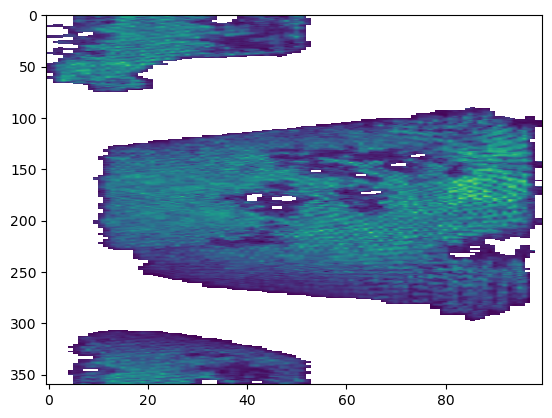

In [18]:
completeness2d_file = '/global/u2/m/mlambert/UCSC_DESI_MW/completeness_2d.fits'
hdul=fits.open(completeness2d_file)
hdul.info()


comp_ratio = hdul[0].data

hdul.close()

np.shape(comp_ratio)


plt.imshow(comp_ratio, aspect='auto')

In [19]:
raxxx = np.arange(0, 361.)
decyyy = np.arange(-20, 81.)

# convert from ICRS to galacto centric cylindrical

In [20]:
def phase_spiral_values(dist, ra, dec, pmra, pmdec, vrad, dist_min=0, dist_max=50):
    '''
    converts ra and dec coords to r,phi,z galactic coords
    inputs: 
            dist: distance object is from us in kpc
            ra: ra
            dec: dec
            pmra: ra proper motion 
            pmdec: dec proper motion
            vrad: line of sight velocity
            
            dist_min: min distance range
            dist_max: max distance range to be calulcat
    
    outputs: r,phi,z, and their respective velocities
    '''
    
    dist_index = np.where((dist<=dist_max) & (dist>dist_min))
    dist_cut = dist[dist_index]
    ra_cut = ra[dist_index]
    dec_cut = dec[dist_index]
    pmra_cut = pmra[dist_index]
    pmdec_cut = pmdec[dist_index]
    vrad_cut = vrad[dist_index]
    
    
    c= coord.ICRS(ra=ra_cut*u.deg,
              dec=dec_cut*u.deg,
                  distance=dist_cut*u.kpc,
                  pm_ra_cosdec=pmra_cut*u.mas/u.yr,
                  pm_dec=pmdec_cut*u.mas/u.yr,
                  radial_velocity=vrad_cut*u.km/u.s)
    
    # Define GC frame
    v_sun = coord.CartesianDifferential([11.1,248.5,7.25]*u.km/u.s) #Schönrich et al. 2010; Reid & Brunthaler 2020),
    gc_frame= coord.Galactocentric(galcen_distance=8.277*u.kpc, # gravity collab 2022
                                       z_sun=20.8*u.pc, # Bennett & Bovy 2019).
                                       galcen_v_sun=v_sun)
    cg= c.transform_to(gc_frame)

    cg.representation_type = 'cylindrical'
    
    r = cg.rho.to(u.kpc).value
    phi = cg.phi.degree
    z = cg.z.to(u.kpc).value
    v_r = cg.d_rho.to(u.km/u.s).value
    v_phi = (cg.d_phi*cg.rho).to(u.km/u.s,
            equivalencies=u.dimensionless_angles()).value
    v_z = cg.d_z.to(u.km/u.s).value
    
    
    return r, phi, z, v_r, v_phi, v_z


In [21]:
def err_prop(dist, ra, dec, pmra, pmdec, vrad, dist_err, ra_err, dec_err, pmra_err, pmdec_err, vrad_err):
    '''
    error propagation for cylindrical coordinated in 6D
    using Monte Carlo sampling
    '''
    size = 10000
    
    
    dMC = dist + dist_err*np.random.normal(size = N)
    
    raMC = ra + ra_err*np.random.normal(size = N)
    decMC = dec + dec_err*np.random.normal(size = N)
    
    pmraMC = pmra + pmra_err*np.random.normal(size = N)
    pmdecMC = pmdec + pmdec_err*np.random.normal(size = N)
    
    vradMC = vrad + vrad_err*np.random.normal(size = N)
    
    
    
    c= coord.ICRS(ra=raMC*u.deg,
              dec=decMC*u.deg,
                  distance=dMC*u.kpc,
                  pm_ra_cosdec=pmraMC*u.mas/u.yr,
                  pm_dec=pmdecMC*u.mas/u.yr,
                  radial_velocity=vradMC*u.km/u.s)
    
    # Define GC frame
    v_sun = coord.CartesianDifferential([11.1,248.5,7.25]*u.km/u.s) #Schönrich et al. 2010; Reid & Brunthaler 2020),
    gc_frame= coord.Galactocentric(galcen_distance=8.178*u.kpc, # gravity collab 2019
                                       z_sun=20.8*u.pc, # Bennett & Bovy 2019).
                                       galcen_v_sun=v_sun)
    cg= c.transform_to(gc_frame)

    cg.representation_type = 'cylindrical'
    
    r = cg.rho.to(u.kpc).value
    phi = cg.phi.degree
    z = cg.z.to(u.kpc).value
    v_r = cg.d_rho.to(u.km/u.s).value
    v_phi = (cg.d_phi*cg.rho).to(u.km/u.s,
            equivalencies=u.dimensionless_angles()).value
    v_z = cg.d_z.to(u.km/u.s).value
    
    
    return r, phi, z, v_r, v_phi, v_z
    
    

# Year 3 cuts

In [22]:
gmr_y3 = -2.5 * np.log10(fmap_y3['FLUX_G'] / fmap_y3['FLUX_R'])
gmr0_y3 = gmr_y3 - 1.06 * fmap_y3['EBV'] # corrected color

# special numbers to convert mag extinction to flux
fr0 = fmap_y3['FLUX_R'] * 10**(2.176 / 2.5 * fmap_y3['EBV'])
fg0 = fmap_y3['FLUX_G'] * 10**(3.237 / 2.5 * fmap_y3['EBV'])

#fibermap magnitudes
rmag_y3 = -2.5*np.log10(fr0)+22.5
gmag_y3 = -2.5*np.log10(fg0)+22.5


#duplicates_y3_y1 = np.in1d(gaiatab_y3['SOURCE_ID'].filled(1),gaiatab['SOURCE_ID'])
#duplicates_y3_y2 = np.in1d(gaiatab_y3['SOURCE_ID'].filled(1),gaiatab_y2['SOURCE_ID'])

idxp3,=np.where((rvtab_y3["SURVEY"]=='main')&
                (rvtab_y3["PROGRAM"]=='bright')&
                (rmag_y3 < 20.0) & # originally 19
                (rvtab_y3['RVS_WARN'] == 0) &
                (rvtab_y3['RR_SPECTYPE'] == 'STAR')&
                (rvtab_y3['SN_R'] > 5)&
                #(rvtab_y2['VSINI']<50)&
                (np.isnan(gmr_y3)==0)
                #(rvtab['LOGG']>4)& #for photo
                #(rvtab['SN_R']>10)&
                )
              
print(len(idxp3))

/tmp/ipykernel_408406/1772051240.py:1: RuntimeWarning: divide by zero encountered in true_divide
  gmr_y3 = -2.5 * np.log10(fmap_y3['FLUX_G'] / fmap_y3['FLUX_R'])
/tmp/ipykernel_408406/1772051240.py:1: RuntimeWarning: invalid value encountered in true_divide
  gmr_y3 = -2.5 * np.log10(fmap_y3['FLUX_G'] / fmap_y3['FLUX_R'])
/tmp/ipykernel_408406/1772051240.py:1: RuntimeWarning: divide by zero encountered in log10
  gmr_y3 = -2.5 * np.log10(fmap_y3['FLUX_G'] / fmap_y3['FLUX_R'])
/tmp/ipykernel_408406/1772051240.py:1: RuntimeWarning: invalid value encountered in log10
  gmr_y3 = -2.5 * np.log10(fmap_y3['FLUX_G'] / fmap_y3['FLUX_R'])
/tmp/ipykernel_408406/1772051240.py:9: RuntimeWarning: divide by zero encountered in log10
  rmag_y3 = -2.5*np.log10(fr0)+22.5
/tmp/ipykernel_408406/1772051240.py:9: RuntimeWarning: invalid value encountered in log10
  rmag_y3 = -2.5*np.log10(fr0)+22.5
/tmp/ipykernel_408406/1772051240.py:10: RuntimeWarning: divide by zero encountered in log10
  gmag_y3 = -2.5*

5773234


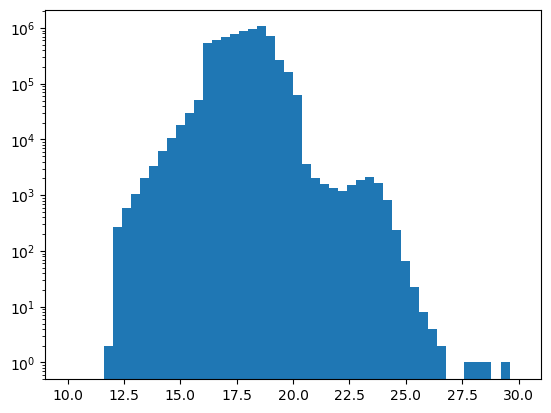

In [23]:
idxp_tester=np.where((rvtab_y3["SURVEY"]=='main')&
                (rvtab_y3["PROGRAM"]=='bright'))

plt.hist(rmag_y3[idxp_tester], range=(10, 30), bins=50)
plt.yscale('log')
plt.show()


In [24]:
ra = np.array(rvtab_y3['TARGET_RA'][idxp3])
dec = np.array(rvtab_y3['TARGET_DEC'][idxp3])
feh = np.array(rvtab_y3['FEH'][idxp3])
alphafe = np.array(rvtab_y3['ALPHAFE'][idxp3])
teff = np.array(rvtab_y3['TEFF'][idxp3])
vrad = np.array(rvtab_y3['VRAD'][idxp3]) # km/s
snr = np.array(rvtab_y3['SN_R'][idxp3])
logg = np.array(rvtab_y3['LOGG'][idxp3])

pmra = np.array(gaiatab_y3['PMRA'][idxp3]) # milli arcsec /yr
pmdec = np.array(gaiatab_y3['PMDEC'][idxp3])
parallax = np.array(gaiatab_y3["PARALLAX"][idxp3])
parallax_error = np.array(gaiatab_y3["PARALLAX_ERROR"][idxp3])


dist = (1/1000)*10**((np.array(disttab_y3['dist_mod'][idxp3]))/5 +1) # in kpc now
dist_mod = np.array(disttab_y3['dist_mod'][idxp3])

ra_err = np.array(gaiatab_y3['RA_ERROR'][idxp3])
dec_err = np.array(gaiatab_y3['DEC_ERROR'][idxp3])
vrad_err = np.array(rvtab_y3['VRAD_ERR'][idxp3]) # km/s
pmra_err = np.array(gaiatab_y3['PMRA_ERROR'][idxp3])
pmdec_err = np.array(gaiatab_y3['PMDEC_ERROR'][idxp3])
dist_err = ((np.array(disttab_y3['dist_mod_err'][idxp3])))*dist*0.461 # from wikipedia distance modulus page
dist_mod_err = np.array(disttab_y3['dist_mod_err'][idxp3])

#dist_err = (np.array(disttab_y3['dist_mod_err'][idxp3]))*dist

#DM_err = err_d/D
# so err_d = DM-err*D

# note that transforming from distance mod to distance gives a log normal distribution (no more mr nice gaussian)
# the dist mod distribution does look like a gaussian so if astropy coord transformation can use dist mod that would be nice
# other wise when doing the uncertainty propogation we need a log normal distribution for distance



gmr = gmr_y3[idxp3]
gmag = gmag_y3[idxp3]
rmag = rmag_y3[idxp3]

print(len(rmag), len(feh))

5773234 5773234


In [25]:
obj1 = SkyCoord(ra,
                dec,frame='icrs', unit=u.deg)            
obj1 = obj1.galactic

In [26]:
valid_dist = np.array(dist_valid['distance'][idxp3])


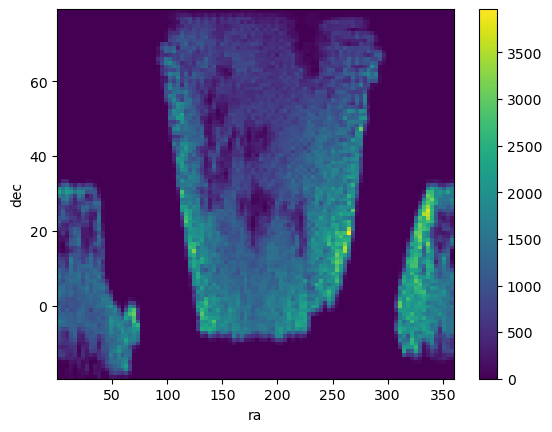

In [27]:
# ra and dec footprint
plt.hist2d(ra, dec, cmap='viridis', bins=(100,100))
plt.colorbar()
plt.xlabel('ra')
plt.ylabel('dec')
plt.show()

Text(0, 0.5, 'b')

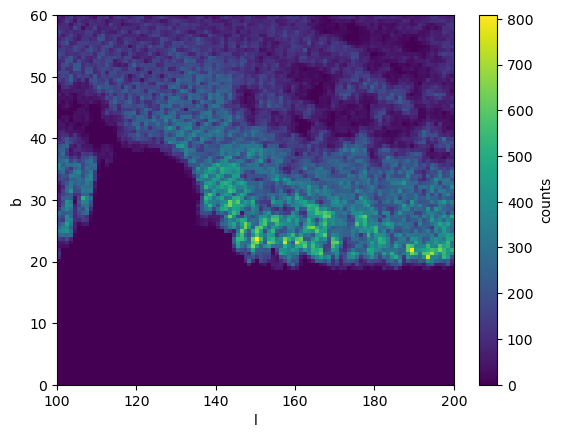

In [28]:
obj = SkyCoord(ra,
                dec,frame='icrs', unit=u.deg)            
obj = obj.galactic

plt.hist2d(obj.l.degree,
           obj.b.degree,
           bins=100, 
           #vmax = 1000,
           range = [[100, 200],[0, 60]],
           #norm = 'log',
           cmap = 'viridis')
plt.colorbar(label = 'counts')
plt.xlabel('l')
plt.ylabel('b')

In [29]:
#tesing completeness

# for a given ra and dec we should beable to pull out its completeness fraction

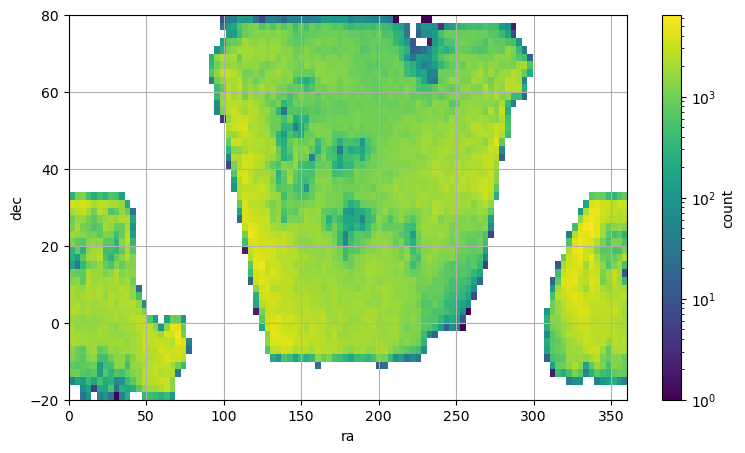

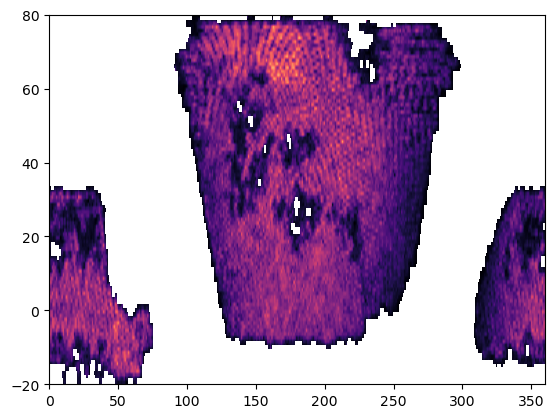

In [30]:
obj1 = SkyCoord(ra,
                dec,frame='icrs', unit=u.deg)            
obj1 = obj1.galactic


r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 30, dist_min=0)


dist_index = np.where((dist<=30) & (dist>0))
l_tot = obj1.l.degree[dist_index]
b_tot = obj1.b.degree[dist_index]
ra_cut = ra[dist_index]
dec_cut = dec[dist_index]


# only looking at outer regions
neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

ind500 = np.where((np.abs(z)<10)&
                  (phi>100)&(phi<300)&
                  (r>7)&
                  #(abs(v_z)<100)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))




bin_radec = scipy.stats.binned_statistic_2d(ra_cut[ind500],
                                           dec_cut[ind500],
                                           v_r[ind500],
                                           'count', bins=(100, 50),
                                           range = [[0, 360],[-20, 80]])



# plotting
fig, ax = plt.subplots(1,figsize=(9,5))
pcm = ax.imshow(bin_radec.statistic.T,
                origin='lower',
                #vmax=250,
                #vmin=100,
                norm='log',
                cmap = 'viridis', extent=[0, 360, -20, 80],aspect='auto')
fig.colorbar(pcm, ax=ax, location='right', label='count')
ax.grid(True)
ax.set_xlabel('ra')
ax.set_ylabel('dec')

plt.show()

plt.imshow(comp_ratio.T, origin='lower',cmap='magma',
           extent=[0, 360, -20, 80],aspect='auto')


# kiel

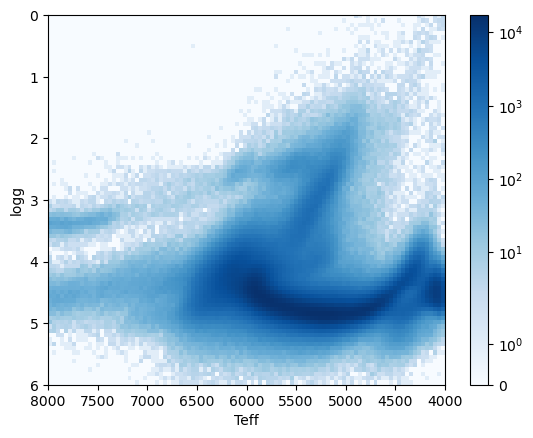

In [31]:
plt.hist2d(teff, logg, range=[[4000, 8000],[-1, 6]], bins=(100,100), norm='symlog', cmap="Blues")
#plt.hist2d(np.array(rvtab_y3['TEFF']), np.array(rvtab_y3['LOGG']), range=[[4000, 8000],[-1, 6]], bins=(100,100), norm='log', cmap="Blues")
plt.ylim(6, 0)
plt.xlim(8000, 4000)
plt.colorbar()
plt.xlabel('Teff')
plt.ylabel('logg')
plt.show()

# CMD

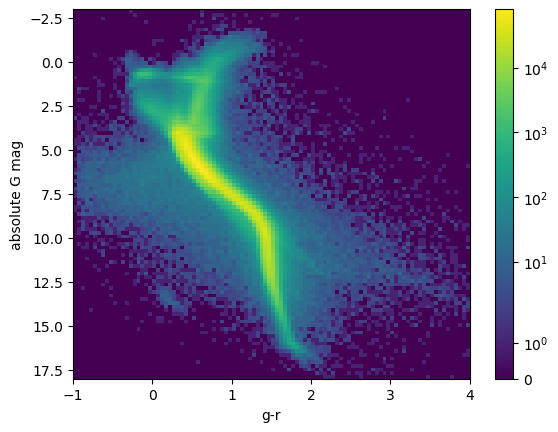

In [32]:
#abs Mag
#M = m -  5log10(d[pc] +5)
Gmag = gmag - 5*np.log10((dist*1000)) + 5
plt.hist2d(gmr, Gmag, range = [[-1, 4],[-3, 18]], bins=(100,100), norm='symlog', cmap="viridis")
#plt.hist2d(np.array(rvtab_y3['TEFF']), np.array(rvtab_y3['LOGG']), range=[[4000, 8000],[-1, 6]], bins=(100,100), norm='log', cmap="Blues")
#plt.ylim(6, 0)
#plt.xlim(8000, 4000)
plt.colorbar()
plt.xlabel('g-r')
plt.ylabel('absolute G mag')
plt.ylim(18, -3)




plt.show()

## investigating tidally induced spiral

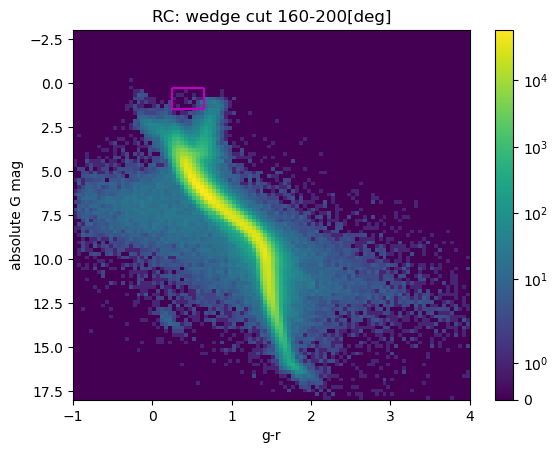

49


(1.5, 0.3)

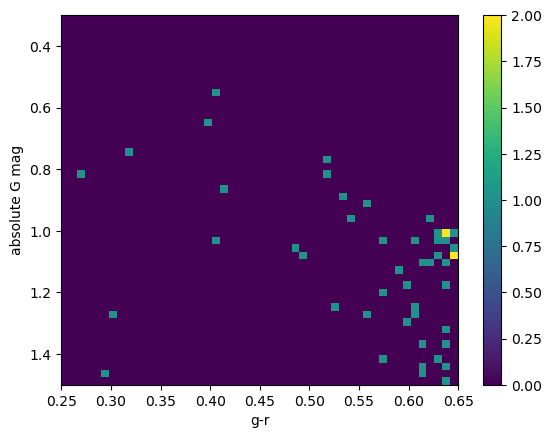

In [33]:
# CMD for our wedge cut
temp_ra = ra
temp_dec = dec
temp_dist = dist
feh_tot = feh


max_dist = 50

objall = coord.SkyCoord(ra=temp_ra[np.where(temp_dist < max_dist)] * u.degree,
                   dec=temp_dec[np.where(temp_dist < max_dist)] * u.degree,
                   distance= temp_dist[np.where(temp_dist < max_dist)] * u.kpc,
                   frame='icrs')
objall = objall.transform_to(coord.Galactocentric)


galac_x = -objall.x.value
galac_y = objall.y.value

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = max_dist, dist_min=0)


dist_index = np.where((dist<=max_dist) & (dist>0))



# only looking at outer regions
neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360


max_dist = 50
dist_index = np.where((dist<=max_dist) & (dist>0))


#abs Mag
#M = m -  5log10(d[pc] +5)
Gmag = gmag - 5*np.log10((dist*1000)) + 5
Gmag_cut = Gmag[dist_index]
gmr_cut = gmr[dist_index]


ind5 = np.where((np.abs(z)<10)&
                  (phi>160)&(phi<200)&
                  (r>7)&(r<25)&
                 (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1))
               )




plt.hist2d(gmr_cut[ind5],
           Gmag_cut[ind5],
           range = [[-1, 4],[-3, 18]], bins=(100,100), norm='symlog', cmap="viridis")
#plt.hist2d(np.array(rvtab_y3['TEFF']), np.array(rvtab_y3['LOGG']), range=[[4000, 8000],[-1, 6]], bins=(100,100), norm='log', cmap="Blues")
#plt.ylim(6, 0)
#plt.xlim(8000, 4000)
plt.colorbar()
plt.xlabel('g-r')
plt.ylabel('absolute G mag')
plt.ylim(18, -3)


plt.vlines(0.25, 0.3, 1.5, color='m')
plt.vlines(0.65, 0.3, 1.5, color='m')

plt.hlines(0.3, 0.25, 0.65, color='m')
plt.hlines(1.5, 0.25, 0.65, color='m')

plt.title('RC: wedge cut 160-200[deg]')

plt.show()




# number of stars in wedge cut
gmr_ind5_cut = gmr_cut[ind5]
Gmag_ind5_cut = Gmag_cut[ind5]
#galac_x_cut
#galac_x_cut

# we want number of stars in this box from wedge cut
rc_box_index = np.where((Gmag_ind5_cut<1.5)&(Gmag_ind5_cut>0.3)&
          (gmr_ind5_cut>.25)&(gmr_ind5_cut<0.65)
        )


print(len(rc_box_index[0]))


plt.hist2d(gmr_ind5_cut[rc_box_index], Gmag_ind5_cut[rc_box_index],
           range = [[0.25, 0.65], [0.3, 1.5]],
           bins=(50,50),
           #norm='symlog',
           cmap="viridis")

plt.colorbar()
plt.xlabel('g-r')
plt.ylabel('absolute G mag')
plt.ylim(1.5, 0.3)


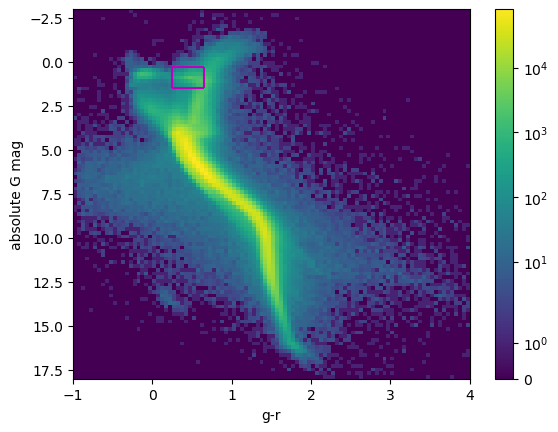

In [34]:
# Total sample
#abs Mag
#M = m -  5log10(d[pc] +5)
Gmag = gmag - 5*np.log10((dist*1000)) + 5
plt.hist2d(gmr, Gmag, range = [[-1, 4],[-3, 18]], bins=(100,100), norm='symlog', cmap="viridis")
#plt.hist2d(np.array(rvtab_y3['TEFF']), np.array(rvtab_y3['LOGG']), range=[[4000, 8000],[-1, 6]], bins=(100,100), norm='log', cmap="Blues")
#plt.ylim(6, 0)
#plt.xlim(8000, 4000)
plt.colorbar()
plt.xlabel('g-r')
plt.ylabel('absolute G mag')
plt.ylim(18, -3)


plt.vlines(0.25, 1.5, 0.3, color='m')
plt.vlines(0.65, 1.5, 0.3, color='m')

plt.hlines(0.3, 0.25, 0.65, color='m')
plt.hlines(1.5, 0.25, 0.65, color='m')




plt.show()

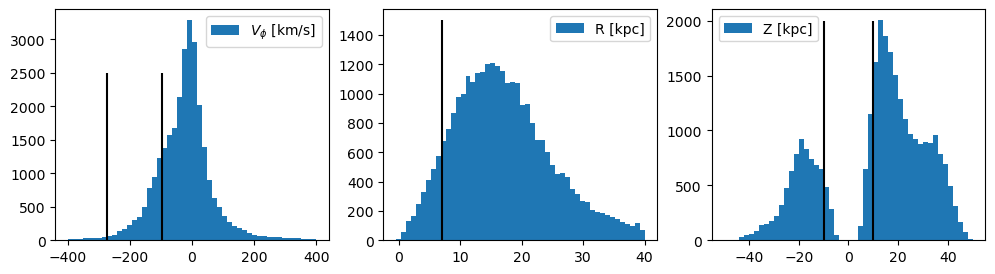

In [35]:
# red clump strs from total sample ( not wedge cut)
temp_ra = ra
temp_dec = dec
temp_dist = dist
feh_tot = feh


max_dist = 50

objall = coord.SkyCoord(ra=temp_ra[np.where(temp_dist < max_dist)] * u.degree,
                   dec=temp_dec[np.where(temp_dist < max_dist)] * u.degree,
                   distance= temp_dist[np.where(temp_dist < max_dist)] * u.kpc,
                   frame='icrs')
objall = objall.transform_to(coord.Galactocentric)


galac_x = -objall.x.value
galac_y = objall.y.value

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = max_dist, dist_min=0)


dist_index = np.where((dist<=max_dist) & (dist>0))


Gmag = gmag - 5*np.log10((dist*1000)) + 5
Gmag_cut = Gmag[dist_index]
gmr_cut = gmr[dist_index]


# only looking at outer regions
neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

nxbins = 50
nybins = 50
rangearr=[[0, 25],[-10, 10]]
binsarr = [nxbins, nybins]

ind500 = np.where((Gmag_cut<1.5)&(Gmag_cut>0.3)&
                  (gmr_cut>0.25)&(gmr_cut<0.65))


vphi_80 = np.nanpercentile(v_phi, 80)
vphi1 = np.nanpercentile(v_phi, 1)


fig, ax = plt.subplots(1,3, figsize = (12, 3))
ax[0].hist(v_phi[ind500], bins=50, range=[-400, 400], label='$V_\phi$ [km/s]')
ax[0].vlines(vphi_80, 0, 2500, 'k')
ax[0].vlines(vphi1, 0, 2500, 'k')
ax[0].legend()

ax[1].hist(r[ind500], bins=50, range=[-.5, 40], label='R [kpc]')
ax[1].vlines(7, 0, 1500, 'k')
ax[1].legend()

ax[2].hist(z[ind500], bins=50, range=[-50, 50], label='Z [kpc]')
ax[2].vlines(10, 0, 2000, 'k')
ax[2].vlines(-10, 0, 2000, 'k')
ax[2].legend()





# MSTO color cuts

In [36]:
temp_ra = ra
temp_dec = dec
temp_dist = dist
feh_tot = feh


max_dist = 50

obj1 = SkyCoord(ra,
                dec,frame='icrs', unit=u.deg)            
obj1 = obj1.galactic

objall = coord.SkyCoord(ra=temp_ra[np.where(temp_dist < max_dist)] * u.degree,
                   dec=temp_dec[np.where(temp_dist < max_dist)] * u.degree,
                   distance= temp_dist[np.where(temp_dist < max_dist)] * u.kpc,
                   frame='icrs')
objall = objall.transform_to(coord.Galactocentric)


galac_x = -objall.x.value
galac_y = objall.y.value

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = max_dist, dist_min=0)


dist_index = np.where((dist<=max_dist) & (dist>0))
Gmag = gmag - 5*np.log10((dist*1000)) + 5
Gmag_cut = Gmag[dist_index]
gmr_cut = gmr[dist_index]
feh_cut = feh_tot[dist_index]
gmag_cut = gmag[dist_index]
dist_cut = dist[dist_index]
snr_cut = snr[dist_index]


print(len(Gmag_cut), len(z))

l_cut = obj1.l.degree[dist_index]
b_cut = obj1.b.degree[dist_index]

ra_cut = ra[dist_index]
dec_cut = dec[dist_index]

# only looking at outer regions
neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

nxbins = 100
nybins = 100
rangearr=[[7, 25],[-7.5, 8]]
binsarr = [nxbins, nybins]

rline = 0.55
lline = 0.2
topline = 3.3
botline = 5.7


ind500_msto = np.where((z>0)&(z<11)&
                  #(phi>160)&(phi<200)&
                    (l_cut>140)&(l_cut<220)&#trying with l cut instead. toget around the hole in data
                  (r>8)&(r<25)&
                  #(b_tot> 35)&(b_tot < 40)&
                  (Gmag_cut<5.7)&(Gmag_cut>3.3)&
                  (gmr_cut>.2)&(gmr_cut<0.55)&
                  #(v_phi > 175)&(v_phi < 275))
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))
print(len(ind500_msto[0]))

5752505 5752505
197093


In [37]:
ind_AC40deg = np.where((z>-11)&(z<11)&
                        #(phi>160)&(phi<200)&
                       (l_cut>140)&(l_cut<220)&#trying with l cut instead. toget around the hole in data
                  (r>8)&(r<25)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))
len(ind_AC40deg[0])

1339671

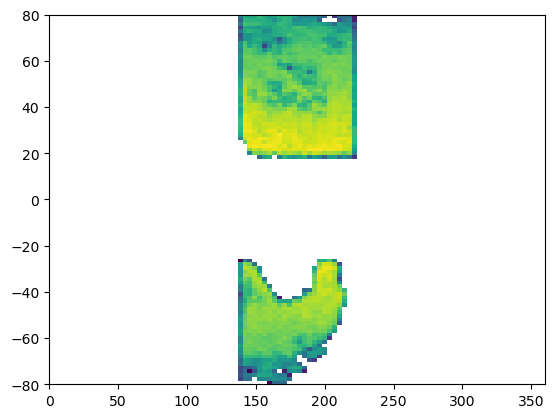

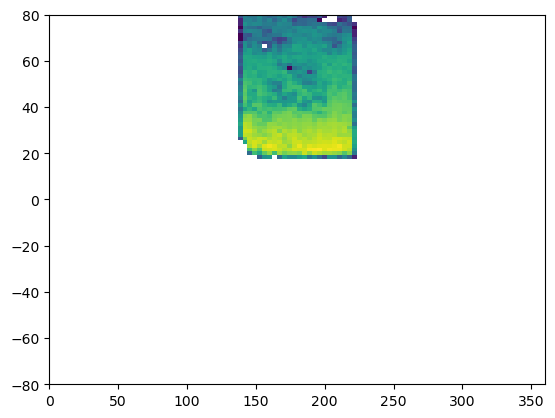

In [38]:
plt.hist2d(l_cut[ind_AC40deg], b_cut[ind_AC40deg], bins=100, range=[[0,360],[-80,80]], norm='log')
plt.show()

plt.hist2d(l_cut[ind500_msto], b_cut[ind500_msto], bins=100, range=[[0,360],[-80,80]], norm='log')
plt.show()

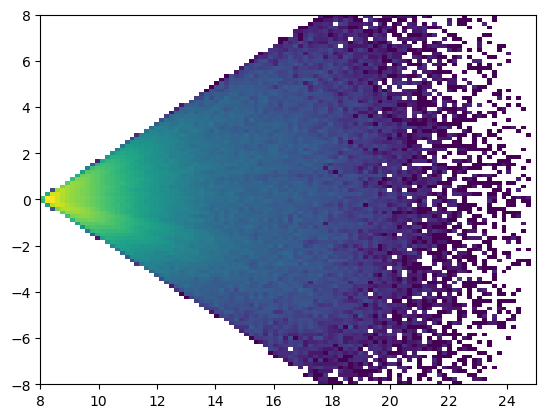

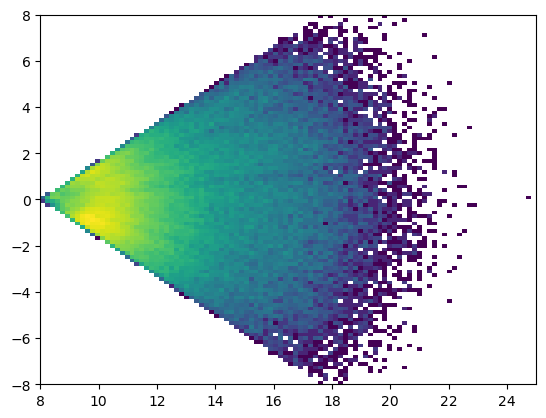

In [39]:
plt.hist2d(galac_x[ind_AC40deg], galac_y[ind_AC40deg], bins=100, range=[[8,25],[-8,8]], norm='log')
plt.show()

plt.hist2d(galac_x[ind500_msto], galac_y[ind500_msto], bins=100, range=[[8,25],[-8,8]], norm='log')
plt.show()

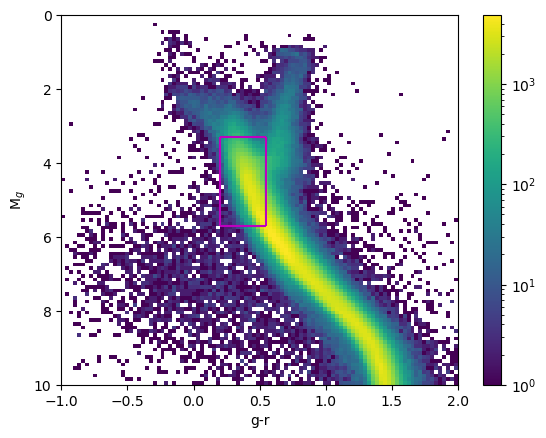

In [40]:
plt.hist2d(gmr_cut[ind_AC40deg],
           Gmag_cut[ind_AC40deg],
           range = [[-1, 2],[0, 10]], bins=(100,100),
           #vmin=30,
           norm='log',
           cmap="viridis")
#plt.hist2d(np.array(rvtab_y3['TEFF']), np.array(rvtab_y3['LOGG']), range=[[4000, 8000],[-1, 6]], bins=(100,100), norm='log', cmap="Blues")
#plt.ylim(6, 0)
#plt.xlim(8000, 4000)
plt.colorbar()
plt.xlabel('g-r')
plt.ylabel('M$_g$')
plt.ylim(10, 0)

rline = 0.55
lline = 0.2
topline = 3.3
botline = 5.7

plt.vlines(lline, topline, botline, color='m')
plt.vlines(rline, topline, botline, color='m')

plt.hlines(topline, lline, rline, color='m')
plt.hlines(botline, lline, rline, color='m')


plt.show()

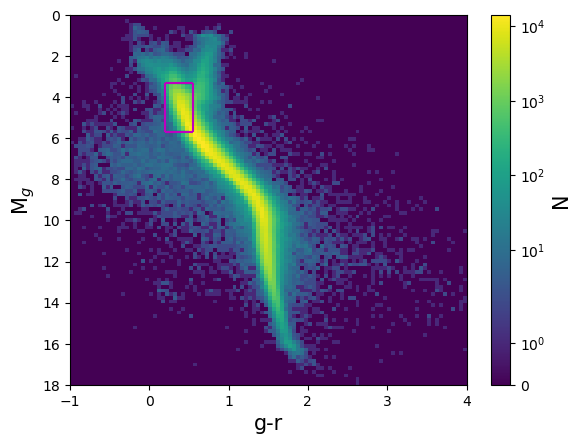

In [41]:
plt.hist2d(gmr_cut[ind_AC40deg],
           Gmag_cut[ind_AC40deg],
           range = [[-1, 4],[0, 18]], bins=(100,100), norm='symlog', cmap="viridis")
#plt.hist2d(np.array(rvtab_y3['TEFF']), np.array(rvtab_y3['LOGG']), range=[[4000, 8000],[-1, 6]], bins=(100,100), norm='log', cmap="Blues")
#plt.ylim(6, 0)
#plt.xlim(8000, 4000)
cb = plt.colorbar()
cb.set_label(label='N',size=15)
plt.xlabel('g-r', fontsize=15)
plt.ylabel('M$_g$', fontsize=15)

plt.ylim(18, 0)

rline = 0.55
lline = 0.2
topline = 3.3
botline = 5.7

plt.vlines(lline, topline, botline, color='m')
plt.vlines(rline, topline, botline, color='m')

plt.hlines(topline, lline, rline, color='m')
plt.hlines(botline, lline, rline, color='m')

#plt.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/loa_CMD_MTSO_rect_box.png', dpi=400)

plt.show()


In [42]:
# blue straggler test

ind_AC40deg_BS_test = np.where((z>-11)&(z<11)&
                        #(phi>160)&(phi<200)&
                       (l_cut>140)&(l_cut<220)&#trying with l cut instead. toget around the hole in data
                        (r>8)&(r<25)&
                        (dist_cut >5)&
                      (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))
len(ind_AC40deg_BS_test[0])

106246

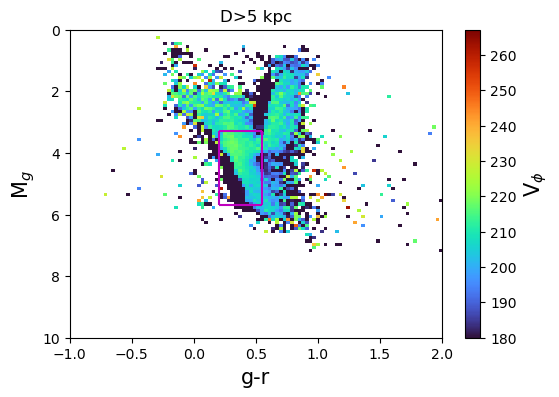

In [43]:
# blue straggler test
nxbins = 100
nybins = 100
rangearr=[[-1, 2],[0, 10]]
binsarr = [nxbins, nybins]

# plotting
fig, ax = plt.subplots(1,1, figsize=(6,4), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})
bin_CMD =scipy.stats.binned_statistic_2d(gmr_cut[ind_AC40deg_BS_test],
                                       Gmag_cut[ind_AC40deg_BS_test],
                                           -v_phi[ind_AC40deg_BS_test],
                                           'median', bins=binsarr,
                                           range = rangearr)

pcm = ax.imshow(bin_CMD.statistic.T,
                origin='lower',
                #vmax=100,
                vmin=180,
                #norm='symlog',
                cmap = 'turbo', extent=[-1, 2,0, 10],aspect='auto')
cb = fig.colorbar(pcm, ax=ax)
cb.set_label(label='V$_\phi$',size=15)
ax.set_xlabel('g-r', fontsize=15)
ax.set_ylabel('M$_g$', fontsize=15)
plt.ylim(10, 0)

rline = 0.55
lline = 0.2
topline = 3.3
botline = 5.7
plt.vlines(lline, topline, botline, color='m')
plt.vlines(rline, topline, botline, color='m')
plt.hlines(topline, lline, rline, color='m')
plt.hlines(botline, lline, rline, color='m')
plt.title('D>5 kpc')
plt.show()

# Dispersion of VR Vphi VZ

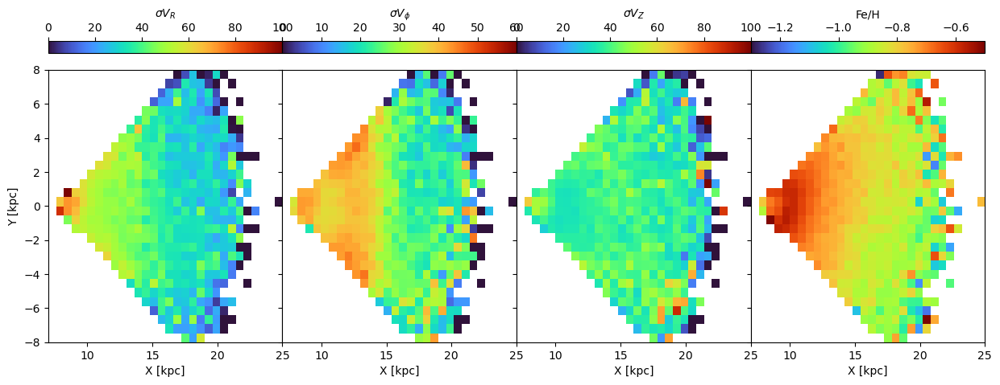

In [44]:
nxbins = 30
nybins = 30
rangearr=[[7, 25],[-8,8]]
binsarr = [nxbins, nybins]

# plotting
fig, ax = plt.subplots(1,4, figsize=(15,5.5), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})



bin_x_y =scipy.stats.binned_statistic_2d(galac_x[ind500_msto],
                                           galac_y[ind500_msto],
                                           v_r[ind500_msto],
                                           'std', bins=binsarr,
                                           range = rangearr)


pcm = ax[0].imshow(bin_x_y.statistic.T,
                origin='lower',
                vmax=100,
                #vmin=-21,
                #norm='log',
                cmap = 'turbo', extent=[7, 25,-8,8],aspect='auto')
fig.colorbar(pcm, ax=ax[0], location='top', label='$\sigma V_{R}$')
#ax[0].grid(True)
ax[0].set_xlabel('X [kpc]')
ax[0].set_ylabel('Y [kpc]')


######################################################################################
######################################################################################
######################################################################################

bin_x_y =scipy.stats.binned_statistic_2d(galac_x[ind500_msto],
                                           galac_y[ind500_msto],
                                           v_phi[ind500_msto],
                                           'std', bins=binsarr,
                                           range = rangearr)

pcm = ax[1].imshow(bin_x_y.statistic.T,
                origin='lower',
                vmax=60,
                #vmin=-21,
                #norm='log',
                cmap = 'turbo', extent=[7, 25,-8,8],aspect='auto')
fig.colorbar(pcm, ax=ax[1], location='top', label='$\sigma V_{\phi}$')
#ax[0].grid(True)
ax[1].set_xlabel('X [kpc]')
#ax[1].set_ylabel('Y [kpc]')


######################################################################################
######################################################################################
######################################################################################

bin_x_y =scipy.stats.binned_statistic_2d(galac_x[ind500_msto],
                                           galac_y[ind500_msto],
                                           v_z[ind500_msto],
                                           'std', bins=binsarr,
                                           range = rangearr)

pcm = ax[2].imshow(bin_x_y.statistic.T,
                origin='lower',
                vmax=100,
                #vmin=-21,
                #norm='log',
                cmap = 'turbo', extent=[7, 25,-8, 8],aspect='auto')
fig.colorbar(pcm, ax=ax[2], location='top', label='$\sigma V_{Z}$')
#ax[0].grid(True)
ax[2].set_xlabel('X [kpc]')
#ax[1].set_ylabel('Y [kpc]')
######################################################################################
######################################################################################
######################################################################################

bin_x_y =scipy.stats.binned_statistic_2d(galac_x[ind500_msto],
                                        galac_y[ind500_msto],
                                           feh_cut[ind500_msto],
                                           'median', bins=binsarr,
                                           range = rangearr)




pcm = ax[3].imshow(bin_x_y.statistic.T,
                origin='lower',
                vmax = -0.5,
               vmin=-1.3,
                #norm='log',
                cmap = 'turbo', extent=[7, 25,-8,8],aspect='auto')
fig.colorbar(pcm, ax=ax[3], location='top', label='Fe/H')
#ax[0].grid(True)
ax[3].set_xlabel('X [kpc]')
#ax[0].set_ylabel('Y [kpc]')


print()

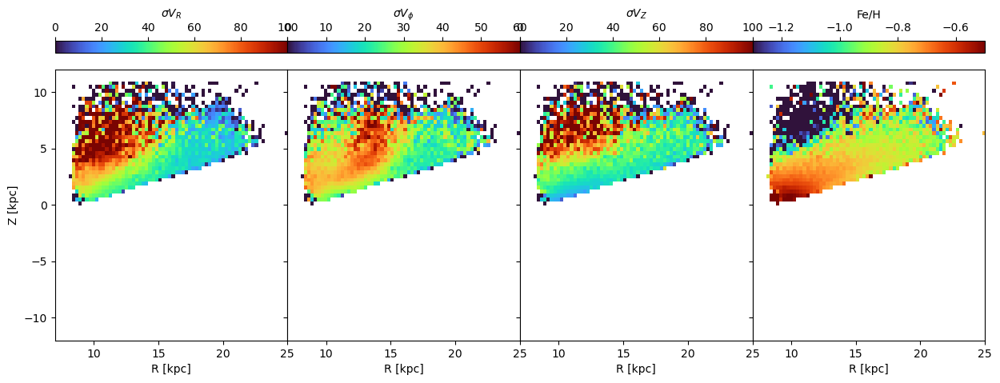

Text(0.5, 0, 'X [kpc]')

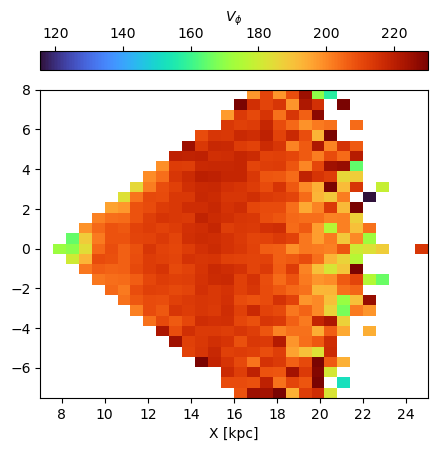

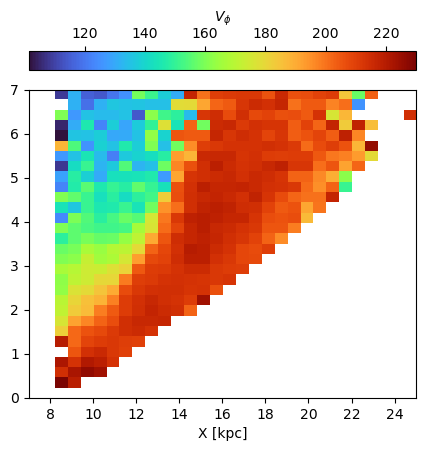

In [45]:

nxbins = 70
nybins = 70
zmin = -12
zmax = 12
rangearr=[[7, 25],[zmin,zmax]]
binsarr = [nxbins, nybins]


# plotting
fig, ax = plt.subplots(1,4, figsize=(15,5.5), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})



bin_x_y =scipy.stats.binned_statistic_2d(r[ind500_msto],
                                           z[ind500_msto],
                                           v_r[ind500_msto],
                                           'std', bins=binsarr,
                                           range = rangearr)



bounds = [-20, -10,-1, 0, 1, 10, 20]
norm = mpl.colors.BoundaryNorm(bounds, cmap.N, extend='both')


pcm = ax[0].imshow(bin_x_y.statistic.T,
                origin='lower',
                vmax=100,
                #vmin=-21,
                #norm='log',
                cmap = 'turbo', extent=[7, 25,zmin, zmax],aspect='auto')
fig.colorbar(pcm, ax=ax[0], location='top', label='$\sigma V_{R}$')
#ax[0].grid(True)
ax[0].set_xlabel('R [kpc]')
ax[0].set_ylabel('Z [kpc]')


######################################################################################
######################################################################################
######################################################################################

bin_x_y =scipy.stats.binned_statistic_2d(r[ind500_msto],
                                           z[ind500_msto],
                                           v_phi[ind500_msto],
                                           'std', bins=binsarr,
                                           range = rangearr)

pcm = ax[1].imshow(bin_x_y.statistic.T,
                origin='lower',
                vmax=60,
                #vmin=-21,
                #norm='log',
                cmap = 'turbo', extent=[7, 25,zmin, zmax],aspect='auto')
fig.colorbar(pcm, ax=ax[1], location='top', label='$\sigma V_{\phi}$')
#ax[0].grid(True)
ax[1].set_xlabel('R [kpc]')
#ax[1].set_ylabel('Y [kpc]')


######################################################################################
######################################################################################
######################################################################################

bin_x_y =scipy.stats.binned_statistic_2d(r[ind500_msto],
                                           z[ind500_msto],
                                           v_z[ind500_msto],
                                           'std', bins=binsarr,
                                           range = rangearr)

pcm = ax[2].imshow(bin_x_y.statistic.T,
                origin='lower',
                vmax=100,
                #vmin=-21,
                #norm='log',
                cmap = 'turbo', extent=[7, 25,zmin, zmax],aspect='auto')
fig.colorbar(pcm, ax=ax[2], location='top', label='$\sigma V_{Z}$')
#ax[0].grid(True)
ax[2].set_xlabel('R [kpc]')
#ax[1].set_ylabel('Y [kpc]')
######################################################################################
######################################################################################
######################################################################################

bin_x_y =scipy.stats.binned_statistic_2d(r[ind500_msto],
                                           z[ind500_msto],
                                           feh_cut[ind500_msto],
                                           'median', bins=binsarr,
                                           range = rangearr)



bounds = [-20, -10,-1, 0, 1, 10, 20]
norm = mpl.colors.BoundaryNorm(bounds, cmap.N, extend='both')


pcm = ax[3].imshow(bin_x_y.statistic.T,
                origin='lower',
                vmax = -0.5,
               vmin=-1.3,
                #norm='log',
                cmap = 'turbo', extent=[7, 25,zmin, zmax],aspect='auto')
fig.colorbar(pcm, ax=ax[3], location='top', label='Fe/H')
#ax[0].grid(True)
ax[3].set_xlabel('R [kpc]')
#ax[0].set_ylabel('Y [kpc]')

plt.show()

nxbins = 30
nybins = 30
rangearr=[[7, 25],[-7.5, 8]]
binsarr = [nxbins, nybins]



bin_x_y =scipy.stats.binned_statistic_2d(galac_x[ind500_msto],
                                           galac_y[ind500_msto],
                                           -v_phi[ind500_msto],
                                           'median', bins=binsarr,
                                           range = rangearr)


fig,ax = plt.subplots(1, figsize=(5, 5))
pcm = ax.imshow(bin_x_y.statistic.T,
                origin='lower',
                #vmax=60,
                vmax=230,
                #vmin=-21,
                #norm='log',
                cmap = 'turbo', extent=[7, 25,-7.5, 8],aspect='auto')
fig.colorbar(pcm, ax=ax, location='top', label='$V_{\phi}$')
#ax[0].grid(True)
ax.set_xlabel('X [kpc]')
#ax[1].set_ylabel('Y [kpc]')

############################################################
###########################################################
rangearr=[[7, 25],[0, 7]]
binsarr = [nxbins, nybins]

bin_x_y =scipy.stats.binned_statistic_2d(r[ind500_msto],
                                           z[ind500_msto],
                                           -v_phi[ind500_msto],
                                           'median', bins=binsarr,
                                           range = rangearr)


fig,ax = plt.subplots(1, figsize=(5, 5))
pcm = ax.imshow(bin_x_y.statistic.T,
                origin='lower',
                vmax=230,
                #vmin=-21,
                #norm='log',
                cmap = 'turbo', extent=[7, 25,0, 7],aspect='auto')
fig.colorbar(pcm, ax=ax, location='top', label='$V_{\phi}$')
#ax[0].grid(True)
ax.set_xlabel('X [kpc]')
#ax[1].set_ylabel('Y [kpc]')

# distance validation

In [46]:
dist_cut = dist[dist_index]
valid_dist_cut = valid_dist[dist_index]

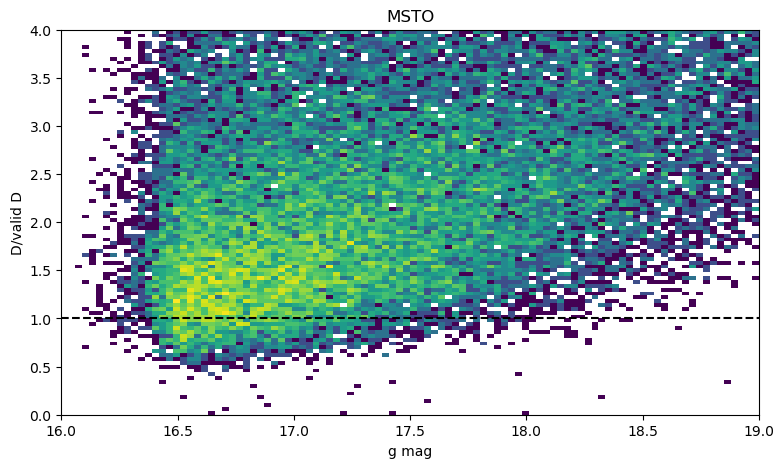

In [47]:
ratio_valid = dist_cut[ind500_msto]/valid_dist_cut[ind500_msto]

fig, ax = plt.subplots(1,figsize=(9,5))
ax.hist2d(gmag_cut[ind500_msto], ratio_valid, bins=100, range=[[16,19],[0, 4]],
          norm='log')
plt.hlines(1, 16, 19, 'k', linestyle='--')
plt.ylabel('D/valid D')
plt.xlabel('g mag')
plt.title('MSTO')
#plt.colorbar()
plt.show()

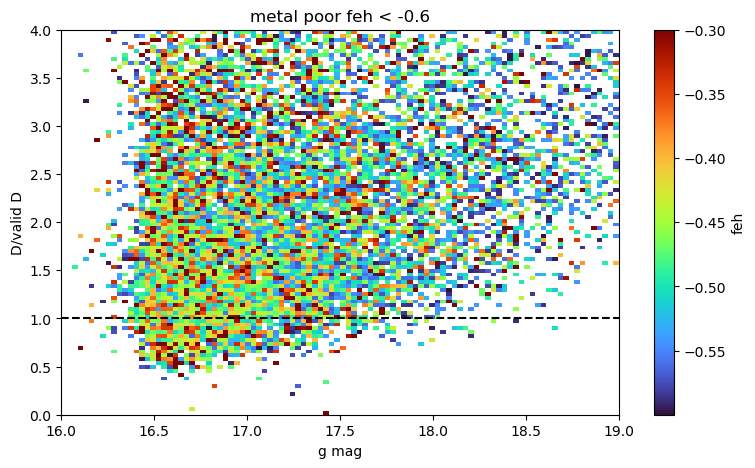

In [48]:
gmag_cut_msto = gmag_cut[ind500_msto]
feh_cut_msto = feh_cut[ind500_msto]
ratio_valid = dist_cut[ind500_msto]/valid_dist_cut[ind500_msto]
ratio_valid_msto = ratio_valid


poor_lil_feh = np.where(feh_cut_msto > -0.6)

bin_gmag_ratio = scipy.stats.binned_statistic_2d(gmag_cut_msto[poor_lil_feh],
                                               ratio_valid_msto[poor_lil_feh],
                                           feh_cut_msto[poor_lil_feh],
                                           'median', bins=(100, 100),
                                           range = [[16,19],[0, 4]])



# plotting
fig, ax = plt.subplots(1,figsize=(9,5))
pcm = ax.imshow(bin_gmag_ratio.statistic.T,
                origin='lower',
                vmax=-0.3,
                #vmin=-.9,
                #norm='log',
                cmap = 'turbo', extent=[16,19,0, 4],aspect='auto')
fig.colorbar(pcm, ax=ax, location='right', label='feh')
ax.set_xlabel('g mag')
ax.set_ylabel('D/valid D')
ax.hlines(1, 16, 19, 'k', linestyle='--')

plt.title('metal poor feh < -0.6')
plt.show()

# metal poor stars



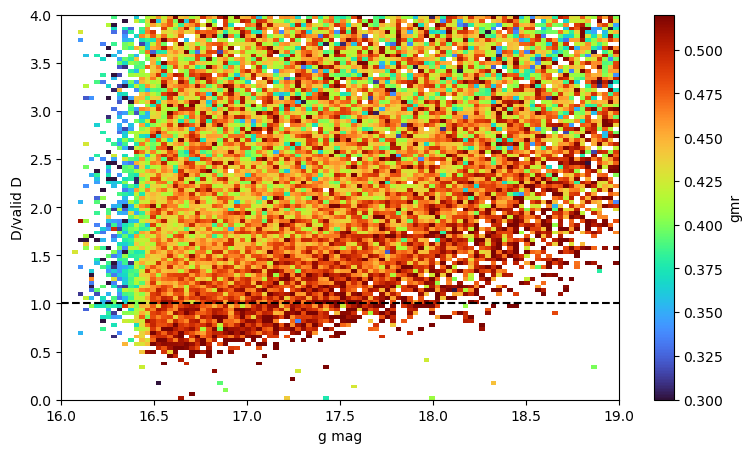

In [49]:
ratio_valid = dist_cut[ind500_msto]/valid_dist_cut[ind500_msto]


bin_gmag_ratio = scipy.stats.binned_statistic_2d(gmag_cut[ind500_msto],
                                           ratio_valid,
                                           gmr_cut[ind500_msto],
                                           'median', bins=(100, 100),
                                           range = [[16,19],[0, 4]])



# plotting
fig, ax = plt.subplots(1,figsize=(9,5))
pcm = ax.imshow(bin_gmag_ratio.statistic.T,
                origin='lower',
                vmax=0.52,
                vmin=0.3,
                #norm='log',
                cmap = 'turbo', extent=[16,19,0, 4],aspect='auto')
fig.colorbar(pcm, ax=ax, location='right', label='gmr')
ax.set_xlabel('g mag')
ax.set_ylabel('D/valid D')
ax.hlines(1, 16, 19, 'k', linestyle='--')

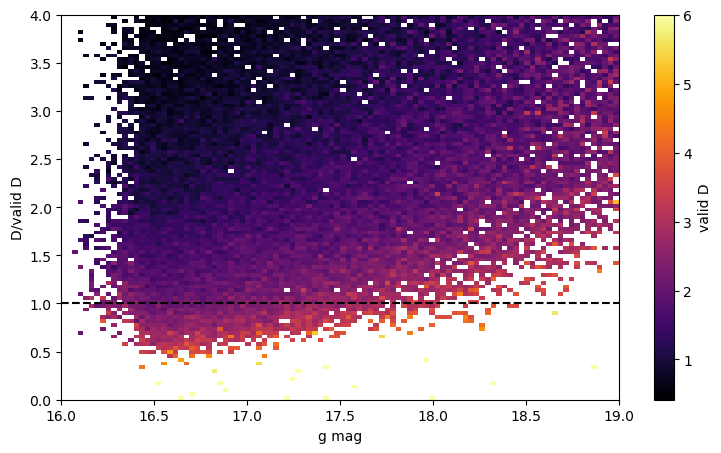

In [50]:
ratio_valid = dist_cut[ind500_msto]/valid_dist_cut[ind500_msto]


bin_gmag_ratio = scipy.stats.binned_statistic_2d(gmag_cut[ind500_msto],
                                           ratio_valid,
                                           valid_dist_cut[ind500_msto],
                                           'median', bins=(100, 100),
                                           range = [[16,19],[0, 4]])



# plotting
fig, ax = plt.subplots(1,figsize=(9,5))
pcm = ax.imshow(bin_gmag_ratio.statistic.T,
                origin='lower',
                vmax=6,
                #vmin=-0.5,
                #norm='log',
                cmap = 'inferno', extent=[16,19,0, 4],aspect='auto')
fig.colorbar(pcm, ax=ax, location='right', label='valid D')
ax.set_xlabel('g mag')
ax.set_ylabel('D/valid D')
ax.hlines(1, 16, 19, 'k', linestyle='--')

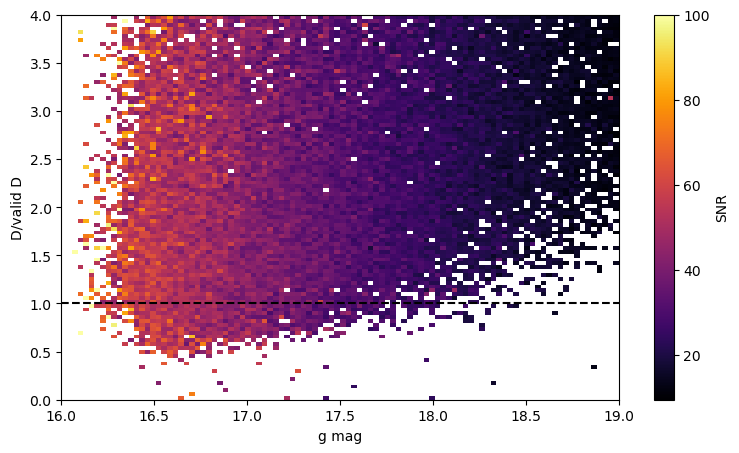

In [51]:
ratio_valid = dist_cut[ind500_msto]/valid_dist_cut[ind500_msto]


bin_gmag_ratio = scipy.stats.binned_statistic_2d(gmag_cut[ind500_msto],
                                           ratio_valid,
                                           snr_cut[ind500_msto],
                                           'median', bins=(100, 100),
                                           range = [[16,19],[0, 4]])



# plotting
fig, ax = plt.subplots(1,figsize=(9,5))
pcm = ax.imshow(bin_gmag_ratio.statistic.T,
                origin='lower',
                vmax=100,
                #vmin=-0.5,
                #norm='log',
                cmap = 'inferno', extent=[16,19,0, 4],aspect='auto')
fig.colorbar(pcm, ax=ax, location='right', label='SNR')
ax.set_xlabel('g mag')
ax.set_ylabel('D/valid D')
ax.hlines(1, 16, 19, 'k', linestyle='--')

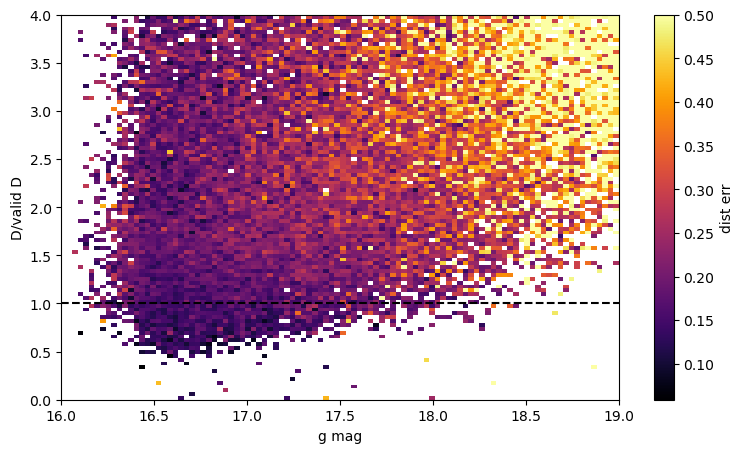

In [52]:
ratio_valid = dist_cut[ind500_msto]/valid_dist_cut[ind500_msto]
dist_err_cut = dist_err[dist_index]

bin_gmag_ratio = scipy.stats.binned_statistic_2d(gmag_cut[ind500_msto],
                                           ratio_valid,
                                           dist_err_cut[ind500_msto],
                                           'median', bins=(100, 100),
                                           range = [[16,19],[0, 4]])



# plotting
fig, ax = plt.subplots(1,figsize=(9,5))
pcm = ax.imshow(bin_gmag_ratio.statistic.T,
                origin='lower',
                vmax=0.5,
                #vmin=-0.5,
                #norm='log',
                cmap = 'inferno', extent=[16,19,0, 4],aspect='auto')
fig.colorbar(pcm, ax=ax, location='right', label='dist err')
ax.set_xlabel('g mag')
ax.set_ylabel('D/valid D')
ax.hlines(1, 16, 19, 'k', linestyle='--')

Text(0.5, 1.0, '198417')

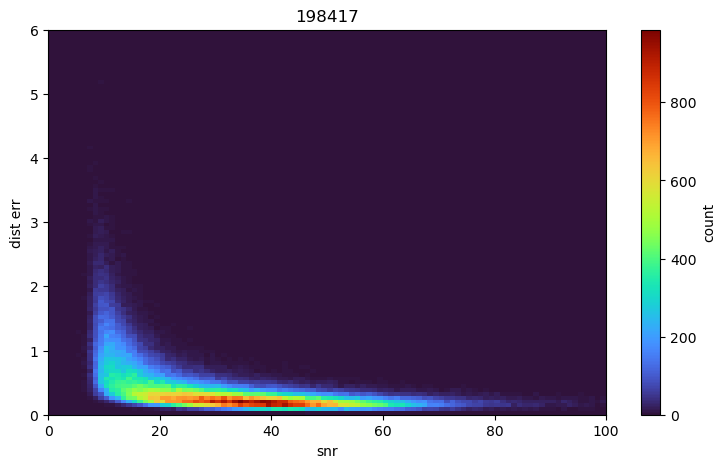

In [53]:
ratio_valid = dist_cut[ind500_msto]/valid_dist_cut[ind500_msto]
dist_err_cut = dist_err[dist_index]

bin_gmag_ratio = scipy.stats.binned_statistic_2d(snr_cut[ind500_msto],
                                           dist_err_cut[ind500_msto],
                                                 dist_err_cut[ind500_msto],
                                           'count', bins=(100, 100),
                                           range = [[0,100],[0, 6]])



# plotting
fig, ax = plt.subplots(1,figsize=(9,5))
pcm = ax.imshow(bin_gmag_ratio.statistic.T,
                origin='lower',
                #vmax=0.4,
                #vmin=-0.5,
                #norm='log',
                cmap = 'turbo', extent=[0,100,0,6],aspect='auto')
fig.colorbar(pcm, ax=ax, location='right', label='count')
ax.set_xlabel('snr')
ax.set_ylabel('dist err')
ax.set_title('198417')
#ax.hlines(1, 16, 19, 'k', linestyle='--')

In [54]:
print(len(np.where(np.isnan(ratio_valid)==True)[0]))

len(ratio_valid), len(dist_err_cut[ind500_msto])

140692


(197093, 197093)

Text(0.5, 1.0, '149593')

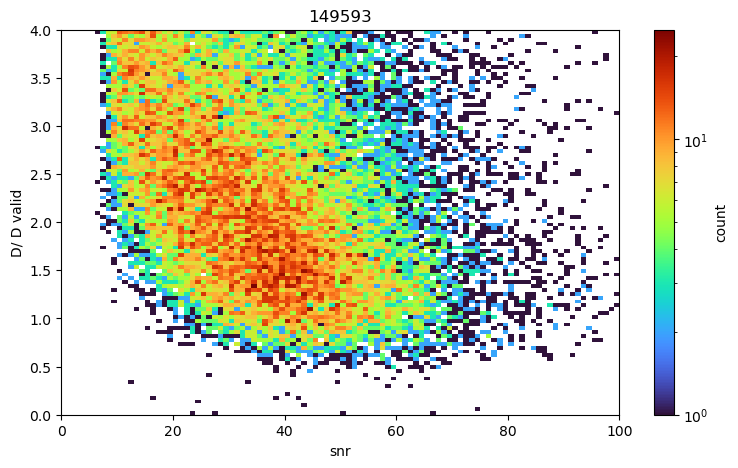

In [55]:
ratio_valid = dist_cut[ind500_msto]/valid_dist_cut[ind500_msto]
dist_err_cut = dist_err[dist_index]

bin_gmag_ratio = scipy.stats.binned_statistic_2d(snr_cut[ind500_msto],
                                               ratio_valid,
                                                 dist_err_cut[ind500_msto],
                                           'count', bins=(100, 100),
                                           range = [[0,100],[0, 4]])



# plotting
fig, ax = plt.subplots(1,figsize=(9,5))
pcm = ax.imshow(bin_gmag_ratio.statistic.T,
                origin='lower',
                #vmax=0.4,
                #vmin=-0.5,
                norm='log',
                cmap = 'turbo', extent=[0,100,0,4],aspect='auto')
fig.colorbar(pcm, ax=ax, location='right', label='count')
ax.set_xlabel('snr')
ax.set_ylabel('D/ D valid')
ax.set_title('149593')
#ax.hlines(1, 16, 19, 'k', linestyle='--')

# XY

Text(0, 0.5, 'Y [kpc]')

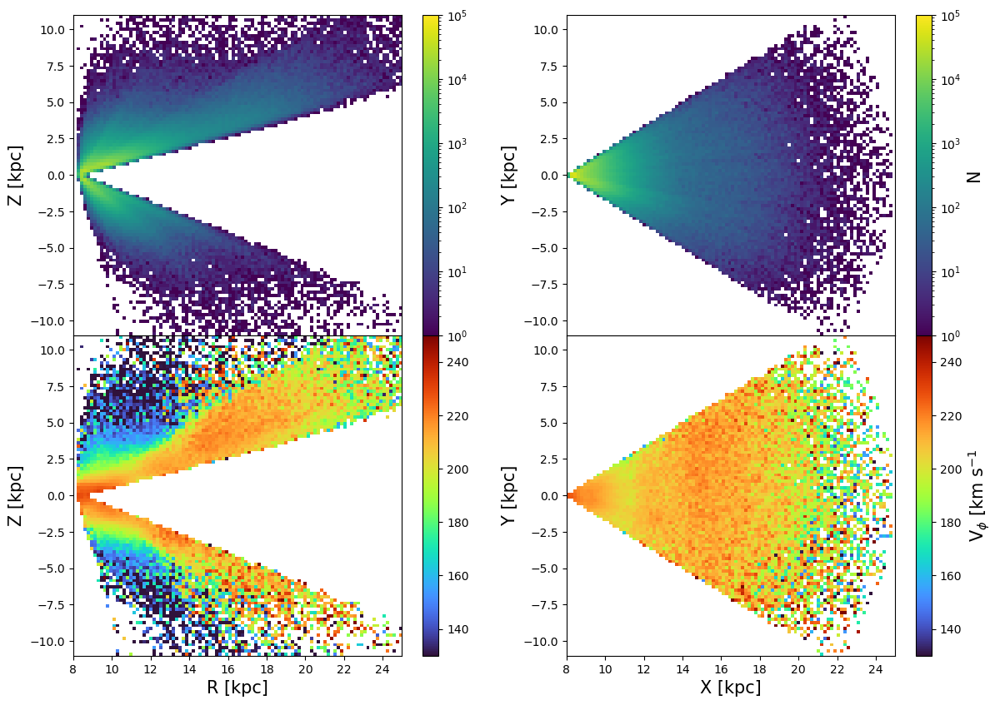

In [56]:
rangearr = [[8,25],[-11,11]]
fig, ax = plt.subplots(2,2,figsize=(14,10), 
                       sharex=True,
                       #sharey=True,
                       gridspec_kw={'hspace': 0, 'wspace': 0.2})


bin_xy = scipy.stats.binned_statistic_2d(r[ind_AC40deg],
                                           z[ind_AC40deg],
                                           -v_phi[ind_AC40deg],
                                           'count', bins=(100, 100),
                                           range = rangearr)



# plotting

pcm = ax[0,0].imshow(bin_xy.statistic.T,
                origin='lower',
                vmax=10**5,
                #vmin=100,
                norm='log',
                #vmax = 0.8,
                cmap = 'viridis', extent=[8, 25,-11,11],aspect='auto')
fig.colorbar(pcm, ax=ax[0,0], location='right')


#################################################################


bin_xy = scipy.stats.binned_statistic_2d(r[ind_AC40deg],
                                           z[ind_AC40deg],
                                           -v_phi[ind_AC40deg],
                                           'median', bins=(100, 100),
                                           range = rangearr)



# plotting

pcm = ax[1,0].imshow(bin_xy.statistic.T,
                origin='lower',
                vmax=250,
                vmin=130,
                #norm='log',
                #vmax = 0.8,
                cmap = 'turbo', extent=[8, 25,-11,11],aspect='auto')

cb = fig.colorbar(pcm, ax=ax[1,0], location='right')
#cb.set_label(label='V$_\phi$ [km s$^{-1}$',size=15)

ax[1, 0].set_xlabel('R [kpc]', fontsize=15)

ax[0, 0].set_ylabel('Z [kpc]', fontsize=15)
ax[1, 0].set_ylabel('Z [kpc]', fontsize=15)



######################################################################
#################################################################
#################################################################


bin_xy = scipy.stats.binned_statistic_2d(galac_x[ind_AC40deg],
                                           galac_y[ind_AC40deg],
                                           -v_phi[ind_AC40deg],
                                           'count', bins=(100, 100),
                                           range = rangearr)



# plotting

pcm = ax[0,1].imshow(bin_xy.statistic.T,
                origin='lower',
                vmax=10**5,
                #vmin=100,
                norm='log',
                #vmax = 0.8,
                cmap = 'viridis', extent=[8, 25,-11,11],aspect='auto')

cb = fig.colorbar(pcm, ax=ax[0,1], location='right')
cb.set_label(label='N',size=15)


#################################################################


bin_xy = scipy.stats.binned_statistic_2d(galac_x[ind_AC40deg],
                                           galac_y[ind_AC40deg],
                                           -v_phi[ind_AC40deg],
                                           'median', bins=(100, 100),
                                           range = rangearr)



# plotting

pcm = ax[1,1].imshow(bin_xy.statistic.T,
                origin='lower',
                vmax=250,
                vmin=130,
                #norm='log',
                #vmax = 0.8,
                cmap = 'turbo', extent=[8, 25,-11,11],aspect='auto')

cb = fig.colorbar(pcm, ax=ax[1,1], location='right')
cb.set_label(label='V$_\phi$ [km s$^{-1}$',size=15)
ax[1, 1].set_xlabel('X [kpc]', fontsize=15)

ax[0, 1].set_ylabel('Y [kpc]', fontsize=15)
ax[1, 1].set_ylabel('Y [kpc]', fontsize=15)



#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/loa_R_Z_Vphi_XY_plot1.png', dpi=400)



## MSTO

Text(0, 0.5, 'Y [kpc]')

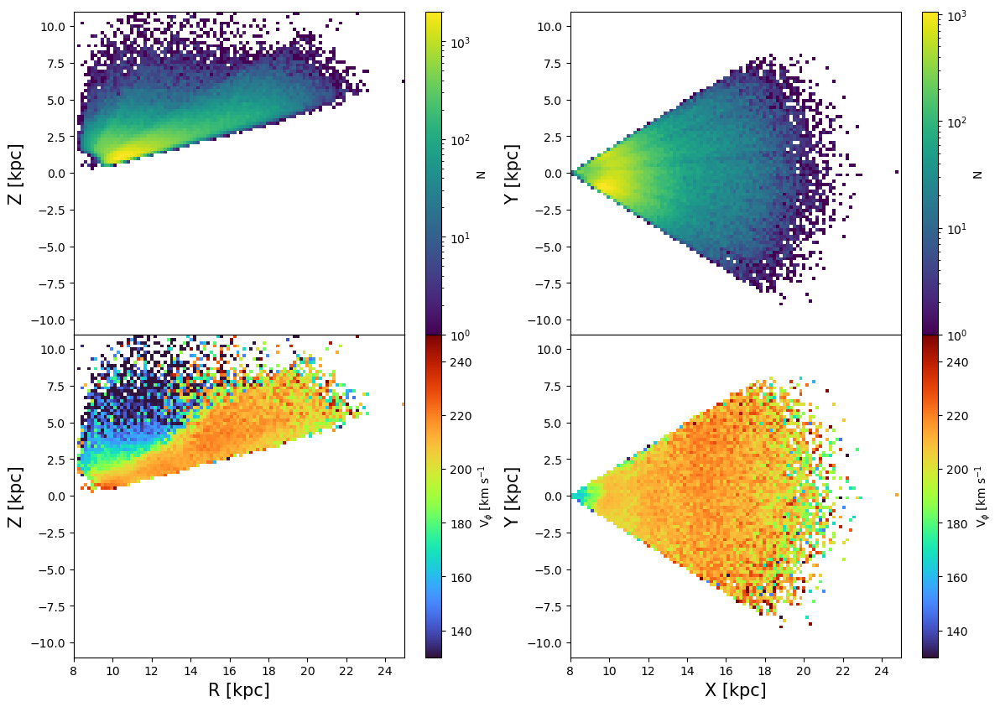

In [57]:
rangearr = [[8,25],[-11,11]]
fig, ax = plt.subplots(2,2,figsize=(14,10), 
                       sharex=True,
                       #sharey=True,
                       gridspec_kw={'hspace': 0, 'wspace': 0.2})


bin_xy = scipy.stats.binned_statistic_2d(r[ind500_msto],
                                           z[ind500_msto],
                                           -v_phi[ind500_msto],
                                           'count', bins=(100, 100),
                                           range = rangearr)



# plotting

pcm = ax[0,0].imshow(bin_xy.statistic.T,
                origin='lower',
                #vmax=10**5,
                #vmin=100,
                norm='log',
                #vmax = 0.8,
                cmap = 'viridis', extent=[8, 25,-11,11],aspect='auto')
fig.colorbar(pcm, ax=ax[0,0], location='right', label='N')


#################################################################


bin_xy = scipy.stats.binned_statistic_2d(r[ind500_msto],
                                           z[ind500_msto],
                                           -v_phi[ind500_msto],
                                           'median', bins=(100, 100),
                                           range = rangearr)



# plotting

pcm = ax[1,0].imshow(bin_xy.statistic.T,
                origin='lower',
                vmax=250,
                vmin=130,
                #norm='log',
                #vmax = 0.8,
                cmap = 'turbo', extent=[8, 25,-11,11],aspect='auto')
fig.colorbar(pcm, ax=ax[1,0], location='right', label='V$_\phi$ [km s$^{-1}$')
ax[1, 0].set_xlabel('R [kpc]', fontsize=15)

ax[0, 0].set_ylabel('Z [kpc]', fontsize=15)
ax[1, 0].set_ylabel('Z [kpc]', fontsize=15)



######################################################################
#################################################################
#################################################################


bin_xy = scipy.stats.binned_statistic_2d(galac_x[ind500_msto],
                                           galac_y[ind500_msto],
                                           -v_phi[ind500_msto],
                                           'count', bins=(100, 100),
                                           range = rangearr)



# plotting

pcm = ax[0,1].imshow(bin_xy.statistic.T,
                origin='lower',
                #vmax=10**5,
                #vmin=100,
                norm='log',
                #vmax = 0.8,
                cmap = 'viridis', extent=[8, 25,-11,11],aspect='auto')
fig.colorbar(pcm, ax=ax[0,1], location='right', label='N')


#################################################################


bin_xy = scipy.stats.binned_statistic_2d(galac_x[ind500_msto],
                                           galac_y[ind500_msto],
                                           -v_phi[ind500_msto],
                                           'median', bins=(100, 100),
                                           range = rangearr)



# plotting

pcm = ax[1,1].imshow(bin_xy.statistic.T,
                origin='lower',
                vmax=250,
                vmin=130,
                #norm='log',
                #vmax = 0.8,
                cmap = 'turbo', extent=[8, 25,-11,11],aspect='auto')
fig.colorbar(pcm, ax=ax[1,1], location='right', label='V$_\phi$ [km s$^{-1}$')
ax[1, 1].set_xlabel('X [kpc]', fontsize=15)

ax[0, 1].set_ylabel('Y [kpc]', fontsize=15)
ax[1, 1].set_ylabel('Y [kpc]', fontsize=15)




#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/R_Z_Vphi_XY_plot.png', dpi=400)

Text(0, 0.5, 'Y [kpc]')

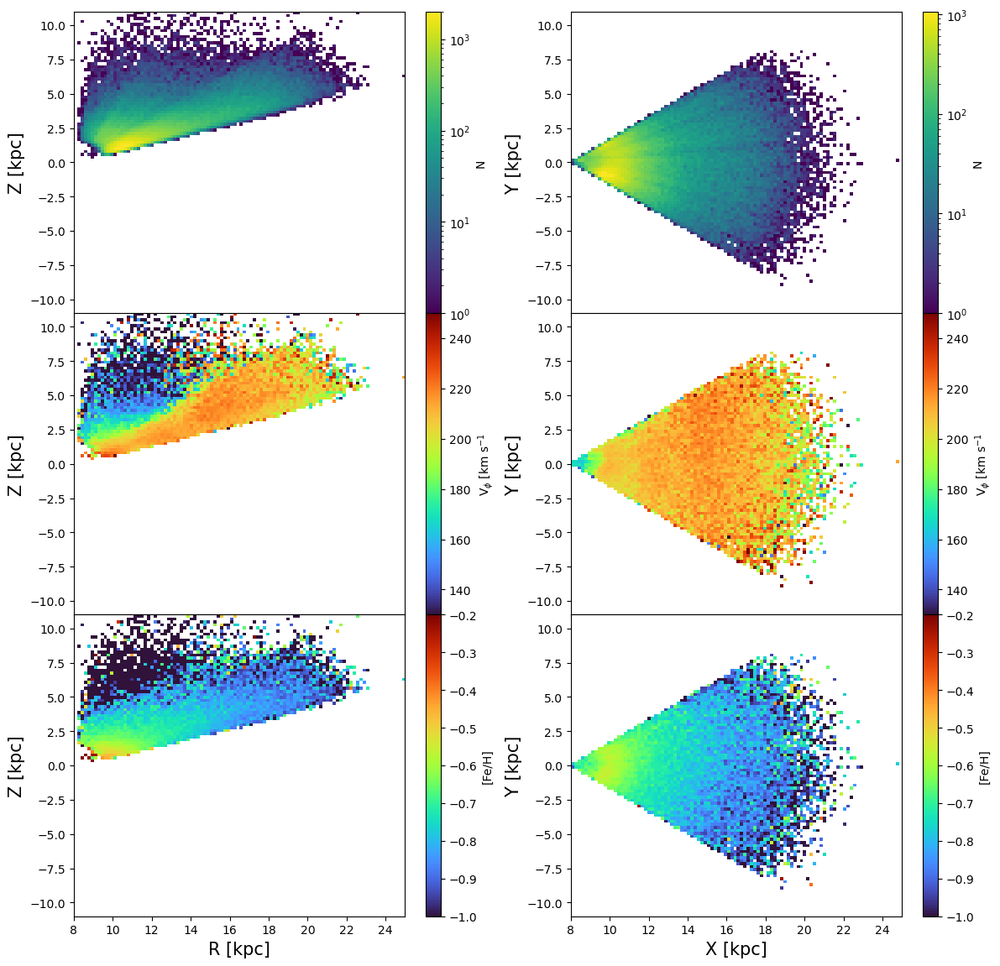

In [193]:
rangearr = [[8,25],[-11,11]]
fig, ax = plt.subplots(3,2,figsize=(14,14), 
                       sharex=True,
                       #sharey=True,
                       gridspec_kw={'hspace': 0, 'wspace': 0.2})


bin_xy = scipy.stats.binned_statistic_2d(r[ind500_msto],
                                           z[ind500_msto],
                                           -v_phi[ind500_msto],
                                           'count', bins=(100, 100),
                                           range = rangearr)



# plotting

pcm = ax[0,0].imshow(bin_xy.statistic.T,
                origin='lower',
                #vmax=10**5,
                #vmin=100,
                norm='log',
                #vmax = 0.8,
                cmap = 'viridis', extent=[8, 25,-11,11],aspect='auto')
fig.colorbar(pcm, ax=ax[0,0], location='right', label='N')


#################################################################

bin_xy = scipy.stats.binned_statistic_2d(r[ind500_msto],
                                           z[ind500_msto],
                                           -v_phi[ind500_msto],
                                           'median', bins=(100, 100),
                                           range = rangearr)



# plotting

pcm = ax[1,0].imshow(bin_xy.statistic.T,
                origin='lower',
                vmax=250,
                vmin=130,
                #norm='log',
                #vmax = 0.8,
                cmap = 'turbo', extent=[8, 25,-11,11],aspect='auto')
fig.colorbar(pcm, ax=ax[1,0], location='right', label='V$_\phi$ [km s$^{-1}$')
ax[1, 0].set_xlabel('R [kpc]', fontsize=15)

ax[0, 0].set_ylabel('Z [kpc]', fontsize=15)
ax[1, 0].set_ylabel('Z [kpc]', fontsize=15)


#################################################################

bin_xy = scipy.stats.binned_statistic_2d(r[ind500_msto],
                                           z[ind500_msto],
                                           feh_cut[ind500_msto],
                                           'median', bins=(100, 100),
                                           range = rangearr)



# plotting

pcm = ax[2,0].imshow(bin_xy.statistic.T,
                origin='lower',
                vmax=-0.2,
                vmin=-1.,
                #norm='log',
                #vmax = 0.8,
                cmap = 'turbo', extent=[8, 25,-11,11],aspect='auto')
fig.colorbar(pcm, ax=ax[2,0], location='right', label='[Fe/H]')
ax[2, 0].set_xlabel('R [kpc]', fontsize=15)

ax[0, 0].set_ylabel('Z [kpc]', fontsize=15)
ax[2, 0].set_ylabel('Z [kpc]', fontsize=15)



######################################################################
#################################################################
#################################################################


bin_xy = scipy.stats.binned_statistic_2d(galac_x[ind500_msto],
                                           galac_y[ind500_msto],
                                           -v_phi[ind500_msto],
                                           'count', bins=(100, 100),
                                           range = rangearr)



# plotting

pcm = ax[0,1].imshow(bin_xy.statistic.T,
                origin='lower',
                #vmax=10**5,
                #vmin=100,
                norm='log',
                #vmax = 0.8,
                cmap = 'viridis', extent=[8, 25,-11,11],aspect='auto')
fig.colorbar(pcm, ax=ax[0,1], location='right', label='N')


#################################################################


bin_xy = scipy.stats.binned_statistic_2d(galac_x[ind500_msto],
                                           galac_y[ind500_msto],
                                           -v_phi[ind500_msto],
                                           'median', bins=(100, 100),
                                           range = rangearr)



# plotting

pcm = ax[1,1].imshow(bin_xy.statistic.T,
                origin='lower',
                vmax=250,
                vmin=130,
                #norm='log',
                #vmax = 0.8,
                cmap = 'turbo', extent=[8, 25,-11,11],aspect='auto')
fig.colorbar(pcm, ax=ax[1,1], location='right', label='V$_\phi$ [km s$^{-1}$')
ax[1, 1].set_xlabel('X [kpc]', fontsize=15)

ax[0, 1].set_ylabel('Y [kpc]', fontsize=15)
ax[1, 1].set_ylabel('Y [kpc]', fontsize=15)

#################################################################


bin_xy = scipy.stats.binned_statistic_2d(galac_x[ind500_msto],
                                           galac_y[ind500_msto],
                                            feh_cut[ind500_msto],
                                           'median', bins=(100, 100),
                                           range = rangearr)



# plotting

pcm = ax[2,1].imshow(bin_xy.statistic.T,
                origin='lower',
                vmax=-0.2,
                vmin=-1.,
                #norm='log',
                #vmax = 0.8,
                cmap = 'turbo', extent=[8, 25,-11,11],aspect='auto')
fig.colorbar(pcm, ax=ax[2,1], location='right', label='[Fe/H]')
ax[2,1].set_xlabel('X [kpc]', fontsize=15)

ax[0, 1].set_ylabel('Y [kpc]', fontsize=15)
ax[2,1].set_ylabel('Y [kpc]', fontsize=15)




#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/R_Z_Vphi_XY_plot.png', dpi=400)

# completeness

In [58]:
# for element in ind500
#lets say its the first element
completeness_arr = np.empty(len(ind500_msto[0]))
completeness_arr[:] = np.nan

for i in range(len(ra_cut[ind500_msto])): #will take about 10 minutes for 200,000 stars
    #print(ra_cut[ind500][i])
   # print(dec_cut[ind500][i])
    
    ra_index = int(np.where(np.floor(ra_cut[ind500_msto][i]) == raxxx)[0][0])
    dec_index = int(np.where(np.floor(dec_cut[ind500_msto][i]) == decyyy)[0][0]) # should always be one element
    
    #print((ra_index), dec_index)
    completeness = comp_ratio[ra_index][dec_index]
    #print(completeness)
    completeness_arr[i] = completeness

(array([ 7969., 37231., 61308., 51042., 27067.,  9740.,  2263.,   362.,
          111.,     0.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <BarContainer object of 10 artists>)

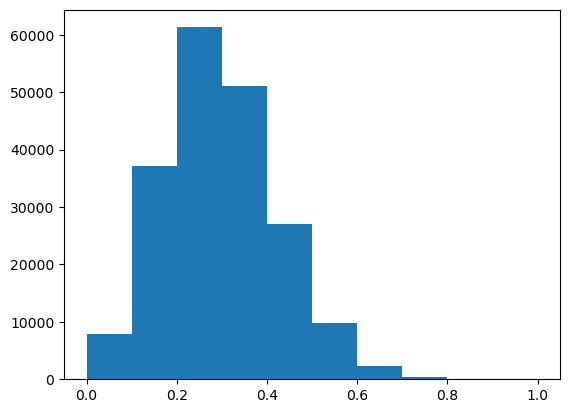

In [59]:
plt.hist(completeness_arr, range=(0, 1))

Text(0, 0.5, 'dec')

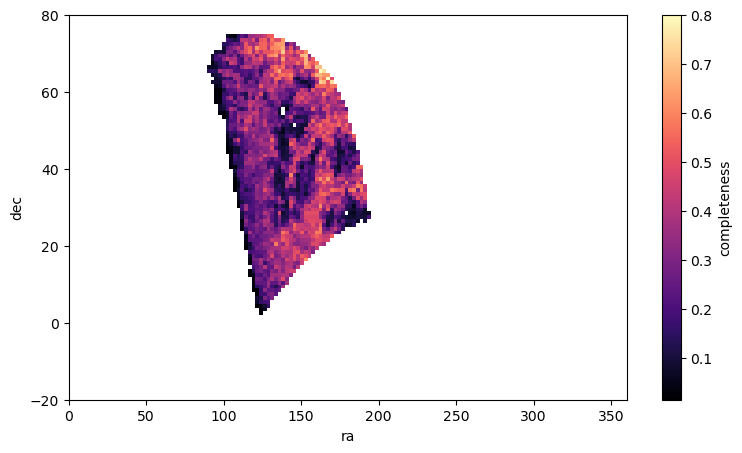

In [60]:
rangearr = [[0, 360],[-20, 80]]

bin_xy = scipy.stats.binned_statistic_2d(ra_cut[ind500_msto],
                                           dec_cut[ind500_msto],
                                           completeness_arr,
                                           'median', bins=(150, 100),
                                           range = rangearr)



# plotting
fig, ax = plt.subplots(1,figsize=(9,5))
pcm = ax.imshow(bin_xy.statistic.T,
                origin='lower',
                #vmax=250,
                #vmin=100,
                #norm='log',
                vmax = 0.8,
                cmap = 'magma', extent=[0, 360, -20, 80],aspect='auto')
fig.colorbar(pcm, ax=ax, location='right', label='completeness')
#ax.grid(True)
ax.set_xlabel('ra')
ax.set_ylabel('dec')

Text(0, 0.5, 'b')

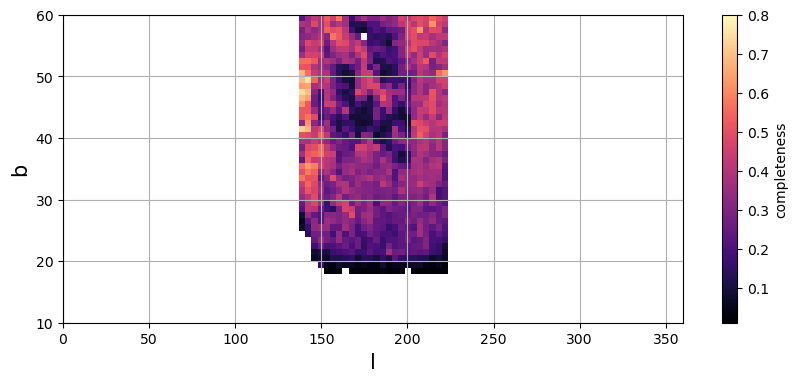

In [61]:
rangearr = [[0, 360],[10, 60]]
bins = [100,50]
bin_xy = scipy.stats.binned_statistic_2d(l_cut[ind500_msto],
                                           b_cut[ind500_msto],
                                           completeness_arr,
                                           'median', bins=bins,
                                           range = rangearr)



# plotting
fig, ax = plt.subplots(1,figsize=(10,4))
pcm = ax.imshow(bin_xy.statistic.T,
                origin='lower',
                #vmax=250,
                #vmin=100,
                #norm='log',
                vmax = 0.8,
                cmap = 'magma', extent=[0, 360, 10, 60],aspect='auto')
fig.colorbar(pcm, ax=ax, location='right', label='completeness')
ax.grid(True)
ax.set_xlabel('l', fontsize=15)
ax.set_ylabel('b', fontsize=15)
#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/lb_completeness_plot.png', dpi=400)

Text(0, 0.5, 'Z')

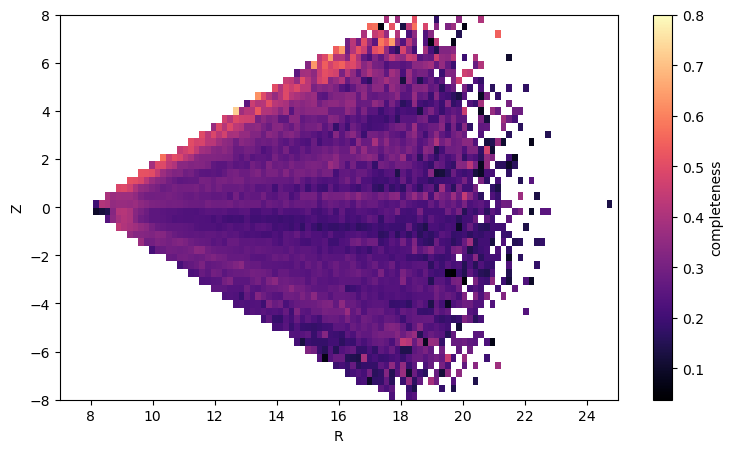

In [62]:
bin_xy = scipy.stats.binned_statistic_2d(galac_x[ind500_msto],
                                           galac_y[ind500_msto],
                                           completeness_arr,
                                           'median', bins=(100, 50),
                                           range = [[7, 25],[-8,8]])



# plotting
fig, ax = plt.subplots(1,figsize=(9,5))
pcm = ax.imshow(bin_xy.statistic.T,
                origin='lower',
                #vmax=250,
                #vmin=100,
                #norm='log',
                #vmax = 1,
                vmax=0.8,
                cmap = 'magma', extent=[7,25,-8,8],aspect='auto')
fig.colorbar(pcm, ax=ax, location='right', label='completeness')
#ax.grid(True)
ax.set_xlabel('R')
ax.set_ylabel('Z')

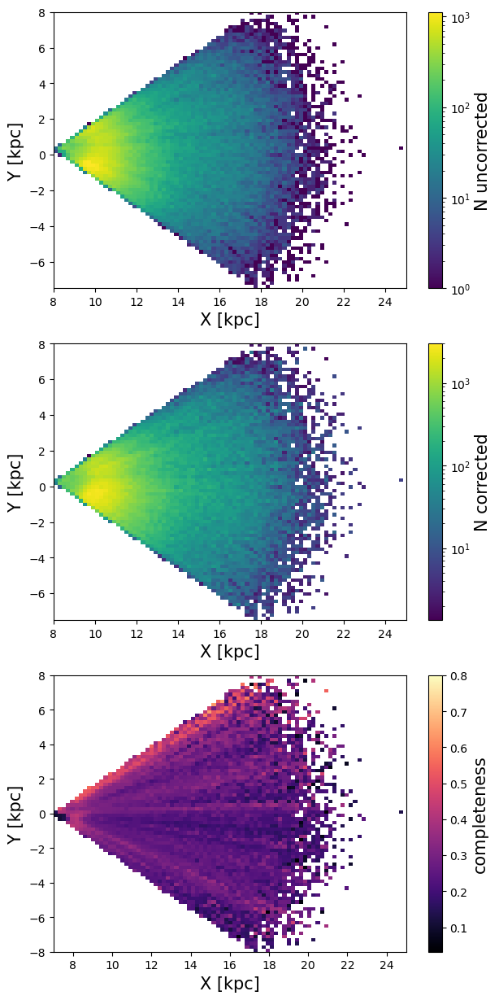

In [63]:
nxbins = 17*5
nybins = 16*5
rangearr=[[8, 25],[-8, 8]]
binsarr = [nxbins, nybins]


# plotting
fig, ax = plt.subplots(3,1, figsize=(7, 15))#, sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})




bin_xy =scipy.stats.binned_statistic_2d(galac_x[ind500_msto],
                                           galac_y[ind500_msto],
                                           v_r[ind500_msto],
                                           'count', bins=binsarr,
                                           range = rangearr)

bin_xy_comp = scipy.stats.binned_statistic_2d(galac_x[ind500_msto],
                                           galac_y[ind500_msto],
                                           completeness_arr,
                                           'median', bins=binsarr,
                                           range = rangearr)

density_corr = bin_xy.statistic * (0.8/bin_xy_comp.statistic)


pcm = ax[0].imshow(bin_xy.statistic.T,
                origin='lower',
                #vmax=800,
                #vmin=10,
                norm='log',
                cmap = 'viridis', extent=[8, 25,-7.5, 8],aspect='auto')
cb = fig.colorbar(pcm, ax=ax[0], location='right', label='N uncorrected')
cb.set_label(label='N uncorrected',size=15)
#ax[0].grid(True)
ax[0].set_xlabel('X [kpc]', fontsize=15)
ax[0].set_ylabel('Y [kpc]', fontsize=15)
############################################################

pcm = ax[1].imshow(density_corr.T,
                origin='lower',
                vmax=3000,
                #vmin=10,
                norm='log',
                cmap = 'viridis', extent=[8, 25,-7.5, 8],aspect='auto')
cb = fig.colorbar(pcm, ax=ax[1], location='right', label='N corrected')
cb.set_label(label='N corrected',size=15)
#ax[0].grid(True)
ax[1].set_xlabel('X [kpc]', fontsize=15)
ax[1].set_ylabel('Y [kpc]', fontsize=15)
############################################################

#rangearr = [[140, 220],[15, 90]]
#bins = [40,75//2]
bin_xy = scipy.stats.binned_statistic_2d(galac_x[ind500_msto],
                                           galac_y[ind500_msto],
                                           completeness_arr,
                                           'median', bins=binsarr,
                                           range = rangearr)

pcm = ax[2].imshow(bin_xy.statistic.T,
                origin='lower',
                #vmax=250,
                #vmin=100,
                #norm='log',
                #vmax = 1,
                vmax=0.8,
                cmap = 'magma', extent=[7,25,-8,8],aspect='auto')
ax[2].set_xlabel('X [kpc]', fontsize=15)
ax[2].set_ylabel('Y [kpc]', fontsize=15)
cb = fig.colorbar(pcm, ax=ax[2], location='right')
cb.set_label(label='completeness',size=15)


for i in range(2):
    circ = matplotlib.patches.Annulus((0,0), 19,5, ec='k', lw=1, linestyle='--',fill=False, alpha=0.7)
    #ax[i].add_patch(circ)
    
#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/loa_XY_N_corrected_completeness.png', dpi=400)

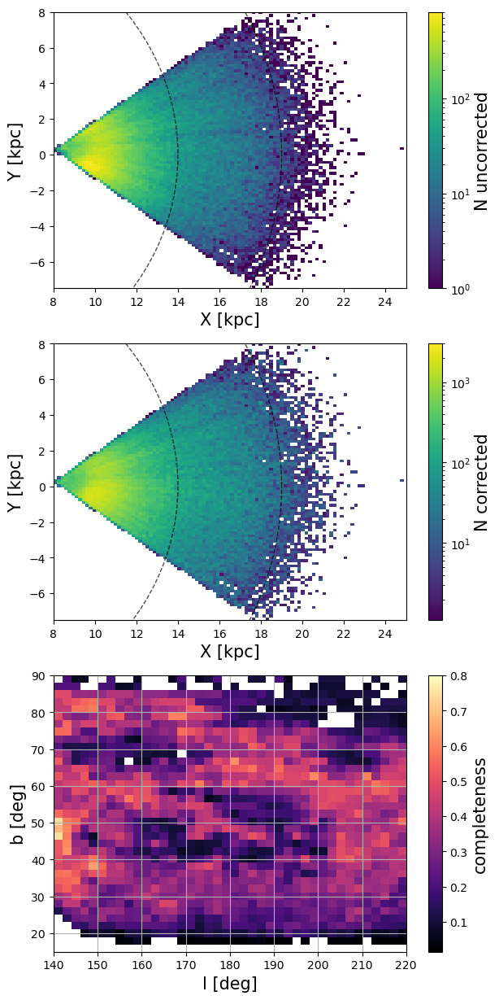

In [64]:
nxbins = 100
nybins = 100
rangearr=[[8, 25],[-8, 8]]
binsarr = [nxbins, nybins]


# plotting
fig, ax = plt.subplots(3,1, figsize=(7, 15))#, sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})




bin_xy =scipy.stats.binned_statistic_2d(galac_x[ind500_msto],
                                           galac_y[ind500_msto],
                                           v_r[ind500_msto],
                                           'count', bins=binsarr,
                                           range = rangearr)

bin_xy_comp = scipy.stats.binned_statistic_2d(galac_x[ind500_msto],
                                           galac_y[ind500_msto],
                                           completeness_arr,
                                           'median', bins=binsarr,
                                           range = rangearr)

density_corr = bin_xy.statistic * (0.8/bin_xy_comp.statistic)


pcm = ax[0].imshow(bin_xy.statistic.T,
                origin='lower',
                #vmax=800,
                #vmin=10,
                norm='log',
                cmap = 'viridis', extent=[8, 25,-7.5, 8],aspect='auto')
cb = fig.colorbar(pcm, ax=ax[0], location='right', label='N uncorrected')
cb.set_label(label='N uncorrected',size=15)
#ax[0].grid(True)
ax[0].set_xlabel('X [kpc]', fontsize=15)
ax[0].set_ylabel('Y [kpc]', fontsize=15)
############################################################

pcm = ax[1].imshow(density_corr.T,
                origin='lower',
                vmax=3000,
                #vmin=10,
                norm='log',
                cmap = 'viridis', extent=[8, 25,-7.5, 8],aspect='auto')
cb = fig.colorbar(pcm, ax=ax[1], location='right', label='N corrected')
cb.set_label(label='N corrected',size=15)
#ax[0].grid(True)
ax[1].set_xlabel('X [kpc]', fontsize=15)
ax[1].set_ylabel('Y [kpc]', fontsize=15)
############################################################

rangearr = [[140, 220],[15, 90]]
bins = [40,75//2]
bin_xy = scipy.stats.binned_statistic_2d(l_cut[ind500_msto],
                                           b_cut[ind500_msto],
                                           completeness_arr,
                                           'median', bins=bins,
                                           range = rangearr)

pcm = ax[2].imshow(bin_xy.statistic.T,
                origin='lower',
                #vmax=250,
                #vmin=100,
                #norm='log',
                vmax = 0.8,
                cmap = 'magma', extent=[140,220,15,90],aspect='auto')
cb = fig.colorbar(pcm, ax=ax[2], location='right')
cb.set_label(label='completeness',size=15)
ax[2].grid(True)
ax[2].set_xlabel('l [deg]', fontsize=15)
ax[2].set_ylabel('b [deg]', fontsize=15)

for i in range(2):
    circ = matplotlib.patches.Annulus((0,0), 19,5, ec='k', lw=1, linestyle='--',fill=False, alpha=0.7)
    ax[i].add_patch(circ)

#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/XY_N_corrected_completeness.png', dpi=400)

In [65]:
25-8

17

In [66]:
# for a specific angle in phi what is the density versus R

galac_xind500 = galac_x[ind500_msto]
galac_yind500 = galac_y[ind500_msto]
l_cut_ind500 = l_cut[ind500_msto]
b_cut_ind500 = b_cut[ind500_msto]
completeness_ind500 = completeness_arr
     
phi_ind500 = phi[ind500_msto]
r_ind500= r[ind500_msto]
z_ind500= z[ind500_msto]
v_phi_ind500 = v_phi[ind500_msto]
feh_cut_ind500 = feh_cut[ind500_msto]


disky_index = np.where((-v_phi_ind500 > 180) & (-v_phi_ind500 < 275))
#slice_index_lower = np.where((phi_ind500>195)&(phi_ind500<196))

In [67]:
galac_xind500_disk = galac_xind500[disky_index]
galac_yind500_disk = galac_yind500[disky_index]
l_cutind500_disk = l_cut_ind500[disky_index]
b_cutind500_disk = b_cut_ind500[disky_index]
completeness_ind500_disk = completeness_ind500[disky_index]

phi_ind500_disk = phi_ind500[disky_index]
r_ind500_disk= r_ind500[disky_index]
z_ind500_disk= z_ind500[disky_index]
v_phi_ind500_disk = v_phi_ind500[disky_index]
feh_cut_ind500_disk = feh_cut_ind500[disky_index]


#slice_index_lower = np.where((phi_ind500_disk>180)&(phi_ind500_disk<185))
slice_index_lower = np.where((l_cutind500_disk>180)&(l_cutind500_disk<185))

In [68]:
v_phi_ind500

array([-226.91189322, -190.9530491 , -193.86436021, ..., -210.30638303,
       -216.94096012, -174.86816262])

Text(0, 0.5, 'Z')

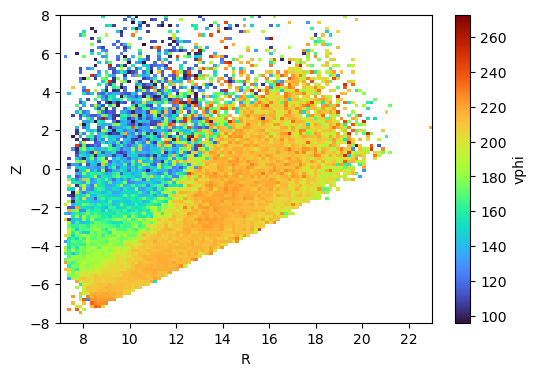

In [69]:
binsarr = [100,100]
rangearr = [[8,25],[0,10]]

bin_rz_comp = scipy.stats.binned_statistic_2d(r_ind500,
                                           z_ind500,
                                           -v_phi_ind500,
                                           'median', bins=binsarr,
                                           range = rangearr)



# plotting
fig, ax = plt.subplots(1,figsize=(6,4))
pcm = ax.imshow(bin_rz_comp.statistic.T,
                origin='lower',
                #vmax=600,
                #vmin=200,
                norm='linear',
                #norm=mpl.colors.PowerNorm(gamma=0.3),
                #vmax = 1,
                cmap = 'turbo', extent=[7,23,-8,8],aspect='auto')
fig.colorbar(pcm, ax=ax, location='right', label='vphi')
#ax.grid(True)
ax.set_xlabel('R')
ax.set_ylabel('Z')

Text(0, 0.5, 'Z')

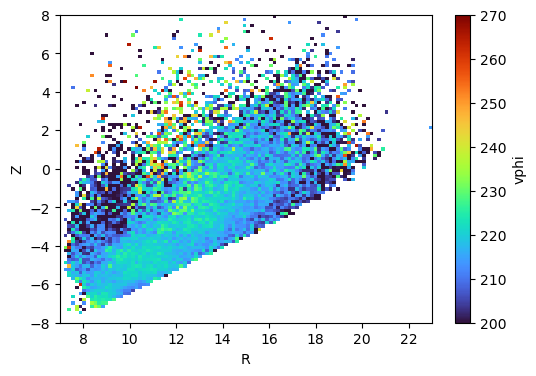

In [70]:
bin_rz_comp = scipy.stats.binned_statistic_2d(r_ind500_disk,
                                           z_ind500_disk,
                                           -v_phi_ind500_disk,
                                           'median', bins=binsarr,
                                           range = rangearr)



# plotting
fig, ax = plt.subplots(1,figsize=(6,4))
pcm = ax.imshow(bin_rz_comp.statistic.T,
                origin='lower',
                vmax=270,
                vmin=200,
                norm='linear',
                #norm=mpl.colors.PowerNorm(gamma=0.3),
                #vmax = 1,
                cmap = 'turbo', extent=[7,23,-8,8],aspect='auto')
fig.colorbar(pcm, ax=ax, location='right', label='vphi')
#ax.grid(True)
ax.set_xlabel('R')
ax.set_ylabel('Z')

Text(0, 0.5, 'Z')

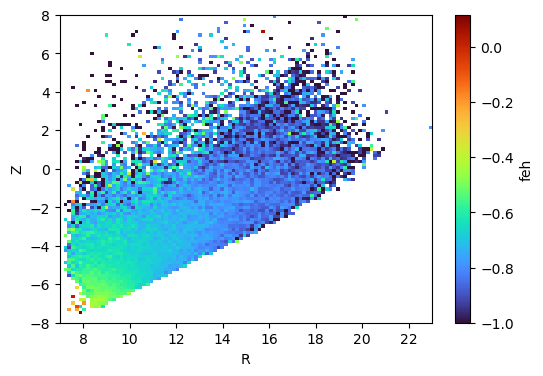

In [71]:
bin_rz_comp = scipy.stats.binned_statistic_2d(r_ind500_disk,
                                           z_ind500_disk,
                                           feh_cut_ind500_disk,
                                           'median', bins=binsarr,
                                           range = rangearr)



# plotting
fig, ax = plt.subplots(1,figsize=(6,4))
pcm = ax.imshow(bin_rz_comp.statistic.T,
                origin='lower',
                #vmax=600,
                vmin=-1,
                norm='linear',
                #norm=mpl.colors.PowerNorm(gamma=0.3),
                #vmax = 1,
                cmap = 'turbo', extent=[7,23,-8,8],aspect='auto')
fig.colorbar(pcm, ax=ax, location='right', label='feh')
#ax.grid(True)
ax.set_xlabel('R')
ax.set_ylabel('Z')

In [72]:
#plt.hist(phi_ind500[slice_index])

# expoenential difference modeling

(12.0, 23.0)

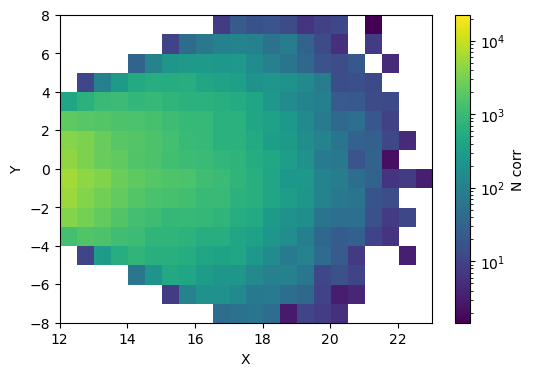

In [73]:
nxbins = 30
nybins = 16
rangearr=[[8, 23],[-8,8]]
binsarr = np.array([nxbins, nybins])


#slice_index_lower = np.where((l_cutind500_disk>140)&(l_cutind500_disk<145))

bin_xy = scipy.stats.binned_statistic_2d(galac_xind500_disk,
                                           galac_yind500_disk,
                                           completeness_ind500_disk,
                                           'count', bins=binsarr,
                                           range = rangearr)

bin_xy_comp = scipy.stats.binned_statistic_2d(galac_xind500_disk,
                                           galac_yind500_disk,
                                           completeness_ind500_disk,
                                           'median', bins=binsarr,
                                           range = rangearr)

density_corr = bin_xy.statistic * (0.8/bin_xy_comp.statistic)

# plotting
fig, ax = plt.subplots(1,figsize=(6,4))
pcm = ax.imshow(density_corr.T,
                origin='lower',
                #vmax=600,
                #vmin=100,
                norm='log',
                cmap = 'viridis', extent=[8,23,-8,8],aspect='auto')
fig.colorbar(pcm, ax=ax, location='right', label='N corr')
#ax.grid(True)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_xlim(12,23)

In [74]:
23-8

15

Text(0, 0.5, 'Y')

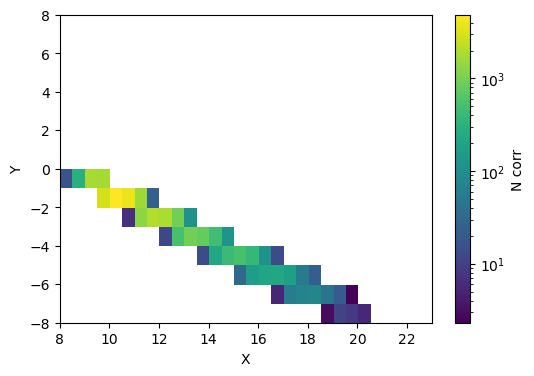

In [75]:
nxbins = 30
nybins = 16
rangearr=[[8, 23],[-8,8]]#before -6,6
binsarr = np.array([nxbins, nybins])


slice_index_lower = np.where((l_cutind500_disk>210)&(l_cutind500_disk<215))

bin_xy = scipy.stats.binned_statistic_2d(galac_xind500_disk[slice_index_lower],
                                           galac_yind500_disk[slice_index_lower],
                                           completeness_ind500_disk[slice_index_lower],
                                           'count', bins=binsarr,
                                           range = rangearr)

bin_xy_comp = scipy.stats.binned_statistic_2d(galac_xind500_disk[slice_index_lower],
                                           galac_yind500_disk[slice_index_lower],
                                           completeness_ind500_disk[slice_index_lower],
                                           'median', bins=binsarr,
                                           range = rangearr)

density_corr = bin_xy.statistic * (0.8/bin_xy_comp.statistic)

# plotting
fig, ax = plt.subplots(1,figsize=(6,4))
pcm = ax.imshow(density_corr.T,
                origin='lower',
                #vmax=600,
                #vmin=100,
                norm='log',
                cmap = 'viridis', extent=[8,23,-8,8],aspect='auto')
fig.colorbar(pcm, ax=ax, location='right', label='N corr')
#ax.grid(True)
ax.set_xlabel('X')
ax.set_ylabel('Y')

Text(0, 0.5, 'Z')

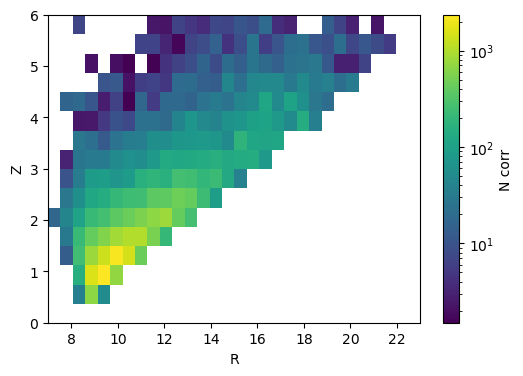

In [76]:

rangearr=[[8, 23],[0, 6]]
binsarr = np.array([nxbins, nybins])

bin_rz = scipy.stats.binned_statistic_2d(r_ind500_disk[slice_index_lower],
                                           z_ind500_disk[slice_index_lower],
                                           completeness_ind500_disk[slice_index_lower],
                                           'count', bins=binsarr,
                                           range = rangearr)

bin_rz_comp = scipy.stats.binned_statistic_2d(r_ind500_disk[slice_index_lower],
                                           z_ind500_disk[slice_index_lower],
                                           completeness_ind500_disk[slice_index_lower],
                                           'median', bins=binsarr,
                                           range = rangearr)

density_corrr = bin_rz.statistic * (0.8/bin_rz_comp.statistic)

# plotting
fig, ax = plt.subplots(1,figsize=(6,4))
pcm = ax.imshow(density_corrr.T,
                origin='lower',
                #vmax=600,
                #vmin=100,
                norm='log',
                #norm=mpl.colors.PowerNorm(gamma=0.3),
                #vmax = 1,
                cmap = 'viridis', extent=[7,23,0,6],aspect='auto')
fig.colorbar(pcm, ax=ax, location='right', label='N corr')
#ax.grid(True)
ax.set_xlabel('R')
ax.set_ylabel('Z')

In [77]:
r_new = bin_rz.x_edge[:-1]
len(r_new)

30

In [78]:
np.shape(density_corrr)[0]

#density_per_r_170175 = []
#density_per_r_185190 = []
density_per_r_180plus = []
#density_per_r_175176 = []
#density_per_r_165166 = []
#density_per_r_195196 = []


for i in range(np.shape(density_corrr)[0]):
    density_per_r_180plus.append(np.nansum(density_corrr[i]))

Text(0.5, 1.0, '180-185')

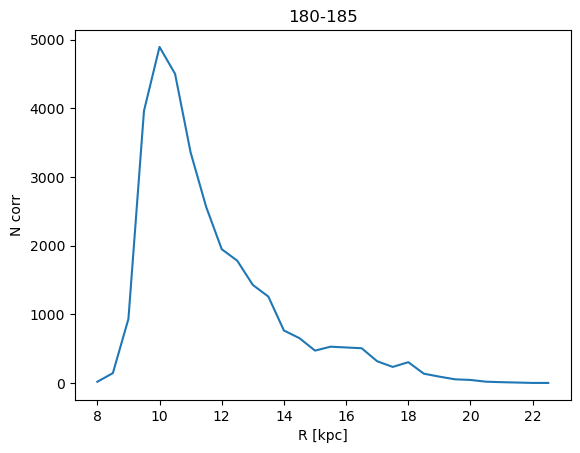

In [79]:
plt.plot(r_new, np.array(density_per_r_180plus))
plt.xlabel('R [kpc]')
plt.ylabel('N corr')
plt.title('180-185')

In [80]:
170-220


-50

In [81]:
'''
slice_diff = np.array(density_per_r_185190) - np.array(density_per_r_180plus)

plt.plot(r_new, slice_diff)
plt.xlabel('R [kpc]')
plt.ylabel('difference')
#plt.ylim(-500, 500)
plt.hlines(0, 7, 20, 'k')
'''

"\nslice_diff = np.array(density_per_r_185190) - np.array(density_per_r_180plus)\n\nplt.plot(r_new, slice_diff)\nplt.xlabel('R [kpc]')\nplt.ylabel('difference')\n#plt.ylim(-500, 500)\nplt.hlines(0, 7, 20, 'k')\n"

[30 16]
0.5


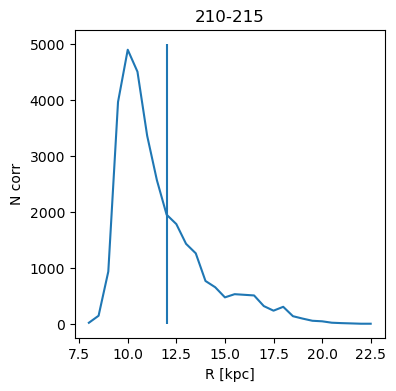

[ 2.85172597e+05  4.07318262e-01 -1.33294367e+01]


/tmp/ipykernel_408406/1993526035.py:54: RuntimeWarning: overflow encountered in exp
  return a1*np.exp(-a2*x)+a3
/tmp/ipykernel_408406/1993526035.py:54: RuntimeWarning: overflow encountered in multiply
  return a1*np.exp(-a2*x)+a3


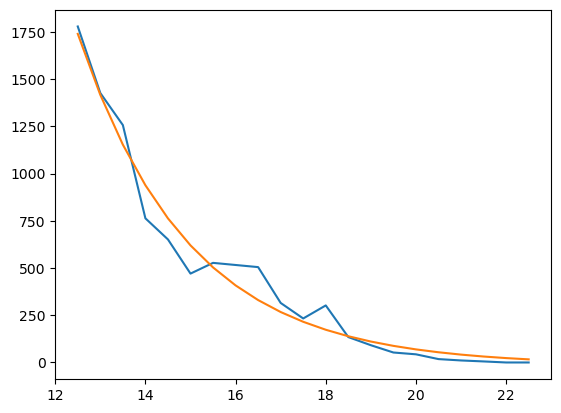

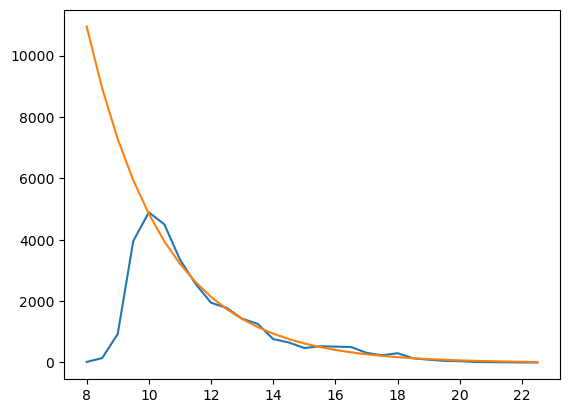

In [82]:
fig, ax = plt.subplots(1,1, figsize=(4,4))#, sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})

#phi_range =[190]
lon_range = [210]
w=0

slice_index = np.where((l_cutind500_disk>=lon_range[w])&(l_cutind500_disk<lon_range[w]+5))


rangearr=[[8, 23],[0, 6]]
binsarr = np.array([nxbins, nybins]) #65 60 note: r_new is len 65
print(binsarr)

bin_rz = scipy.stats.binned_statistic_2d(r_ind500_disk[slice_index],
                                           z_ind500_disk[slice_index],
                                           completeness_ind500_disk[slice_index],
                                           'count', bins=binsarr,
                                           range = rangearr)

bin_rz_comp = scipy.stats.binned_statistic_2d(r_ind500_disk[slice_index],
                                           z_ind500_disk[slice_index],
                                           completeness_ind500_disk[slice_index],
                                           'median', bins=binsarr,
                                           range = rangearr)

r_new = bin_rz.x_edge[:-1]
density_corrr = bin_rz.statistic * (0.8/bin_rz_comp.statistic)

density_per_r = []

for k in range(np.shape(density_corrr)[0]):#for each R
    density_per_r.append(np.nansum(density_corrr[k]))

ax.plot(r_new, np.array(density_per_r), label=f'{len(slice_index[0])}')
ax.set_xlabel('R [kpc]')
ax.set_ylabel('N corr')
ax.set_title(f'{lon_range[w]}-{lon_range[w]+5}')

ax.vlines(12, 0, 5000)

r_new_cut_ind = np.where(r_new > 12)

no_bump = np.array(density_per_r)

no_bump_cut = no_bump[r_new_cut_ind]
r_new_cut = r_new[r_new_cut_ind]
print(r_new_cut[1]-r_new_cut[0])
plt.show()
plt.plot(r_new_cut, no_bump_cut)



def expo(x, a1, a2, a3):
    return a1*np.exp(-a2*x)+a3


test = [2000000, 0.9, 0]
popt, pcov = scipy.optimize.curve_fit(expo, r_new_cut, no_bump_cut, p0=test)

print(popt)

plt.plot(r_new_cut, popt[0]*np.exp(-popt[1]*r_new_cut)+popt[2])
plt.show()

plt.plot(r_new, no_bump)
plt.plot(r_new, popt[0]*np.exp(-popt[1]*r_new)+popt[2])

In [83]:
np.arange(0, 14, 1)

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13])

6868


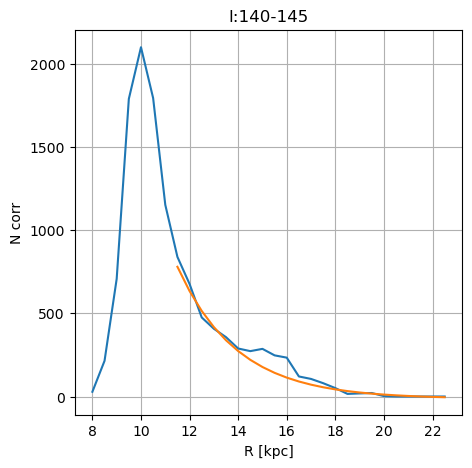

In [84]:
fig, ax = plt.subplots(1,1, figsize=(5,5))#, sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})
phi_range = np.arange(160, 200, 5)
lon_range = np.arange(140, 220, 5)
w=0
#print(i, j)
#slice_index = np.where((phi_ind500_disk>=phi_range[w])&(phi_ind500_disk<phi_range[w]+5))
slice_index = np.where((l_cutind500_disk>=lon_range[w])&(l_cutind500_disk<lon_range[w]+5))


rangearr=[[8, 23],[0, 6]]
binsarr = np.array([nxbins, nybins])
#print(binsarr)
print(len(r_ind500_disk[slice_index]))

bin_rz = scipy.stats.binned_statistic_2d(r_ind500_disk[slice_index],
                                           z_ind500_disk[slice_index],
                                           completeness_ind500_disk[slice_index],
                                           'count', bins=binsarr,
                                           range = rangearr)

bin_rz_comp = scipy.stats.binned_statistic_2d(r_ind500_disk[slice_index],
                                           z_ind500_disk[slice_index],
                                           completeness_ind500_disk[slice_index],
                                           'median', bins=binsarr,
                                           range = rangearr)
r_new = bin_rz.x_edge[:-1]

density_corrr = bin_rz.statistic * (0.8/bin_rz_comp.statistic)

density_per_r = []

for k in range(np.shape(density_corrr)[0]):#for each R
    density_per_r.append(np.nansum(density_corrr[k]))

r_new_cut_150 = r_new[np.where(r_new>11)]
const_150 = -1.2
ax.plot(r_new, np.array(density_per_r), label=f'{len(slice_index[0])}')
ax.plot(r_new_cut_150, popt[0]*np.exp(-popt[1]*r_new_cut_150+const_150)+popt[2])
ax.set_xlabel('R [kpc]')
ax.set_ylabel('N corr')
ax.set_title(f'l:{lon_range[w]}-{lon_range[w]+5}')
ax.grid()

In [85]:
print(popt[0],popt[1],popt[2])
r_new_cut

285172.5969581311 0.40731826167882834 -13.329436721054098


array([12.5, 13. , 13.5, 14. , 14.5, 15. , 15.5, 16. , 16.5, 17. , 17.5,
       18. , 18.5, 19. , 19.5, 20. , 20.5, 21. , 21.5, 22. , 22.5])

In [86]:
print(len(lon_range))  
lon_range = np.arange(140, 220, 5)
print(len(lon_range)) 

16
16


[160 165 170 175 180 185 190 195]
6868
8211
7539
8251
9217
8911
7603
9547
9133
9410
10044
10675
10407
11649
10186
8930


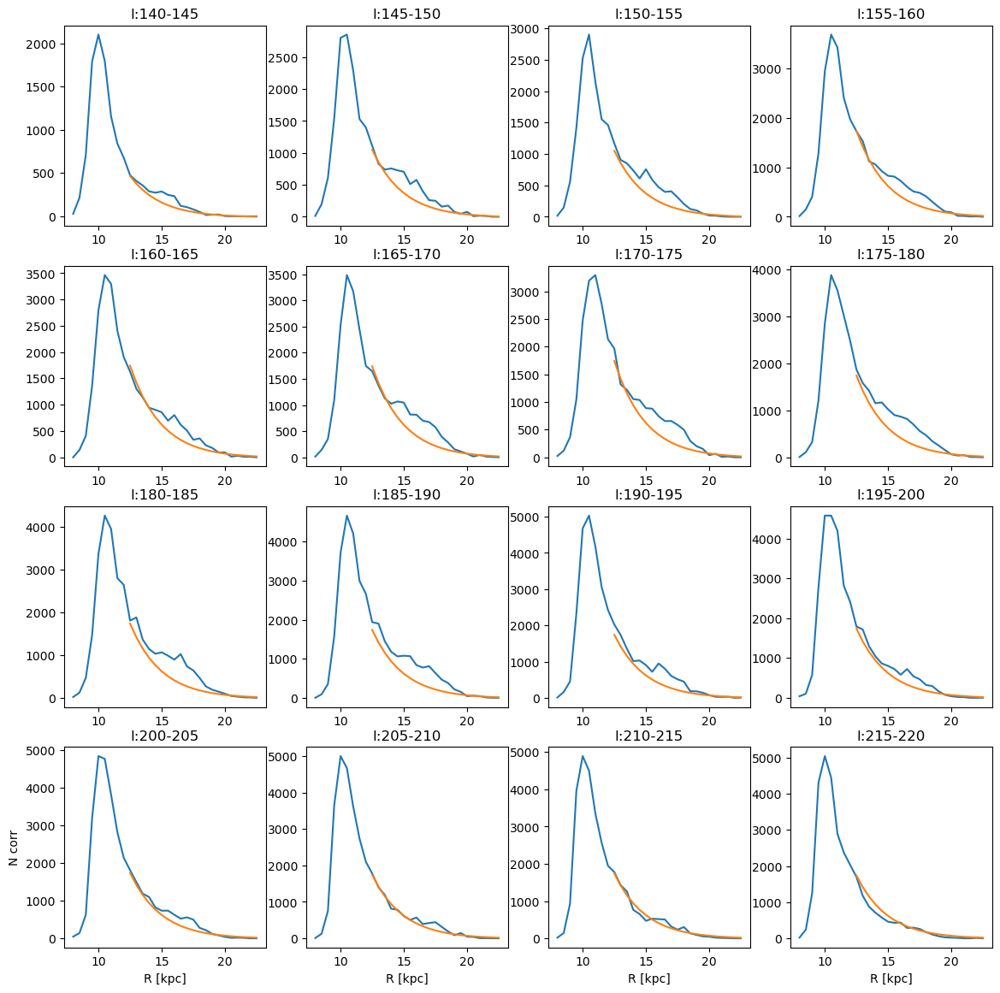

In [87]:
# plotting

# need to do this for only disk stars
fig, ax = plt.subplots(4,4, figsize=(14,14))#, sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})

phi_range = np.arange(160, 200, 5)
lon_range = np.arange(140, 220, 5)
print(phi_range)
w = 0
for i in range(4):
    for j in range(4):
        #print(i, j)
        #slice_index = np.where((phi_ind500_disk>=phi_range[w])&(phi_ind500_disk<phi_range[w]+5))
        slice_index = np.where((l_cutind500_disk>=lon_range[w])&(l_cutind500_disk<lon_range[w]+5))


        rangearr=[[8, 23],[0, 6]]
        binsarr = np.array([nxbins, nybins])
        #print(binsarr)
        print(len(r_ind500_disk[slice_index]))

        bin_rz = scipy.stats.binned_statistic_2d(r_ind500_disk[slice_index],
                                                   z_ind500_disk[slice_index],
                                                   completeness_ind500_disk[slice_index],
                                                   'count', bins=binsarr,
                                                   range = rangearr)

        bin_rz_comp = scipy.stats.binned_statistic_2d(r_ind500_disk[slice_index],
                                                   z_ind500_disk[slice_index],
                                                   completeness_ind500_disk[slice_index],
                                                   'median', bins=binsarr,
                                                   range = rangearr)
        r_new = bin_rz.x_edge[:-1]

        density_corrr = bin_rz.statistic * (0.8/bin_rz_comp.statistic)

        density_per_r = []

        for k in range(np.shape(density_corrr)[0]):#for each R
            density_per_r.append(np.nansum(density_corrr[k]))
            
        

        ax[i,j].plot(r_new, np.array(density_per_r), label=f'{len(slice_index[0])}')
        #'''
        if w == 0:
            r_new_cut_150 = r_new[np.where(r_new>11)]
            const_150 = -1.3
            ax[i,j].plot(r_new_cut, popt[0]*np.exp(-popt[1]*r_new_cut+const_150)+popt[2])
        elif w == 1 or w==2:
            r_new_cut_150 = r_new[np.where(r_new>11)]
            const_150 = -0.5 
            ax[i,j].plot(r_new_cut, popt[0]*np.exp(-popt[1]*r_new_cut+const_150)+popt[2])
        #'''
        #if w == 0:
        #    r_new_cut_150 = r_new[np.where(r_new>11)]
        #    const_150 = -0.5
        #    ax[i,j].plot(r_new_cut, popt[0]*np.exp(-popt[1]*r_new_cut+const_150)+popt[2])
        else:
            ax[i,j].plot(r_new_cut, popt[0]*np.exp(-popt[1]*r_new_cut)+popt[2])
        ax[3,j].set_xlabel('R [kpc]')
        ax[3,0].set_ylabel('N corr')
        ax[i,j].set_title(f'l:{lon_range[w]}-{lon_range[w]+5}')
        #ax[i,j].vlines(12, 0, 5000)
        
        w+=1

        #if w==14:
        #    break

    #ax[i,j].legend()



# subtracting, residuals

In [88]:
np.arange(160, 200, 5)

array([160, 165, 170, 175, 180, 185, 190, 195])

In [89]:
nxbins

30

[140 145 150 155 160 165 170 175 180 185 190 195 200 205 210 215]
6868
8211
7539
8251
9217
8911
7603
9547
9133
9410
10044
10675
10407
11649
10186
8930


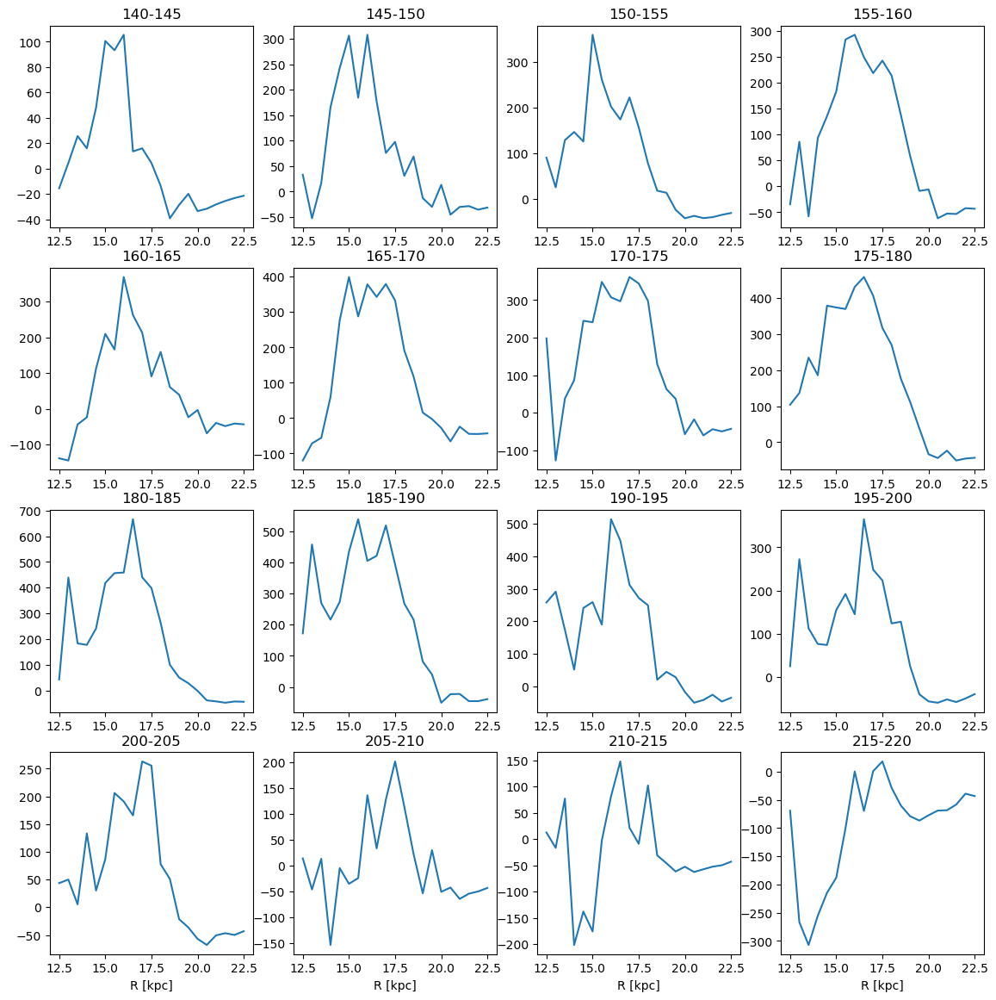

In [90]:
# plotting
fig, ax = plt.subplots(4,4, figsize=(14,14))#, sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})


#resid_2d = np.zeros((8, 47))

#phi_range = np.arange(160, 200, 5)
lon_range = np.arange(140, 220, 5)

resid_2d = np.zeros((len(lon_range), 21)) # before 47
print(lon_range)
w = 0
for i in range(4):
    for j in range(4):
        #print(i, j)
        #slice_index = np.where((phi_ind500_disk>=phi_range[w])&(phi_ind500_disk<phi_range[w]+5))
        slice_index = np.where((l_cutind500_disk>=lon_range[w])&(l_cutind500_disk<lon_range[w]+5))


        rangearr=[[8, 23],[0, 6]]
        binsarr = np.array([nxbins, nybins])
        #print(binsarr)
        print(len(r_ind500_disk[slice_index]))

        bin_rz = scipy.stats.binned_statistic_2d(r_ind500_disk[slice_index],
                                                   z_ind500_disk[slice_index],
                                                   completeness_ind500_disk[slice_index],
                                                   'count', bins=binsarr,
                                                   range = rangearr)

        bin_rz_comp = scipy.stats.binned_statistic_2d(r_ind500_disk[slice_index],
                                                   z_ind500_disk[slice_index],
                                                   completeness_ind500_disk[slice_index],
                                                   'median', bins=binsarr,
                                                   range = rangearr)
        r_new = bin_rz.x_edge[:-1]
        

        density_corrr = bin_rz.statistic * (0.8/bin_rz_comp.statistic)

        density_per_r = []

        for k in range(np.shape(density_corrr)[0]):#for each R
            density_per_r.append(np.nansum(density_corrr[k]))
            
        density_count = np.array(density_per_r)
        r_new_cut_ind = np.where(r_new > 12)

        
        
        resid = density_count[r_new_cut_ind] - no_bump_cut
        #'''
        if w == 0:
            const_150 = -1.3
            resid_model = density_count[r_new_cut_ind] - popt[0]*np.exp(-popt[1]*r_new_cut+const_150)+popt[2]
        elif w == 1 or w==2:# this is for l=150-155 deg because the distribution is shifted bc not enough data
            const_150 = -0.5 
            resid_model = density_count[r_new_cut_ind] - popt[0]*np.exp(-popt[1]*r_new_cut+const_150)+popt[2]
        #'''
        #if w == 0:
        #    const_150 = -0.5
        #    resid_model = density_count[r_new_cut_ind] - popt[0]*np.exp(-popt[1]*r_new_cut+const_150)+popt[2]

        else:
            resid_model = density_count[r_new_cut_ind] - popt[0]*np.exp(-popt[1]*r_new_cut)+popt[2]
        
        #ax[i,j].plot(r_new, np.array(density_per_r), label=f'{len(slice_index[0])}')
        #ax[i,j].plot(r_new_cut, popt[0]*np.exp(-popt[1]*r_new_cut)+popt[2])
        #print(len(resid_model))
        
        '''
        if len(np.where(resid_model < -500)[0]) >0:
            null_index = np.where(resid_model < -500)
            resid_2d[w,null_index] = np.nan
            print(null_index)
        '''
        
        resid_2d[w,:] = resid_model
        
        ax[i,j].plot(r_new[r_new_cut_ind], resid_model, label=f'{len(slice_index[0])}')
        ax[3,j].set_xlabel('R [kpc]')
        #ax[1,0].set_ylabel('residual')
        #ax[0,0].set_ylabel('residual')
        ax[i,j].set_title(f'{lon_range[w]}-{lon_range[w]+5}')
        #ax[i,j].vlines(12, 0, 5000)
        w+=1
        
        #if w ==14:
        #    break
    #ax[i,j].legend()

    
    
    

In [91]:
resid_2d_test = np.insert(resid_2d, 0, -1000, axis=1)
for i in range(23): # need to add x more columns of nans to get the x axis to 8 kpc from 12 kpc based on binning (22)
    resid_2d_test = np.insert(resid_2d_test, 0, -1000, axis=1)
    
# from 12-23 with 11*2 binning 2 bins per kpc
# 12-0

(16, 21)


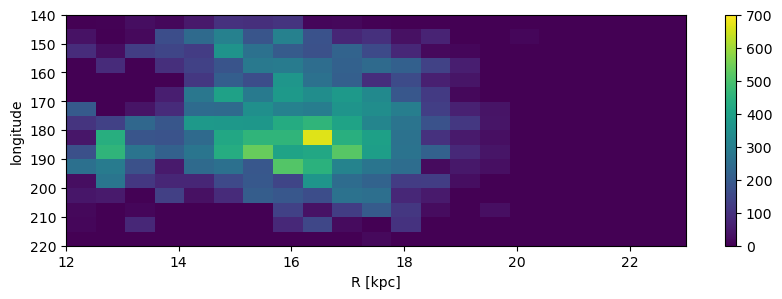

In [92]:
print(np.shape(resid_2d))

r_dense = np.linspace(12, 23, np.shape(resid_2d)[1]+1)
longi_dense = np.linspace(140, 220, np.shape(resid_2d)[0]+1)

fig,ax = plt.subplots(1,1, figsize=(10,3))
pcm = ax.imshow(resid_2d, origin='upper',
                vmax=700,
                vmin=-0,
                #norm='log',
                cmap = 'viridis', extent=[12,23,220, 140],aspect='auto')
ax.set_xlabel('R [kpc]')
ax.set_ylabel('longitude')
fig.colorbar(pcm, ax=ax)

In [165]:
np.sum(resid_2d), np.sum(resid_2d[np.where(resid_2d>0)])

(27095.79987770001, 35098.46044311984)

(16, 45)


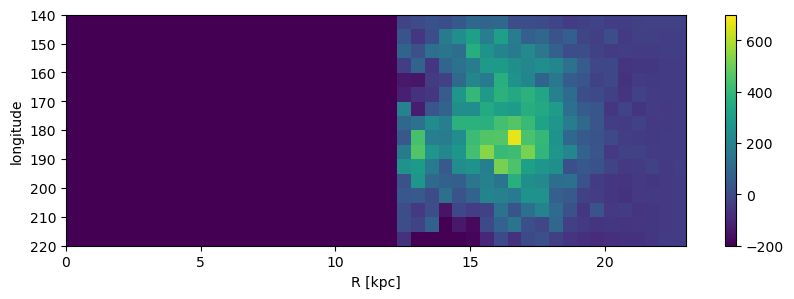

In [93]:
print(np.shape(resid_2d_test))

r_dense = np.linspace(0, 23, np.shape(resid_2d_test)[1]+1)
longi_dense = np.linspace(140, 220, np.shape(resid_2d_test)[0]+1)

fig,ax = plt.subplots(1,1, figsize=(10,3))
pcm = ax.imshow(resid_2d_test, origin='upper',
                vmax=700,
                vmin=-200,
                #norm='log',
                cmap = 'viridis', extent=[0,23,220, 140],aspect='auto')
ax.set_xlabel('R [kpc]')
ax.set_ylabel('longitude')
fig.colorbar(pcm, ax=ax)

In [113]:
resid_2d_test2 = np.insert(resid_2d, 0, -1000, axis=1)
for i in range(7): # need to add x more columns of nans to get the x axis to 8 kpc from 12 kpc based on binning (22)
    resid_2d_test2 = np.insert(resid_2d_test2, 0, -1000, axis=1)
    
# 12-8=4 so 4*2 binning 

(16, 29)


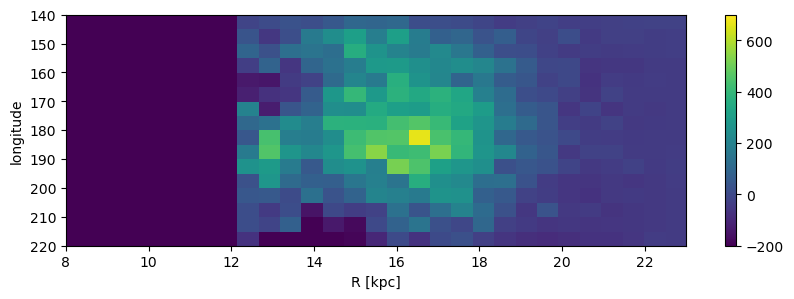

In [114]:
print(np.shape(resid_2d_test2))

r_dense = np.linspace(0, 23, np.shape(resid_2d_test2)[1]+1)
longi_dense = np.linspace(140, 220, np.shape(resid_2d_test2)[0]+1)

fig,ax = plt.subplots(1,1, figsize=(10,3))
pcm = ax.imshow(resid_2d_test2, origin='upper',
                vmax=700,
                vmin=-200,
                #norm='log',
                cmap = 'viridis', extent=[8,23,220, 140],aspect='auto')
ax.set_xlabel('R [kpc]')
ax.set_ylabel('longitude')
fig.colorbar(pcm, ax=ax)

In [96]:
np.sum(resid_2d_test), np.sum(resid_2d_test2)

(-356904.2001223, -100904.2001223)

/tmp/ipykernel_408406/2086015551.py:11: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  pc = ax.pcolormesh(A, R, resid_2d_test.T, cmap="viridis", vmin=-100, vmax=600)


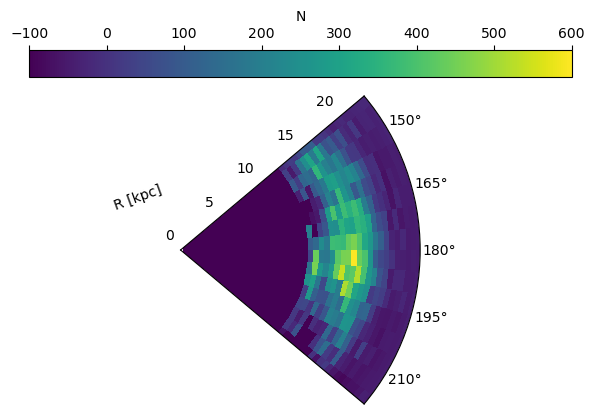

In [97]:
# plot
# define binning
rbins = np.linspace(0, 23, np.shape(resid_2d_test)[1])
abins = np.deg2rad(np.linspace(140, 220, np.shape(resid_2d_test)[0]))

A, R = np.meshgrid(abins, rbins)


fig, ax = plt.subplots(1, figsize=(7,5),subplot_kw=dict(projection="polar"))

pc = ax.pcolormesh(A, R, resid_2d_test.T, cmap="viridis", vmin=-100, vmax=600)
fig.colorbar(pc, ax=ax, location='top', label='N')

ax.set_rlim(0, 23)
ax.set_thetalim(abins[0], abins[-1])
ax.set_theta_zero_location("W")
ax.set_theta_direction(-1)
ax.set_rlabel_position(-50)
rlab = ax.set_ylabel("R [kpc]")
rlab.set_position((-100.0, 0.65))
rlab.set_rotation(20)
#ax.grid(True)
plt.show()

/tmp/ipykernel_408406/3975843160.py:11: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  pc = ax.pcolormesh(A, R, resid_2d_test2.T, cmap="viridis", vmin=-100, vmax=600)


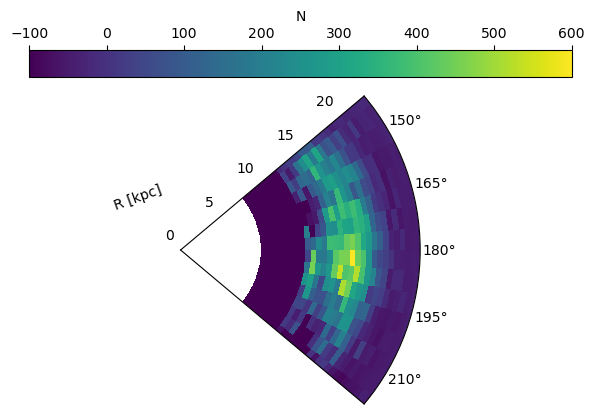

In [98]:
# plot
# define binning
rbins = np.linspace(8, 23, np.shape(resid_2d_test2)[1])
abins = np.deg2rad(np.linspace(140, 220, np.shape(resid_2d_test2)[0]))

A, R = np.meshgrid(abins, rbins)


fig, ax = plt.subplots(1, figsize=(7,5),subplot_kw=dict(projection="polar"))

pc = ax.pcolormesh(A, R, resid_2d_test2.T, cmap="viridis", vmin=-100, vmax=600)
fig.colorbar(pc, ax=ax, location='top', label='N')

ax.set_rlim(0, 23)
ax.set_thetalim(abins[0], abins[-1])
ax.set_theta_zero_location("W")
ax.set_theta_direction(-1)
ax.set_rlabel_position(-50)
rlab = ax.set_ylabel("R [kpc]")
rlab.set_position((-100.0, 0.65))
rlab.set_rotation(20)
#ax.grid(True)
plt.show()

# transformation test 1

In [99]:
from scipy.ndimage.interpolation import map_coordinates as mp

# Auxiliary function to map polar data to a cartesian plane
def polar_to_cart(polar_data, theta_step, range_step, x, y, order=3):

    # "x" and "y" are numpy arrays with the desired cartesian coordinates
    # we make a meshgrid with them
    X, Y = np.meshgrid(x, y)

    # Now that we have the X and Y coordinates of each point in the output plane
    # we can calculate their corresponding theta and range
    Tc = np.degrees(np.arctan2(Y, X)).ravel()
    Rc = (np.sqrt(X**2 + Y**2)).ravel()

    # Negative angles are corrected
    #Tc[Tc < 0] = 360 + Tc[Tc < 0]

    # Using the known theta and range steps, the coordinates are mapped to
    # those of the data grid
    Tc = Tc / theta_step
    Rc = Rc / range_step

    # An array of polar coordinates is created stacking the previous arrays
    coords = np.vstack((Tc, Rc))

    # To avoid holes in the 360º - 0º boundary, the last column of the data
    # copied in the begining
    polar_data = np.vstack((polar_data, polar_data[-1,:]))

    # The data is mapped to the new coordinates
    # Values outside range are substituted with nans
    cart_data = mp(polar_data, coords, order=order, mode='constant', cval=np.nan)

    # The data is reshaped and returned
    return(cart_data.reshape(len(y), len(x)).T)


/tmp/ipykernel_408406/3408885243.py:1: DeprecationWarning: Please use `map_coordinates` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  from scipy.ndimage.interpolation import map_coordinates as mp


In [100]:
np.shape(resid_2d), np.shape(resid_2d_test)
#resid_2d_test

((16, 21), (16, 45))

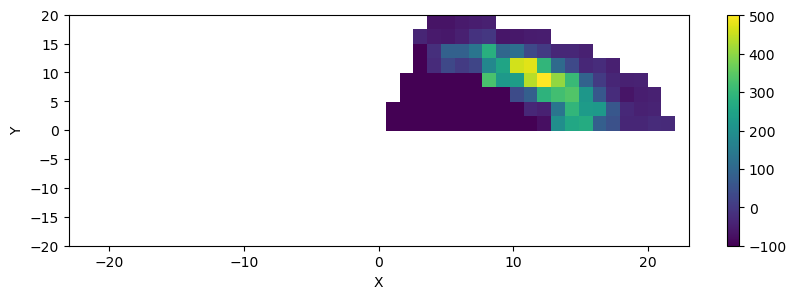

In [101]:

polar_data = resid_2d_test # Here a 2D array of data is assumed, with shape thetas x ranges

# We create the x and y axes of the output cartesian data
#x = y = np.arange(-100000, 100000, 1000)
#x_dense = np.linspace(12,23, 29) # 22
#y_dense = np.linspace(-8,8, 16) # 16

xy_val = [-23,23,-20,20]

x_dense = np.linspace(xy_val[0],xy_val[1], 45) # 22
y_dense = np.linspace(xy_val[2], xy_val[3], 16) # 16


# We call the mapping function assuming 1 degree of theta step and 500 meters of
# range step. The default order of 3 is used.
cart_data = polar_to_cart(polar_data, 5,0.5, x_dense, y_dense) # 1,2 for not test

fig,ax = plt.subplots(1,1, figsize=(10,3))
pcm = ax.imshow(cart_data.T, origin='lower',
                #vmax=700,
                vmin=-100,
                #norm='log',
                cmap = 'viridis', extent=xy_val,aspect='auto')
ax.set_xlabel('X')
ax.set_ylabel('Y')
fig.colorbar(pcm, ax=ax)

In [102]:
np.deg2rad(140), np.deg2rad(100)

(2.443460952792061, 1.7453292519943295)

# trasnformation test scipy geo transform

In [103]:
import scipy.ndimage

# This is the data in your polar grid.
# The 0th and 1st axes correspond to r and θ, respectively.
# For the sake of simplicity, θ goes from 0 to 2π, 
# and r's units are just its indices.


def polar2cartesian(outcoords, inputshape, origin):
    """Coordinate transform for converting a polar array to Cartesian coordinates. 
    inputshape is a tuple containing the shape of the polar array. origin is a
    tuple containing the x and y indices of where the origin should be in the
    output array."""

    xindex, yindex = outcoords
    x0, y0 = origin
    x = xindex - x0
    y = yindex - y0

    r = np.sqrt(x**2 + y**2)
    theta = np.arctan2(y, x)
    theta_index = np.round((theta + np.deg2rad(140)) * inputshape[1] / (np.deg2rad(140)))
    #print(theta_index)

    return (r,theta_index)

cartesian_data = scipy.ndimage.geometric_transform(resid_2d.T, polar2cartesian, 
    order=0, cval=np.nan,
    output_shape = (resid_2d.shape[1] * 2, resid_2d.shape[1]),
    extra_keywords = {'inputshape':resid_2d.shape,
        'origin':(resid_2d.shape[1],resid_2d.shape[1])})


print(resid_2d.shape)
print(cartesian_data.shape)
print(resid_2d.shape[1])

(16, 21)
(42, 21)
21


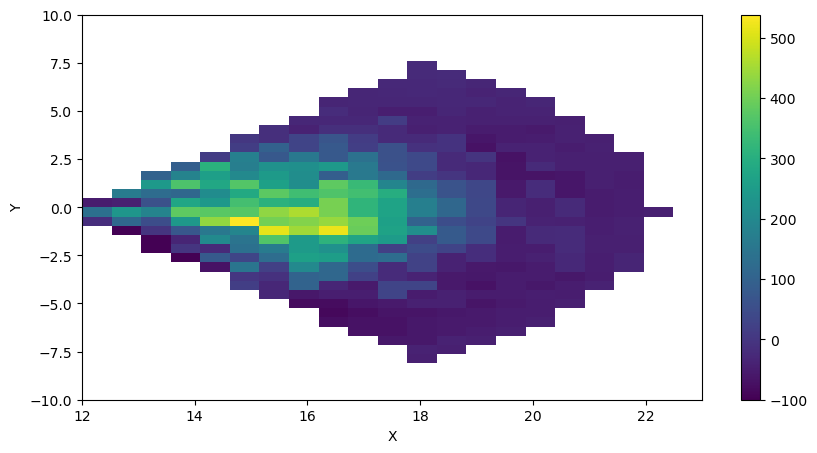

In [104]:
xy_val = [12,23, -10,10]

fig,ax = plt.subplots(1,1, figsize=(10,5))
pcm = ax.imshow(np.flip(cartesian_data, axis=1), origin='upper',
                #vmax=700,
                vmin=-100,
                #norm='log',
                cmap = 'viridis', extent=xy_val,aspect='auto')
ax.set_xlabel('X')
ax.set_ylabel('Y')
#ax.set_xlim(12,23)
fig.colorbar(pcm, ax=ax)

In [105]:
np.nansum(cartesian_data), np.nansum(cartesian_data[np.where(cartesian_data>0)])

(18416.325403583083, 28090.021793264776)

In [120]:
def polar2cartesian(outcoords, inputshape, origin):
    """Coordinate transform for converting a polar array to Cartesian coordinates. 
    inputshape is a tuple containing the shape of the polar array. origin is a
    tuple containing the x and y indices of where the origin should be in the
    output array."""

    xindex, yindex = outcoords
    x0, y0 = origin
    x = xindex - x0
    y = yindex - y0

    r = np.sqrt(x**2 + y**2)
    theta = np.arctan2(y, x)
    theta_index = np.round((theta + np.deg2rad(140)) * inputshape[1] / (np.deg2rad(170)))
    #print(theta_index)

    return (r,theta_index)

cartesian_data = scipy.ndimage.geometric_transform(resid_2d_test2.T, polar2cartesian, 
    order=3, cval=np.nan,
    output_shape = (30,30), # 30,30
    extra_keywords = {'inputshape':(70,30), #70,30
        'origin':(15,30)}) #15,30


print(resid_2d_test2.shape)
print(cartesian_data.shape)
print(resid_2d_test2.shape[1])
cartesian_data[cartesian_data < -600] = np.nan

(16, 29)
(30, 30)
29


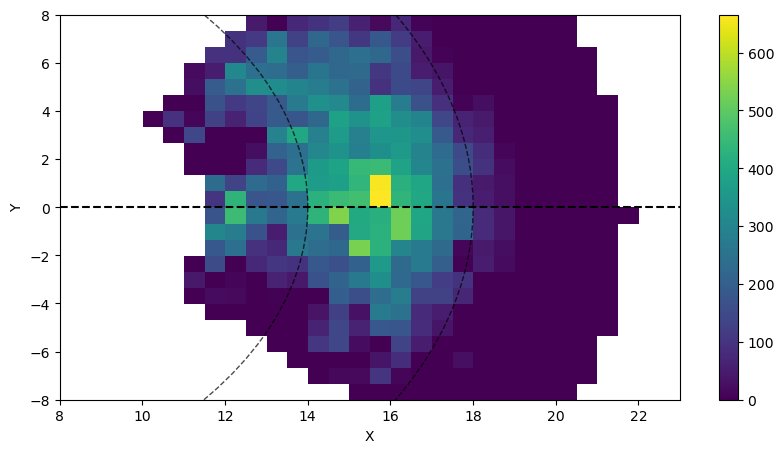

In [121]:
xy_val = [8,23, -10,10]

fig,ax = plt.subplots(1,1, figsize=(10,5))
pcm = ax.imshow(np.flip(cartesian_data, axis=1), origin='upper',
                #vmax=700,
                vmin=-0,
                #norm='log',
                cmap = 'viridis', extent=xy_val,aspect='auto')

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.hlines(0,xy_val[0],xy_val[1],'k', linestyle='--')

ax.set_xlim(8,23)
ax.set_ylim(-8,8)

fig.colorbar(pcm, ax=ax)

#'''
circ = matplotlib.patches.Annulus((0,0), 18,4, ec='k', lw=1, linestyle='--',fill=False, alpha=0.7)
ax.add_patch(circ)

#circ = matplotlib.patches.Annulus((0,0), 22,12, ec='k', lw=1, linestyle='--',fill=False, alpha=0.7)
#ax.add_patch(circ)
#'''


In [122]:
np.nansum(cartesian_data), np.sum(cartesian_data[np.where(cartesian_data>0)]), np.nansum(np.abs(cartesian_data))

(38785.287892832595, 51943.989881096284, 65102.69186935997)

In [110]:
import scipy.ndimage

# This is the data in your polar grid.
# The 0th and 1st axes correspond to r and θ, respectively.
# For the sake of simplicity, θ goes from 0 to 2π, 
# and r's units are just its indices.


def polar2cartesian(outcoords, inputshape, origin):
    """Coordinate transform for converting a polar array to Cartesian coordinates. 
    inputshape is a tuple containing the shape of the polar array. origin is a
    tuple containing the x and y indices of where the origin should be in the
    output array."""

    xindex, yindex = outcoords
    x0, y0 = origin
    x = xindex - x0
    y = yindex - y0

    r = np.sqrt(x**2 + y**2)
    theta = np.arctan2(y, x)
    theta_index = np.round((theta + np.deg2rad(140)) * inputshape[0] / (np.deg2rad(105)))
    #print(theta_index)

    return (r,theta_index)

cartesian_data = scipy.ndimage.geometric_transform(resid_2d_test.T, polar2cartesian, 
    order=3, cval=np.nan,
    output_shape = (50,45),
    extra_keywords = {'inputshape':resid_2d_test.shape,
        'origin':(25,45)})


print(resid_2d_test.shape)
print(cartesian_data.shape)
#print(resid_2d_test.shape)
#cartesian_data[cartesian_data < -600] = np.nan

(16, 45)
(50, 45)


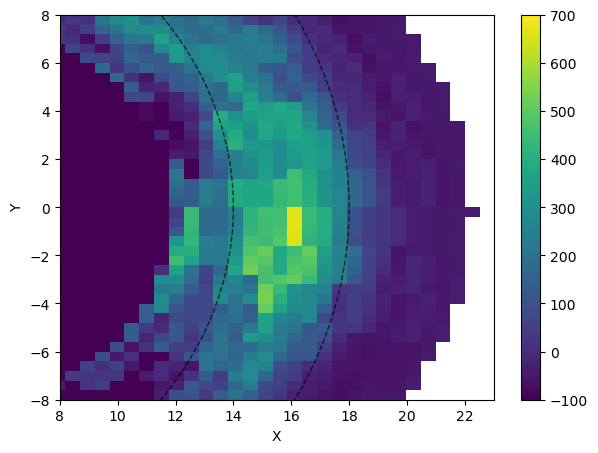

In [111]:
xy_val = [0,23, -10,10]

fig,ax = plt.subplots(1,1, figsize=(7,5))
pcm = ax.imshow(np.flip(cartesian_data, axis=1), origin='upper',
                vmax=700,
                vmin=-100,
                #norm='log',
                cmap = 'viridis', 
                extent=xy_val,
                aspect='auto')
ax.set_xlabel('X')
ax.set_ylabel('Y')
#ax.hlines(0,xy_val[0],xy_val[1],'k', linestyle='--')

ax.set_xlim(8,23)
ax.set_ylim(-8,8)

fig.colorbar(pcm, ax=ax)

#'''
circ = matplotlib.patches.Annulus((0,0), 18,4, ec='k', lw=1, linestyle='--',fill=False, alpha=0.7)
ax.add_patch(circ)

#circ = matplotlib.patches.Annulus((0,0), 22,12, ec='k', lw=1, linestyle='--',fill=False, alpha=0.7)
#ax.add_patch(circ)
#'''


In [112]:
np.sum(cartesian_data[np.where(cartesian_data>0)])

124995.06813815361

In [113]:
np.nansum(cartesian_data)

-406124.27832614124

In [114]:
-391112.576

-391112.576

# corrdinate tranformation test 2

In [106]:
rah = np.linspace(12, 23, np.shape(resid_2d)[1])
tah = (np.linspace(140, 220, np.shape(resid_2d)[0]))
zah = resid_2d

np.shape(resid_2d)

t[1] - t[0], t[2] - t[1]

(5.333333333333343, 5.333333333333314)

In [107]:
np.arange(len(r))

array([      0,       1,       2, ..., 5786663, 5786664, 5786665])

In [108]:
import numpy as np

import matplotlib
#matplotlib.use('Agg')
%matplotlib inline
import matplotlib.pyplot as plt

from scipy.interpolate import interp1d
from scipy.ndimage import map_coordinates


def polar2cartesian(r, t, grid, x, y, order=3):

    X, Y = np.meshgrid(x, y)

    new_r = np.sqrt(X*X+Y*Y)
    new_t = np.arctan2(X,Y) # og X,Y
    
    #print(new_t)
    #print(np.arctan2(Y,X))

    ir = interp1d(r, np.arange(len(r)), bounds_error=False)
    it = interp1d(t, np.arange(len(t)))

    new_ir = ir(new_r.ravel())
    #print(new_t)
    new_it = it(new_t.ravel())
    '''
    new_it= []
    ttt = new_t.ravel()
    print(np.rad2deg(t))
    print(np.rad2deg(ttt))
    for i in range(len(new_t.ravel())):
        print((ttt[i]))
        #try:
        new_it.append( it(ttt[i]) )
        #except:
        #new_it.append(np.nan)
    new_it = np.array(new_it)
    '''
    
    new_ir[new_r.ravel() > r.max()] = np.nan#len(r)-1
    new_ir[new_r.ravel() < r.min()] = np.nan

    return map_coordinates(grid, np.array([new_ir, new_it]),
                            order=order).reshape(new_r.shape)



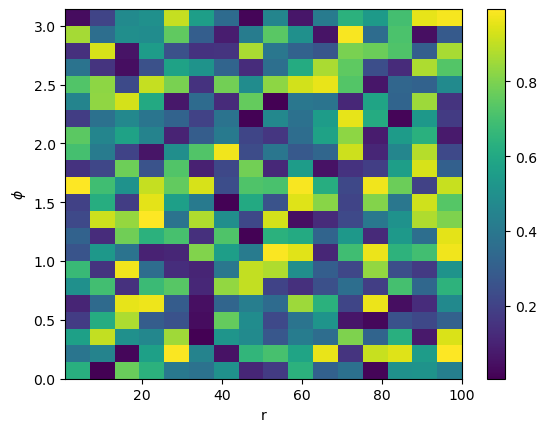

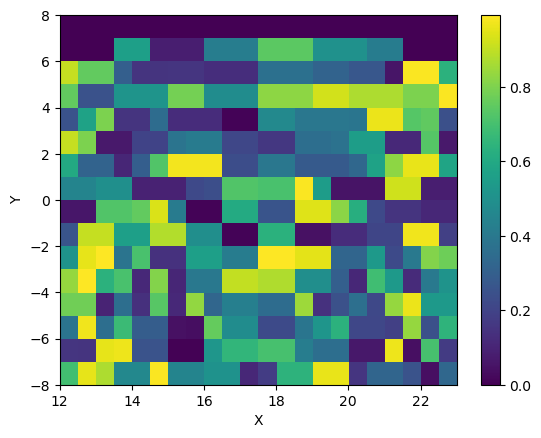

In [109]:
# Define original polar grid

nr = 22
nt = 16

rah = np.linspace(12,23, nr)
t = np.linspace(np.deg2rad(-40), np.deg2rad(40), nt)
z = np.random.random((nr, nt))

fig = plt.figure()
ax = fig.add_subplot(111)
pcm = ax.imshow(z, interpolation='nearest', origin='lower',
                #vmax=700,
                #vmin=-100,
                #norm='log',
                cmap = 'viridis', extent=[1,100, 0, np.pi],aspect='auto')
ax.set_xlabel('r')
ax.set_ylabel('$\phi$')
fig.colorbar(pcm, ax=ax)

#r = np.linspace(12, 23, np.shape(resid_2d)[1])
#t = np.deg2rad(np.linspace(140, 220, np.shape(resid_2d)[0]))
#z = resid_2d
# Define new cartesian grid

nx = 22
ny = 16

x = np.linspace(-8,8, nx)
y = np.linspace(12,23, ny)

#x = np.linspace(12,23, 22) # 22
#y = np.linspace(-8,8, 16) # 16

# Interpolate polar grid to cartesian grid (nearest neighbor)

fig = plt.figure()
ax = fig.add_subplot(111)
ah2dtest = polar2cartesian(rah, t, z, x, y, order=0)
pcm = ax.imshow(ah2dtest, interpolation='nearest', origin='lower',
                #vmax=700,
                #vmin=-100,
                #norm='log',
                cmap = 'viridis', extent=[12, 23, -8,8],aspect='auto')
ax.set_xlabel('X')
ax.set_ylabel('Y')
fig.colorbar(pcm, ax=ax)
#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/test1.png', dpi=400)


In [110]:
23-12

11

/tmp/ipykernel_1262908/904950863.py:59: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  pc = ax.pcolormesh(A, R, resid_2d.T, cmap="viridis", vmin=-100, vmax=600)


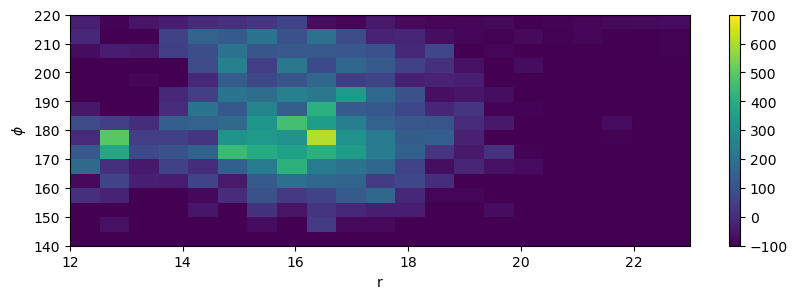

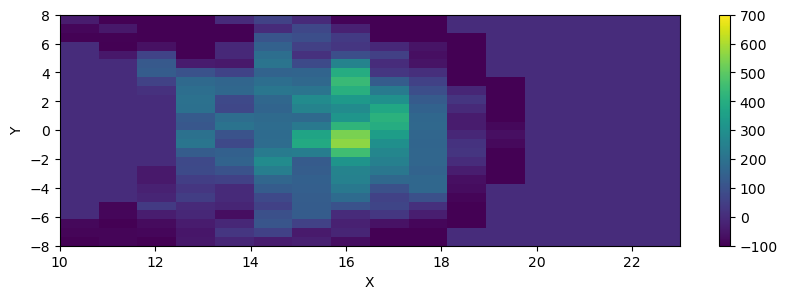

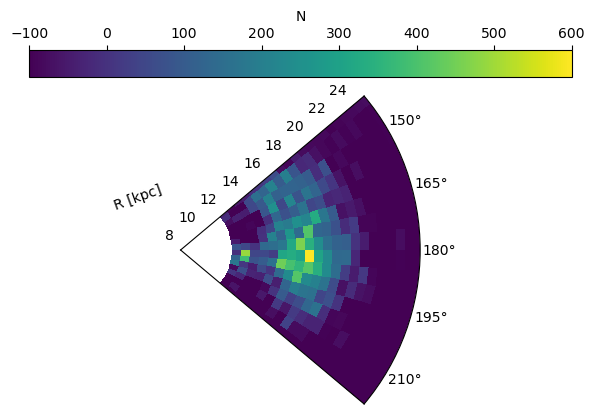

In [111]:
# Define original polar grid

nr = 22
nt = 16

rrr = np.linspace(12, 23, nr)
ttt = np.linspace(np.deg2rad(-40), np.deg2rad(40), nt)
zzz = resid_2d

fig,ax = plt.subplots(1,1, figsize=(10,3))
pcm = ax.imshow(z, interpolation='nearest', origin='upper',
                vmax=700,
                vmin=-100,
                #norm='log',
                cmap = 'viridis', extent=[12, 23, 140, 220],aspect='auto')
ax.set_xlabel('r')
ax.set_ylabel('$\phi$')
fig.colorbar(pcm, ax=ax)

#r = np.linspace(12, 23, np.shape(resid_2d)[1])
#t = np.deg2rad(np.linspace(140, 220, np.shape(resid_2d)[0]))
#z = resid_2d
# Define new cartesian grid

nx = (23-10)*2 # around 22
ny = 16

xxx = np.linspace(-8, 8, nx)
yyy = np.linspace(10, 23, ny)

#x = np.linspace(12,23, 22) # 22
#y = np.linspace(-8,8, 16) # 16

# Interpolate polar grid to cartesian grid (nearest neighbor)

fig,ax = plt.subplots(1,1, figsize=(10,3))
ah2dtest = polar2cartesian(rrr, ttt, zzz, xxx, yyy, order=3)
pcm = ax.imshow(ah2dtest.T, interpolation='nearest', origin='upper',
                vmax=700,
                vmin=-100,
                #norm='log',
                cmap = 'viridis', extent=[10, 23, -8,8],aspect='auto')
ax.set_xlabel('X')
ax.set_ylabel('Y')
fig.colorbar(pcm, ax=ax)
#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/test1.png', dpi=400)


# define binning
rbins = np.linspace(12, 25, np.shape(resid_2d)[1])
abins = np.deg2rad(np.linspace(140, 220, np.shape(resid_2d)[0]))

A, R = np.meshgrid(abins, rbins)


# plot
fig, ax = plt.subplots(1, figsize=(7,5),subplot_kw=dict(projection="polar"))

pc = ax.pcolormesh(A, R, resid_2d.T, cmap="viridis", vmin=-100, vmax=600)
fig.colorbar(pc, ax=ax, location='top', label='N')

ax.set_rlim(8, 25)
ax.set_thetalim(abins[0], abins[-1])
ax.set_theta_zero_location("W")
ax.set_theta_direction(-1)
ax.set_rlabel_position(-50)
rlab = ax.set_ylabel("R [kpc]")
rlab.set_position((-100.0, 0.65))
rlab.set_rotation(20)
#ax.grid(True)
plt.show()

# take 3

In [106]:
from scipy.ndimage import map_coordinates as mp

# Auxiliary function to map polar data to a cartesian plane
def polar_to_cart(polar_data, theta_step, range_step, x, y):

    # "x" and "y" are numpy arrays with the desired cartesian coordinates
    # we make a meshgrid with them
    X, Y = np.meshgrid(x, y)

    # Now that we have the X and Y coordinates of each point in the output plane
    # we can calculate their corresponding theta and range
    Tc = np.rad2deg(np.arctan2(X, Y)).ravel() # <-- Deliberate XY to induce transpose
    Rc = np.hypot(X,Y).ravel() # <-- Equal to np.sqrt(X**2 + Y**2)

    # Negative angles are corrected
    #Tc[Tc < 0] = 360 + Tc[Tc < 0]

    # Using the known theta and range steps, the coordinates are mapped to
    # those of the data grid
    Tc = Tc / theta_step
    Rc = Rc / range_step

    # An array of polar coordinates is created stacking the previous arrays
    coords = np.vstack((Tc, Rc))

    # The data is mapped to the new coordinates
    # Values outside range are substituted with nans
    cart_data = mp(polar_data, coords, mode="grid-wrap", cval=np.nan, prefilter=False)

    # The data is reshaped and returned
    return(cart_data.reshape(len(x), len(y)))



In [107]:
resid_2d[0][1] - resid_2d[0][0]

19.97383743769575

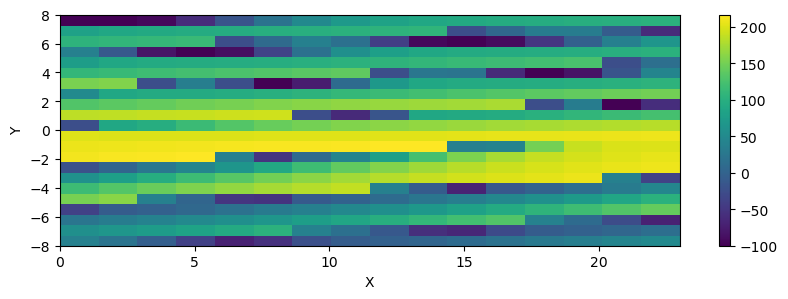

In [108]:
polar_data = resid_2d # Here a 2D array of data is assumed, with shape thetas x ranges

# We create the x and y axes of the output cartesian data
#x = y = np.arange(-100000, 100000, 1000)
x_dense = np.linspace(12,23, 21) # 22
y_dense = np.linspace(-8,8, 16) # 16

xy_val = [0, 23, -8,8]

x_dense = np.linspace(xy_val[0],xy_val[1], 22) # 22
y_dense = np.linspace(xy_val[2], xy_val[3], 16) # 16

# We call the mapping function assuming 1 degree of theta step and 500 meters of
# range step. The default order of 3 is used.
cart_data = polar_to_cart(polar_data, 10, 200, x_dense, y_dense)

fig,ax = plt.subplots(1,1, figsize=(10,3))
pcm = ax.imshow(cart_data, origin='lower',
                #vmax=700,
                vmin=-100,
                #norm='log',
                cmap = 'viridis', extent=xy_val,aspect='auto')
ax.set_xlabel('X')
ax.set_ylabel('Y')
fig.colorbar(pcm, ax=ax)

In [109]:
12*np.cos(np.deg2rad(190)), 12*np.sin(np.deg2rad(190))

(-11.817693036146496, -2.0837781320031654)

In [125]:
cart_conversion = coord.spherical_to_cartesian(r = 12* u.kpc,
                   lon= np.deg2rad(150),
                   lat = np.deg2rad(0))

x_test = -cart_conversion[0].value
y_test = cart_conversion[1].value

print(x_test, y_test)

10.392304845413264 5.999999999999999


In [126]:
cart_conversion = coord.cartesian_to_spherical(x = -12* u.kpc,
                   y= 8* u.kpc,
                   z = 0* u.kpc)

cart_conversion[0].value, np.rad2deg(cart_conversion[2].value)

(14.422205101855956, 146.30993247402023)

# hard code, linear median between gaps

(16, 21)


(27095.79987770001, 35098.46044311984, 43101.12100853967)

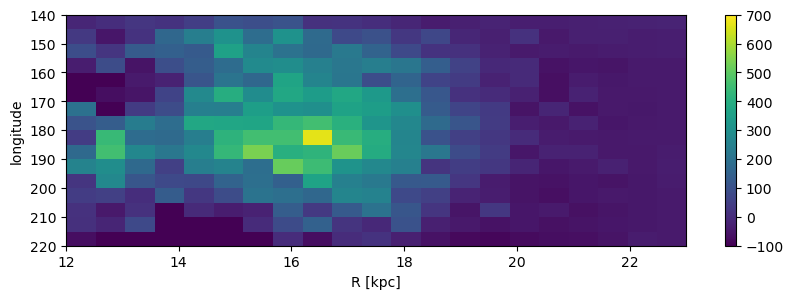

In [112]:
print(np.shape(resid_2d))

r_dense = np.linspace(12, 23, np.shape(resid_2d)[1]+1)
longi_dense = np.linspace(140, 220, np.shape(resid_2d)[0]+1)

fig,ax = plt.subplots(1,1, figsize=(10,3))
pcm = ax.imshow(resid_2d, origin='upper',
                vmax=700,
                vmin=-100,
                #norm='log',
                cmap = 'viridis', extent=[12,23,220, 140],aspect='auto')
ax.set_xlabel('R [kpc]')
ax.set_ylabel('longitude')
fig.colorbar(pcm, ax=ax)

np.nansum(resid_2d), np.nansum(resid_2d[np.where(resid_2d>0)]), np.nansum(np.abs(resid_2d))

15
16 21


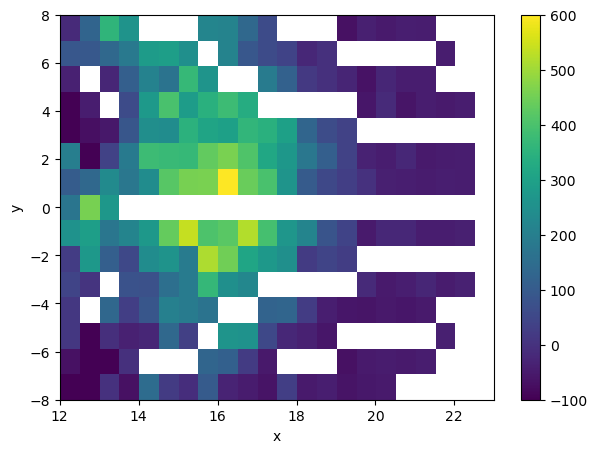

In [174]:
# matches the other plots below the range and bin numbers
num_x = 22
num_y = 15

x_dense = np.linspace(12,23, num_x) # 22
y_dense = np.linspace(-8,8, num_y) # 16

print(len(y_dense))

resid_2d_XY = np.zeros((num_x,num_y))
resid_2d_XY[:] = np.nan

print(len(resid_2d[:,0]), len(resid_2d[0]))

for i in range(len(resid_2d[:,0])): # len(resid_2d[:,0] 8 rows
    for j in range(len(resid_2d[0])): # len(resid_2d[0] 47 columns
        #print(i, j)
        
        x_test = -r_dense[j]*np.cos(np.deg2rad(longi_dense[i]))
        y_test = r_dense[j]*np.sin(np.deg2rad(longi_dense[i]))
        
        #print(x_test, y_test,resid_2d[i,j])
        
        x_index = np.digitize(x_test,x_dense, right=True) # tells us the index that the x_test is in of x_dense bins
        y_index = np.digitize(y_test,y_dense, right=True)

        #print(y_index)

        if y_index >= num_y:
            continue
        
        if np.isnan(resid_2d_XY[x_index, y_index]) == True:
            resid_2d_XY[x_index, y_index] = resid_2d[i,j]
        '''
        elif np.isnan(resid_2d_XY[x_index, y_index-1]) == True:
            #print(x_index, y_index-1)
            resid_2d_XY[x_index, y_index-1] = resid_2d[i,j]
        
        elif np.isnan(resid_2d_XY[x_index-1, y_index]) == True:
            resid_2d_XY[x_index-1, y_index] = resid_2d[i,j]
        elif np.isnan(resid_2d_XY[x_index-1, y_index-1]) == True:
            resid_2d_XY[x_index-1, y_index-1] = resid_2d[i,j]
        '''    

fig,ax = plt.subplots(1,1, figsize=(7,5))
pcm = ax.imshow(resid_2d_XY.T, origin='lower',
                vmax=600,
                vmin=-100,
                #norm='log',
                cmap = 'viridis', extent=[12,23,-8,8],aspect='auto')
ax.set_xlabel('x')
ax.set_ylabel('y')
fig.colorbar(pcm, ax=ax)




/global/common/software/desi/perlmutter/desiconda/20230111-2.1.0/conda/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1218: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,


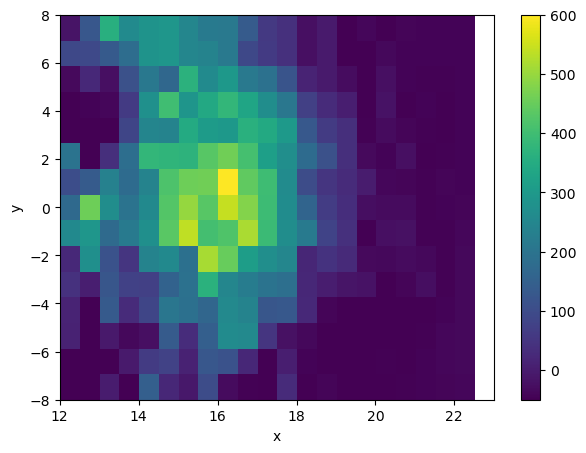

In [175]:
# fill in the gaps with median value
empty_indx = np.where(np.isnan(resid_2d_XY)==True)
#print(empty_indx[0])

for i in range(len(empty_indx[0])):
    for j in range(len(empty_indx[1])):
        xindx = empty_indx[0][i]
        yindx= empty_indx[1][j]
        if yindx < num_y-1:
            if np.isnan(resid_2d_XY[xindx, yindx]) == True:
                #print(resid_2d_XY[xindx, yindx-1], resid_2d_XY[xindx, yindx+1]) 
                resid_2d_XY[xindx, yindx] = np.nanmedian([resid_2d_XY[xindx, yindx-1], resid_2d_XY[xindx, yindx+1]])
        else:
            if np.isnan(resid_2d_XY[xindx, yindx]) == True:
                resid_2d_XY[xindx, yindx] = np.nanmedian([resid_2d_XY[xindx, yindx-1]])

fig,ax = plt.subplots(1,1, figsize=(7,5))
pcm = ax.imshow(resid_2d_XY.T, origin='lower',
                vmax=600,
                vmin=-50,
                #norm='log',
                cmap = 'viridis', extent=[12,23,-8,8],aspect='auto')
ax.set_xlabel('x')
ax.set_ylabel('y')
fig.colorbar(pcm, ax=ax)

In [176]:
np.nansum(resid_2d_XY), np.nansum(resid_2d_XY[np.where(resid_2d_XY>0)])

(30396.772910531894, 36899.267316266276)

# make bins smaller!

(16, 21)
(32, 42)


(26456.0, 34748.0, 43040.0)

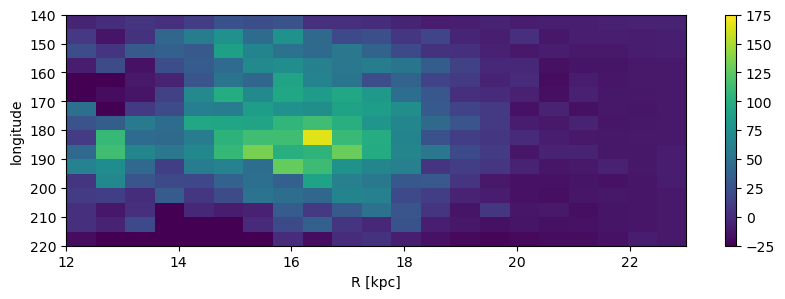

In [140]:
print(np.shape(resid_2d))


resize_resid_2d = resid_2d[np.arange(len(resid_2d)*2)//2][:,np.arange(resid_2d.shape[1]*2)//2]
resize_resid_2d = resize_resid_2d//4
print(np.shape(resize_resid_2d))

r_dense = np.linspace(12, 23, np.shape(resize_resid_2d)[1]+1)
longi_dense = np.linspace(140, 220, np.shape(resize_resid_2d)[0]+1)


fig,ax = plt.subplots(1,1, figsize=(10,3))
pcm = ax.imshow(resize_resid_2d, origin='upper',
                vmax=700//4,
                vmin=-100//4,
                #norm='log',
                cmap = 'viridis', extent=[12,23,220, 140],aspect='auto')
ax.set_xlabel('R [kpc]')
ax.set_ylabel('longitude')
fig.colorbar(pcm, ax=ax)


np.nansum(resize_resid_2d), np.nansum(resize_resid_2d[np.where(resize_resid_2d>0)]), np.nansum(np.abs(resize_resid_2d))

16
32 42


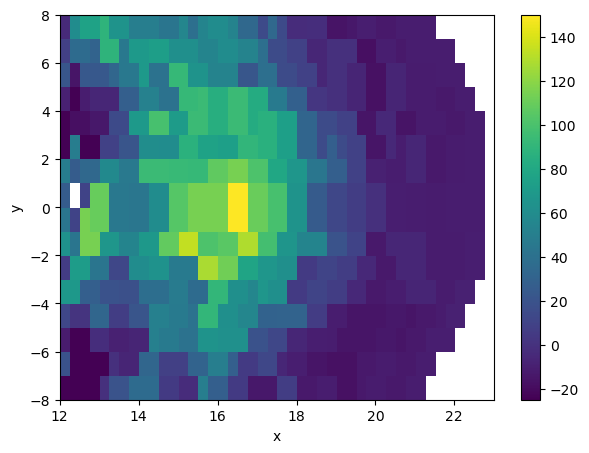

In [147]:
num_x = 22*2 # 22
num_y = 16

x_dense = np.linspace(12,23, num_x) # 22
y_dense = np.linspace(-8,8, num_y) # 16

print(len(y_dense))

resid_2d_XY = np.zeros((num_x,num_y))
resid_2d_XY[:] = np.nan

print(len(resize_resid_2d[:,0]), len(resize_resid_2d[0]))

for i in range(len(resize_resid_2d[:,0])): # len(resid_2d[:,0] 8 rows
    for j in range(len(resize_resid_2d[0])): # len(resid_2d[0] 47 columns
        #print(i, j)
        
        x_test = -r_dense[j]*np.cos(np.deg2rad(longi_dense[i]))
        y_test = r_dense[j]*np.sin(np.deg2rad(longi_dense[i]))
        
        #print(x_test, y_test,resid_2d[i,j])
        
        x_index = np.digitize(x_test,x_dense, right=True) # tells us the index that the x_test is in of x_dense bins
        y_index = np.digitize(y_test,y_dense, right=True)

        #print(y_index)

        if y_index >= num_y:
            continue
        
        if np.isnan(resid_2d_XY[x_index, y_index]) == True:
            resid_2d_XY[x_index, y_index] = resize_resid_2d[i,j]
        
        '''
        elif np.isnan(resid_2d_XY[x_index, y_index-1]) == True:
            #print(x_index, y_index-1)
            resid_2d_XY[x_index, y_index-1] = resid_2d[i,j]
        
        elif np.isnan(resid_2d_XY[x_index-1, y_index]) == True:
            resid_2d_XY[x_index-1, y_index] = resid_2d[i,j]
        elif np.isnan(resid_2d_XY[x_index-1, y_index-1]) == True:
            resid_2d_XY[x_index-1, y_index-1] = resid_2d[i,j]
        '''    

fig,ax = plt.subplots(1,1, figsize=(7,5))
pcm = ax.imshow(resid_2d_XY.T, origin='lower',
                vmax=600//4,
                vmin=-100//4,
                #norm='log',
                cmap = 'viridis', extent=[12,23,-8,8],aspect='auto')
ax.set_xlabel('x')
ax.set_ylabel('y')
fig.colorbar(pcm, ax=ax)



In [148]:
np.nansum(resid_2d_XY), np.nansum(resid_2d_XY[np.where(resid_2d_XY>0)]),  np.nansum(np.abs(resid_2d_XY))

(18409.0, 21521.0, 24633.0)

# make bins smaller and divide count number

(16, 21)
(32, 42)
26456.0 34748.0 43040.0
27095.79987770001 35098.46044311984


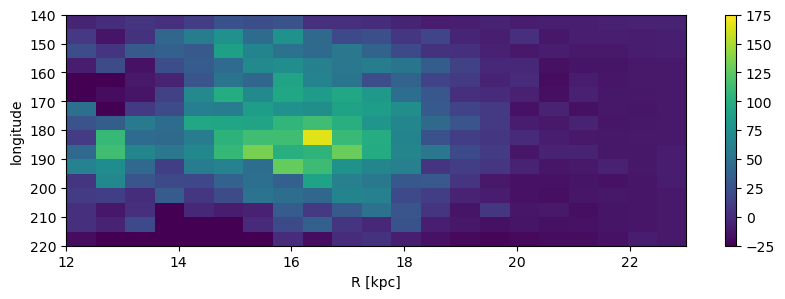

In [553]:
print(np.shape(resid_2d))


resize_resid_2d = resid_2d[np.arange(len(resid_2d)*2)//2][:,np.arange(resid_2d.shape[1]*2)//2]
print(np.shape(resize_resid_2d))

ary = resid_2d
aarryy=np.zeros((32, 42))
for i in range(len(ary)):
    #print(ary[i])
    for j in range(len(ary[i])):
        #print(ary[i][j])
        aarryy[i*2][j*2]=ary[i][j]//4
        aarryy[i*2][j*2+1]=ary[i][j]//4
    aarryy[i*2+1]=aarryy[i*2]

resize_resid_2d = aarryy


r_dense = np.linspace(12, 23, np.shape(resize_resid_2d)[1]+1)
longi_dense = np.linspace(140, 220, np.shape(resize_resid_2d)[0]+1)


fig,ax = plt.subplots(1,1, figsize=(10,3))
pcm = ax.imshow(resize_resid_2d, origin='upper',
                vmax=700//4,
                vmin=-100//4,
                #norm='log',
                cmap = 'viridis', extent=[12,23,220, 140],aspect='auto')
ax.set_xlabel('R [kpc]')
ax.set_ylabel('longitude')
fig.colorbar(pcm, ax=ax)


print(np.nansum(resize_resid_2d), np.nansum(resize_resid_2d[np.where(resize_resid_2d>0)]), np.nansum(np.abs(resize_resid_2d)))
print(np.nansum(resid_2d), np.nansum(resid_2d[np.where(resid_2d>0)]))

# test make the bins even smaller!!


(64, 84)
24432.0
24432.0 33584.0 42736.0
27095.79987770001 35098.46044311984


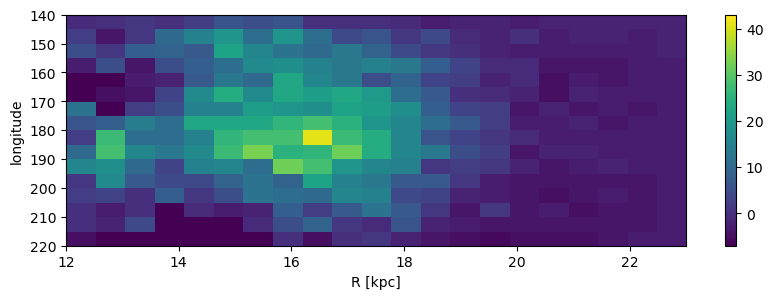

In [554]:
resize_x_4_resid_2d = resize_resid_2d[np.arange(len(resize_resid_2d)*2)//2][:,np.arange(resize_resid_2d.shape[1]*2)//2]
print(np.shape(resize_x_4_resid_2d))

print(np.nansum(resize_x_4_resid_2d//4))

ary = resize_resid_2d
aarryy=np.zeros(np.shape(resize_x_4_resid_2d))
for i in range(len(ary)):
    #print(ary[i])
    for j in range(len(ary[i])):
        #print(ary[i][j])
        aarryy[i*2][j*2]=ary[i][j]//4
        aarryy[i*2][j*2+1]=ary[i][j]//4
    aarryy[i*2+1]=aarryy[i*2]

resize_x_4_resid_2d = aarryy


r_dense = np.linspace(12, 23, np.shape(resize_x_4_resid_2d)[1]+1)
longi_dense = np.linspace(140, 220, np.shape(resize_x_4_resid_2d)[0]+1)


fig,ax = plt.subplots(1,1, figsize=(10,3))
pcm = ax.imshow(resize_x_4_resid_2d, origin='upper',
                vmax=700//16,
                vmin=-100//16,
                #norm='log',
                cmap = 'viridis', extent=[12,23,220, 140],aspect='auto')
ax.set_xlabel('R [kpc]')
ax.set_ylabel('longitude')
fig.colorbar(pcm, ax=ax)


print(np.nansum(resize_x_4_resid_2d), np.nansum(resize_x_4_resid_2d[np.where(resize_x_4_resid_2d>0)]), np.nansum(np.abs(resize_x_4_resid_2d)))
print(np.nansum(resid_2d), np.nansum(resid_2d[np.where(resid_2d>0)]))

###### MAKE NOTE OF VARIABLE CHANGE#########
############################################
resize_resid_2d = resize_x_4_resid_2d

16
len (44, 16)
len of r, l 64 84


(24552.0, 30938.0, 37324.0)

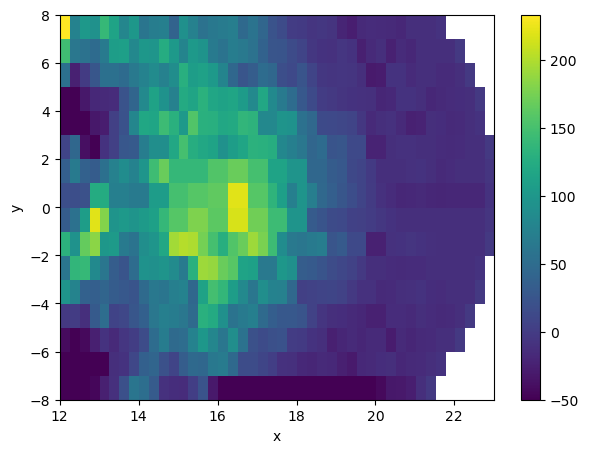

In [650]:

num_x = 22*2 # 22
num_y = 16
x_min = 12

x_dense = np.linspace(x_min,23, num_x) # 22
y_dense = np.linspace(-8,8, num_y) # 16

print(len(y_dense))

resid_2d_XY = np.zeros((num_x,num_y))
resid_2d_XY[:] = np.nan

testing_filling_XY = np.copy(resid_2d_XY)

print('len', np.shape(resid_2d_XY))

print('len of r, l',len(resize_resid_2d[:,0]), len(resize_resid_2d[0]))

for i in range(len(resize_resid_2d[:,0])): # len(resid_2d[:,0] 8 rows
    for j in range(len(resize_resid_2d[0])): # len(resid_2d[0] 47 columns
        #print(i, j)

        
        #print(r_dense[j], longi_dense[i])
        x_test = -r_dense[j]*np.cos(np.deg2rad(longi_dense[i]))
        y_test = r_dense[j]*np.sin(np.deg2rad(longi_dense[i]))

        #print(x_test, y_test)
                
        #if (y_test < -9) or (y_test > 9):
       #     print('continued')
        #    continue
        if x_test < x_min-1:
            continue

        
        x_index = np.digitize(x_test,x_dense, right=True) # tells us the index that the x_test is in of x_dense bins
        y_index = np.digitize(y_test,y_dense, right=True)

        #print(y_index)

        if y_index >= num_y:
            #print('first cont')
            continue
            #y_index = num_y-1

        #print(i, j)
        #print(x_test, y_test,resize_resid_2d[i,j])

        #print(resid_2d_XY[x_index, y_index])
        if np.isnan(resid_2d_XY[x_index, y_index]) == True:
            resid_2d_XY[x_index, y_index] = resize_resid_2d[i,j]
            testing_filling_XY[x_index, y_index] = 1
        else:
            #print('added to', x_test, y_test)
            resid_2d_XY[x_index, y_index] += resize_resid_2d[i,j]
            testing_filling_XY[x_index, y_index] +=1

        
    

fig,ax = plt.subplots(1,1, figsize=(7,5))
pcm = ax.imshow(resid_2d_XY.T, origin='lower',
                #vmax=600//1.5,
                vmin=-100//2,
                #norm='log',
                cmap = 'viridis', extent=[x_min,23,-8,8],aspect='auto',)
ax.set_xlabel('x')
ax.set_ylabel('y')
fig.colorbar(pcm, ax=ax)


np.nansum(resid_2d_XY), np.nansum(resid_2d_XY[np.where(resid_2d_XY>0)]), np.nansum(np.abs(resid_2d_XY))



In [651]:
np.nansum(resid_2d_XY), np.nansum(resid_2d_XY[np.where(resid_2d_XY>0)])

(24552.0, 30938.0)

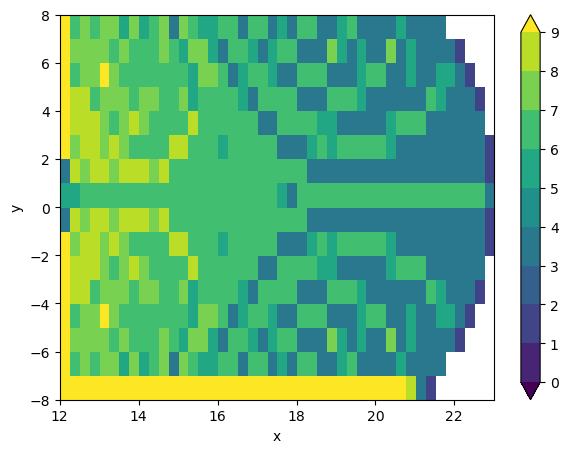

In [652]:
colormap = mpl.cm.viridis
bounds = [0,1,2,3,4,5,6,7,8,9,]
norm = mpl.colors.BoundaryNorm(bounds, colormap.N, extend='both')



fig,ax = plt.subplots(1,1, figsize=(7,5))
pcm = ax.imshow(testing_filling_XY.T, origin='lower',
                #vmax=2,
                #vmin=-100//1,
                norm=norm,
                cmap = 'viridis', extent=[x_min,23,-8,8],aspect='auto')
ax.set_xlabel('x')
ax.set_ylabel('y')
fig.colorbar(pcm, ax=ax)

In [653]:
# decrease resolution to match the other XY plots
def shrink(data, rows, cols):
    print(data.shape[0]//rows)
    print(data.shape[1]//cols)
    return data.reshape(rows, data.shape[0]//rows, cols, data.shape[1]//cols).sum(axis=1).sum(axis=2)

In [654]:
resid_2d_XY = shrink(resid_2d_XY, 22,16)

2
1


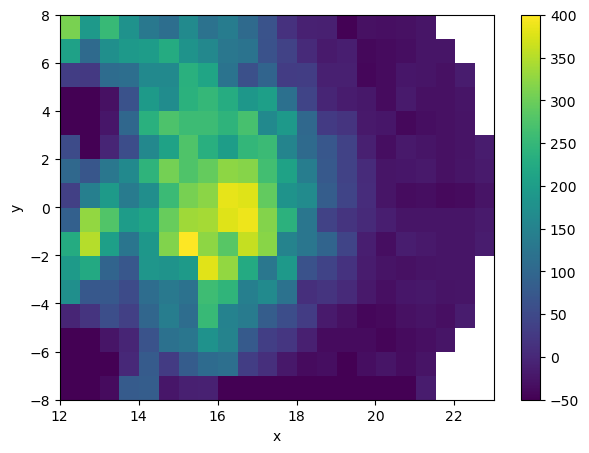

In [657]:
fig,ax = plt.subplots(1,1, figsize=(7,5))
pcm = ax.imshow(resid_2d_XY.T, origin='lower',
                #vmax=600//1.5,
                vmin=-100//2,
                #norm='log',
                cmap = 'viridis', extent=[x_min,23,-8,8],aspect='auto',)
ax.set_xlabel('x')
ax.set_ylabel('y')
fig.colorbar(pcm, ax=ax)

In [658]:
np.nansum(resid_2d_XY), np.nansum(resid_2d_XY[np.where(resid_2d_XY>0)]),  np.nansum(np.abs(resid_2d_XY))

(24600.0, 30825.0, 37050.0)

In [659]:
'''
# fill in the gaps
empty_indx = np.where(np.isnan(resid_2d_XY)==True)
#print(empty_indx[0])


for i in range(len(empty_indx[0])):
    for j in range(len(empty_indx[1])):
        xindx = empty_indx[0][i]
        yindx= empty_indx[1][j]
        if yindx < num_y-1:
            if np.isnan(resid_2d_XY[xindx, yindx]) == True:
                #print(resid_2d_XY[xindx, yindx-1], resid_2d_XY[xindx, yindx+1]) 
                resid_2d_XY[xindx, yindx] = np.nanmedian([resid_2d_XY[xindx, yindx-1], resid_2d_XY[xindx, yindx+1]])
        else:
            if np.isnan(resid_2d_XY[xindx, yindx]) == True:
                resid_2d_XY[xindx, yindx] = np.nanmedian([resid_2d_XY[xindx, yindx-1]])
fig,ax = plt.subplots(1,1, figsize=(7,5))
pcm = ax.imshow(resid_2d_XY.T, origin='lower',
                vmax=600,
                vmin=-100,
                #norm='log',
                cmap = 'viridis', extent=[12,23,-8,8],aspect='auto')
ax.set_xlabel('x')
ax.set_ylabel('y')
fig.colorbar(pcm, ax=ax)
'''

"\n# fill in the gaps\nempty_indx = np.where(np.isnan(resid_2d_XY)==True)\n#print(empty_indx[0])\n\n\nfor i in range(len(empty_indx[0])):\n    for j in range(len(empty_indx[1])):\n        xindx = empty_indx[0][i]\n        yindx= empty_indx[1][j]\n        if yindx < num_y-1:\n            if np.isnan(resid_2d_XY[xindx, yindx]) == True:\n                #print(resid_2d_XY[xindx, yindx-1], resid_2d_XY[xindx, yindx+1]) \n                resid_2d_XY[xindx, yindx] = np.nanmedian([resid_2d_XY[xindx, yindx-1], resid_2d_XY[xindx, yindx+1]])\n        else:\n            if np.isnan(resid_2d_XY[xindx, yindx]) == True:\n                resid_2d_XY[xindx, yindx] = np.nanmedian([resid_2d_XY[xindx, yindx-1]])\nfig,ax = plt.subplots(1,1, figsize=(7,5))\npcm = ax.imshow(resid_2d_XY.T, origin='lower',\n                vmax=600,\n                vmin=-100,\n                #norm='log',\n                cmap = 'viridis', extent=[12,23,-8,8],aspect='auto')\nax.set_xlabel('x')\nax.set_ylabel('y')\nfig.colorba

In [660]:
# Array for reduccing size
in3 = np.arange(0, 24).reshape(6, 4)
# Divider as a tuple
div = (2,1)
# Conver tuple to numpy array
DIV = np.asanyarray(div)
# Calculating new shape
ns = in3.shape//DIV
# array([3, 4])
#Stack these to arrays as a columns
cs = np.column_stack([ns, DIV])
#array([[3, 2],
#       [4, 1]])
# Flattent this array by rows
rs = cs.ravel()
# array([3, 2, 4, 1])
# generate tuple of new axis, we need to make list of 1, 3, 5, 7, etc
ax = tuple(range(1,DIV.size*2,2))
# (1, 3)
# join all these data together
new = in3.reshape(rs).mean(axis=ax)
print(new)

[[ 2.  3.  4.  5.]
 [10. 11. 12. 13.]
 [18. 19. 20. 21.]]


In [661]:
np.nansum(resid_2d_XY), np.nansum(resid_2d_XY[np.where(resid_2d_XY>0)])

(24600.0, 30825.0)

Text(0, 0.5, 'Y')

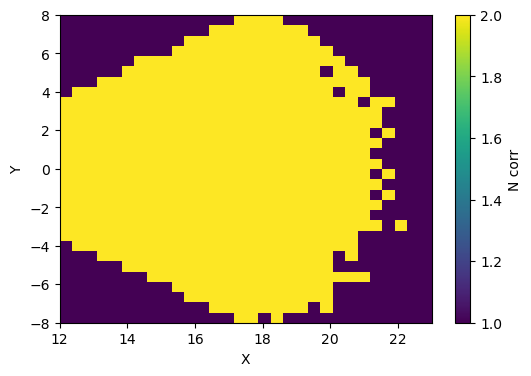

In [128]:
nxbins = 22 #num_x #22#30 # 22
nybins = 16 #num_y #16#30 # 16
rangearr=[[12, 23],[-8,8]]
binsarr = np.array([nxbins, nybins])


#slice_index_lower = np.where((l_cutind500_disk>140)&(l_cutind500_disk<145))

bin_xy = scipy.stats.binned_statistic_2d(galac_xind500_disk,
                                           galac_yind500_disk,
                                           completeness_ind500_disk,
                                           'count', bins=binsarr,
                                           range = rangearr)



# plotting
fig, ax = plt.subplots(1,figsize=(6,4))
pcm = ax.imshow(bin_xy.statistic.T,
                origin='lower',
                vmax=2,
                vmin=1,
                #norm='log',
                cmap = 'viridis', extent=[12,23,-8,8],aspect='auto')
fig.colorbar(pcm, ax=ax, location='right', label='N corr')
#ax.grid(True)
ax.set_xlabel('X')
ax.set_ylabel('Y')
#ax.set_xlim(12,23)

In [129]:
ls_0idx = np.where(bin_xy.statistic <= 0)
bin_xy.statistic[ls_0idx] = np.nan

gr_0idx = np.where(bin_xy.statistic > 0)
bin_xy.statistic[gr_0idx] = 1

bin_mask = bin_xy.statistic


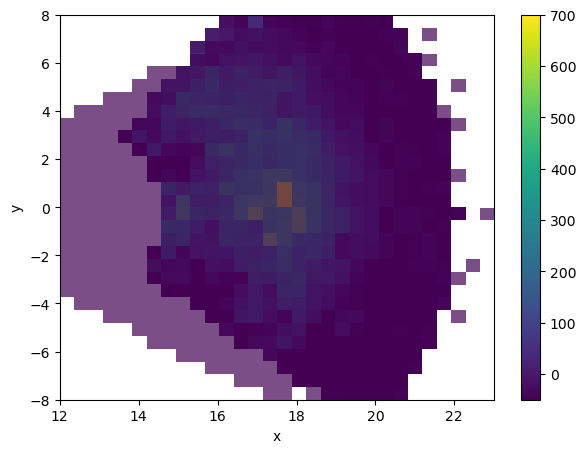

In [130]:
fig,ax = plt.subplots(1,1, figsize=(7,5))
pcm = ax.imshow(np.flip(cartesian_data, axis=1), origin='upper',
                vmax=700,
                vmin=-50,
                #norm='log',
                cmap = 'viridis', extent=[12,23,-8,8],aspect='auto')
ax.set_xlabel('x')
ax.set_ylabel('y')
fig.colorbar(pcm, ax=ax)

pcm = ax.imshow(bin_mask.T,
                origin='lower',
                vmax=2,
                vmin=1,
                #norm='log',
                alpha=0.7,
                cmap = 'viridis', extent=[12,23,-8,8],aspect='auto')

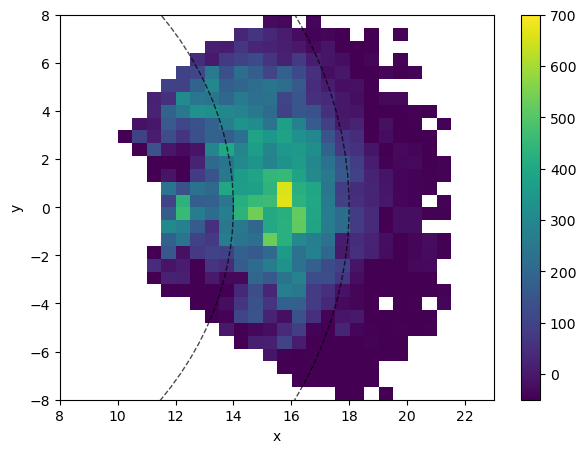

In [134]:
multiplied_mask_overdense1 = np.flip(cartesian_data, axis=1)* bin_mask.T

fig,ax = plt.subplots(1,1, figsize=(7,5))
pcm = ax.imshow(multiplied_mask_overdense1, origin='upper',
                vmax=700,
                vmin=-50,
                #norm='log',
                cmap = 'viridis', extent=[8,23,-8,8],aspect='auto')
ax.set_xlabel('x')
ax.set_ylabel('y')
fig.colorbar(pcm, ax=ax)
#ax.set_xlim(12,23)

circ = matplotlib.patches.Annulus((0,0), 18,4, ec='k', lw=1, linestyle='--',fill=False, alpha=0.7)
ax.add_patch(circ)

In [ ]:
np.nansum(multiplied_mask_overdense1), np.nansum(multiplied_mask_overdense1[np.where(multiplied_mask_overdense1>0)])

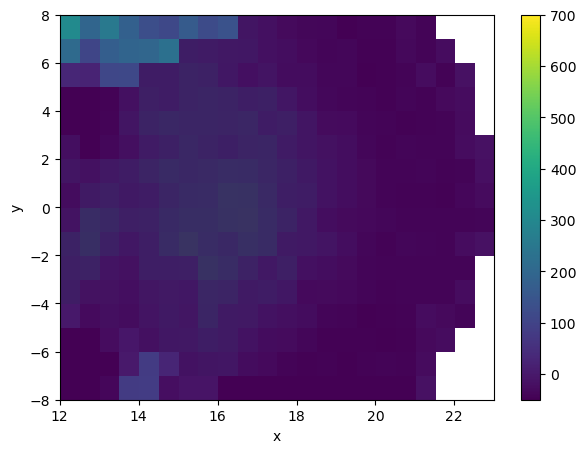

In [673]:
fig,ax = plt.subplots(1,1, figsize=(7,5))
pcm = ax.imshow(resid_2d_XY.T, origin='lower',
                vmax=700,
                vmin=-50,
                #norm='log',
                cmap = 'viridis', extent=[12,23,-8,8],aspect='auto')
ax.set_xlabel('x')
ax.set_ylabel('y')
fig.colorbar(pcm, ax=ax)

pcm = ax.imshow(bin_mask.T,
                origin='lower',
                vmax=2,
                vmin=1,
                #norm='log',
                alpha=0.7,
                cmap = 'viridis', extent=[12,23,-8,8],aspect='auto')

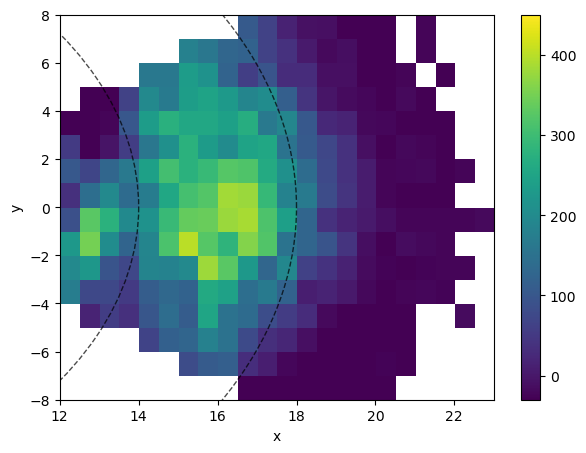

In [688]:

multiplied_mask_overdense1 = resid_2d_XY* bin_mask

fig,ax = plt.subplots(1,1, figsize=(7,5))
pcm = ax.imshow(multiplied_mask_overdense1.T, origin='lower',
                vmax=450,
                vmin=-30,
                #norm='log',
                cmap = 'viridis', extent=[12,23,-8,8],aspect='auto')
ax.set_xlabel('x')
ax.set_ylabel('y')
fig.colorbar(pcm, ax=ax)

circ = matplotlib.patches.Annulus((0,0), 18,4, ec='k', lw=1, linestyle='--',fill=False, alpha=0.7)
ax.add_patch(circ)

In [689]:
np.nansum(multiplied_mask_overdense1), np.nansum(multiplied_mask_overdense1[np.where(multiplied_mask_overdense1>0)]), np.nansum(np.abs(multiplied_mask_overdense1))

(23699.0, 27567.0, 31435.0)

In [134]:
# linear average to fill in gaps??

In [135]:
x_dense

array([12.        , 12.52380952, 13.04761905, 13.57142857, 14.0952381 ,
       14.61904762, 15.14285714, 15.66666667, 16.19047619, 16.71428571,
       17.23809524, 17.76190476, 18.28571429, 18.80952381, 19.33333333,
       19.85714286, 20.38095238, 20.9047619 , 21.42857143, 21.95238095,
       22.47619048, 23.        ])

In [139]:
# matches the other plots below the range and bin numbers
x_dense = bin_xy.x_edge # 22
y_dense = bin_xy.y_edge # 16

print(len(y_dense))

resid_2d_XY = np.zeros((22,16))
resid_2d_XY[:] = np.nan

for i in range(len(resid_2d[:,0])): # 16 rows
    for j in range(len(resid_2d[0])): # 21 columns
        #print(i, j)
        
        #x_test = -r_dense[j]*np.cos(np.deg2rad(longi_dense[i]))
        #y_test = r_dense[j]*np.sin(np.deg2rad(longi_dense[i]))

        cart_conversion = coord.spherical_to_cartesian(r = r_dense[j]* u.kpc,
                   lon= np.deg2rad(longi_dense[i]),
                   lat = np.deg2rad(0))

        x_test = -cart_conversion[0].value
        y_test = cart_conversion[1].value
        
        #print(x_test, y_test,resid_2d[i,j])
        
        x_index = np.digitize(x_test,x_dense, right=True) # tells us the index that the x_test is in of x_dense bins
        y_index = np.digitize(y_test,y_dense, right=True)

        #print(y_index)

        if y_index >= 16:
            continue
        
        if np.isnan(resid_2d_XY[x_index, y_index]) == True:
            resid_2d_XY[x_index, y_index] = resid_2d[i,j]
            resid_2d_XY[x_index, y_index-1] = resid_2d[i,j]
            resid_2d_XY[x_index-1, y_index-1] = resid_2d[i,j]
            resid_2d_XY[x_index-1, y_index] = resid_2d[i,j]
        #'''
        elif np.isnan(resid_2d_XY[x_index, y_index-1]) == True:
            #print(x_index, y_index-1)
            resid_2d_XY[x_index, y_index-1] = resid_2d[i,j]
            resid_2d_XY[x_index-1, y_index-1] = resid_2d[i,j]
        #'''
        elif np.isnan(resid_2d_XY[x_index-1, y_index]) == True:
            resid_2d_XY[x_index-1, y_index] = resid_2d[i,j]
            #resid_2d_XY[x_index-1, y_index-1] = resid_2d[i,j]
        elif np.isnan(resid_2d_XY[x_index-1, y_index-1]) == True:
            resid_2d_XY[x_index-1, y_index-1] = resid_2d[i,j]
        #'''    


31


NameError: name 'resid_2d_XY' is not defined

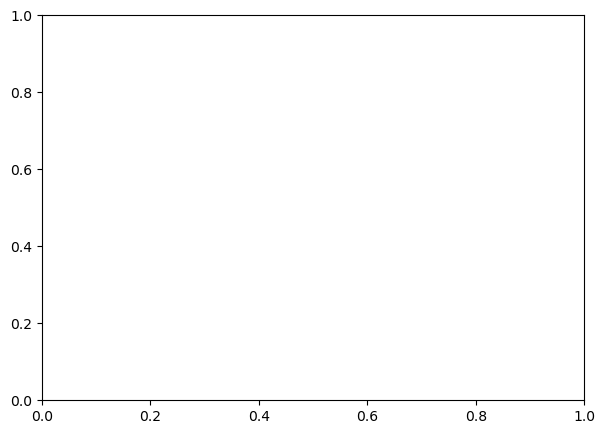

In [129]:
fig,ax = plt.subplots(1,1, figsize=(7,5))
pcm = ax.imshow(resid_2d_XY.T, origin='lower',
                vmax=700,
                vmin=-50,
                #norm='log',
                cmap = 'viridis', extent=[12,23,-8,8],aspect='auto')
ax.set_xlabel('x')
ax.set_ylabel('y')
fig.colorbar(pcm, ax=ax)

In [141]:
multiplied_mask_overdense = resid_2d_XY* bin_mask

fig,ax = plt.subplots(1,1, figsize=(7,5))
pcm = ax.imshow(multiplied_mask_overdense.T, origin='lower',
                vmax=700,
                vmin=-50,
                #norm='log',
                cmap = 'viridis', extent=[12,23,-8,8],aspect='auto')
ax.set_xlabel('x')
ax.set_ylabel('y')
fig.colorbar(pcm, ax=ax)

ValueError: operands could not be broadcast together with shapes (22,16) (30,30) 

In [142]:
#go from 140 now

In [143]:
polar_min, polar_max = np.deg2rad([170, 200])

/tmp/ipykernel_1270832/3971895397.py:11: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  pc = ax.pcolormesh(A, R, resid_2d.T, cmap="viridis", vmin=-100, vmax=600)


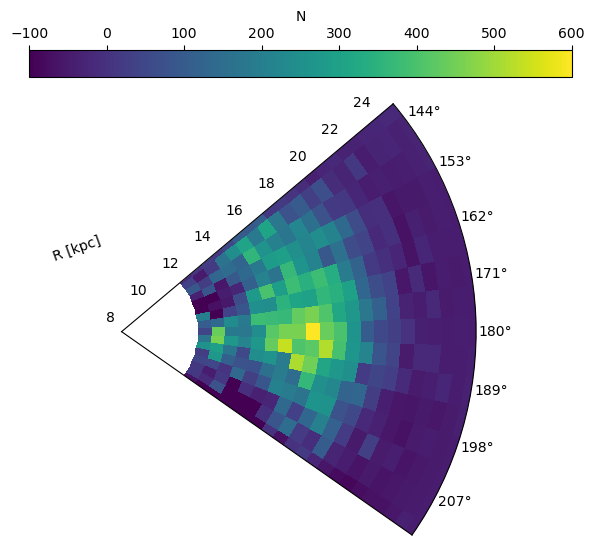

In [144]:
# define binning
rbins = np.linspace(12, 25, np.shape(resid_2d)[1])
abins = np.deg2rad(lon_range)

A, R = np.meshgrid(abins, rbins)


# plot
fig, ax = plt.subplots(1, figsize=(7,7),subplot_kw=dict(projection="polar"))

pc = ax.pcolormesh(A, R, resid_2d.T, cmap="viridis", vmin=-100, vmax=600)
fig.colorbar(pc, ax=ax, location='top', label='N')

ax.set_rlim(8, 25)
ax.set_thetalim(abins[0], abins[-1])
ax.set_theta_zero_location("W")
ax.set_theta_direction(-1)
ax.set_rlabel_position(-50)
rlab = ax.set_ylabel("R [kpc]")
rlab.set_position((-100.0, 0.65))
rlab.set_rotation(20)
#ax.grid(True)
plt.show()

In [145]:
r_ind500[disky_index]

array([10.51513887, 16.63222341, 10.88509362, ..., 13.96943959,
       10.37260906, 13.02278064])

fit that onto this

# r, phi to XY

/global/common/software/desi/perlmutter/desiconda/20230111-2.1.0/conda/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)


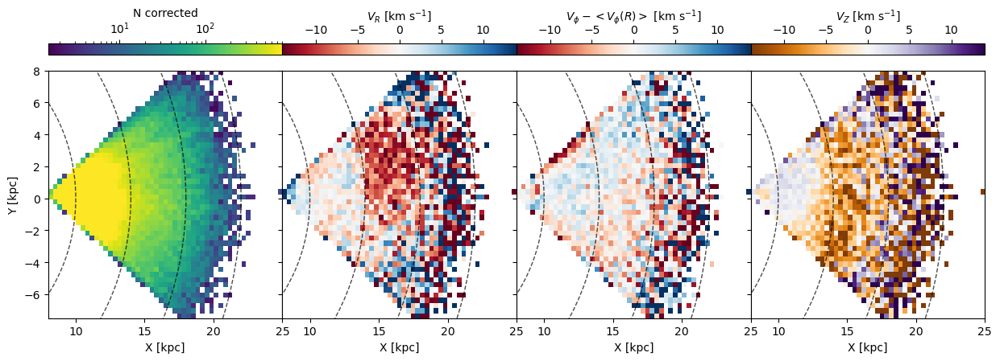

In [488]:
nxbins = 17*3
nybins = 16*3
rangearr=[[8, 25],[-8, 8]]
binsarr = [nxbins, nybins]


# plotting
fig, ax = plt.subplots(1,4, figsize=(15,5), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})




bin_xy =scipy.stats.binned_statistic_2d(galac_x[ind500_msto],
                                           galac_y[ind500_msto],
                                           v_r[ind500_msto],
                                           'count', bins=binsarr,
                                           range = rangearr)

bin_xy_comp = scipy.stats.binned_statistic_2d(galac_x[ind500_msto],
                                           galac_y[ind500_msto],
                                           completeness_arr,
                                           'median', bins=binsarr,
                                           range = rangearr)

density_corr = bin_xy.statistic * (0.8/bin_xy_comp.statistic)




pcm = ax[0].imshow(density_corr.T,
                origin='lower',
                vmax=800,
                #vmin=-21,
                norm='log',
                cmap = 'viridis', extent=[8, 25,-7.5, 8],aspect='auto')
fig.colorbar(pcm, ax=ax[0], location='top', label='N corrected')
#ax[0].grid(True)
ax[0].set_xlabel('X [kpc]')
ax[0].set_ylabel('Y [kpc]')


###########################################################################################
###########################################################################################
###########################################################################################


bin_x_y =scipy.stats.binned_statistic_2d(galac_x[ind500_msto],
                                           galac_y[ind500_msto],
                                           v_r[ind500_msto],
                                           'median', bins=binsarr,
                                           range = rangearr)



bounds = [-20, -10,-1, 0, 1, 10, 20]
norm = mpl.colors.BoundaryNorm(bounds, cmap.N, extend='both')



pcm = ax[1].imshow(bin_x_y.statistic.T,
                origin='lower',
                vmax=14,
                vmin=-14,
                norm='linear',
                cmap = 'RdBu', extent=[8, 25,-7.5, 8],aspect='auto')
fig.colorbar(pcm, ax=ax[1], location='top', label='$V_R$ [km s$^{-1}$]')
#ax[1].grid(True)
ax[1].set_xlabel('X [kpc]')
#ax[0].set_ylabel('Y [kpc]')

###########################################################################################
###########################################################################################
###########################################################################################


bin_x_y_phi =scipy.stats.binned_statistic_2d(galac_x[ind500_msto],
                                           galac_y[ind500_msto],
                                           -v_phi[ind500_msto],
                                           'median', bins=binsarr,
                                           range = rangearr)

bin_x_y_r =scipy.stats.binned_statistic_2d(galac_x[ind500_msto],
                                           galac_y[ind500_msto],
                                           r[ind500_msto],
                                           'median', bins=binsarr,
                                           range = rangearr)

hehe = bin_x_y_phi.statistic.T


avg_phi_per_r_hist = np.copy(bin_x_y_r.statistic.T)

r_bins = np.arange(7, 25, step=0.25) # if before i used bins of 70 over a 18 kpc space that means each bin is ~0.25 kpc

for rr in range(len(r_bins)-1):
    # at one radius, what is the index of the 2dhist
    #print(rr)
    #bleh = np.where(hehe[:,i] > 175)
    r_bin_index = np.where((bin_x_y_r.statistic.T >r_bins[rr])&(bin_x_y_r.statistic.T <r_bins[rr+1])) 

    #print(r_bin_index[0], r_bin_index[1])

    # the phi values of the bins at the R range
    phi_in_r_bin=bin_x_y_phi.statistic.T[r_bin_index[0], r_bin_index[1]]
    #print(np.nanmedian(lol))

    avg_phi_per_r_hist[r_bin_index[0], r_bin_index[1]] = np.nanmedian(phi_in_r_bin)

phi_m_avg_phi_per_r = bin_x_y_phi.statistic.T - avg_phi_per_r_hist # subtract phi hist from avg phi per r hist

pcm = ax[2].imshow(phi_m_avg_phi_per_r,
              origin='lower',
                vmax=14,
                vmin=-14,
                norm='linear',
                cmap = 'RdBu', extent=[8, 25,-7.5, 8],aspect='auto')
fig.colorbar(pcm, ax=ax[2], location='top', label='$V_\phi - <V_\phi(R)>$ [km s$^{-1}$]')
#ax[2].grid(True)
ax[2].set_xlabel('X [kpc]')

###########################################################################################
###########################################################################################
###########################################################################################


bin_x_y =scipy.stats.binned_statistic_2d(galac_x[ind500_msto],
                                           galac_y[ind500_msto],
                                           v_z[ind500_msto],
                                           'median', bins=binsarr,
                                           range = rangearr)
cmap = matplotlib.cm.jet
cmap.set_bad('white',1.)

pcm = ax[3].imshow(bin_x_y.statistic.T,
                origin='lower',
                vmax=14,
                vmin=-14,
                norm='linear',
                cmap = 'PuOr', extent=[8, 25,-7.5, 8],aspect='auto')
fig.colorbar(pcm, ax=ax[3], location='top', label='$V_Z$ [km s$^{-1}$]')
#ax[1].grid(True)
ax[3].set_xlabel('X [kpc]')
#ax[0].set_ylabel('Y [kpc]')

for i in range(4):
    circ = matplotlib.patches.Annulus((0,0), 18,4, ec='k', lw=1, linestyle='--',fill=False, alpha=0.7)
    ax[i].add_patch(circ)
    
    circ = matplotlib.patches.Annulus((0,0), 22,12, ec='k', lw=1, linestyle='--',fill=False, alpha=0.7)
    ax[i].add_patch(circ)


    
print()

# only disky stars vphi cut 175 to 275# for a specific angle in phi what is the density versus R



In [489]:
galac_xind500 = galac_x[ind500_msto]
galac_yind500 = galac_y[ind500_msto]
#completeness_ind500 = completeness_arr
     
phi_ind500 = phi[ind500_msto]
r_ind500= r[ind500_msto]
z_ind500= z[ind500_msto]
v_phi_ind500 = v_phi[ind500_msto]
v_r_ind500 = v_r[ind500_msto]
v_z_ind500 = v_z[ind500_msto]

feh_ind500 = feh[ind500_msto]

#slice_index_upper = np.where((phi_ind500>175)&(phi_ind500<176))
slice_index_lower = np.where((phi_ind500>180)&(phi_ind500<185))


disky_index = np.where((-v_phi_ind500 > 180) & (-v_phi_ind500 < 275))
#slice_index_lower = np.where((phi_ind500>195)&(phi_ind500<196))



In [490]:
galac_xind500_disk = galac_xind500[disky_index]
galac_yind500_disk = galac_yind500[disky_index]
completeness_ind500_disk = completeness_ind500[disky_index]

phi_ind500_disk = phi_ind500[disky_index]
r_ind500_disk= r_ind500[disky_index]
z_ind500_disk= z_ind500[disky_index]
v_phi_ind500_disk = v_phi_ind500[disky_index]
v_r_ind500_disk= v_r_ind500[disky_index]
v_z_ind500_disk= v_z_ind500[disky_index]

feh_ind500_disk = feh_ind500[disky_index]

(array([ 1271.,  3317.,  7760., 14839., 21551., 25867., 25177., 20896.,
        14977., 10926.]),
 array([-274.55083206, -265.09579523, -255.6407584 , -246.18572157,
        -236.73068474, -227.27564791, -217.82061109, -208.36557426,
        -198.91053743, -189.4555006 , -180.00046377]),
 <BarContainer object of 10 artists>)

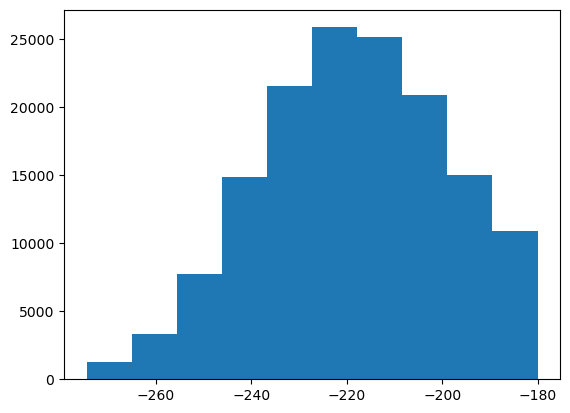

In [491]:
plt.hist(v_phi_ind500[disky_index])

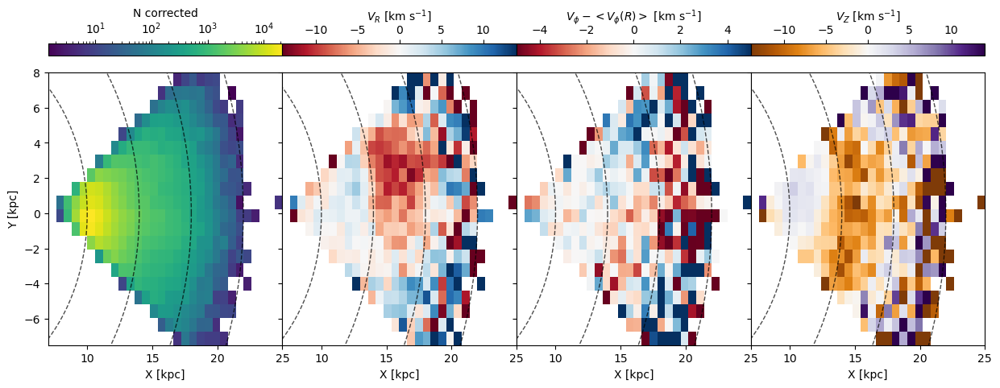

In [492]:
nxbins = 18*3
nybins = 16*3
nxbins = 30
nybins = 20
rangearr=[[7, 25],[-8, 8]]
binsarr = [nxbins, nybins]


# plotting
fig, ax = plt.subplots(1,4, figsize=(15,5.5), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})




bin_xy =scipy.stats.binned_statistic_2d(galac_xind500_disk,
                                           galac_yind500_disk,
                                           v_r_ind500_disk,
                                           'count', bins=binsarr,
                                           range = rangearr)

bin_xy_comp = scipy.stats.binned_statistic_2d(galac_xind500_disk,
                                           galac_yind500_disk,
                                           completeness_ind500_disk,
                                           'median', bins=binsarr,
                                           range = rangearr)

density_corr = bin_xy.statistic * (0.8/bin_xy_comp.statistic)




pcm = ax[0].imshow(density_corr.T,
                origin='lower',
                #vmax=600,
                #vmin=-21,
                norm='log',
                cmap = 'viridis', extent=[7, 25,-7.5, 8],aspect='auto')
fig.colorbar(pcm, ax=ax[0], location='top', label='N corrected')
#ax[0].grid(True)
ax[0].set_xlabel('X [kpc]')
ax[0].set_ylabel('Y [kpc]')


###########################################################################################
###########################################################################################
###########################################################################################


bin_x_y =scipy.stats.binned_statistic_2d(galac_xind500_disk,
                                           galac_yind500_disk,
                                           v_r_ind500_disk,
                                           'median', bins=binsarr,
                                           range = rangearr)


cmap = mpl.cm.RdBu
cmap.set_bad('k',1.)


pcm = ax[1].imshow(bin_x_y.statistic.T,
                origin='lower',
                vmax=14,
                vmin=-14,
                norm='linear',
                cmap = 'RdBu', extent=[7, 25,-7.5, 8],aspect='auto')
fig.colorbar(pcm, ax=ax[1], location='top', label='$V_R$ [km s$^{-1}$]')
#ax[1].grid(True)
ax[1].set_xlabel('X [kpc]')
#ax[0].set_ylabel('Y [kpc]')

###########################################################################################
###########################################################################################
###########################################################################################


bin_x_y_phi =scipy.stats.binned_statistic_2d(galac_xind500_disk,
                                           galac_yind500_disk,
                                           -v_phi_ind500_disk,
                                           'median', bins=binsarr,
                                           range = rangearr)

bin_x_y_r =scipy.stats.binned_statistic_2d(galac_xind500_disk,
                                           galac_yind500_disk,
                                           r_ind500_disk,
                                           'median', bins=binsarr,
                                           range = rangearr)

hehe = bin_x_y_phi.statistic.T


avg_phi_per_r_hist = np.copy(bin_x_y_r.statistic.T)

r_bins = np.arange(7, 25, step=0.25) # if before i used bins of 70 over a 18 kpc space that means each bin is ~0.25 kpc

for rr in range(len(r_bins)-1):
    # at one radius, what is the index of the 2dhist
    #print(rr)
    #bleh = np.where(hehe[:,i] > 175)
    r_bin_index = np.where((bin_x_y_r.statistic.T >r_bins[rr])&(bin_x_y_r.statistic.T <r_bins[rr+1])) 

    #print(r_bin_index[0], r_bin_index[1])

    # the phi values of the bins at the R range
    phi_in_r_bin=bin_x_y_phi.statistic.T[r_bin_index[0], r_bin_index[1]]
    #print(np.nanmedian(lol))

    avg_phi_per_r_hist[r_bin_index[0], r_bin_index[1]] = np.nanmedian(phi_in_r_bin)

phi_m_avg_phi_per_r = bin_x_y_phi.statistic.T - avg_phi_per_r_hist # subtract phi hist from avg phi per r hist

pcm = ax[2].imshow(phi_m_avg_phi_per_r,
              origin='lower',
                vmax=5,
                vmin=-5,
                norm='linear',
                cmap = 'RdBu', extent=[7, 25,-7.5, 8],aspect='auto')
fig.colorbar(pcm, ax=ax[2], location='top', label='$V_\phi - <V_\phi(R)>$ [km s$^{-1}$]')
#ax[2].grid(True)
ax[2].set_xlabel('X [kpc]')

###########################################################################################
###########################################################################################
###########################################################################################


bin_x_y =scipy.stats.binned_statistic_2d(galac_xind500_disk,
                                           galac_yind500_disk,
                                           v_z_ind500_disk,
                                           'median', bins=binsarr,
                                           range = rangearr)




pcm = ax[3].imshow(bin_x_y.statistic.T,
                origin='lower',
                vmax=14,
                vmin=-14,
                norm='linear',
                cmap = 'PuOr', extent=[7, 25,-7.5, 8],aspect='auto')
fig.colorbar(pcm, ax=ax[3], location='top', label='$V_Z$ [km s$^{-1}$]')
#ax[1].grid(True)
ax[3].set_xlabel('X [kpc]')
#ax[0].set_ylabel('Y [kpc]')

for i in range(4):
    circ = matplotlib.patches.Annulus((0,0), 18,4, ec='k', lw=1, linestyle='--',fill=False, alpha=0.7)
    ax[i].add_patch(circ)
    
    circ = matplotlib.patches.Annulus((0,0), 22,12, ec='k', lw=1, linestyle='--',fill=False, alpha=0.7)
    ax[i].add_patch(circ)


    
print()


# try looking at different z ranges

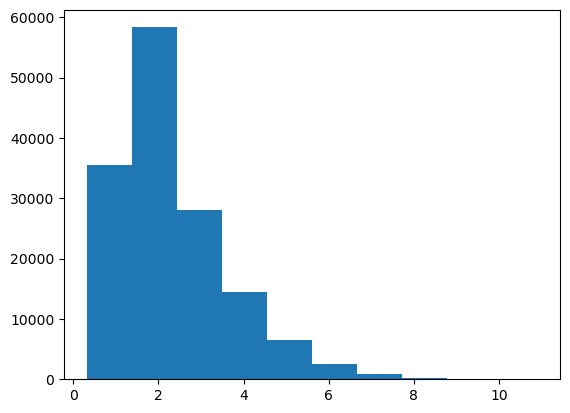

In [493]:
plt.hist(z_ind500_disk)
plt.show()

In [494]:
23-8

15

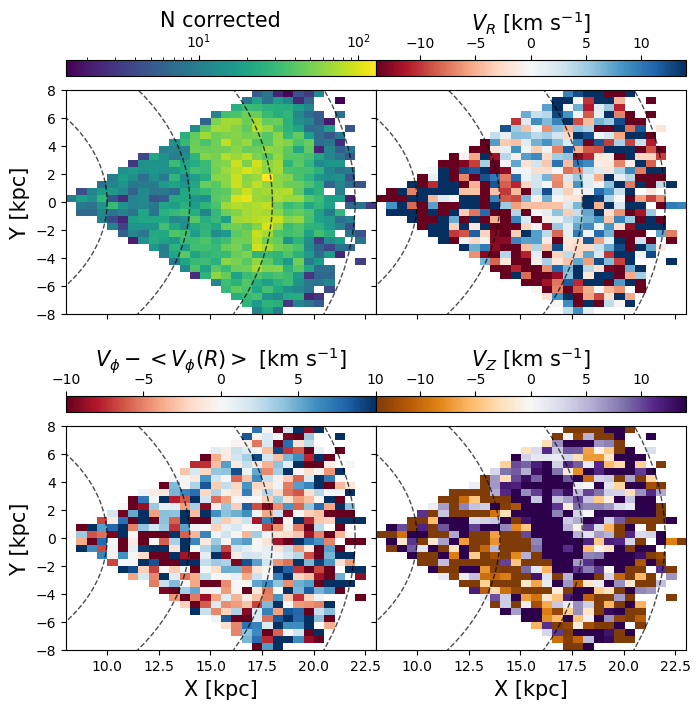

In [495]:
nxbins = 30
nybins = 32
rangearr=[[8, 23],[-8, 8]]
binsarr = [nxbins, nybins]
interp='None'

z_index = np.where(z_ind500_disk> 5)

# plotting
fig, ax = plt.subplots(2,2, figsize=(8,8), sharex=True, sharey=True, gridspec_kw={'hspace': 0.2, 'wspace': 0})




bin_xy =scipy.stats.binned_statistic_2d(galac_xind500_disk[z_index],
                                           galac_yind500_disk[z_index],
                                           v_r_ind500_disk[z_index],
                                           'count', bins=binsarr,
                                           range = rangearr)

bin_xy_comp = scipy.stats.binned_statistic_2d(galac_xind500_disk[z_index],
                                           galac_yind500_disk[z_index],
                                           completeness_ind500_disk[z_index],
                                           'median', bins=binsarr,
                                           range = rangearr)

density_corr = bin_xy.statistic * (0.8/bin_xy_comp.statistic)




pcm = ax[0,0].imshow(density_corr.T,
                origin='lower',
                #vmax=600,
                #vmin=-21,
                norm='log',
                cmap = 'viridis', extent=[8, 23,-8, 8],aspect='auto', interpolation=interp)

cb = fig.colorbar(pcm, ax=ax[0,0], location='top', )
cb.set_label(label='N corrected',size=15)
#ax[0].grid(True)
#ax[0,0].set_xlabel('X [kpc]', fontsize=15)
ax[0,0].set_ylabel('Y [kpc]', fontsize=15)


###########################################################################################
###########################################################################################
###########################################################################################


bin_x_y =scipy.stats.binned_statistic_2d(galac_xind500_disk[z_index],
                                           galac_yind500_disk[z_index],
                                           v_r_ind500_disk[z_index],
                                           'median', bins=binsarr,
                                           range = rangearr)



bounds = [-20, -10,-1, 0, 1, 10, 20]
norm = mpl.colors.BoundaryNorm(bounds, cmap.N, extend='both')



pcm = ax[0,1].imshow(bin_x_y.statistic.T,
                origin='lower',
                vmax=14,
                vmin=-14,
                norm='linear',
                cmap = 'RdBu', extent=[8, 23,-8, 8],aspect='auto', interpolation=interp)

cb = fig.colorbar(pcm, ax=ax[0,1], location='top',)
cb.set_label(label='$V_R$ [km s$^{-1}$]',size=15)
#ax[1].grid(True)
#ax[0,1].set_xlabel('X [kpc]', fontsize=15)
#ax[0,1].set_ylabel('Y [kpc]', fontsize=15)

###########################################################################################
###########################################################################################
###########################################################################################


bin_x_y_phi =scipy.stats.binned_statistic_2d(galac_xind500_disk[z_index],
                                           galac_yind500_disk[z_index],
                                           -v_phi_ind500_disk[z_index],
                                           'median', bins=binsarr,
                                           range = rangearr)

bin_x_y_r =scipy.stats.binned_statistic_2d(galac_xind500_disk[z_index],
                                           galac_yind500_disk[z_index],
                                           r_ind500_disk[z_index],
                                           'median', bins=binsarr,
                                           range = rangearr)

hehe = bin_x_y_phi.statistic.T


avg_phi_per_r_hist = np.copy(bin_x_y_r.statistic.T)

r_bins = np.arange(7, 25, step=0.25) # if before i used bins of 70 over a 18 kpc space that means each bin is ~0.25 kpc

for rr in range(len(r_bins)-1):
    # at one radius, what is the index of the 2dhist
    #print(rr)
    #bleh = np.where(hehe[:,i] > 175)
    r_bin_index = np.where((bin_x_y_r.statistic.T >r_bins[rr])&(bin_x_y_r.statistic.T <r_bins[rr+1])) 

    #print(r_bin_index[0], r_bin_index[1])

    # the phi values of the bins at the R range
    phi_in_r_bin=bin_x_y_phi.statistic.T[r_bin_index[0], r_bin_index[1]]
    #print(np.nanmedian(lol))

    avg_phi_per_r_hist[r_bin_index[0], r_bin_index[1]] = np.nanmedian(phi_in_r_bin)

phi_m_avg_phi_per_r = bin_x_y_phi.statistic.T - avg_phi_per_r_hist # subtract phi hist from avg phi per r hist

pcm = ax[1,0].imshow(phi_m_avg_phi_per_r,
              origin='lower',
                vmax=10,
                vmin=-10,
                norm='linear',
                cmap = 'RdBu', extent=[8, 23,-8, 8],aspect='auto', interpolation=interp)

cb =fig.colorbar(pcm, ax=ax[1,0], location='top', )
cb.set_label(label='$V_\phi - <V_\phi(R)>$ [km s$^{-1}$]',size=15)
#ax[2].grid(True)
ax[1,0].set_xlabel('X [kpc]', fontsize=15)
ax[1,0].set_ylabel('Y [kpc]', fontsize=15)

###########################################################################################
###########################################################################################
###########################################################################################


bin_x_y =scipy.stats.binned_statistic_2d(galac_xind500_disk[z_index],
                                           galac_yind500_disk[z_index],
                                           v_z_ind500_disk[z_index],
                                           'median', bins=binsarr,
                                           range = rangearr)



bounds = [-20, -10,-1, 0, 1, 10, 20]
norm = mpl.colors.BoundaryNorm(bounds, cmap.N, extend='both')



pcm = ax[1,1].imshow(bin_x_y.statistic.T,
                origin='lower',
                vmax=14,
                vmin=-14,
                norm='linear',
                cmap = 'PuOr', extent=[8, 23,-8, 8],aspect='auto', interpolation=interp)

cb = fig.colorbar(pcm, ax=ax[1,1], location='top', )
cb.set_label(label='$V_Z$ [km s$^{-1}$]',size=15)
#ax[1].grid(True)
ax[1,1].set_xlabel('X [kpc]', fontsize=15)
#ax[0].set_ylabel('Y [kpc]')

for i in range(2):
    for j in range(2):
        circ = matplotlib.patches.Annulus((0,0), 18,4, ec='k', lw=1, linestyle='--',fill=False, alpha=0.7)
        ax[i,j].add_patch(circ)

        circ = matplotlib.patches.Annulus((0,0), 22,12, ec='k', lw=1, linestyle='--',fill=False, alpha=0.7)
        ax[i,j].add_patch(circ)

#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/loa_XY_Z_gr_5.png', dpi=400)
    
print()



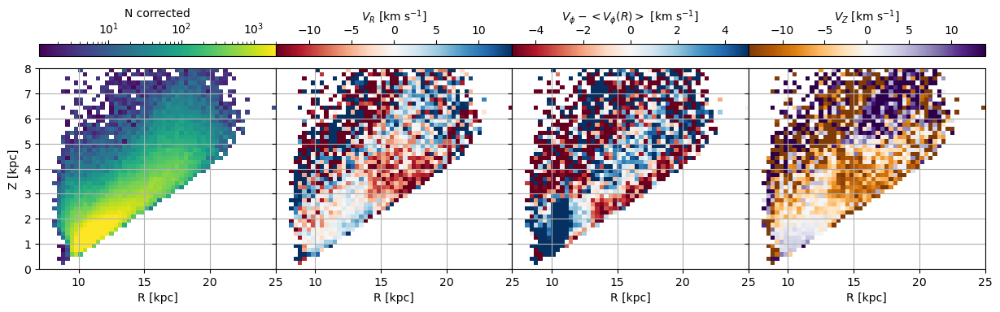

In [496]:
zmin = 0
zmax = 8

nxbins = 18*3
nybins = 16*3
rangearr=[[7, 25],[zmin, zmax]]
binsarr = [nxbins, nybins]


# plotting
fig, ax = plt.subplots(1,4, figsize=(15,4), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})

feh_index_cut = np.where((feh_ind500_disk>-.8)&(feh_ind500_disk<1))


bin_rz =scipy.stats.binned_statistic_2d(r_ind500_disk[feh_index_cut],
                                           z_ind500_disk[feh_index_cut],
                                           v_r_ind500_disk[feh_index_cut],
                                           'count', bins=binsarr,
                                           range = rangearr)



bin_rz_comp = scipy.stats.binned_statistic_2d(r_ind500_disk[feh_index_cut],
                                           z_ind500_disk[feh_index_cut],
                                           completeness_ind500_disk[feh_index_cut],
                                           'median', bins=binsarr,
                                           range = rangearr)

density_corr = bin_rz.statistic * (0.8/bin_rz_comp.statistic)


pcm = ax[0].imshow(density_corr.T,
                origin='lower',
                vmax=2000,
                #vmin=-21,
                norm='log',
                cmap = 'viridis', extent=[7, 25,zmin, zmax],aspect='auto')
fig.colorbar(pcm, ax=ax[0], location='top', label='N corrected')
#ax[0].grid(True)
ax[0].set_xlabel('R [kpc]')
ax[0].set_ylabel('Z [kpc]')


###########################################################################################
###########################################################################################
###########################################################################################


bin_x_y =scipy.stats.binned_statistic_2d(r_ind500_disk[feh_index_cut],
                                           z_ind500_disk[feh_index_cut],
                                           v_r_ind500_disk[feh_index_cut],
                                           'median', bins=binsarr,
                                           range = rangearr)



bounds = [-20, -10,-1, 0, 1, 10, 20]
norm = mpl.colors.BoundaryNorm(bounds, cmap.N, extend='both')



pcm = ax[1].imshow(bin_x_y.statistic.T,
                origin='lower',
                vmax=14,
                vmin=-14,
                norm='linear',
                cmap = 'RdBu', extent=[7, 25,zmin, zmax],aspect='auto')
fig.colorbar(pcm, ax=ax[1], location='top', label='$V_R$ [km s$^{-1}$]')
#ax[1].grid(True)
ax[1].set_xlabel('R [kpc]')
#ax[0].set_ylabel('Y [kpc]')

###########################################################################################
###########################################################################################
###########################################################################################


bin_x_y =scipy.stats.binned_statistic_2d(r_ind500_disk[feh_index_cut],
                                           z_ind500_disk[feh_index_cut],
                                           -v_phi_ind500_disk[feh_index_cut],
                                           'median', bins=binsarr,
                                           range = rangearr)



hehe = bin_x_y.statistic.T

image_col_mean = np.copy(hehe)
image_col_mean[:]  = np.nan

for i in range(len(hehe[1])): # column length
    bleh = np.where(hehe[:,i] > 175)
    image_col_mean[bleh,i] = hehe[bleh,i] - np.nanmedian(hehe[bleh,i])
#image_col_mean[np.where(image_col_mean <0)] = 0 # column averaged 2d histogram


# try only looking at vphi > 175 as this is only the disk vphi
# otherwise out average vphi is skewy-ed
pcm = ax[2].imshow(image_col_mean,
              origin='lower',
                vmax=5,
                vmin=-5,
                norm='linear',
                cmap = 'RdBu', extent=[7, 25,zmin, zmax],aspect='auto')
fig.colorbar(pcm, ax=ax[2], location='top', label='$V_\phi - <V_\phi(R)>$ [km s$^{-1}$]')
#ax[2].grid(True)
ax[2].set_xlabel('R [kpc]')



###########################################################################################
###########################################################################################
###########################################################################################


bin_x_y =scipy.stats.binned_statistic_2d(r_ind500_disk[feh_index_cut],
                                           z_ind500_disk[feh_index_cut],
                                           v_z_ind500_disk[feh_index_cut],
                                           'median', bins=binsarr,
                                           range = rangearr)


pcm = ax[3].imshow(bin_x_y.statistic.T,
              origin='lower',
                vmax=14,
                vmin=-14,
                norm='linear',
                cmap = 'PuOr', extent=[7, 25,zmin, zmax],aspect='auto')
fig.colorbar(pcm, ax=ax[3], location='top', label='$V_Z$ [km s$^{-1}$]')

ax[3].set_xlabel('R [kpc]')

ax[0].grid(True)
ax[1].grid(True)
ax[2].grid(True)
ax[3].grid(True)


#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/RZ_corrected_panels.png', dpi=400)


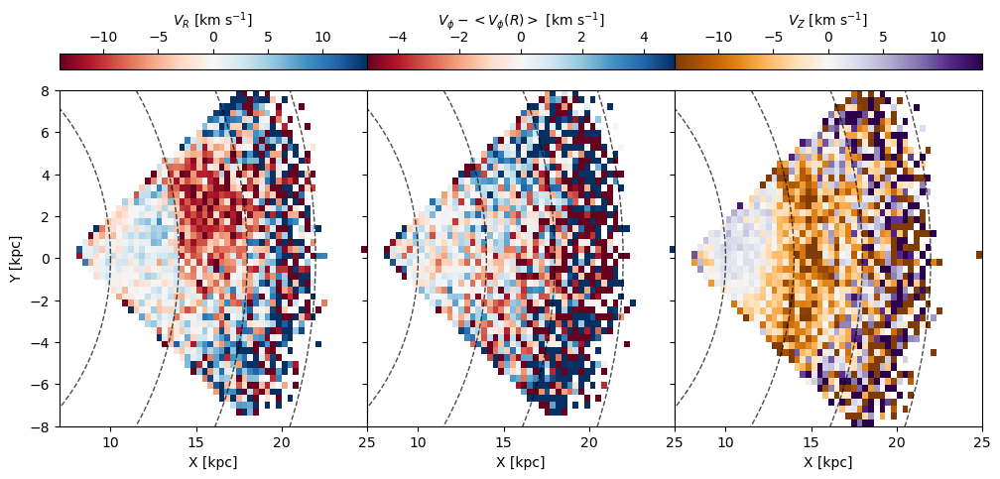

In [497]:
nxbins = 18*3
nybins = 16*3
rangearr=[[7, 25],[-8,8]]
binsarr = [nxbins, nybins]


# plotting
fig, ax = plt.subplots(1,3, figsize=(12,5.5), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})



ax[0].set_xlabel('X [kpc]')
ax[0].set_ylabel('Y [kpc]')


###########################################################################################
###########################################################################################
###########################################################################################


bin_x_y =scipy.stats.binned_statistic_2d(galac_xind500[disky_index],
                                           galac_yind500[disky_index],
                                           v_r_ind500[disky_index],
                                           'median', bins=binsarr,
                                           range = rangearr)


pcm = ax[0].imshow(bin_x_y.statistic.T,
                origin='lower',
                vmax=14,
                vmin=-14,
                norm='linear',
                cmap = 'RdBu', extent=[7, 25,-7.5, 8],aspect='auto')
fig.colorbar(pcm, ax=ax[0], location='top', label='$V_R$ [km s$^{-1}$]')
#ax[1].grid(True)
ax[0].set_xlabel('X [kpc]')
#ax[0].set_ylabel('Y [kpc]')

###########################################################################################
###########################################################################################
###########################################################################################


bin_x_y_phi =scipy.stats.binned_statistic_2d(galac_xind500[disky_index],
                                           galac_yind500[disky_index],
                                           -v_phi_ind500[disky_index],
                                           'median', bins=binsarr,
                                           range = rangearr)

bin_x_y_r =scipy.stats.binned_statistic_2d(galac_xind500[disky_index],
                                           galac_yind500[disky_index],
                                           r_ind500[disky_index],
                                           'median', bins=binsarr,
                                           range = rangearr)

hehe = bin_x_y_phi.statistic.T


avg_phi_per_r_hist = np.copy(bin_x_y_r.statistic.T)

r_bins = np.arange(7, 25, step=0.25) # if before i used bins of 70 over a 18 kpc space that means each bin is ~0.25 kpc

for rr in range(len(r_bins)-1):
    # at one radius, what is the index of the 2dhist
    #print(rr)
    #bleh = np.where(hehe[:,i] > 175)
    r_bin_index = np.where((bin_x_y_r.statistic.T >r_bins[rr])&(bin_x_y_r.statistic.T <r_bins[rr+1])) 

    #print(r_bin_index[0], r_bin_index[1])

    # the phi values of the bins at the R range
    phi_in_r_bin=bin_x_y_phi.statistic.T[r_bin_index[0], r_bin_index[1]]
    #print(np.nanmedian(lol))

    avg_phi_per_r_hist[r_bin_index[0], r_bin_index[1]] = np.nanmedian(phi_in_r_bin)

phi_m_avg_phi_per_r = bin_x_y_phi.statistic.T - avg_phi_per_r_hist # subtract phi hist from avg phi per r hist

pcm = ax[1].imshow(phi_m_avg_phi_per_r,
              origin='lower',
                vmax=5,
                vmin=-5,
                norm='linear',
                cmap = 'RdBu', extent=[7, 25,-7.5, 8],aspect='auto')
fig.colorbar(pcm, ax=ax[1], location='top', label='$V_\phi - <V_\phi(R)>$ [km s$^{-1}$]')
#ax[2].grid(True)
ax[1].set_xlabel('X [kpc]')

###########################################################################################
###########################################################################################
###########################################################################################


bin_x_y =scipy.stats.binned_statistic_2d(galac_xind500[disky_index],
                                           galac_yind500[disky_index],
                                           v_z_ind500[disky_index],
                                           'median', bins=binsarr,
                                           range = rangearr)


pcm = ax[2].imshow(bin_x_y.statistic.T,
                origin='lower',
                vmax=14,
                vmin=-14,
                norm='linear',
                cmap = 'PuOr', extent=[7, 25,-8, 8],aspect='auto')
fig.colorbar(pcm, ax=ax[2], location='top', label='$V_Z$ [km s$^{-1}$]')
#ax[1].grid(True)
ax[2].set_xlabel('X [kpc]')
#ax[0].set_ylabel('Y [kpc]')

for i in range(3):
    circ = matplotlib.patches.Annulus((0,0), 18,4, ec='k', lw=1, linestyle='--',fill=False, alpha=0.7)
    ax[i].add_patch(circ)
    
    circ = matplotlib.patches.Annulus((0,0), 22,12, ec='k', lw=1, linestyle='--',fill=False, alpha=0.7)
    ax[i].add_patch(circ)


    
print()



[ 8.    8.25  8.5   8.75  9.    9.25  9.5   9.75 10.   10.25 10.5  10.75
 11.   11.25 11.5  11.75 12.   12.25 12.5  12.75 13.   13.25 13.5  13.75
 14.   14.25 14.5  14.75 15.   15.25 15.5  15.75 16.   16.25 16.5  16.75
 17.   17.25 17.5  17.75 18.   18.25 18.5  18.75 19.   19.25 19.5  19.75
 20.   20.25 20.5  20.75 21.   21.25 21.5  21.75 22.   22.25 22.5  22.75]



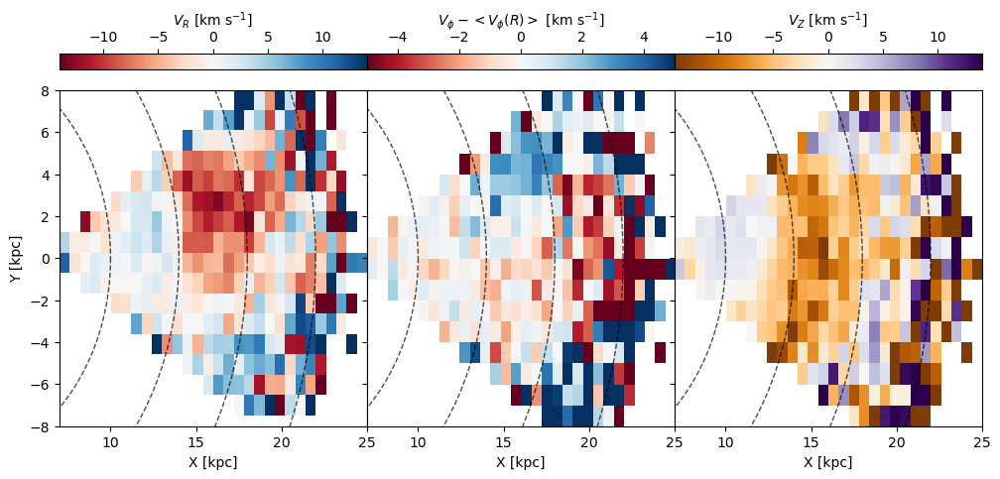

In [498]:
nxbins = 30
nybins = 16
rangearr=[[8, 23],[-8,8]]
binsarr = [nxbins, nybins]


# plotting
fig, ax = plt.subplots(1,3, figsize=(12,5.5), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})



ax[0].set_xlabel('X [kpc]')
ax[0].set_ylabel('Y [kpc]')


###########################################################################################
###########################################################################################
###########################################################################################


bin_x_y =scipy.stats.binned_statistic_2d(galac_xind500[disky_index],
                                           galac_yind500[disky_index],
                                           v_r_ind500[disky_index],
                                           'median', bins=binsarr,
                                           range = rangearr)


pcm = ax[0].imshow(bin_x_y.statistic.T,
                origin='lower',
                vmax=14,
                vmin=-14,
                norm='linear',
                cmap = 'RdBu', extent=[7, 25,-7.5, 8],aspect='auto')
fig.colorbar(pcm, ax=ax[0], location='top', label='$V_R$ [km s$^{-1}$]')
#ax[1].grid(True)
ax[0].set_xlabel('X [kpc]')
#ax[0].set_ylabel('Y [kpc]')

###########################################################################################
###########################################################################################
###########################################################################################


bin_x_y_phi =scipy.stats.binned_statistic_2d(galac_xind500[disky_index],
                                           galac_yind500[disky_index],
                                           -v_phi_ind500[disky_index],
                                           'median', bins=binsarr,
                                           range = rangearr)

bin_x_y_r =scipy.stats.binned_statistic_2d(galac_xind500[disky_index],
                                           galac_yind500[disky_index],
                                           r_ind500[disky_index],
                                           'median', bins=binsarr,
                                           range = rangearr)

hehe = bin_x_y_phi.statistic.T


avg_phi_per_r_hist = np.copy(bin_x_y_r.statistic.T)

r_bins = np.arange(8,23, step=0.25) # if before i used bins of 70 over a 18 kpc space that means each bin is ~0.25 kpc
print(r_bins)

for rr in range(len(r_bins)-1):
    # at one radius, what is the index of the 2dhist
    #print(rr)
    #bleh = np.where(hehe[:,i] > 175)
    r_bin_index = np.where((bin_x_y_r.statistic.T >r_bins[rr])&(bin_x_y_r.statistic.T <r_bins[rr+1])) 

    #print(r_bin_index[0], r_bin_index[1])

    # the phi values of the bins at the R range
    phi_in_r_bin=bin_x_y_phi.statistic.T[r_bin_index[0], r_bin_index[1]]
    #print(np.nanmedian(lol))

    avg_phi_per_r_hist[r_bin_index[0], r_bin_index[1]] = np.nanmedian(phi_in_r_bin)

phi_m_avg_phi_per_r = bin_x_y_phi.statistic.T - avg_phi_per_r_hist # subtract phi hist from avg phi per r hist

pcm = ax[1].imshow(phi_m_avg_phi_per_r,
              origin='lower',
                vmax=5,
                vmin=-5,
                norm='linear',
                cmap = 'RdBu', extent=[7, 25,-8, 8],aspect='auto')
fig.colorbar(pcm, ax=ax[1], location='top', label='$V_\phi - <V_\phi(R)>$ [km s$^{-1}$]')
#ax[2].grid(True)
ax[1].set_xlabel('X [kpc]')

###########################################################################################
###########################################################################################
###########################################################################################


bin_x_y =scipy.stats.binned_statistic_2d(galac_xind500[disky_index],
                                           galac_yind500[disky_index],
                                           v_z_ind500[disky_index],
                                           'median', bins=binsarr,
                                           range = rangearr)


pcm = ax[2].imshow(bin_x_y.statistic.T,
                origin='lower',
                vmax=14,
                vmin=-14,
                norm='linear',
                cmap = 'PuOr', extent=[7, 25,-8, 8],aspect='auto')
fig.colorbar(pcm, ax=ax[2], location='top', label='$V_Z$ [km s$^{-1}$]')
#ax[1].grid(True)
ax[2].set_xlabel('X [kpc]')
#ax[0].set_ylabel('Y [kpc]')

for i in range(3):
    circ = matplotlib.patches.Annulus((0,0), 18,4, ec='k', lw=1, linestyle='--',fill=False, alpha=0.7)
    ax[i].add_patch(circ)
    
    circ = matplotlib.patches.Annulus((0,0), 22,12, ec='k', lw=1, linestyle='--',fill=False, alpha=0.7)
    ax[i].add_patch(circ)


    
print()

8 23 0.5
[ 8.   8.5  9.   9.5 10.  10.5 11.  11.5 12.  12.5 13.  13.5 14.  14.5
 15.  15.5 16.  16.5 17.  17.5 18.  18.5 19.  19.5 20.  20.5 21.  21.5
 22.  22.5]


Text(0.5, 0, 'X [kpc]')

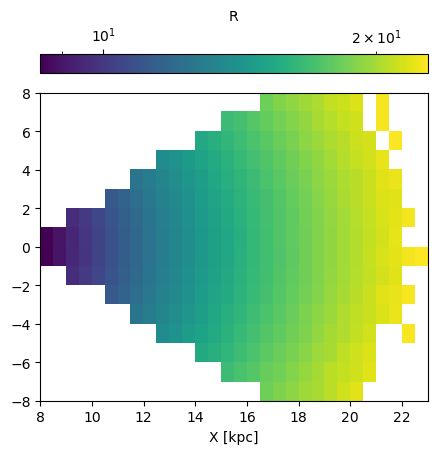

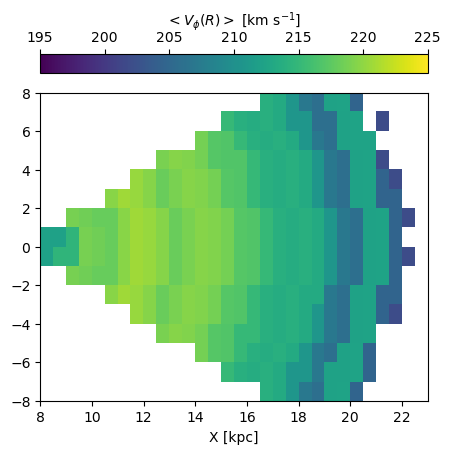

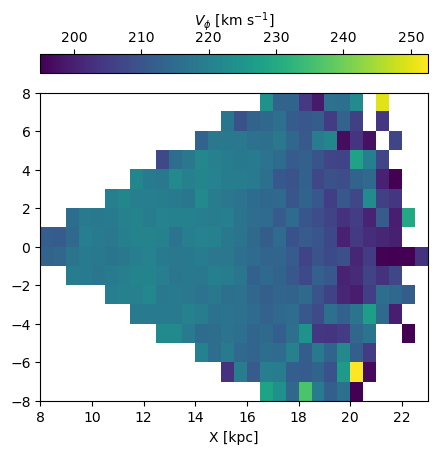

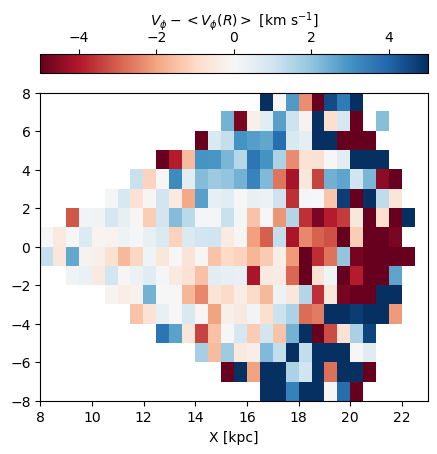

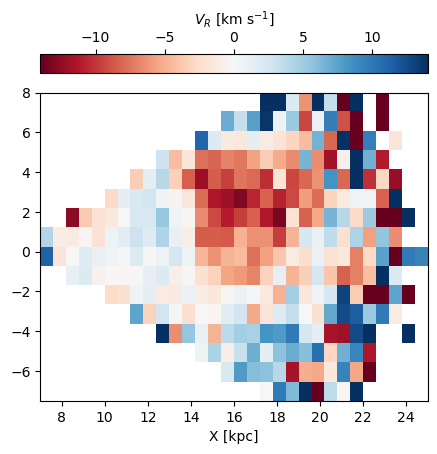

In [499]:

nxbins = 30
nybins = 16
rangearr=[[8, 23],[-8, 8]]
binsarr = [nxbins, nybins]

fig,ax = plt.subplots(1, figsize=(5,5))

bin_x_y_r =scipy.stats.binned_statistic_2d(galac_xind500[disky_index],
                                           galac_yind500[disky_index],
                                           r_ind500[disky_index],
                                           'median', bins=binsarr,
                                           range = rangearr)
pcm = ax.imshow(bin_x_y_r.statistic.T,
              origin='lower',
                #vmax=14,
                #vmin=-14,
                norm='log',
                cmap = 'viridis', extent=[8, 23,-8, 8],aspect='auto')
fig.colorbar(pcm, ax=ax, location='top', label='R')
#ax[2].grid(True)
ax.set_xlabel('X [kpc]')

###########################################################################################
###########################################################################################
###########################################################################################



bin_x_y_phi =scipy.stats.binned_statistic_2d(galac_xind500[disky_index],
                                           galac_yind500[disky_index],
                                           -v_phi_ind500[disky_index],
                                           'median', bins=binsarr,
                                           range = rangearr)

bin_x_y_r =scipy.stats.binned_statistic_2d(galac_xind500[disky_index],
                                           galac_yind500[disky_index],
                                           r_ind500[disky_index],
                                           'median', bins=binsarr,
                                           range = rangearr)

hehe = bin_x_y_phi.statistic.T


avg_phi_per_r_hist = np.copy(bin_x_y_r.statistic.T)
avg_phi_per_r_hist[:] = np.nan

step = (rangearr[0][1]-rangearr[0][0])/nxbins
r_bins = np.arange(rangearr[0][0], rangearr[0][1], step=step) # if before i used bins of 70 over a 18 kpc space that means each bin is ~0.25 kpc
print(rangearr[0][0], rangearr[0][1], (rangearr[0][1]-rangearr[0][0])/nxbins)
print(r_bins)

#r_bins = np.arange(8,23, step=0.25) # if before i used bins of 70 over a 18 kpc space that means each bin is ~0.25 kpc
#print(r_bins)

for rr in range(len(r_bins)-1):
    # at one radius, what is the index of the 2dhist
    #print(rr)
    r_bin_index = np.where((bin_x_y_r.statistic.T >r_bins[rr])&(bin_x_y_r.statistic.T <r_bins[rr+1]))  #the x and y position in the grid

    #print(r_bin_index, r_bin_index[1])

    # the phi values of the bins at the R range
    phi_in_r_bin=bin_x_y_phi.statistic.T[r_bin_index[0], r_bin_index[1]]
    #print(np.nanmedian(lol))
    #print(phi_in_r_bin)

    avg_phi_per_r_hist[r_bin_index[0], r_bin_index[1]] = np.nanmedian(phi_in_r_bin)

phi_m_avg_phi_per_r = bin_x_y_phi.statistic.T - avg_phi_per_r_hist # subtract phi hist from avg phi per r hist

fig,ax = plt.subplots(1, figsize=(5,5))
pcm = ax.imshow(avg_phi_per_r_hist,
              origin='lower',
                vmax=225,
                vmin=195,
                norm='linear',
                cmap = 'viridis', extent=[8, 23,-8, 8],aspect='auto')
fig.colorbar(pcm, ax=ax, location='top', label='$<V_\phi(R)>$ [km s$^{-1}$]')
#ax[2].grid(True)
ax.set_xlabel('X [kpc]')

fig,ax = plt.subplots(1, figsize=(5,5))
pcm = ax.imshow(bin_x_y_phi.statistic.T,
              origin='lower',
                #vmax=14,
                vmin=195,
                norm='linear',
                cmap = 'viridis', extent=[8, 23,-8, 8],aspect='auto')
fig.colorbar(pcm, ax=ax, location='top', label='$V_\phi$ [km s$^{-1}$]')
#ax[2].grid(True)
ax.set_xlabel('X [kpc]')



fig,ax = plt.subplots(1, figsize=(5,5))
pcm = ax.imshow(phi_m_avg_phi_per_r,
              origin='lower',
                vmax=5,
                vmin=-5,
                norm='linear',
                cmap = 'RdBu', extent=[8, 23,-8, 8],aspect='auto')
fig.colorbar(pcm, ax=ax, location='top', label='$V_\phi - <V_\phi(R)>$ [km s$^{-1}$]')
#ax[2].grid(True)
ax.set_xlabel('X [kpc]')

fig,ax = plt.subplots(1, figsize=(5,5))
bin_x_y =scipy.stats.binned_statistic_2d(galac_xind500[disky_index],
                                           galac_yind500[disky_index],
                                           v_r_ind500[disky_index],
                                           'median', bins=binsarr,
                                           range = rangearr)


pcm = ax.imshow(bin_x_y.statistic.T,
                origin='lower',
                vmax=14,
                vmin=-14,
                norm='linear',
                cmap = 'RdBu', extent=[7, 25,-7.5, 8],aspect='auto')
fig.colorbar(pcm, ax=ax, location='top', label='$V_R$ [km s$^{-1}$]')
#ax[1].grid(True)
ax.set_xlabel('X [kpc]')

Text(0.5, 0, 'X [kpc]')

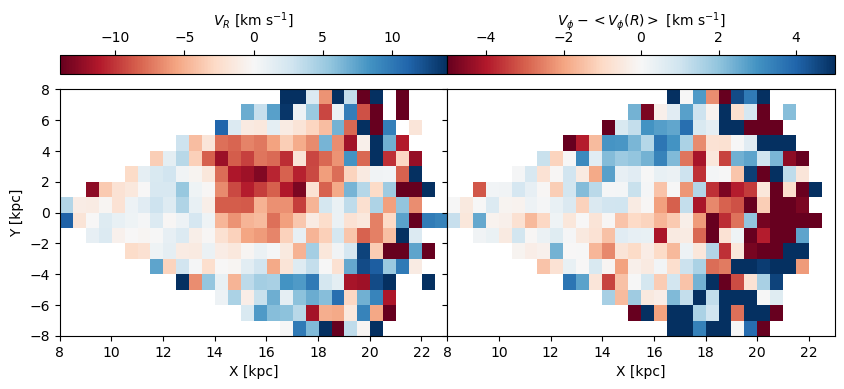

In [500]:
# trying to figrue out the offset
nxbins = 30
nybins = 16
rangearr=[[8, 23],[-8, 8]]
binsarr = [nxbins, nybins]

# plotting
fig, ax = plt.subplots(1,2, figsize=(10,4), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})



ax[0].set_xlabel('X [kpc]')
ax[0].set_ylabel('Y [kpc]')


###########################################################################################
###########################################################################################
###########################################################################################


bin_x_y =scipy.stats.binned_statistic_2d(galac_xind500[disky_index],
                                           galac_yind500[disky_index],
                                           v_r_ind500[disky_index],
                                           'median', bins=binsarr,
                                           range = rangearr)


pcm = ax[0].imshow(bin_x_y.statistic.T,
                origin='lower',
                vmax=14,
                vmin=-14,
                norm='linear',
                cmap = 'RdBu', extent=[8, 23,-8, 8],aspect='auto')
fig.colorbar(pcm, ax=ax[0], location='top', label='$V_R$ [km s$^{-1}$]')
#ax[1].grid(True)
ax[0].set_xlabel('X [kpc]')
#ax[0].set_ylabel('Y [kpc]')

###########################################################################################
###########################################################################################
###########################################################################################


pcm = ax[1].imshow(phi_m_avg_phi_per_r,
              origin='lower',
                vmax=5,
                vmin=-5,
                norm='linear',
                cmap = 'RdBu', extent=[8, 23,-8, 8],aspect='auto')
fig.colorbar(pcm, ax=ax[1], location='top', label='$V_\phi - <V_\phi(R)>$ [km s$^{-1}$]')
#ax[2].grid(True)
ax[1].set_xlabel('X [kpc]')

In [501]:
np.shape(phi_m_avg_phi_per_r), np.shape(bin_x_y_r.statistic.T), len(bin_x_y_r.x_edge)


((16, 30), (16, 30), 31)

Find the absolute minimum for each ring in r

In [502]:
def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return array[idx]

In [503]:
np.shape(phi_m_avg_phi_per_r)

(16, 30)

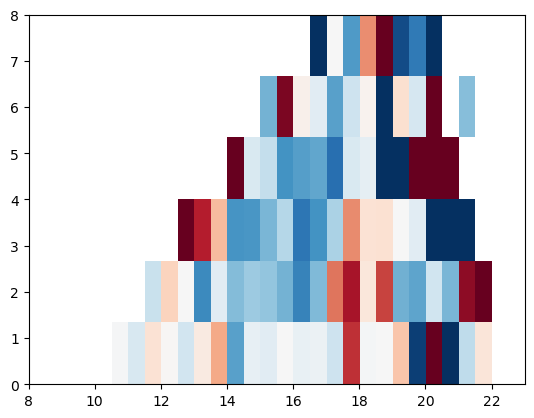

In [504]:
plt.imshow(phi_m_avg_phi_per_r[10:19],
              origin='lower',
                vmax=5,
                vmin=-5,
                norm='linear',
                cmap = 'RdBu', extent=[8, 23,0, 8],aspect='auto')
#fig.colorbar(pcm, ax=ax, location='top', label='$V_\phi - <V_\phi(R)>$ [km s$^{-1}$]')
#ax[2].grid(True)

In [505]:
avg_phi_per_r_hist = np.copy(bin_x_y_r.statistic.T)
avg_phi_per_r_hist[:] = np.nan

xes = []
yes = []

for rr in range(len(r_bins)-1):
    # at one radius, what is the index of the 2dhist
    #print(rr)
    r_bin_index = np.where((bin_x_y_r.statistic.T >=r_bins[rr])&(bin_x_y_r.statistic.T <r_bins[rr+1]))  #the x and y position in the grid

    #print(r_bin_index)# first row is idx up to 20 and second is 30

    # the phi values of the bins at the R range
    ahh=phi_m_avg_phi_per_r[r_bin_index[0], r_bin_index[1]] # values in each r ring
    #print(ahh)
    ahhh = ahh[(len(ahh)//2):len(ahh)]
    # find the value closest to zero in each r ring
    #absmin_val = find_nearest(ahh, 0)
    
    # where is this value located in r ring values?
    #print(np.where(ahh == absmin_val))
    try:
        idx_pt1 = (np.abs(ahhh - 0)).argmin()
        #print(ahhh[idx_pt1])
        idx = np.where(ahhh[idx_pt1] == ahh)
    except:
        #print('ah')
        continue
    #print(idx)
    # where is this value located in x and y?
    r_now = bin_x_y_r.statistic.T[r_bin_index[0], r_bin_index[1]] # rnow has same length as ahh
    #print(r_now)
    #print(ahh[idx])
    #print(r_now[idx])
    
    val_min_idx = np.where(bin_x_y_r.statistic.T == r_now[idx])
    #print('binxy vals',val_min_idx[0], val_min_idx[1])
    
    #print(bin_x_y_r.x_edge)
    #print(bin_x_y_r.y_edge)
    #print(bin_x_y_r.x_edge[val_min_idx[1]]) #opposite cuz we transposed the 
    #print(bin_x_y_r.y_edge[val_min_idx[0]])
    
    xes.append(bin_x_y_r.x_edge[val_min_idx[1]][0]) #opposite cuz we transposed the 
    yes.append(bin_x_y_r.y_edge[val_min_idx[0]][0])
    
    
    #print()
    

    #avg_phi_per_r_hist[r_bin_index[0], r_bin_index[1]] = np.nanmedian(phi_in_r_bin)

In [506]:
x_binsize = bin_x_y_r.x_edge[1]-bin_x_y_r.x_edge[0]
y_binsize = bin_x_y_r.y_edge[1]-bin_x_y_r.y_edge[0]
x_binsize, y_binsize

(0.5, 1.0)

[ 8.25  9.25  9.75 10.25 10.75 10.75 11.75 12.25 12.25 12.75 13.25 14.25
 14.75 15.25 15.75 15.75 16.75 16.75 16.25 16.75 17.25 18.75 19.25 19.75
 19.75 21.25 21.75 21.25]


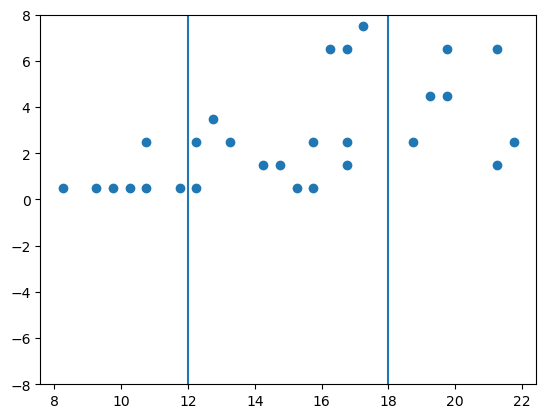

In [507]:
xes = np.array(xes)+x_binsize/2
yes = np.array(yes)+y_binsize/2



plt.scatter(xes, yes)
print(xes)
a,b,c= np.polyfit(xes,yes,2)

xxx = np.arange(8,23,1)



plt.ylim(-8,8)
plt.vlines(12, -8,8)
plt.vlines(18, -8,8)

In [508]:
from scipy.optimize import curve_fit

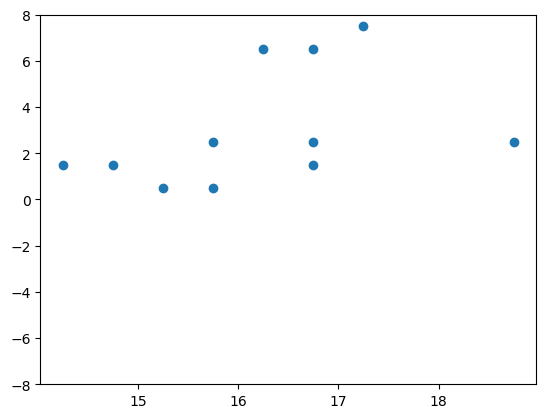

[  0.84393064 -10.6300578 ]
49121.227275975645


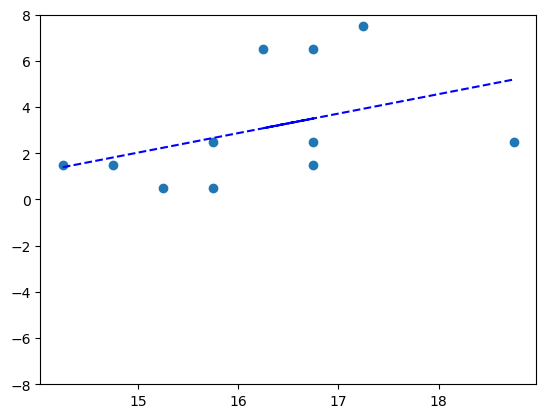

In [509]:
sigmaclip_ind = np.where(((yes >-0)|(xes <14))&(xes>14)&(xes<19))

plt.scatter(xes[sigmaclip_ind], yes[sigmaclip_ind])
plt.ylim(-8, 8)
plt.show()

# fit line to data scipy curvefit

def linear(x, a, b):
    return a * x + b



popt, pcov = curve_fit(linear, xes[sigmaclip_ind],  yes[sigmaclip_ind])
m = popt[0]
b = popt[1]
print(popt)
print(np.linalg.cond(pcov))

plt.scatter(xes[sigmaclip_ind], yes[sigmaclip_ind])
plt.plot(xes[sigmaclip_ind], m*xes[sigmaclip_ind]+b, 'b--')
plt.ylim(-8, 8)
plt.show()

[ -0.06583746   0.83959647 -10.63005696]
441734320334107.94


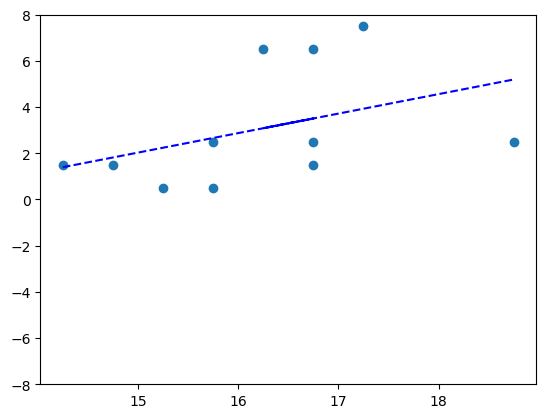

In [510]:
def quad(x, a1, a2, a3):
    return a1**2 * x + a2*x + a3

popt, pcov = curve_fit(quad, xes[sigmaclip_ind],  yes[sigmaclip_ind])
a1 = popt[0]
a2 = popt[1]
a3 = popt[2]
print(popt)
print(np.linalg.cond(pcov))
xdata = xes[sigmaclip_ind]
ydata =  yes[sigmaclip_ind]

plt.scatter(xdata, ydata)
plt.plot(xdata, a1**2*xdata+a2*xdata+a3, 'b--')
plt.ylim(-8, 8)
plt.show()

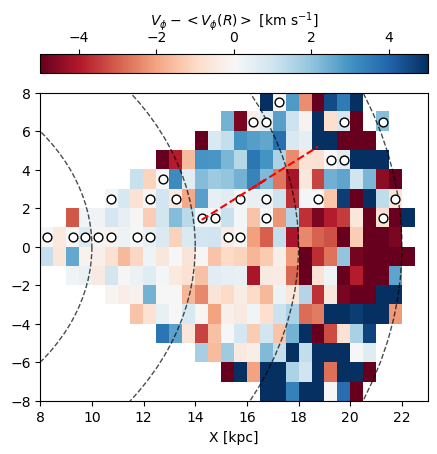

In [511]:
fig,ax = plt.subplots(1, figsize=(5,5))
pcm = ax.imshow(phi_m_avg_phi_per_r,
              origin='lower',
                vmax=5,
                vmin=-5,
                norm='linear',
                cmap = 'RdBu', extent=[8, 23,-8, 8],aspect='auto')
fig.colorbar(pcm, ax=ax, location='top', label='$V_\phi - <V_\phi(R)>$ [km s$^{-1}$]')
#ax[2].grid(True)
ax.set_xlabel('X [kpc]')

circ = matplotlib.patches.Annulus((0,0), 18,4, ec='k', lw=1, linestyle='--',fill=False, alpha=0.7)
ax.add_patch(circ)
    
circ = matplotlib.patches.Annulus((0,0), 22,12, ec='k', lw=1, linestyle='--',fill=False, alpha=0.7)
ax.add_patch(circ)

ax.set_xlim(8, 23)
ax.set_ylim(-8,8)
plt.scatter(xes, yes, color='w', s=40, edgecolors='k')
plt.plot(xes[sigmaclip_ind], m*xes[sigmaclip_ind]+b, 'r--')


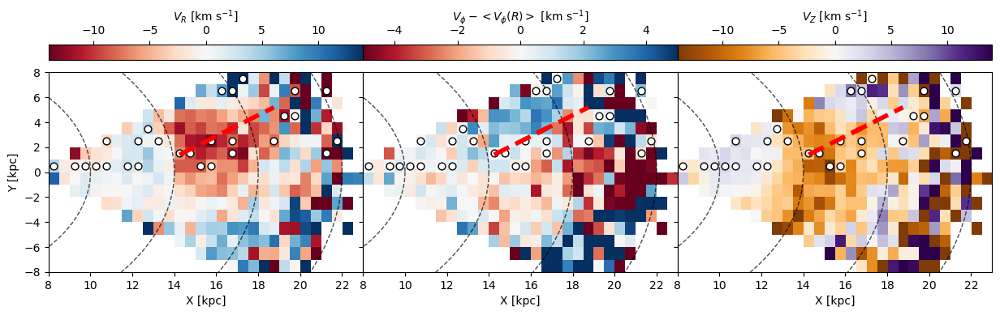

In [538]:

nxbins = 30
nybins = 16
binsarr = [nxbins, nybins]

# plotting
fig, ax = plt.subplots(1,3, figsize=(15,4), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})



ax[0].set_xlabel('X [kpc]')
ax[0].set_ylabel('Y [kpc]')


###########################################################################################
###########################################################################################
###########################################################################################


bin_x_y =scipy.stats.binned_statistic_2d(galac_xind500[disky_index],
                                           galac_yind500[disky_index],
                                           v_r_ind500[disky_index],
                                           'median', bins=binsarr,
                                           range = rangearr)


pcm = ax[0].imshow(bin_x_y.statistic.T,
                origin='lower',
                vmax=14,
                vmin=-14,
                norm='linear',
                cmap = 'RdBu', extent=[8, 23,-8, 8],aspect='auto')
fig.colorbar(pcm, ax=ax[0], location='top', label='$V_R$ [km s$^{-1}$]')
#ax[1].grid(True)
ax[0].set_xlabel('X [kpc]')
#ax[0].set_ylabel('Y [kpc]')

###########################################################################################
###########################################################################################
###########################################################################################


pcm = ax[1].imshow(phi_m_avg_phi_per_r,
              origin='lower',
                vmax=5,
                vmin=-5,
                norm='linear',
                cmap = 'RdBu', extent=[8, 23,-8, 8],aspect='auto')
fig.colorbar(pcm, ax=ax[1], location='top', label='$V_\phi - <V_\phi(R)>$ [km s$^{-1}$]')
#ax[2].grid(True)
ax[1].set_xlabel('X [kpc]')



###########################################################################################
###########################################################################################
###########################################################################################


bin_x_y =scipy.stats.binned_statistic_2d(galac_xind500[disky_index],
                                           galac_yind500[disky_index],
                                           v_z_ind500[disky_index],
                                           'median', bins=binsarr,
                                           range = rangearr)


pcm = ax[2].imshow(bin_x_y.statistic.T,
                origin='lower',
                vmax=14,
                vmin=-14,
                norm='linear',
                cmap = 'PuOr', extent=[8, 23,-8, 8],aspect='auto')
fig.colorbar(pcm, ax=ax[2], location='top', label='$V_Z$ [km s$^{-1}$]')
#ax[1].grid(True)
ax[2].set_xlabel('X [kpc]')
#ax[0].set_ylabel('Y [kpc]')

for i in range(3):
    

    circ = matplotlib.patches.Annulus((0,0), 18,4, ec='k', lw=1, linestyle='--',fill=False, alpha=0.7)
    ax[i].add_patch(circ)
    
    circ = matplotlib.patches.Annulus((0,0), 22,12, ec='k', lw=1, linestyle='--',fill=False, alpha=0.7)
    ax[i].add_patch(circ)
    
    ax[i].scatter(xes, yes, color='w', s=40, edgecolors='k')
    ax[i].plot(xes[sigmaclip_ind], m*xes[sigmaclip_ind]+b, 'r--', linewidth=4)
    
    
    ax[i].set_ylim(-8,8)
    ax[i].set_xlim(8,23)
    
print()

#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/XY_Vr_Vphi_Vz_plot.png', dpi=400)




### add residual model thing

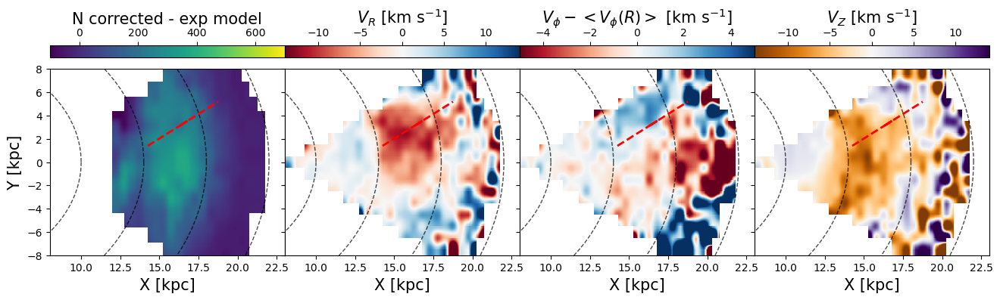

In [690]:

nxbins = 30
nybins = 16
rangearr=[[8, 23],[-8, 8]]
binsarr = [nxbins, nybins]
interp='hamming'

# plotting
fig, ax = plt.subplots(1,4, figsize=(16,4), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})



ax[0].set_xlabel('X [kpc]', fontsize=15)
ax[0].set_ylabel('Y [kpc]', fontsize=15)

xy_val = [12,23, -10,10]
pcm = ax[0].imshow(multiplied_mask_overdense1.T, origin='lower',
                vmax=700,
                vmin=-100,
                #norm='log',
                cmap = 'viridis', 
                extent=xy_val,
                aspect='auto', interpolation = interp)

#ax.hlines(0,xy_val[0],xy_val[1],'k', linestyle='--')
#ax.set_xlim(12,23)
ax[0].set_ylim(-8,8)

cb = fig.colorbar(pcm, ax=ax[0], location='top')
cb.set_label(label='N corrected - exp model',size=15)


###########################################################################################
###########################################################################################
###########################################################################################


bin_x_y =scipy.stats.binned_statistic_2d(galac_xind500[disky_index],
                                           galac_yind500[disky_index],
                                           v_r_ind500[disky_index],
                                           'median', bins=binsarr,
                                           range = rangearr)


pcm = ax[1].imshow(bin_x_y.statistic.T,
                origin='lower',
                vmax=14,
                vmin=-14,
                norm='linear',
                cmap = 'RdBu', extent=[8, 23,-8, 8],aspect='auto', interpolation = interp)
cb = fig.colorbar(pcm, ax=ax[1], location='top', label='$V_R$ [km s$^{-1}$]')
cb.set_label(label='$V_R$ [km s$^{-1}$]',size=15)
#ax[1].grid(True)
ax[1].set_xlabel('X [kpc]', fontsize=15)
#ax[0].set_ylabel('Y [kpc]')

###########################################################################################
###########################################################################################
###########################################################################################


pcm = ax[2].imshow(phi_m_avg_phi_per_r,
              origin='lower',
                vmax=5,
                vmin=-5,
                norm='linear',
                cmap = 'RdBu', extent=[8, 23,-8, 8],aspect='auto', interpolation = interp)
cb = fig.colorbar(pcm, ax=ax[2], location='top', label='$V_\phi - <V_\phi(R)>$ [km s$^{-1}$]')
cb.set_label(label='$V_\phi - <V_\phi(R)>$ [km s$^{-1}$]',size=15)
#ax[2].grid(True)
ax[2].set_xlabel('X [kpc]', fontsize=15)



###########################################################################################
###########################################################################################
###########################################################################################


bin_x_y =scipy.stats.binned_statistic_2d(galac_xind500[disky_index],
                                           galac_yind500[disky_index],
                                           v_z_ind500[disky_index],
                                           'median', bins=binsarr,
                                           range = rangearr)


pcm = ax[3].imshow(bin_x_y.statistic.T,
                origin='lower',
                vmax=14,
                vmin=-14,
                norm='linear',
                cmap = 'PuOr', extent=[8, 23,-8, 8],aspect='auto', interpolation = interp)
cb = fig.colorbar(pcm, ax=ax[3], location='top', )
cb.set_label(label='$V_Z$ [km s$^{-1}$]',size=15)
#ax[1].grid(True)
ax[3].set_xlabel('X [kpc]', fontsize=15)
#ax[0].set_ylabel('Y [kpc]')


for i in range(4):
    

    circ = matplotlib.patches.Annulus((0,0), 18,4, ec='k', lw=1, linestyle='--',fill=False, alpha=0.7)
    ax[i].add_patch(circ)
    
    circ = matplotlib.patches.Annulus((0,0), 22,12, ec='k', lw=1, linestyle='--',fill=False, alpha=0.7)
    ax[i].add_patch(circ)
    
    #if i > 0:
   #     ax[i].scatter(xes, yes, color='w', s=40, edgecolors='k')
    ax[i].plot(xes[sigmaclip_ind], m*xes[sigmaclip_ind]+b, 'r--', linewidth=2)
    
    
    ax[i].set_ylim(-8,8)
    ax[i].set_xlim(8,23)
    
print()

#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/XY_Vr_Vphi_Vz_plot.png', dpi=400)

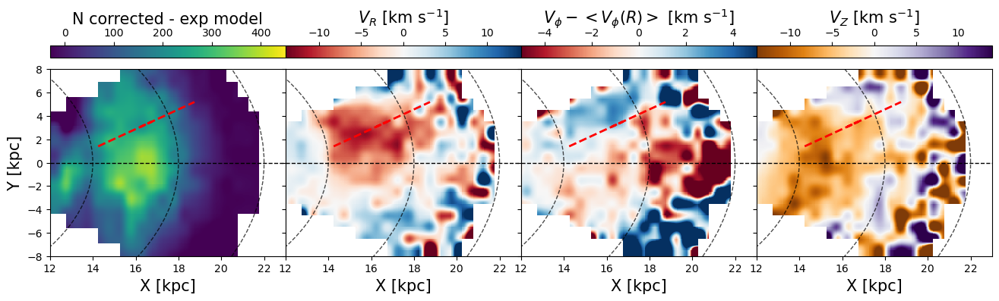

In [699]:
#keep
nxbins = 30
nybins = 16
rangearr=[[8, 23],[-8, 8]]
binsarr = [nxbins, nybins]
interp = 'hamming'

# plotting
fig, ax = plt.subplots(1,4, figsize=(16,4), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})


ax[0].set_xlabel('X [kpc]', fontsize=15)
ax[0].set_ylabel('Y [kpc]', fontsize=15)

xy_val = [12,23, -10,10]
pcm = ax[0].imshow(multiplied_mask_overdense1.T, origin='lower',
                vmax=450,
                vmin=-30,
                #norm='log',
                cmap = 'viridis', 
                extent=xy_val,
                aspect='auto', interpolation = interp)

#ax.hlines(0,xy_val[0],xy_val[1],'k', linestyle='--')
#ax.set_xlim(12,23)
ax[0].set_ylim(-8,8)

cb = fig.colorbar(pcm, ax=ax[0], location='top')
cb.set_label(label='N corrected - exp model',size=15)


###########################################################################################
###########################################################################################
###########################################################################################


bin_x_y =scipy.stats.binned_statistic_2d(galac_xind500[disky_index],
                                           galac_yind500[disky_index],
                                           v_r_ind500[disky_index],
                                           'median', bins=binsarr,
                                           range = rangearr)


pcm = ax[1].imshow(bin_x_y.statistic.T,
                origin='lower',
                vmax=14,
                vmin=-14,
                norm='linear',
                cmap = 'RdBu', extent=[8, 23,-8, 8],aspect='auto', interpolation = interp)

cb = fig.colorbar(pcm, ax=ax[1], location='top',)
cb.set_label( label='$V_R$ [km s$^{-1}$]',size=15)

#ax[1].grid(True)
ax[1].set_xlabel('X [kpc]', fontsize=15)
#ax[0].set_ylabel('Y [kpc]')

###########################################################################################
###########################################################################################
###########################################################################################


pcm = ax[2].imshow(phi_m_avg_phi_per_r,
              origin='lower',
                vmax=5,
                vmin=-5,
                norm='linear',
                cmap = 'RdBu', extent=[8, 23,-8, 8],aspect='auto', interpolation = interp)

cb = fig.colorbar(pcm, ax=ax[2], location='top', )
cb.set_label(label='$V_\phi - <V_\phi(R)>$ [km s$^{-1}$]',size=15)
#ax[2].grid(True)
ax[2].set_xlabel('X [kpc]', fontsize=15)



###########################################################################################
###########################################################################################
###########################################################################################


bin_x_y =scipy.stats.binned_statistic_2d(galac_xind500[disky_index],
                                           galac_yind500[disky_index],
                                           v_z_ind500[disky_index],
                                           'median', bins=binsarr,
                                           range = rangearr)


pcm = ax[3].imshow(bin_x_y.statistic.T,
                origin='lower',
                vmax=14,
                vmin=-14,
                norm='linear',
                cmap = 'PuOr', extent=[8, 23,-8, 8],aspect='auto', interpolation = interp)


cb = fig.colorbar(pcm, ax=ax[3], location='top',)
cb.set_label( label='$V_Z$ [km s$^{-1}$]',size=15)


#ax[1].grid(True)
ax[3].set_xlabel('X [kpc]', fontsize=15)
#ax[0].set_ylabel('Y [kpc]')

for i in range(4):
    

    circ = matplotlib.patches.Annulus((0,0), 18,4, ec='k', lw=1, linestyle='--',fill=False, alpha=0.7)
    ax[i].add_patch(circ)
    
    circ = matplotlib.patches.Annulus((0,0), 22,12, ec='k', lw=1, linestyle='--',fill=False, alpha=0.7)
    ax[i].add_patch(circ)
    
    #if i > 0:
   #     ax[i].scatter(xes, yes, color='w', s=40, edgecolors='k')
    ax[i].plot(xes[sigmaclip_ind], m*xes[sigmaclip_ind]+b, 'r--', linewidth=2)
    ax[i].hlines(0, 12, 23, 'k', linestyle='--',lw=1)
    
    ax[i].set_ylim(-8,8)
    ax[i].set_xlim(12,23)
    
print()

#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/loa_XY_Vr_Vphi_Vz_plot_010925.png', dpi=400)

(16, 21)


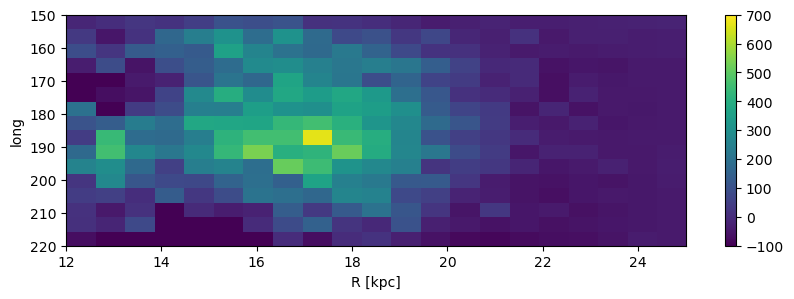

In [530]:
print(np.shape(resid_2d))

r_dense = np.linspace(12, 25, np.shape(resid_2d)[1]+1)
phi_dense = np.linspace(150, 220, np.shape(resid_2d)[0]+1)

r_dense, phi_dense

fig,ax = plt.subplots(1,1, figsize=(10,3))
pcm = ax.imshow(resid_2d, origin='upper',
                vmax=700,
                vmin=-100,
                #norm='log',
                cmap = 'viridis', extent=[12,25,220, 150],aspect='auto')
ax.set_xlabel('R [kpc]')
ax.set_ylabel('long')
fig.colorbar(pcm, ax=ax)

In [531]:
r_ind500[disky_index]



array([10.51513887, 16.63222341, 10.88509362, ..., 13.96943959,
       10.37260906, 13.02278064])

# cubic fit

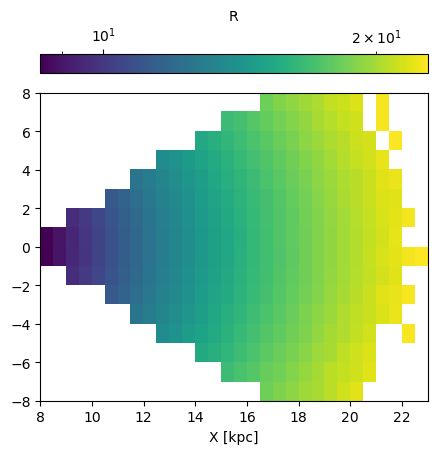

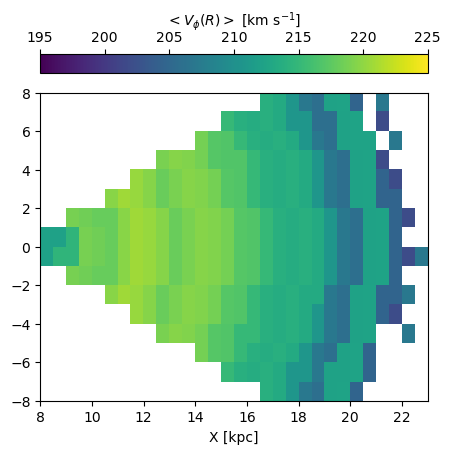

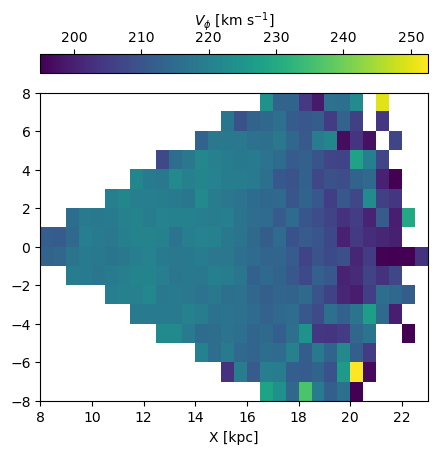

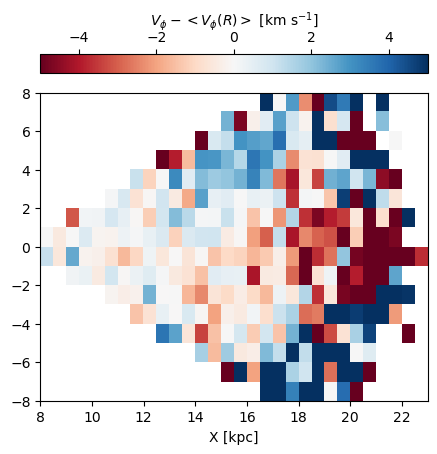

y [-8. -7. -6. -5. -4. -3. -2. -1.  0.  1.  2.  3.  4.  5.  6.  7.  8.]
[ 8.   8.5  9.   9.5 10.  10.5 11.  11.5 12.  12.5 13.  13.5 14.  14.5
 15.  15.5 16.  16.5 17.  17.5 18.  18.5 19.  19.5 20.  20.5 21.  21.5
 22.  22.5 23.  23.5]
y [-5. -4. -3. -2. -1.  0.  1.  2.  3.  4.]
[ 2.69280579  0.76377701 -1.65282144 -1.4770009  -0.04532469  0.95317308
  0.04532469 -1.88813853  0.55061897 -3.91114323]
[-0.0631934  -0.09659554  0.53392365 -0.09876646]


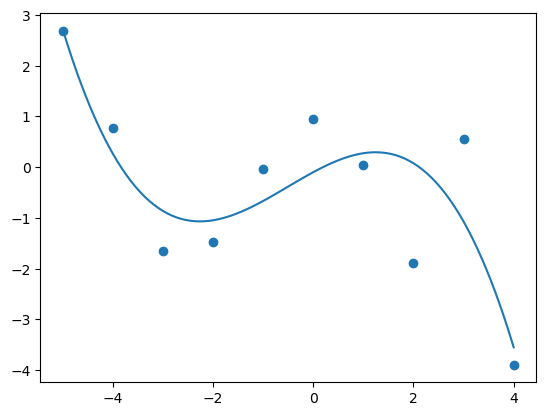

[ 2.71590151  2.42837817  2.15464114  1.89440553  1.64738647  1.41329911
  1.19185857  0.98277997  0.78577846  0.60056917  0.42686722  0.26438774
  0.11284587 -0.02804326 -0.15856452 -0.27900278 -0.3896429  -0.49076977
 -0.58266824 -0.66562318 -0.73991947 -0.80584197 -0.86367555 -0.91370508
 -0.95621543 -0.99149146 -1.01981806 -1.04148007 -1.05676238 -1.06594986
 -1.06932736 -1.06717977 -1.05979194 -1.04744875 -1.03043507 -1.00903577
 -0.9835357  -0.95421975 -0.92137279 -0.88527967 -0.84622528 -0.80449447
 -0.76037212 -0.71414309 -0.66609226 -0.61650449 -0.56566466 -0.51385763
 -0.46136826 -0.40848144 -0.35548202 -0.30265488 -0.25028489 -0.19865691
 -0.14805581 -0.09876646 -0.05107374 -0.0052625   0.03838238  0.07957603
  0.11803358  0.15347017  0.18560093  0.21414098  0.23880547  0.25930951
  0.27536825  0.2866968   0.29301032  0.29402391  0.28945272  0.27901188
  0.26241652  0.23938177  0.20962276  0.17285462  0.12879248  0.07715148
  0.01764674 -0.0500066  -0.12609341 -0.21089856 -0

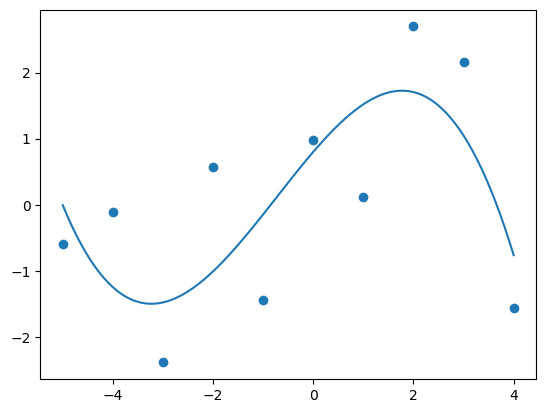

[-0.00809621 -0.17087511 -0.32297712 -0.46463452 -0.59607961 -0.71754471
 -0.8292621  -0.93146409 -1.02438297 -1.10825104 -1.18330061 -1.24976397
 -1.30787342 -1.35786126 -1.3999598  -1.43440132 -1.46141813 -1.48124253
 -1.49410682 -1.50024329 -1.49988425 -1.493262   -1.48060883 -1.46215705
 -1.43813894 -1.40878683 -1.37433299 -1.33500973 -1.29104936 -1.24268417
 -1.19014645 -1.13366851 -1.07348265 -1.00982117 -0.94291637 -0.87300054
 -0.80030598 -0.725065   -0.6475099  -0.56787296 -0.4863865  -0.40328281
 -0.31879419 -0.23315295 -0.14659137 -0.05934176  0.02836359  0.11629236
  0.20421227  0.29189101  0.37909629  0.4655958   0.55115725  0.63554833
  0.71853675  0.79989021  0.87937641  0.95676305  1.03181783  1.10430845
  1.17400261  1.24066802  1.30407236  1.36398335  1.42016869  1.47239607
  1.52043319  1.56404777  1.60300749  1.63708005  1.66603317  1.68963454
  1.70765185  1.71985282  1.72600514  1.72587651  1.71923463  1.7058472
  1.68548193  1.65790652  1.62288866  1.58019606  1.

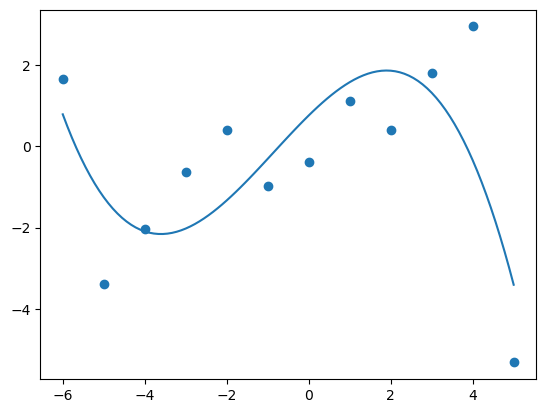

[ 0.78537164  0.49070447  0.21401289 -0.04509976 -0.28703014 -0.51217492
 -0.72093075 -0.9136943  -1.09086223 -1.2528312  -1.39999788 -1.53275893
 -1.65151101 -1.75665078 -1.84857491 -1.92768005 -1.99436287 -2.04902004
 -2.09204821 -2.12384404 -2.14480421 -2.15532537 -2.15580418 -2.1466373
 -2.12822141 -2.10095315 -2.0652292  -2.02144622 -1.97000086 -1.91128979
 -1.84570968 -1.77365717 -1.69552895 -1.61172167 -1.52263198 -1.42865656
 -1.33019207 -1.22763517 -1.12138252 -1.01183078 -0.89937662 -0.78441669
 -0.66734767 -0.5485662  -0.42846897 -0.30745262 -0.18591382 -0.06424923
  0.05714448  0.17787066  0.29753263  0.41573375  0.53207734  0.64616675
  0.7576053   0.86599635  0.97094322  1.07204926  1.1689178   1.26115218
  1.34835574  1.43013181  1.50608374  1.57581485  1.6389285   1.69502801
  1.74371672  1.78459797  1.81727511  1.84135146  1.85643036  1.86211516
  1.85800918  1.84371578  1.81883827  1.78298001  1.73574433  1.67673457
  1.60555407  1.52180615  1.42509417  1.31502146  1.

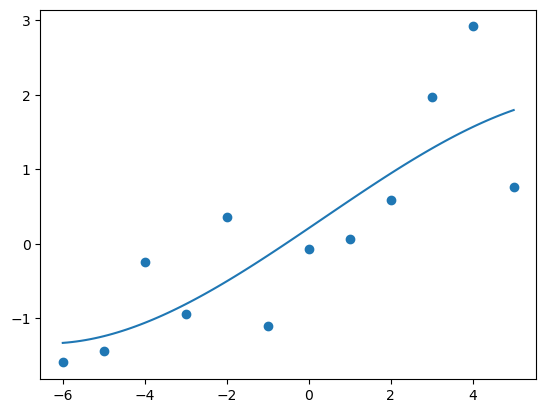

[-1.33342657 -1.32830877 -1.32190977 -1.31425246 -1.30535976 -1.29525457
 -1.28395978 -1.27149831 -1.25789305 -1.24316692 -1.22734281 -1.21044363
 -1.19249228 -1.17351166 -1.15352469 -1.13255426 -1.11062327 -1.08775464
 -1.06397126 -1.03929604 -1.01375188 -0.98736169 -0.96014836 -0.93213481
 -0.90334394 -0.87379864 -0.84352183 -0.81253641 -0.78086528 -0.74853134
 -0.71555751 -0.68196668 -0.64778175 -0.61302563 -0.57772123 -0.54189145
 -0.50555919 -0.46874735 -0.43147884 -0.39377656 -0.35566343 -0.31716233
 -0.27829617 -0.23908786 -0.19956031 -0.15973641 -0.11963907 -0.07929119
 -0.03871567  0.00206457  0.04302664  0.08414763  0.12540464  0.16677476
  0.2082351   0.24976275  0.29133479  0.33292834  0.37452049  0.41608832
  0.45760895  0.49905946  0.54041695  0.58165852  0.62276127  0.66370228
  0.70445866  0.74500751  0.78532591  0.82539097  0.86517978  0.90466944
  0.94383704  0.98265968  1.02111446  1.05917847  1.09682881  1.13404258
  1.17079687  1.20706877  1.24283539  1.27807382  1

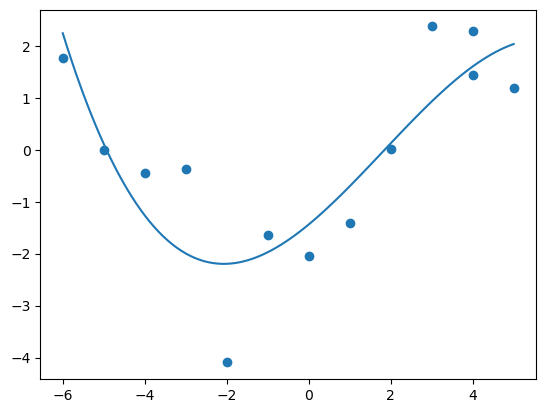

[ 2.24240846  1.96501041  1.69814009  1.44164566  1.19537528  0.95917712
  0.73289933  0.51639009  0.30949756  0.11206989 -0.07604475 -0.25499819
 -0.42494228 -0.58602885 -0.73840973 -0.88223677 -1.01766179 -1.14483665
 -1.26391317 -1.37504319 -1.47837855 -1.57407109 -1.66227264 -1.74313504
 -1.81681012 -1.88344973 -1.94320571 -1.99622987 -2.04267408 -2.08269015
 -2.11642994 -2.14404527 -2.16568798 -2.18150991 -2.1916629  -2.19629878
 -2.19556939 -2.18962657 -2.17862216 -2.16270798 -2.14203589 -2.11675771
 -2.08702528 -2.05299044 -2.01480503 -1.97262088 -1.92658984 -1.87686373
 -1.82359439 -1.76693367 -1.70703339 -1.64404541 -1.57812154 -1.50941363
 -1.43807352 -1.36425304 -1.28810403 -1.20977833 -1.12942778 -1.0472042
 -0.96325945 -0.87774535 -0.79081374 -0.70261646 -0.61330535 -0.52303224
 -0.43194897 -0.34020737 -0.2479593  -0.15535657 -0.06255103  0.03030548
  0.12306113  0.21556409  0.3076625   0.39920454  0.49003838  0.58001216
  0.66897406  0.75677224  0.84325486  0.92827009  1.

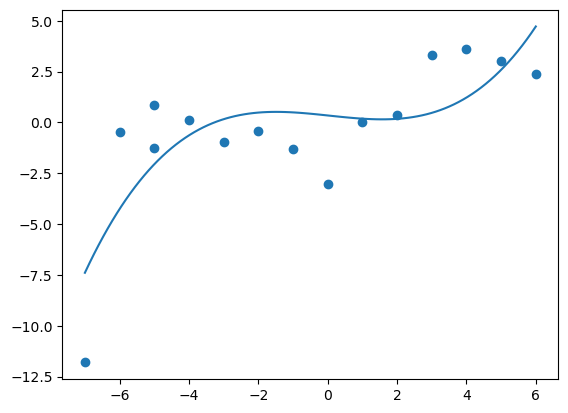

[-7.39598049 -6.92537736 -6.47321089 -6.03913069 -5.62278634 -5.22382744
 -4.84190358 -4.47666436 -4.12775937 -3.7948382  -3.47755045 -3.1755457
 -2.88847355 -2.6159836  -2.35772544 -2.11334866 -1.88250285 -1.6648376
 -1.46000252 -1.26764719 -1.08742121 -0.91897417 -0.76195566 -0.61601528
 -0.48080261 -0.35596726 -0.24115882 -0.13602687 -0.04022101  0.04660916
  0.12481405  0.19474407  0.25674963  0.31118113  0.35838897  0.39872358
  0.43253535  0.46017468  0.481992    0.49833769  0.50956218  0.51601586
  0.51804915  0.51601245  0.51025616  0.50113071  0.48898648  0.47417389
  0.45704334  0.43794525  0.41723001  0.39524804  0.37234975  0.34888553
  0.3252058   0.30166096  0.27860142  0.25637758  0.23533987  0.21583867
  0.19822439  0.18284745  0.17005826  0.16020721  0.15364471  0.15072117
  0.15178701  0.15719261  0.1672884   0.18242478  0.20295216  0.22922093
  0.26158152  0.30038432  0.34597974  0.39871819  0.45895008  0.52702582
  0.6032958   0.68811044  0.78182014  0.88477532  0.9

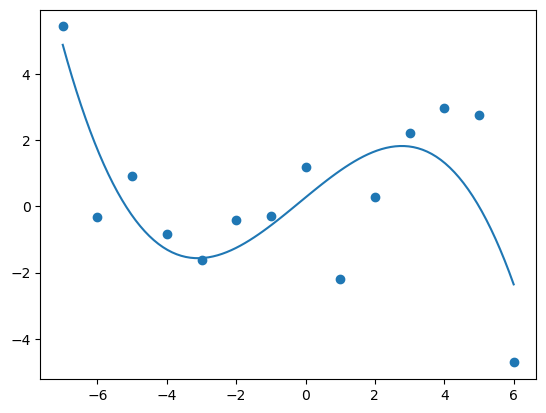

[ 4.87583045  4.38690656  3.92112348  3.47802799  3.0571669   2.65808699
  2.28033507  1.92345793  1.58700236  1.27051516  0.97354312  0.69563304
  0.43633172  0.19518595 -0.02825748 -0.23445177 -0.42385012 -0.59690574
 -0.75407183 -0.8958016  -1.02254826 -1.134765   -1.23290504 -1.31742157
 -1.3887678  -1.44739695 -1.4937622  -1.52831677 -1.55151386 -1.56380668
 -1.56564843 -1.55749231 -1.53979154 -1.51299931 -1.47756883 -1.4339533
 -1.38260593 -1.32397993 -1.25852849 -1.18670483 -1.10896215 -1.02575365
 -0.93753254 -0.84475202 -0.74786529 -0.64732557 -0.54358606 -0.43709996
 -0.32832047 -0.21770081 -0.10569417  0.00724624  0.12066722  0.23411555
  0.34713804  0.45928148  0.57009267  0.67911839  0.78590546  0.89000065
  0.99095077  1.08830261  1.18160298  1.27039865  1.35423643  1.43266311
  1.5052255   1.57147037  1.63094454  1.68319478  1.72776791  1.76421071
  1.79206999  1.81089252  1.82022512  1.81961457  1.80860768  1.78675123
  1.75359202  1.70867685  1.65155251  1.58176579  1.

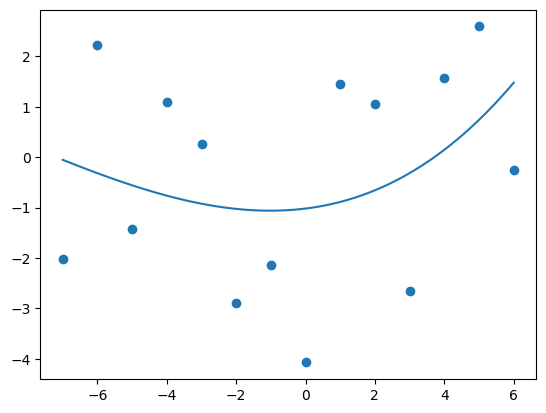

[-0.05362767 -0.08940579 -0.12492494 -0.16016079 -0.19508903 -0.22968532
 -0.26392535 -0.29778478 -0.3312393  -0.36426458 -0.39683628 -0.4289301
 -0.4605217  -0.49158676 -0.52210095 -0.55203995 -0.58137944 -0.61009508
 -0.63816256 -0.66555755 -0.69225573 -0.71823277 -0.74346434 -0.76792612
 -0.79159379 -0.81444302 -0.83644948 -0.85758886 -0.87783683 -0.89716905
 -0.91556122 -0.93298899 -0.94942806 -0.96485408 -0.97924275 -0.99256972
 -1.00481069 -1.01594132 -1.02593729 -1.03477427 -1.04242794 -1.04887398
 -1.05408806 -1.05804585 -1.06072303 -1.06209528 -1.06213826 -1.06082766
 -1.05813916 -1.05404842 -1.04853112 -1.04156294 -1.03311955 -1.02317662
 -1.01170984 -0.99869488 -0.9841074  -0.9679231  -0.95011764 -0.93066669
 -0.90954594 -0.88673106 -0.86219773 -0.83592161 -0.80787838 -0.77804373
 -0.74639332 -0.71290283 -0.67754793 -0.64030431 -0.60114763 -0.56005357
 -0.5169978  -0.47195601 -0.42490386 -0.37581704 -0.32467121 -0.27144205
 -0.21610524 -0.15863646 -0.09901137 -0.03720565  0.

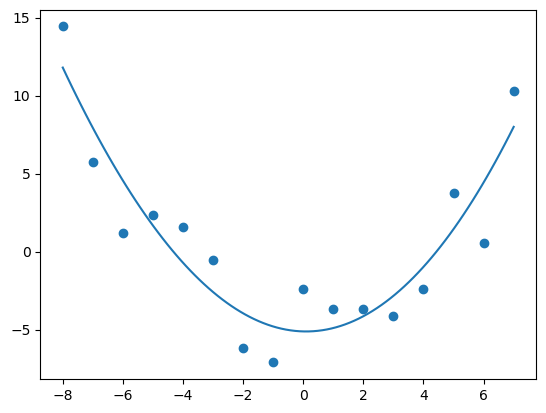

[11.79271827 11.17644441 10.57120354  9.97701918  9.39391487  8.82191413
  8.26104049  7.71131749  7.17276864  6.64541748  6.12928753  5.62440233
  5.13078541  4.64846029  4.1774505   3.71777957  3.26947103  2.83254841
  2.40703524  1.99295504  1.59033135  1.19918769  0.81954759  0.45143459
  0.0948722  -0.25011603 -0.58350659 -0.90527594 -1.21540056 -1.51385691
 -1.80062147 -2.07567071 -2.33898109 -2.5905291  -2.8302912  -3.05824386
 -3.27436356 -3.47862676 -3.67100994 -3.85148957 -4.02004211 -4.17664405
 -4.32127184 -4.45390197 -4.5745109  -4.68307511 -4.77957107 -4.86397524
 -4.9362641  -4.99641411 -5.04440176 -5.08020352 -5.10379584 -5.11515521
 -5.1142581  -5.10108097 -5.0756003  -5.03779256 -4.98763422 -4.92510175
 -4.85017162 -4.76282031 -4.66302428 -4.55076001 -4.42600397 -4.28873262
 -4.13892245 -3.97654992 -3.8015915  -3.61402366 -3.41382287 -3.20096562
 -2.97542836 -2.73718756 -2.48621971 -2.22250127 -1.94600871 -1.6567185
 -1.35460712 -1.03965103 -0.71182671 -0.37111063 -0.

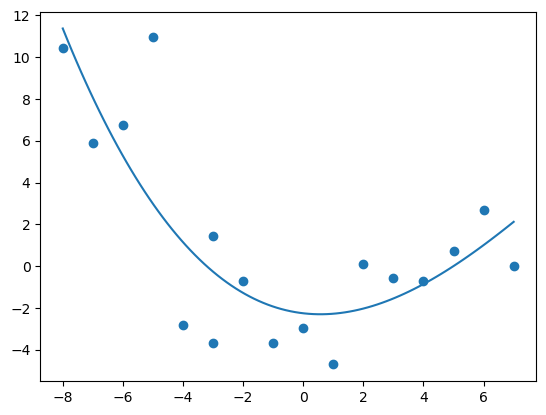

[11.36903978 10.83320013 10.30995082  9.79918168  9.30078256  8.81464331
  8.34065378  7.87870379  7.42868321  6.99048188  6.56398964  6.14909634
  5.74569181  5.35366591  4.97290849  4.60330938  4.24475843  3.89714548
  3.56036039  3.23429299  2.91883314  2.61387066  2.31929542  2.03499726
  1.76086601  1.49679153  1.24266366  0.99837225  0.76380713  0.53885816
  0.32341518  0.11736803 -0.07939343 -0.26697938 -0.44549995 -0.61506531
 -0.77578561 -0.927771   -1.07113165 -1.2059777  -1.33241932 -1.45056665
 -1.56052985 -1.66241908 -1.75634449 -1.84241624 -1.92074447 -1.99143936
 -2.05461105 -2.11036969 -2.15882545 -2.20008847 -2.23426892 -2.26147694
 -2.28182269 -2.29541634 -2.30236802 -2.30278791 -2.29678614 -2.28447289
 -2.26595829 -2.24135252 -2.21076572 -2.17430804 -2.13208965 -2.0842207
 -2.03081134 -1.97197173 -1.90781203 -1.83844238 -1.76397295 -1.68451388
 -1.60017534 -1.51106748 -1.41730045 -1.31898442 -1.21622952 -1.10914593
 -0.99784379 -0.88243326 -0.7630245  -0.63972765 -0.

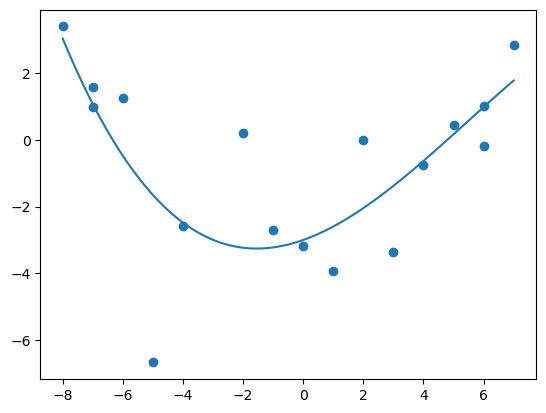

[ 3.02759509  2.70299254  2.38845097  2.08385609  1.78909366  1.5040494
  1.22860906  0.96265837  0.70608307  0.4587689   0.22060159 -0.00853311
 -0.22874948 -0.44016177 -0.64288424 -0.83703116 -1.02271679 -1.20005539
 -1.36916123 -1.53014856 -1.68313166 -1.82822478 -1.96554218 -2.09519813
 -2.2173069  -2.33198273 -2.4393399  -2.53949267 -2.6325553  -2.71864205
 -2.79786719 -2.87034498 -2.93618967 -2.99551554 -3.04843685 -3.09506785
 -3.13552282 -3.169916   -3.19836168 -3.2209741  -3.23786753 -3.24915624
 -3.25495448 -3.25537652 -3.25053662 -3.24054905 -3.22552806 -3.20558792
 -3.18084289 -3.15140723 -3.11739522 -3.07892109 -3.03609913 -2.9890436
 -2.93786875 -2.88268885 -2.82361816 -2.76077094 -2.69426147 -2.62420399
 -2.55071277 -2.47390207 -2.39388616 -2.3107793  -2.22469576 -2.13574978
 -2.04405565 -1.94972761 -1.85287993 -1.75362688 -1.65208272 -1.5483617
 -1.4425781  -1.33484617 -1.22528017 -1.11399438 -1.00110305 -0.88672044
 -0.77096082 -0.65393845 -0.53576759 -0.41656251 -0.29

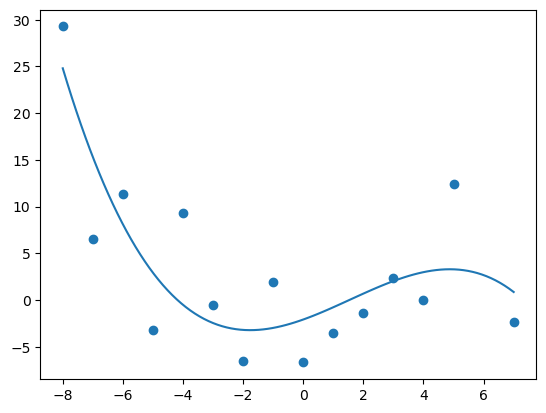

[24.80263033 23.20734101 21.66972375 20.18884916 18.76378783 17.39361037
 16.07738738 14.81418945 13.60308721 12.44315123 11.33345213 10.27306051
  9.26104696  8.2964821   7.37843651  6.50598081  5.6781856   4.89412146
  4.15285902  3.45346887  2.7950216   2.17658783  1.59723815  1.05604317
  0.55207349  0.0843997  -0.34790759 -0.74577778 -1.11014026 -1.44192444
 -1.74205972 -2.01147548 -2.25110114 -2.46186609 -2.64469972 -2.80053145
 -2.93029065 -3.03490674 -3.11530912 -3.17242717 -3.2071903  -3.22052791
 -3.2133694  -3.18664416 -3.14128159 -3.07821109 -2.99836207 -2.90266391
 -2.79204602 -2.66743779 -2.52976863 -2.37996792 -2.21896508 -2.0476895
 -1.86707058 -1.67803771 -1.4815203  -1.27844774 -1.06974943 -0.85635477
 -0.63919316 -0.41919399 -0.19728667  0.0255994   0.24853483  0.47059023
  0.69083618  0.90834329  1.12218217  1.33142342  1.53513763  1.73239541
  1.92226736  2.10382408  2.27613618  2.43827425  2.58930889  2.72831072
  2.85435032  2.9664983   3.06382527  3.14540181  3.

In [532]:

nxbins = 30
nybins = 16
rangearr=[[8, 23],[-8, 8]]
binsarr = [nxbins, nybins]

fig,ax = plt.subplots(1, figsize=(5,5))

bin_x_y_r =scipy.stats.binned_statistic_2d(galac_xind500[disky_index],
                                           galac_yind500[disky_index],
                                           r_ind500[disky_index],
                                           'median', bins=binsarr,
                                           range = rangearr)
pcm = ax.imshow(bin_x_y_r.statistic.T,
              origin='lower',
                #vmax=14,
                #vmin=-14,
                norm='log',
                cmap = 'viridis', extent=[8, 23,-8, 8],aspect='auto')
fig.colorbar(pcm, ax=ax, location='top', label='R')
#ax[2].grid(True)
ax.set_xlabel('X [kpc]')

###########################################################################################
###########################################################################################
###########################################################################################



bin_x_y_phi =scipy.stats.binned_statistic_2d(galac_xind500[disky_index],
                                           galac_yind500[disky_index],
                                           -v_phi_ind500[disky_index],
                                           'median', bins=binsarr,
                                           range = rangearr)

bin_x_y_r =scipy.stats.binned_statistic_2d(galac_xind500[disky_index],
                                           galac_yind500[disky_index],
                                           r_ind500[disky_index],
                                           'median', bins=binsarr,
                                           range = rangearr)



hehe = bin_x_y_phi.statistic.T


avg_phi_per_r_hist = np.copy(bin_x_y_r.statistic.T)
avg_phi_per_r_hist[:] = np.nan

step = (rangearr[0][1]-rangearr[0][0])/nxbins
r_bins = np.arange(rangearr[0][0], rangearr[0][1]+1, step=step) # if before i used bins of 70 over a 18 kpc space that means each bin is ~0.25 kpc
#print(rangearr[0][0], rangearr[0][1], (rangearr[0][1]-rangearr[0][0])/nxbins)
#print(r_bins)
for rr in range(len(r_bins)-1):
    # at one radius, what is the index of the 2dhist
    #print(rr)
    r_bin_index = np.where((bin_x_y_r.statistic.T >r_bins[rr])&(bin_x_y_r.statistic.T <r_bins[rr+1]))  #the x and y position in the grid

    #print(r_bin_index, r_bin_index[1])

    # the phi values of the bins at the R range
    phi_in_r_bin=bin_x_y_phi.statistic.T[r_bin_index[0], r_bin_index[1]]
    #print(np.nanmedian(lol))
    #print(phi_in_r_bin)

    avg_phi_per_r_hist[r_bin_index[0], r_bin_index[1]] = np.nanmedian(phi_in_r_bin)

phi_m_avg_phi_per_r = bin_x_y_phi.statistic.T - avg_phi_per_r_hist # subtract phi hist from avg phi per r hist

fig,ax = plt.subplots(1, figsize=(5,5))
pcm = ax.imshow(avg_phi_per_r_hist,
              origin='lower',
                vmax=225,
                vmin=195,
                norm='linear',
                cmap = 'viridis', extent=[8, 23,-8, 8],aspect='auto')
fig.colorbar(pcm, ax=ax, location='top', label='$<V_\phi(R)>$ [km s$^{-1}$]')
#ax[2].grid(True)
ax.set_xlabel('X [kpc]')

fig,ax = plt.subplots(1, figsize=(5,5))
pcm = ax.imshow(bin_x_y_phi.statistic.T,
              origin='lower',
                #vmax=14,
                vmin=195,
                norm='linear',
                cmap = 'viridis', extent=[8, 23,-8, 8],aspect='auto')
fig.colorbar(pcm, ax=ax, location='top', label='$V_\phi$ [km s$^{-1}$]')
#ax[2].grid(True)
ax.set_xlabel('X [kpc]')



fig,ax = plt.subplots(1, figsize=(5,5))
pcm = ax.imshow(phi_m_avg_phi_per_r,
              origin='lower',
                vmax=5,
                vmin=-5,
                norm='linear',
                cmap = 'RdBu', extent=[8, 23,-8, 8],aspect='auto')
fig.colorbar(pcm, ax=ax, location='top', label='$V_\phi - <V_\phi(R)>$ [km s$^{-1}$]')
#ax[2].grid(True)
ax.set_xlabel('X [kpc]')
plt.show()
#############################################################################################
#############################################################################################
# cubic fit
#############################################################################################
#############################################################################################
print('y',bin_x_y_r.y_edge)
    
print(r_bins)

rr_mins = []
yy_mins = []

for rr in range(12, 24): # only in the desired range
    # at one radius, what is the index of the 2dhist
    #print(rr)
    r_bin_index = np.where((bin_x_y_r.statistic.T >r_bins[rr])&(bin_x_y_r.statistic.T <r_bins[rr+1]))  #the x and y position in the grid for each r bin

    #print(r_bin_index[0], r_bin_index[1])

    # the values of the bins at the R range
    val_in_r_bin=phi_m_avg_phi_per_r[r_bin_index[0], r_bin_index[1]]
    #print(np.nanmedian(lol))
    # what y values are these at?
    y_vals = bin_x_y_r.y_edge[r_bin_index[0]]
    x_vals = bin_x_y_r.x_edge[r_bin_index[1]]
    print('y',y_vals)
    #print('x',x_vals)
    print(val_in_r_bin)
    
    # perform cubic fit
    p = np.polyfit(y_vals, val_in_r_bin, 3)
    print(p)
    
    
    # interpolate yvals
    yy = np.linspace(y_vals[0], y_vals[-1], 100)
    new_vals = p[0]*yy**3 +p[1]*yy**2 + p[2]*yy + p[3]
    plt.scatter(y_vals, val_in_r_bin)
    plt.plot(yy, new_vals)
    plt.show()
    
    print(new_vals)
    #yy_gr_zero_idx = np.where((yy > -2)&(yy<4))
    
    #idx_zero = (np.abs(new_vals - 0)).argmin()
    # look for where the sign changes
    asign = np.sign(new_vals)
    signchange = ((np.roll(asign, 1) - asign) != 0).astype(int)
    signchange[0] = 0
    
    idx_zero = np.where(signchange==1)[0]
    
    print(new_vals[idx_zero], yy[idx_zero])
    print('ooa a a a ')
    
    print(idx_zero)
    
    for j in range(len(idx_zero)):
        
        one_index = idx_zero[j]
        print(one_index)
        print(yy[one_index])
        yy_mins.append(yy[one_index])
        
        rr_mins.append(r_bins[rr])
        
    
    #avg_phi_per_r_hist[r_bin_index[0], r_bin_index[1]] = np.nanmedian(phi_in_r_bin)
    print()

yy_mins = np.array(yy_mins)
rr_mins = np.array(rr_mins)

In [533]:
rr_mins, yy_mins

(array([14. , 14. , 14. , 14.5, 14.5, 15. , 15. , 15. , 15.5, 16. , 16. ,
        16.5, 17. , 17. , 17. , 17.5, 18. , 18. , 18.5, 18.5, 19. , 19. ,
        19.5, 19.5]),
 array([-3.81818182,  0.27272727,  2.18181818, -0.81818182,  3.72727273,
        -5.66666667, -0.66666667,  3.88888889, -0.55555556, -4.88888889,
         1.88888889, -3.19191919, -5.16161616, -0.3030303 ,  5.08080808,
         3.76767677, -4.21212121,  4.57575758, -3.15151515,  5.03030303,
        -6.33333333,  4.87878788, -4.06060606,  1.54545455]))

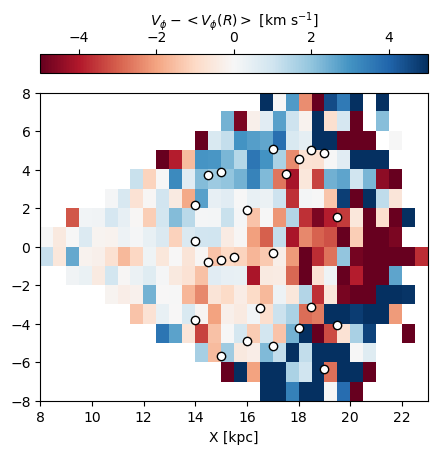

In [534]:
fig,ax = plt.subplots(1, figsize=(5,5))
pcm = ax.imshow(phi_m_avg_phi_per_r,
              origin='lower',
                vmax=5,
                vmin=-5,
                norm='linear',
                cmap = 'RdBu', extent=[8, 23,-8, 8],aspect='auto')
fig.colorbar(pcm, ax=ax, location='top', label='$V_\phi - <V_\phi(R)>$ [km s$^{-1}$]')
#ax[2].grid(True)
ax.set_xlabel('X [kpc]') 
plt.scatter(rr_mins, yy_mins, color='w', edgecolor='k')

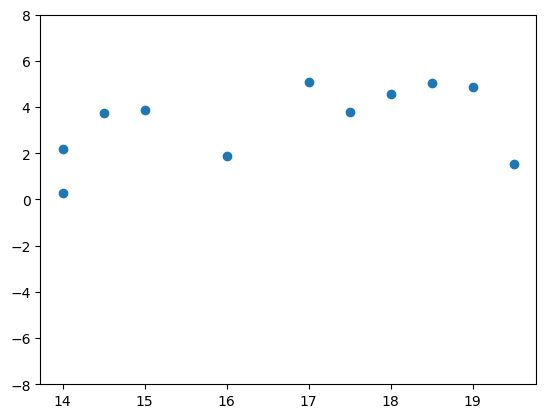

[ 0.35319276 -2.52689919]
20985.765720002077


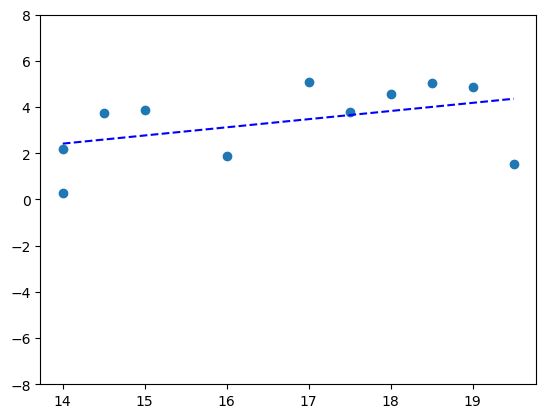

In [535]:
zero_clip = np.where(yy_mins > 0)
plt.scatter(rr_mins[zero_clip], yy_mins[zero_clip])
plt.ylim(-8, 8)
plt.show()

# fit line to data scipy curvefit

def linear(x, a, b):
    return a * x + b



popt, pcov = curve_fit(linear, rr_mins[zero_clip], yy_mins[zero_clip])
m_cube = popt[0]
b_cube = popt[1]
print(popt)
print(np.linalg.cond(pcov))

plt.scatter(rr_mins[zero_clip], yy_mins[zero_clip])
plt.plot(rr_mins[zero_clip], m_cube*rr_mins[zero_clip]+b_cube, 'b--')
plt.ylim(-8, 8)
plt.show()

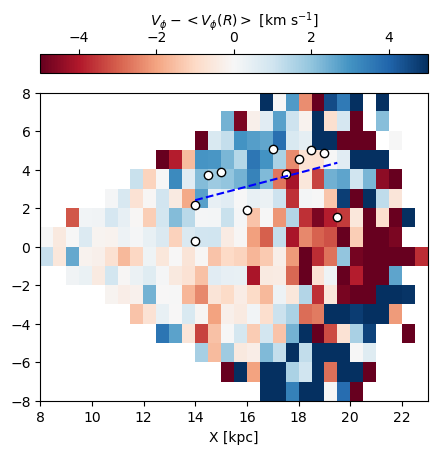

In [536]:
fig,ax = plt.subplots(1, figsize=(5,5))
pcm = ax.imshow(phi_m_avg_phi_per_r,
              origin='lower',
                vmax=5,
                vmin=-5,
                norm='linear',
                cmap = 'RdBu', extent=[8, 23,-8, 8],aspect='auto')
fig.colorbar(pcm, ax=ax, location='top', label='$V_\phi - <V_\phi(R)>$ [km s$^{-1}$]')
#ax[2].grid(True)
ax.set_xlabel('X [kpc]') 
plt.scatter(rr_mins[zero_clip], yy_mins[zero_clip], color='w', edgecolor='k')
plt.plot(rr_mins, m_cube*rr_mins+b_cube, 'b--')


0.3531927590994449 -2.5268991888324885


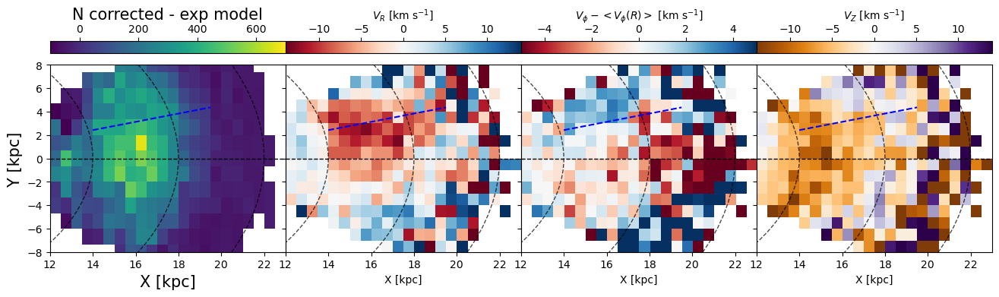

In [170]:

nxbins = 30
nybins = 16
rangearr=[[8, 23],[-8, 8]]
binsarr = [nxbins, nybins]

# plotting
fig, ax = plt.subplots(1,4, figsize=(16,4), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})



ax[0].set_xlabel('X [kpc]', fontsize=15)
ax[0].set_ylabel('Y [kpc]', fontsize=15)

xy_val = [12,23, -10,10]
pcm = ax[0].imshow(multiplied_mask_overdense1.T, origin='lower',
                vmax=700,
                vmin=-100,
                #norm='log',
                cmap = 'viridis', 
                extent=xy_val,
                aspect='auto')

#ax.hlines(0,xy_val[0],xy_val[1],'k', linestyle='--')
#ax.set_xlim(12,23)
ax[0].set_ylim(-8,8)

cb = fig.colorbar(pcm, ax=ax[0], location='top')
cb.set_label(label='N corrected - exp model',size=15)


###########################################################################################
###########################################################################################
###########################################################################################


bin_x_y =scipy.stats.binned_statistic_2d(galac_xind500[disky_index],
                                           galac_yind500[disky_index],
                                           v_r_ind500[disky_index],
                                           'median', bins=binsarr,
                                           range = rangearr)


pcm = ax[1].imshow(bin_x_y.statistic.T,
                origin='lower',
                vmax=14,
                vmin=-14,
                norm='linear',
                cmap = 'RdBu', extent=[8, 23,-8, 8],aspect='auto')
fig.colorbar(pcm, ax=ax[1], location='top', label='$V_R$ [km s$^{-1}$]')
#ax[1].grid(True)
ax[1].set_xlabel('X [kpc]')
#ax[0].set_ylabel('Y [kpc]')

###########################################################################################
###########################################################################################
###########################################################################################


pcm = ax[2].imshow(phi_m_avg_phi_per_r,
              origin='lower',
                vmax=5,
                vmin=-5,
                norm='linear',
                cmap = 'RdBu', extent=[8, 23,-8, 8],aspect='auto')
fig.colorbar(pcm, ax=ax[2], location='top', label='$V_\phi - <V_\phi(R)>$ [km s$^{-1}$]')
#ax[2].grid(True)
ax[2].set_xlabel('X [kpc]')



###########################################################################################
###########################################################################################
###########################################################################################


bin_x_y =scipy.stats.binned_statistic_2d(galac_xind500[disky_index],
                                           galac_yind500[disky_index],
                                           v_z_ind500[disky_index],
                                           'median', bins=binsarr,
                                           range = rangearr)


pcm = ax[3].imshow(bin_x_y.statistic.T,
                origin='lower',
                vmax=14,
                vmin=-14,
                norm='linear',
                cmap = 'PuOr', extent=[8, 23,-8, 8],aspect='auto')
fig.colorbar(pcm, ax=ax[3], location='top', label='$V_Z$ [km s$^{-1}$]')
#ax[1].grid(True)
ax[3].set_xlabel('X [kpc]')
#ax[0].set_ylabel('Y [kpc]')

for i in range(4):
    

    circ = matplotlib.patches.Annulus((0,0), 18,4, ec='k', lw=1, linestyle='--',fill=False, alpha=0.7)
    ax[i].add_patch(circ)
    
    circ = matplotlib.patches.Annulus((0,0), 22,12, ec='k', lw=1, linestyle='--',fill=False, alpha=0.7)
    ax[i].add_patch(circ)
    
    #if i > 0:
   #     ax[i].scatter(xes, yes, color='w', s=40, edgecolors='k')
    #ax[i].scatter(rr_mins[zero_clip], yy_mins[zero_clip], color='w', edgecolor='k')
    #ax[i].plot(xes[sigmaclip_ind], m*xes[sigmaclip_ind]+b, 'r--', linewidth=2)
    ax[i].plot(rr_mins, m_cube*rr_mins+b_cube, 'b--')
    ax[i].hlines(0, 12, 23, 'k', linestyle='--',lw=1)
    
    
    
    ax[i].set_ylim(-8,8)
    ax[i].set_xlim(12,23)
#fig.legend()

print()
print(m_cube, b_cube)

#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/XY_Vr_Vphi_Vz_plot.png', dpi=400)


0.8439306358378111 -10.630057803493596


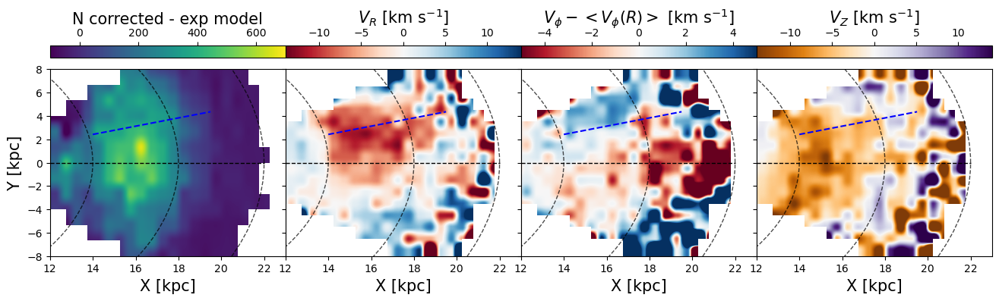

In [171]:

nxbins = 30
nybins = 16
rangearr=[[8, 23],[-8, 8]]
binsarr = [nxbins, nybins]
interp = 'hermite'
#interp = 'hamming'

# plotting
fig, ax = plt.subplots(1,4, figsize=(16,4), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})



ax[0].set_xlabel('X [kpc]', fontsize=15)
ax[0].set_ylabel('Y [kpc]', fontsize=15)

xy_val = [12,23, -10,10]
pcm = ax[0].imshow(multiplied_mask_overdense1.T, origin='lower',
                vmax=700,
                vmin=-100,
                #norm='log',
                cmap = 'viridis', 
                extent=xy_val,
                aspect='auto', interpolation = interp)

#ax.hlines(0,xy_val[0],xy_val[1],'k', linestyle='--')
#ax.set_xlim(12,23)
ax[0].set_ylim(-8,8)

cb = fig.colorbar(pcm, ax=ax[0], location='top')
cb.set_label(label='N corrected - exp model',size=15)


###########################################################################################
###########################################################################################
###########################################################################################


bin_x_y =scipy.stats.binned_statistic_2d(galac_xind500[disky_index],
                                           galac_yind500[disky_index],
                                           v_r_ind500[disky_index],
                                           'median', bins=binsarr,
                                           range = rangearr)


pcm = ax[1].imshow(bin_x_y.statistic.T,
                origin='lower',
                vmax=14,
                vmin=-14,
                norm='linear',
                cmap = 'RdBu', extent=[8, 23,-8, 8],aspect='auto', interpolation=interp)

cb = fig.colorbar(pcm, ax=ax[1], location='top', label='$V_R$ [km s$^{-1}$]')
cb.set_label(label='$V_R$ [km s$^{-1}$]',size=15)
#ax[1].grid(True)
ax[1].set_xlabel('X [kpc]', fontsize=15)
#ax[0].set_ylabel('Y [kpc]')

###########################################################################################
###########################################################################################
###########################################################################################


pcm = ax[2].imshow(phi_m_avg_phi_per_r,
              origin='lower',
                vmax=5,
                vmin=-5,
                norm='linear',
                cmap = 'RdBu', extent=[8, 23,-8, 8],aspect='auto', interpolation=interp)

cb = fig.colorbar(pcm, ax=ax[2], location='top', label='$V_\phi - <V_\phi(R)>$ [km s$^{-1}$]')
cb.set_label( label='$V_\phi - <V_\phi(R)>$ [km s$^{-1}$]',size=15)
#ax[2].grid(True)
ax[2].set_xlabel('X [kpc]', fontsize=15)



###########################################################################################
###########################################################################################
###########################################################################################


bin_x_y =scipy.stats.binned_statistic_2d(galac_xind500[disky_index],
                                           galac_yind500[disky_index],
                                           v_z_ind500[disky_index],
                                           'median', bins=binsarr,
                                           range = rangearr)


pcm = ax[3].imshow(bin_x_y.statistic.T,
                origin='lower',
                vmax=14,
                vmin=-14,
                norm='linear',
                cmap = 'PuOr', extent=[8, 23,-8, 8],aspect='auto', interpolation=interp)

cb = fig.colorbar(pcm, ax=ax[3], location='top', label='$V_Z$ [km s$^{-1}$]')
cb.set_label(label='$V_Z$ [km s$^{-1}$]',size=15)
#ax[1].grid(True)
ax[3].set_xlabel('X [kpc]', fontsize=15)
#ax[0].set_ylabel('Y [kpc]')

for i in range(4):
    

    circ = matplotlib.patches.Annulus((0,0), 18,4, ec='k', lw=1, linestyle='--',fill=False, alpha=0.7)
    ax[i].add_patch(circ)
    
    circ = matplotlib.patches.Annulus((0,0), 22,12, ec='k', lw=1, linestyle='--',fill=False, alpha=0.7)
    ax[i].add_patch(circ)
    
    #if i > 0:
   #     ax[i].scatter(xes, yes, color='w', s=40, edgecolors='k')
    #ax[i].scatter(rr_mins[zero_clip], yy_mins[zero_clip], color='w', edgecolor='k')
    #ax[i].plot(xes[sigmaclip_ind], m*xes[sigmaclip_ind]+b, 'r--', linewidth=2)
    ax[i].plot(rr_mins, m_cube*rr_mins+b_cube, 'b--')
    
    ax[i].hlines(0, 12, 22, 'k', linestyle='--',lw=1)
    
    ax[i].set_ylim(-8,8)
    ax[i].set_xlim(12,23)
    
    
#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/XY_expo_Vr_Vphi_Vz_plot_smoothed.png', dpi=400)

print()
print(m, b)

# Lz Phi

In [94]:
ind_AC40deg_v2 = np.where((z>0)&(z<11)&
                        #(phi>170)&(phi<190)&
                          (l_cut>140)&(l_cut<220)&#trying with l cut instead. toget around the hole in data
                          (Gmag_cut<5.7)&(Gmag_cut>3.3)&
                          (gmr_cut>.2)&(gmr_cut<0.55)&
                          (r>8)&(r<23)&
                           (-v_phi > 180) & (-v_phi < 275))
len(ind_AC40deg_v2[0])



146617

In [95]:
(4500-1500)/60
50

50

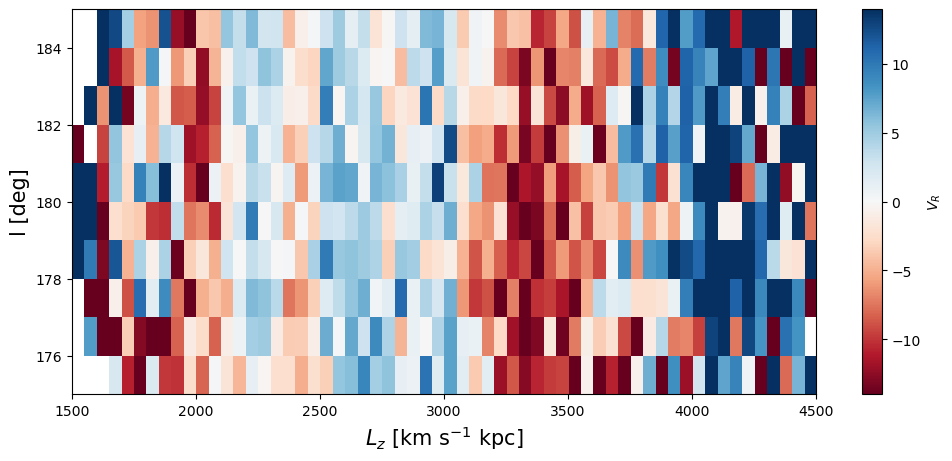

In [96]:
# angular momentum FTv

nxbins = 60
nybins = 10
rangearr=[[1500, 4500], [175, 185]]
binsarr = [nxbins, nybins]


fig, ax = plt.subplots(figsize=(12,5))
hist2d_lz_phi = scipy.stats.binned_statistic_2d(np.abs(v_phi[ind_AC40deg_v2])*r[ind_AC40deg_v2], # Lz  = |vphi|* r Alinder et al 2023
                                         phi[ind_AC40deg_v2],
                                    v_r[ind_AC40deg_v2],
                                    statistic = np.nanmedian,
                                    range=rangearr,
                                    bins=binsarr)


pcm = ax.imshow(hist2d_lz_phi.statistic.T, origin='lower',
           vmin = -14,
           vmax = 14,
           norm = 'linear',
           cmap='RdBu', extent=[1500, 4500, 175, 185] ,aspect='auto')


fig.colorbar(pcm, ax=ax, location='right', label='$V_R$')
ax.set_ylabel('l [deg]', fontsize=15)
ax.set_xlabel('$L_z$ [km s$^{-1}$ kpc]', fontsize=15)


#L_values = [1600, 1750, 2040, 2300]
L_values = [2200, 2400]
#for i in range(len(L_values)):
    #momentums = ax.vlines(L_values, 170, 190, color='dimgrey', linestyle = '--')




#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/phi_Lz_plot.png', dpi=400)




In [97]:
1500/30

50.0

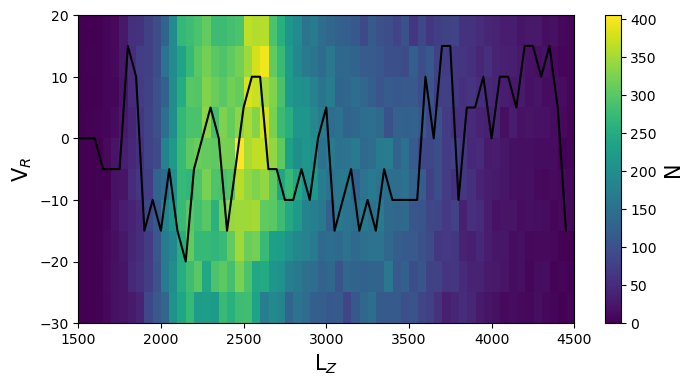

In [98]:
Lz=np.abs(v_phi[ind_AC40deg_v2])*r[ind_AC40deg_v2]
v_r_cut = v_r[ind_AC40deg_v2]
phi_cut = phi[ind_AC40deg_v2]

binsarr = [nxbins,nybins] # 70 is Lz and 60 is Vr
rangearr = [[1500, 4500],[-30,20]]

bin_Lz_Vr =scipy.stats.binned_statistic_2d(Lz, v_r_cut, Lz,
                                           'count', bins=binsarr,
                                           range = rangearr)
v_r_vals = bin_Lz_Vr.y_edge
hist2d_LZ_VR = bin_Lz_Vr.statistic
col_median = np.zeros(binsarr[0])
for i in range(binsarr[0]):
    #print(hist2d_LZ_VR[i,:])
    #print(np.median(hist2d_LZ_VR[i,:]))
    array = hist2d_LZ_VR[i,:] # for one column 
    value  = np.nanmax(hist2d_LZ_VR[i,:])
    iinndd = (np.abs(array - value)).argmin()
    #iinndd = np.where(hist2d_LZ_VR[i,:] == np.round(np.median(hist2d_LZ_VR[i,:])))
    #print(iinndd)
    #print(v_r_vals[iinndd])
    col_median[i] = np.median(v_r_vals[iinndd])
    

fig,ax = plt.subplots(1, figsize=(8,4))
pcm = ax.imshow(bin_Lz_Vr.statistic.T,
                origin='lower',
                #vmax=14,
                #vmin=-14,
                #norm='log',
                cmap = 'viridis', extent=[1500, 4500,-30,20],aspect='auto')

cb = fig.colorbar(pcm, ax=ax, location='right', )
cb.set_label(label='N',size=15)
ax.set_xlabel('L$_Z$', fontsize=15)
ax.set_ylabel('V$_R$', fontsize=15)

lz_med = bin_Lz_Vr.x_edge[:-1]
plt.plot(lz_med, col_median, c='k')




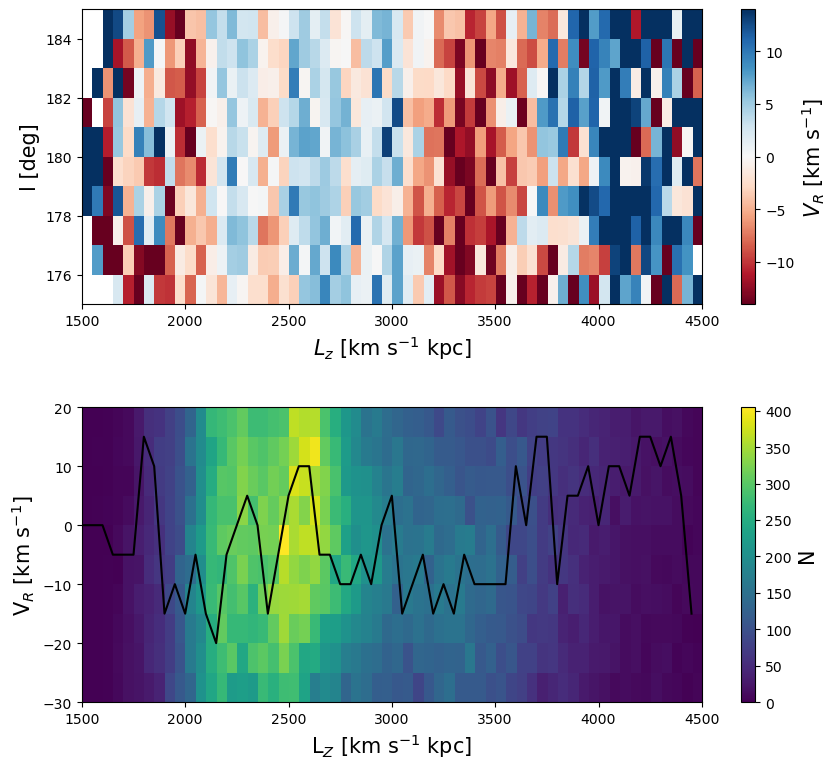

In [99]:

fig,ax = plt.subplots(2,1, figsize=(10,9), gridspec_kw={'hspace': 0.35, 'wspace': 0})

Lz=np.abs(v_phi[ind_AC40deg_v2])*r[ind_AC40deg_v2]
v_r_cut = v_r[ind_AC40deg_v2]
phi_cut = phi[ind_AC40deg_v2]

binsarr = [nxbins,nybins] # 70 is Lz and 60 is Vr
rangearr = [[1500, 4500],[-30,20]]


#############

pcm = ax[0].imshow(hist2d_lz_phi.statistic.T, origin='lower',
           vmin = -14,
           vmax = 14,
           norm = 'linear',
           cmap='RdBu', extent=[1500, 4500, 175, 185] ,aspect='auto')


cb = fig.colorbar(pcm, ax=ax[0], location='right')
cb.set_label(label='$V_R$ [km s$^{-1}$]',size=15)
ax[0].set_ylabel('l [deg]', fontsize=15)
ax[0].set_xlabel('$L_z$ [km s$^{-1}$ kpc]', fontsize=15)

#####

bin_Lz_Vr =scipy.stats.binned_statistic_2d(Lz, v_r_cut, Lz,
                                           'count', bins=binsarr,
                                           range = rangearr)
v_r_vals = bin_Lz_Vr.y_edge
hist2d_LZ_VR = bin_Lz_Vr.statistic
col_median = np.zeros(binsarr[0])
for i in range(binsarr[0]): 
    array = hist2d_LZ_VR[i,:]
    value  = np.nanmax(hist2d_LZ_VR[i,:])
    iinndd = (np.abs(array - value)).argmin()
    col_median[i] = np.median(v_r_vals[iinndd])
    

pcm = ax[1].imshow(bin_Lz_Vr.statistic.T,
                origin='lower',
                #vmax=14,
                #vmin=-14,
                #norm='log',
                cmap = 'viridis', extent=[1500, 4500,-30,20],aspect='auto')

cb = fig.colorbar(pcm, ax=ax[1], location='right')
cb.set_label(label='N',size=15)
ax[1].set_xlabel('L$_Z$ [km s$^{-1}$ kpc]', fontsize=15)
ax[1].set_ylabel('V$_R$ [km s$^{-1}$]', fontsize=15)

lz_med = bin_Lz_Vr.x_edge[:-1]
ax[1].plot(lz_med, col_median, c='k')



#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/loa_Lz_phi_vr.png', dpi=400)




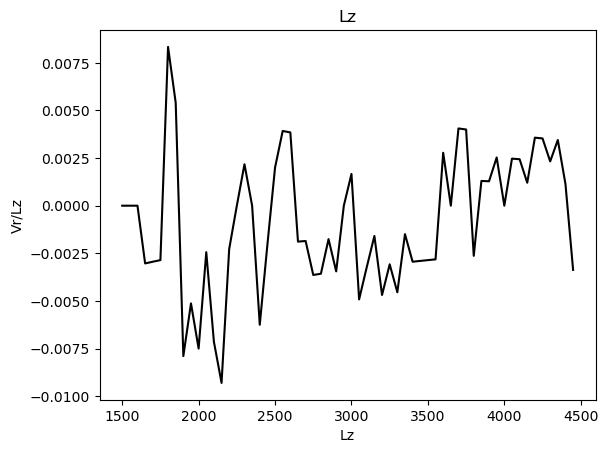

Text(0.5, 1.0, 'Lz$^{-1}$, n=0')

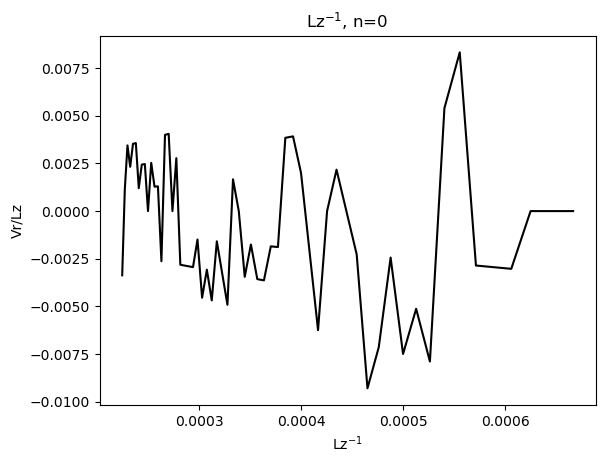

In [100]:
lz_med = bin_Lz_Vr.x_edge[:-1]
lz_med_neg1 = (bin_Lz_Vr.x_edge[:-1])**(-1)

plt.plot(lz_med, col_median/lz_med, c='k')
plt.ylabel('Vr/Lz')
plt.xlabel('Lz')
plt.title('Lz')

plt.show()
plt.plot(lz_med_neg1, col_median/lz_med, c='k')
plt.ylabel('Vr/Lz')
plt.xlabel('Lz$^{-1}$')
plt.title('Lz$^{-1}$, n=0')


In [101]:
# calculate FFT on the blackline from above
#ft = np.fft.fft(col_median)
ft = np.fft.fft(col_median/lz_med)
freq = np.fft.fftfreq(lz_med.shape[-1], d=(lz_med[1]-lz_med[0])) # len and spacing of the freq elements

freq_neg1 =  np.fft.fftfreq(lz_med_neg1.shape[-1], d=(lz_med_neg1[1]-lz_med_neg1[0])) # len and spacing of the freq elements




/global/common/software/desi/perlmutter/desiconda/20230111-2.1.0/conda/lib/python3.10/site-packages/matplotlib/cbook/__init__.py:1369: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


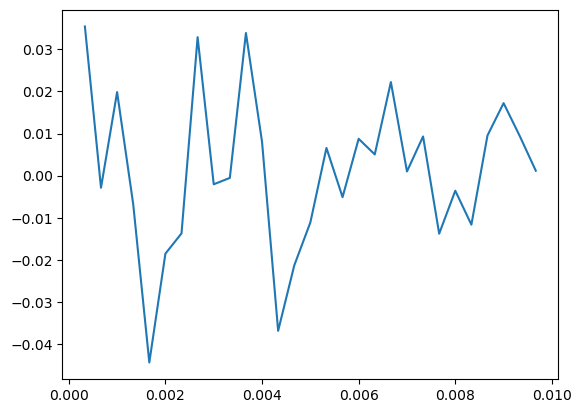

Text(0.5, 1.0, 'Power SPectrum')

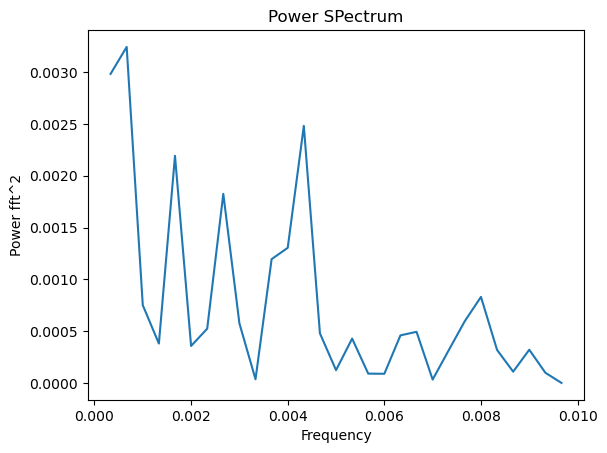

In [102]:
#plt.plot(freq,ft.imag,'-', color='orange')
#plt.plot(freq,ft.real,'-', color='green')
freq_0 = np.where(freq>0)
plt.plot(freq[freq_0],(ft[freq_0]))
plt.show()
plt.plot(freq[freq_0],(np.abs(ft[freq_0]))**2)
plt.xlabel('Frequency')
plt.ylabel('Power fft^2')
plt.title('Power SPectrum')
#plt.xlim([-0.01,0.01])
#plt.ylim([-10,30])


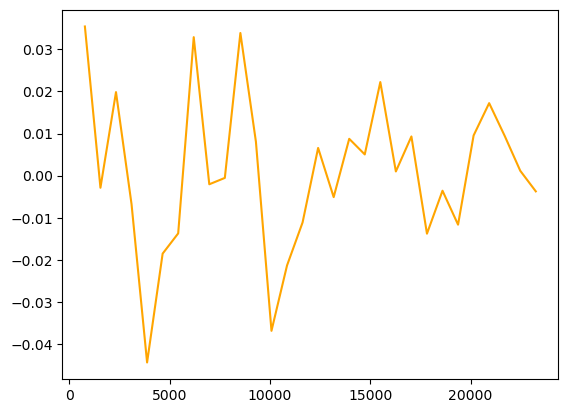

Text(0.5, 1.0, 'Power Spectrum of Lz$^{-1}$')

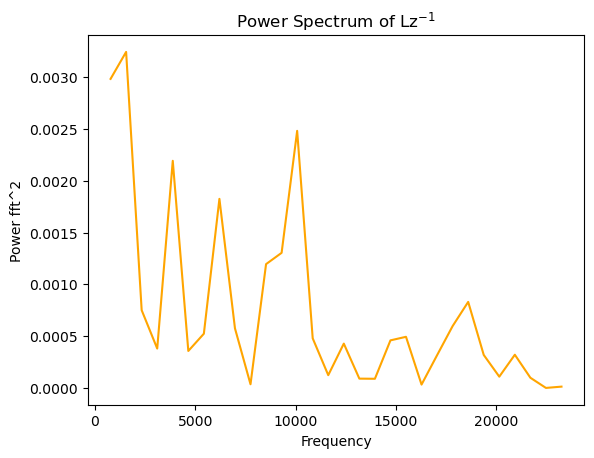

In [103]:
#plt.plot(freq,ft.imag,'-', color='orange')
#plt.plot(freq,ft.real,'-', color='green')
freq_0 = np.where(freq_neg1>0)
plt.plot(freq_neg1[freq_0],(ft[freq_0]), c='orange')
plt.show()
plt.plot(freq_neg1[freq_0],(np.abs(ft[freq_0]))**2, c='orange')
plt.xlabel('Frequency')
plt.ylabel('Power fft^2')
plt.title('Power Spectrum of Lz$^{-1}$')
#plt.xlim([-0.01,0.01])
#plt.ylim([-10,30])

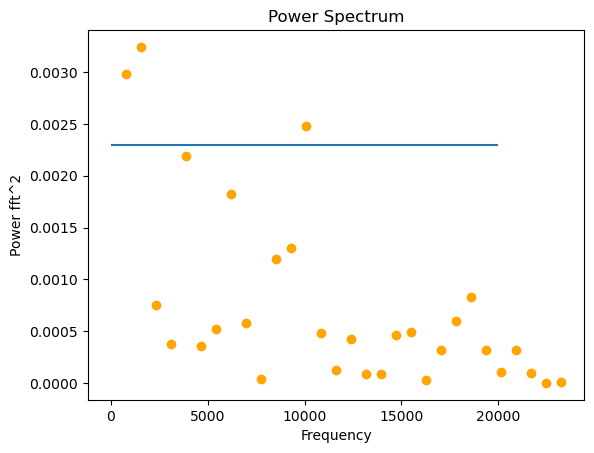

In [104]:

plt.scatter(freq_neg1[freq_0],(np.abs(ft[freq_0]))**2, c='orange')
plt.xlabel('Frequency')
plt.ylabel('Power fft^2')
plt.title('Power Spectrum')
plt.hlines(0.0023, 0, 20000)

[10075.  1550.] [0.00248019 0.00324124]


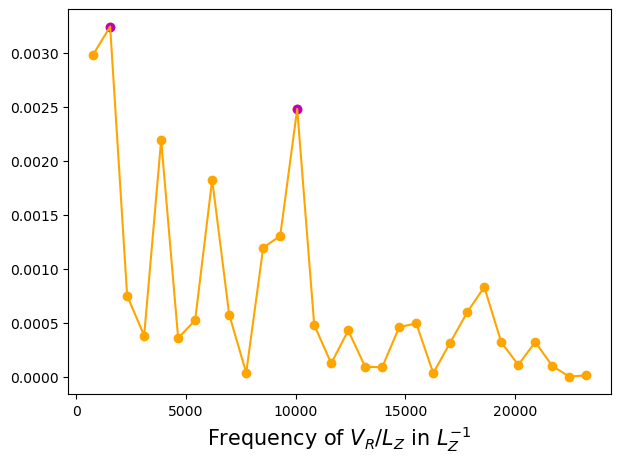

In [137]:
fig, ax = plt.subplots(1,1, figsize=(7,5))
ax.plot(freq_neg1[freq_0],(np.abs(ft[freq_0]))**2, c='orange')
ax.scatter(freq_neg1[freq_0],(np.abs(ft[freq_0]))**2, c='orange')
plt.xlabel('Frequency of $V_R/L_Z$ in $L_Z^{-1}$', fontsize=15)


freq_x_peak = freq_neg1[freq_0]
freq_y_peak = (np.abs(ft[freq_0]))**2

max_peak_indx = np.where((np.abs(ft[freq_0]))**2 > 0.0023)

peak_x = freq_x_peak[max_peak_indx][:-1]
peak_y = freq_y_peak[max_peak_indx][:-1]

ax.scatter(peak_x, peak_y, color='m')
print(peak_x, peak_y)
#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/loa_fft_plot.png', dpi=400)


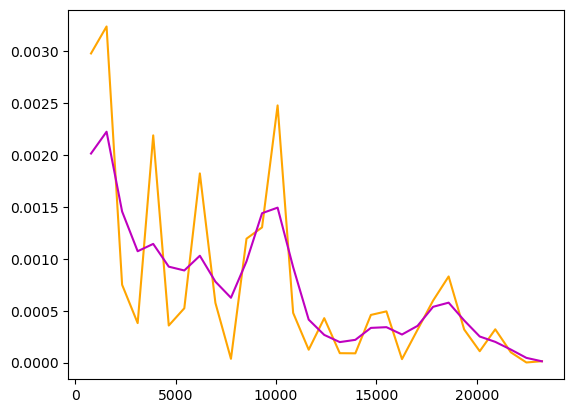

In [208]:
# testing covolution
from astropy.modeling.models import Lorentz1D
from astropy.convolution import convolve, Gaussian1DKernel, Box1DKernel

gauss_kernel = Gaussian1DKernel(1)
smoothed_data_gauss = convolve(peak_y, gauss_kernel, fill_value = np.mean(peak_y)) # fill value set to median 
                                                                                # to see is there is any diff at edge --> no difference

smoothed_data_gauss = convolve((np.abs(ft[freq_0]))**2, gauss_kernel)


plt.plot(freq_neg1[freq_0],(np.abs(ft[freq_0]))**2, c='orange')
plt.plot(freq_neg1[freq_0],smoothed_data_gauss, c='m')

## uncnertainty using a gaussian fit

[28 17]


NameError: name 'curve_fit' is not defined

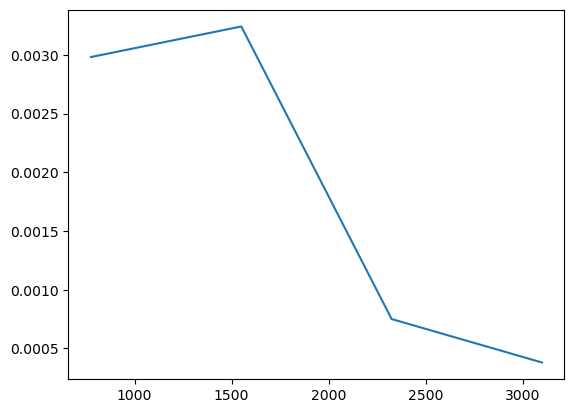

In [107]:
peak_x = freq_x_peak[max_peak_indx][:-1]
peak_y = freq_y_peak[max_peak_indx][:-1]

vah, idx_big, idx_small = np.intersect1d(freq_x_peak, peak_x, return_indices=True)
print(idx_big)
around_thepeak = np.array([26, 27,28,29])#[16,17,18,19,20]) # 27,28,29, 20,21,22, 16,17,18])

plt.plot(freq_x_peak[around_thepeak], freq_y_peak[around_thepeak])

# Define model function to be used to fit to the data above:
def gauss(x, *p):
    A, mu, sigma = p
    return A*numpy.exp(-(x-mu)**2/(2.*sigma**2))

# p0 is the initial guess for the fitting coefficients (A, mu and sigma above)
p0 = [0.05, 1500, 700.]

coeff, var_matrix = curve_fit(gauss, freq_x_peak[around_thepeak], freq_y_peak[around_thepeak], p0=p0)
print(coeff)

#xrange_gauss = np.arange(8000, 11000, 100) larger freq one
xrange_gauss = np.arange(900, 3000, 100)
print(xrange_gauss)
plt.plot(xrange_gauss, gauss(xrange_gauss, coeff[0], coeff[1], coeff[2]))

In [120]:
peak_x

array([10075.,  1550.])

In [121]:
print(peak_x[:-1])

V_0 = 239.26
R_0 = 8.277 # kpc
n = 0

delta_L = peak_x[:-1]

timea= (V_0/(R_0**n))**(-2/(1+n))
timeb = delta_L**(-(n-1)/(n+1))
timec = np.pi/(1-0.5*np.sqrt(2*(n+1)))

time = timea*timeb*timec
print(time)
print(np.median(time))

[10075.]
[1.88775406]
1.8877540639089423


# jack knife sampling to figure out the noise from the signal

In [108]:
len(ind_AC40deg_v2[0]), len(ind_AC40deg_v2[0])//4

(146617, 36654)

In [109]:
len(ind_AC40deg_v2[0])//4

36654

In [185]:
seed(22) #1,2, 11, 22(wrote this down in the doc, 

ind_AC40deg_v2_cp = ind_AC40deg_v2[0]

# this gives a random number of elements in ind_AC40deg_v2 which are indices from the r,phi,z sample
sample_1_4 = np.random.choice(ind_AC40deg_v2_cp, len(ind_AC40deg_v2[0])//4, replace=False)
waa, idx_sample_1_4, blah = np.intersect1d(ind_AC40deg_v2_cp, sample_1_4, assume_unique=False, return_indices=True)
ind_AC40deg_v2_cp_1 = np.delete(ind_AC40deg_v2_cp, idx_sample_1_4)
print(len(ind_AC40deg_v2_cp)-36654, len(ind_AC40deg_v2_cp_1))


sample_2_4 = np.random.choice(ind_AC40deg_v2_cp_1, len(ind_AC40deg_v2[0])//4, replace=False)
waa, idx_sample_2_4, blah = np.intersect1d(ind_AC40deg_v2_cp_1, sample_2_4, assume_unique=False, return_indices=True)
ind_AC40deg_v2_cp_2 = np.delete(ind_AC40deg_v2_cp_1, idx_sample_2_4)
print(len(ind_AC40deg_v2_cp_1)-36654, len(ind_AC40deg_v2_cp_2))


sample_3_4 = np.random.choice(ind_AC40deg_v2_cp_2, len(ind_AC40deg_v2[0])//4, replace=False) 
waa, idx_sample_3_4, blah = np.intersect1d(ind_AC40deg_v2_cp_2, sample_3_4, assume_unique=False, return_indices=True)
ind_AC40deg_v2_cp_3 = np.delete(ind_AC40deg_v2_cp_2, idx_sample_3_4)
print(len(ind_AC40deg_v2_cp_2)-36654, len(ind_AC40deg_v2_cp_3))


# the last resample is ind_AC40deg_v2_cp_3
sample_4_4 = np.random.choice(ind_AC40deg_v2_cp_3, len(ind_AC40deg_v2[0])//4, replace=False) 
waa, idx_sample_4_4, blah = np.intersect1d(ind_AC40deg_v2_cp_3, sample_4_4, assume_unique=False, return_indices=True)
ind_AC40deg_v2_cp_4 = np.delete(ind_AC40deg_v2_cp_3, idx_sample_4_4)
print(len(ind_AC40deg_v2_cp_3)-36654, len(ind_AC40deg_v2_cp_4))


print(len(idx_sample_1_4), len(idx_sample_2_4), len(idx_sample_3_4), len(idx_sample_4_4))


109963 109963
73309 73309
36655 36655
1 1
36654 36654 36654 36654


In [186]:
len(idx_sample_1_4)

36654

/global/common/software/desi/perlmutter/desiconda/20230111-2.1.0/conda/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1218: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
/global/common/software/desi/perlmutter/desiconda/20230111-2.1.0/conda/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1218: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
/global/common/software/desi/perlmutter/desiconda/20230111-2.1.0/conda/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1218: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
/global/common/software/desi/perlmutter/desiconda/20230111-2.1.0/conda/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1218: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,


Text(0.5, 0, '$L_z$ [km s$^{-1}$ kpc]')

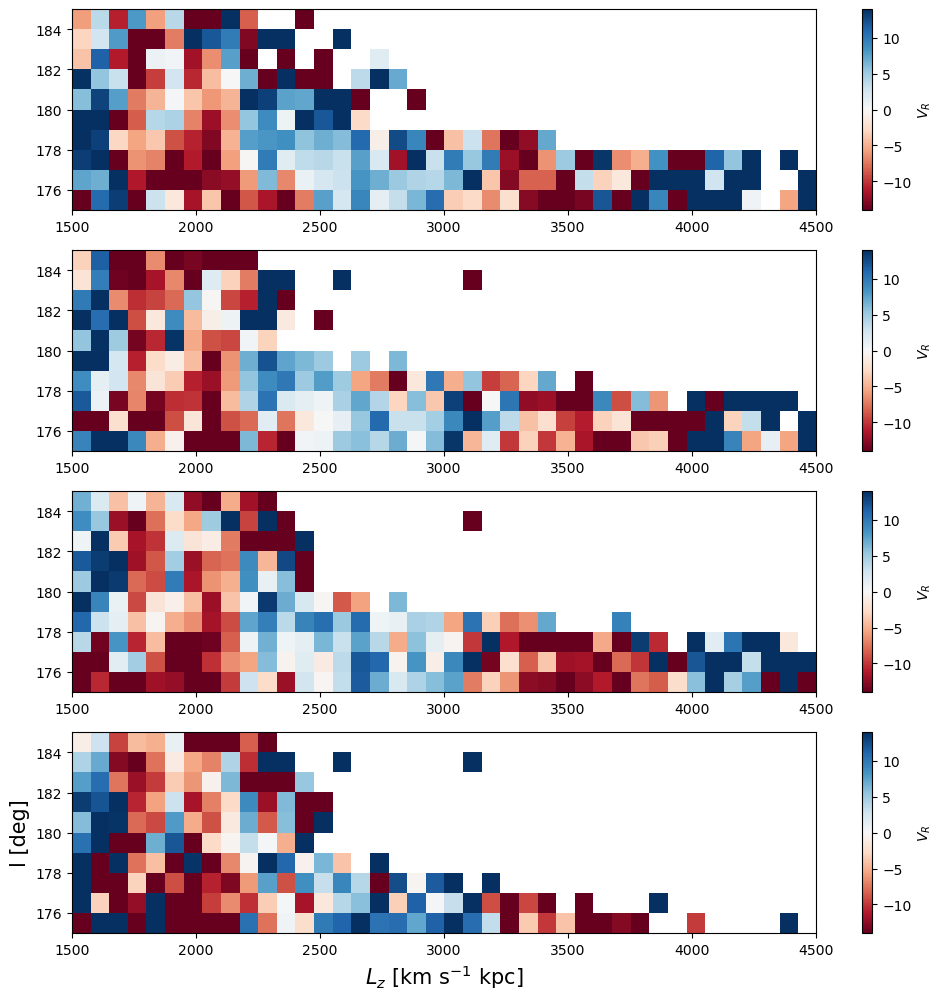

In [187]:
nxbins = 40#60
nybins = 10#10
rangearr=[[1500, 4500], [175, 185]]
binsarr = [nxbins, nybins]


fig, ax = plt.subplots(4,1,figsize=(12,12))
#####################
hist2d_lz_phi = scipy.stats.binned_statistic_2d(np.abs(v_phi[idx_sample_1_4])*r[idx_sample_1_4], # Lz  = |vphi|* r Alinder et al 2023
                                     phi[idx_sample_1_4],
                                v_r[idx_sample_1_4],
                                statistic = np.nanmedian,
                                range=rangearr,
                                bins=binsarr)


pcm = ax[0].imshow(hist2d_lz_phi.statistic.T, origin='lower',
       vmin = -14,
       vmax = 14,
       norm = 'linear',
       cmap='RdBu', extent=[1500, 4500, 175, 185] ,aspect='auto')


#####################
hist2d_lz_phi = scipy.stats.binned_statistic_2d(np.abs(v_phi[idx_sample_2_4])*r[idx_sample_2_4], # Lz  = |vphi|* r Alinder et al 2023
                                     phi[idx_sample_2_4],
                                v_r[idx_sample_2_4],
                                statistic = np.nanmedian,
                                range=rangearr,
                                bins=binsarr)


pcm = ax[1].imshow(hist2d_lz_phi.statistic.T, origin='lower',
       vmin = -14,
       vmax = 14,
       norm = 'linear',
       cmap='RdBu', extent=[1500, 4500, 175, 185] ,aspect='auto')

#####################
hist2d_lz_phi = scipy.stats.binned_statistic_2d(np.abs(v_phi[idx_sample_3_4])*r[idx_sample_3_4], # Lz  = |vphi|* r Alinder et al 2023
                                     phi[idx_sample_3_4],
                                v_r[idx_sample_3_4],
                                statistic = np.nanmedian,
                                range=rangearr,
                                bins=binsarr)


pcm = ax[2].imshow(hist2d_lz_phi.statistic.T, origin='lower',
       vmin = -14,
       vmax = 14,
       norm = 'linear',
       cmap='RdBu', extent=[1500, 4500, 175, 185] ,aspect='auto')

#####################
hist2d_lz_phi = scipy.stats.binned_statistic_2d(np.abs(v_phi[idx_sample_4_4])*r[idx_sample_4_4], # Lz  = |vphi|* r Alinder et al 2023
                                     phi[idx_sample_4_4],
                                v_r[idx_sample_4_4],
                                statistic = np.nanmedian,
                                range=rangearr,
                                bins=binsarr)


pcm = ax[3].imshow(hist2d_lz_phi.statistic.T, origin='lower',
       vmin = -14,
       vmax = 14,
       norm = 'linear',
       cmap='RdBu', extent=[1500, 4500, 175, 185] ,aspect='auto')
#####################

fig.colorbar(pcm, ax=ax[0], location='right', label='$V_R$')
fig.colorbar(pcm, ax=ax[1], location='right', label='$V_R$')
fig.colorbar(pcm, ax=ax[2], location='right', label='$V_R$')
fig.colorbar(pcm, ax=ax[3], location='right', label='$V_R$')

ax[3].set_ylabel('l [deg]', fontsize=15)
ax[3].set_xlabel('$L_z$ [km s$^{-1}$ kpc]', fontsize=15)


In [188]:
from scipy.interpolate import CubicSpline

hi


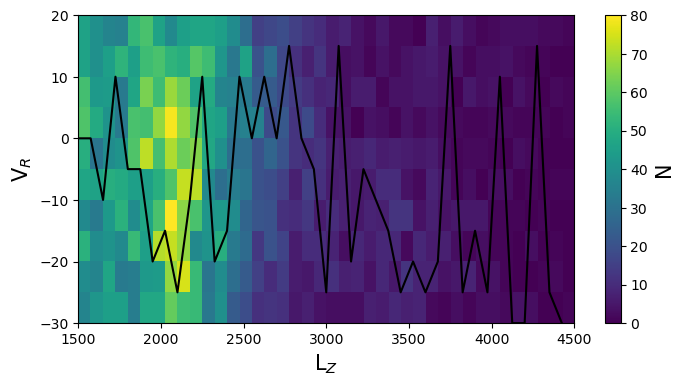

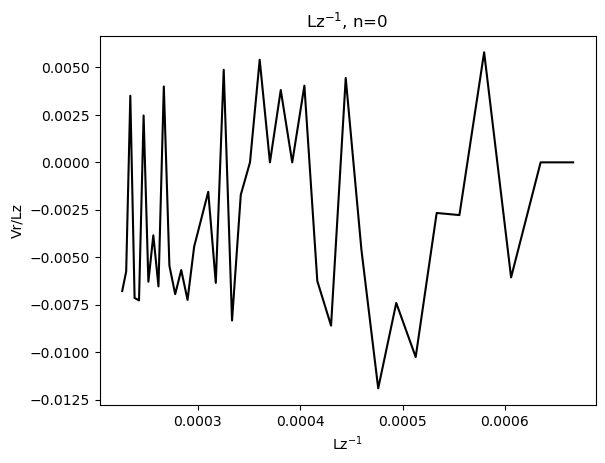

hi


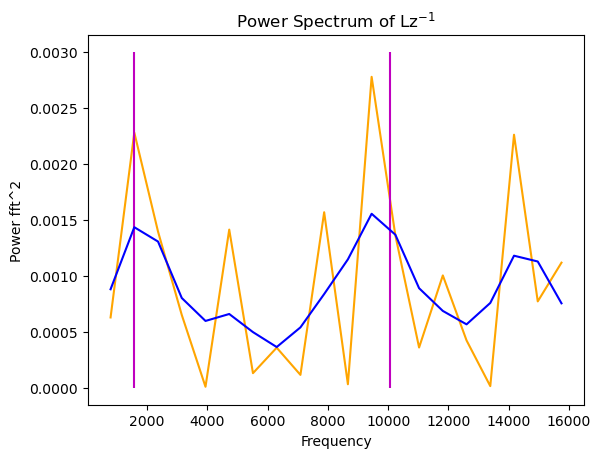

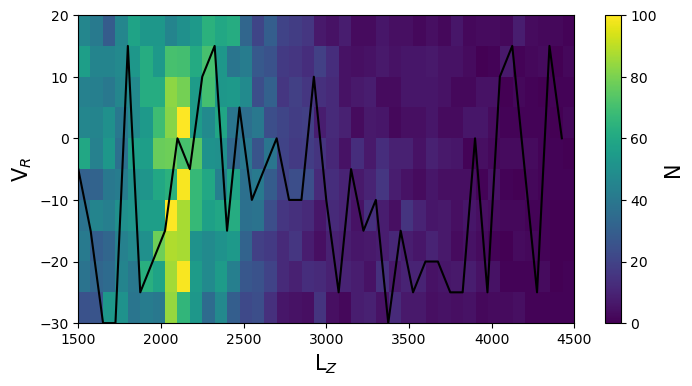

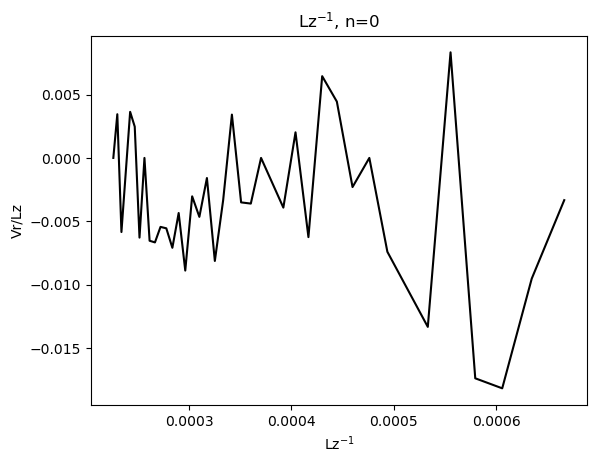

hi


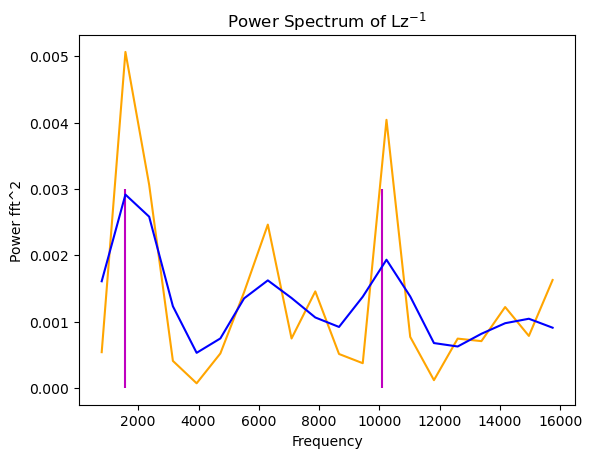

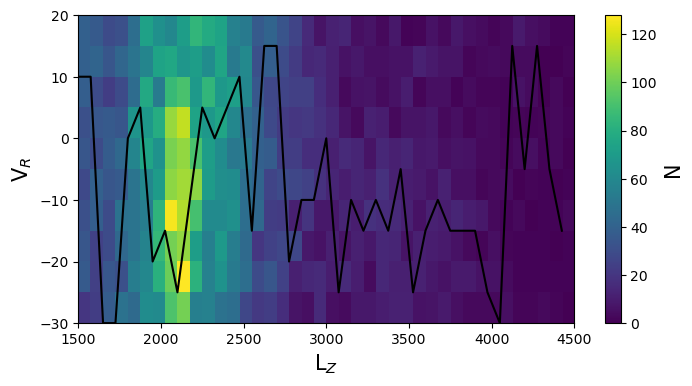

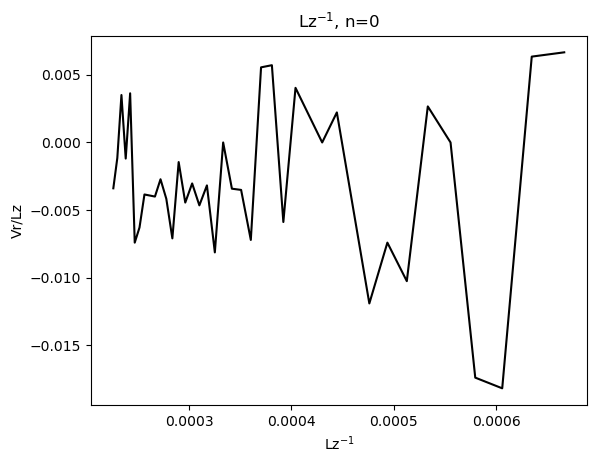

hi


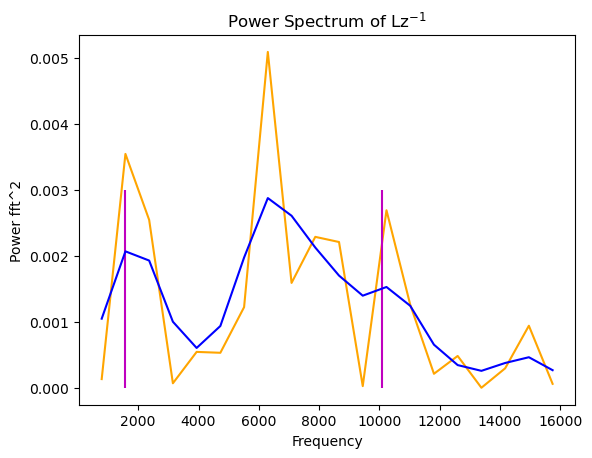

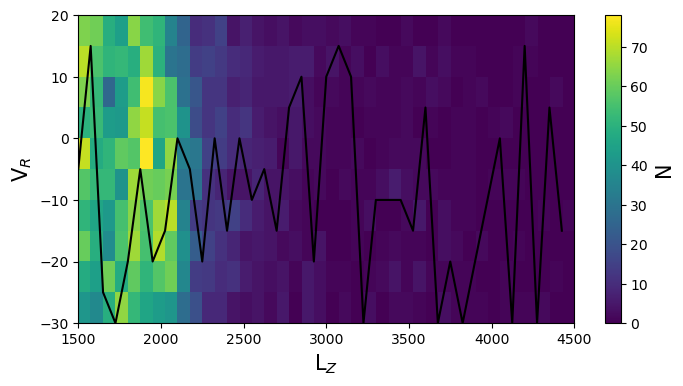

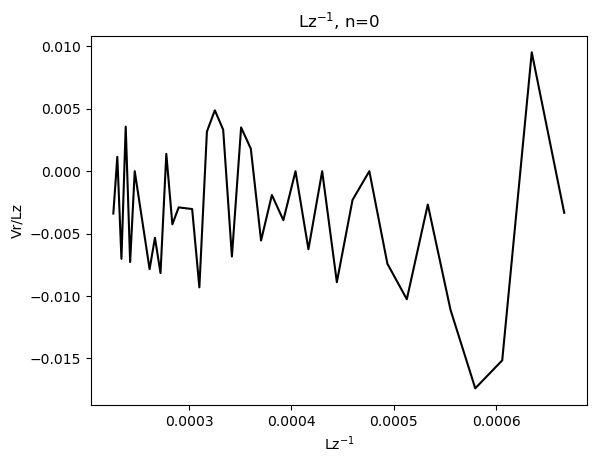

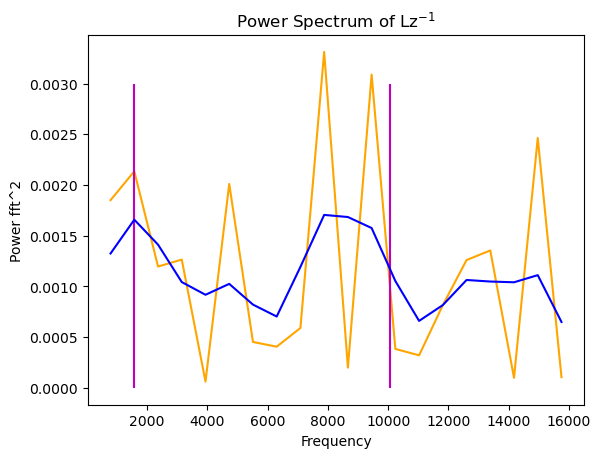

In [189]:
freq_x_peak_combo = [10075.,  1550.]

def LZ_vr_with_plots(index, thresh):
    Lz=np.abs(v_phi[index])*r[index]
    v_r_cut = v_r[index]
    phi_cut = phi[index]

    binsarr = [nxbins,nybins] # 70 is Lz and 60 is Vr
    rangearr = [[1500, 4500],[-30,20]]

    bin_Lz_Vr =scipy.stats.binned_statistic_2d(Lz, v_r_cut, Lz,
                                               'count', bins=binsarr,
                                               range = rangearr)
    v_r_vals = bin_Lz_Vr.y_edge
    hist2d_LZ_VR = bin_Lz_Vr.statistic
    col_median = np.zeros(binsarr[0])
    for i in range(binsarr[0]):
        #print(hist2d_LZ_VR[i,:])
        #print(np.median(hist2d_LZ_VR[i,:]))
        array = hist2d_LZ_VR[i,:] # for one column 
        value  = np.nanmax(hist2d_LZ_VR[i,:])
        iinndd = (np.abs(array - value)).argmin()
        #iinndd = np.where(hist2d_LZ_VR[i,:] == np.round(np.median(hist2d_LZ_VR[i,:])))
        #print(iinndd)
        #print(v_r_vals[iinndd])
        col_median[i] = np.median(v_r_vals[iinndd])

    print('hi')
    fig,ax = plt.subplots(1, figsize=(8,4))
    pcm = ax.imshow(bin_Lz_Vr.statistic.T,
                    origin='lower',
                    #vmax=14,
                    #vmin=-14,
                    #norm='log',
                    cmap = 'viridis', extent=[1500, 4500,-30,20],aspect='auto')

    cb = fig.colorbar(pcm, ax=ax, location='right', )
    cb.set_label(label='N',size=15)
    ax.set_xlabel('L$_Z$', fontsize=15)
    ax.set_ylabel('V$_R$', fontsize=15)

    lz_med = bin_Lz_Vr.x_edge[:-1]
    plt.plot(lz_med, col_median, c='k')
    
    plt.show()
    lz_med_neg1 = (bin_Lz_Vr.x_edge[:-1])**(-1)
    plt.plot(lz_med_neg1, col_median/lz_med, c='k')
    plt.ylabel('Vr/Lz')
    plt.xlabel('Lz$^{-1}$')
    plt.title('Lz$^{-1}$, n=0')
    
    
    ft = np.fft.fft(col_median/lz_med)
    freq = np.fft.fftfreq(lz_med.shape[-1], d=(lz_med[1]-lz_med[0])) # len and spacing of the freq elements

    freq_neg1 =  np.fft.fftfreq(lz_med_neg1.shape[-1], d=(lz_med_neg1[1]-lz_med_neg1[0])) # len and spacing of the freq elements
    freq_0 = np.where(freq_neg1>0)

    plt.show()
    plt.plot(freq_neg1[freq_0],(np.abs(ft[freq_0]))**2, c='orange')
    plt.xlabel('Frequency')
    plt.ylabel('Power fft^2')
    plt.title('Power Spectrum of Lz$^{-1}$')
    plt.vlines(freq_x_peak_combo, 0, 0.003, 'm')

    gauss_kernel = Gaussian1DKernel(1)
    
    smoothed_data_gauss = convolve((np.abs(ft[freq_0]))**2, gauss_kernel)

    plt.plot(freq_neg1[freq_0], smoothed_data_gauss, c='b')



    '''
    new_freq_neg1 = freq_neg1[freq_0]
    power_spec = (np.abs(ft[freq_0]))**2
    sort_indx = np.argsort(new_freq_neg1)

    cs = CubicSpline(new_freq_neg1[sort_indx], power_spec[sort_indx])
    xs = np.linspace(new_freq_neg1[sort_indx][0], new_freq_neg1[sort_indx][-1], 500)

    
    
    #fig, ax = plt.subplots(figsize=(6.5, 4))
    #plt.plot(new_freq_neg1[sort_indx], power_spec[sort_indx], 'o', label='data')
    plt.plot(xs, cs(xs), label="Spline")
    plt.legend()

    return xs, cs(xs)
    #return freq_neg1[freq_0],(np.abs(ft[freq_0]))**2
    '''
    return freq_neg1[freq_0],smoothed_data_gauss

freq_1, ps_1 = LZ_vr_with_plots(idx_sample_1_4, 0.0005)
freq_2, ps_2 = LZ_vr_with_plots(idx_sample_2_4, 0.0015)
freq_3, ps_3 = LZ_vr_with_plots(idx_sample_3_4, 0.0015)
freq_4, ps_4 = LZ_vr_with_plots(idx_sample_4_4, 0.0005)




In [190]:
'''
freq_1, ps_1 = LZ_vr(idx_sample_1_4)
freq_2, ps_2 = LZ_vr(idx_sample_2_4)
freq_3, ps_3 = LZ_vr(idx_sample_3_4)
freq_4, ps_4 = LZ_vr(idx_sample_4_4)
'''

'\nfreq_1, ps_1 = LZ_vr(idx_sample_1_4)\nfreq_2, ps_2 = LZ_vr(idx_sample_2_4)\nfreq_3, ps_3 = LZ_vr(idx_sample_3_4)\nfreq_4, ps_4 = LZ_vr(idx_sample_4_4)\n'

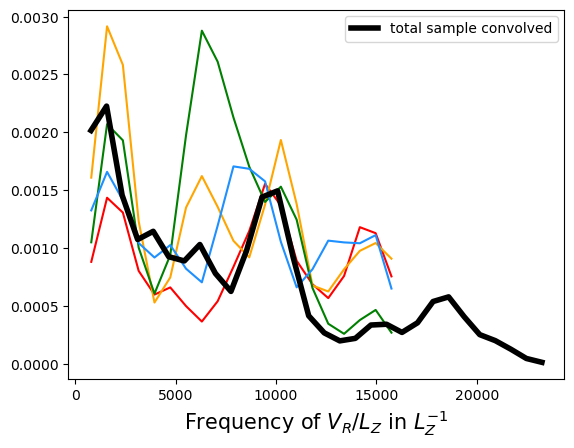

In [224]:
plt.plot(freq_1, ps_1, c='red')
plt.plot(freq_2, ps_2, c='orange')
plt.plot(freq_3, ps_3, c='green')
plt.plot(freq_4, ps_4, c='dodgerblue')

'''
plt.scatter(freq_1, ps_1, c='red')
plt.scatter(freq_2, ps_2, c='orange')
plt.scatter(freq_3, ps_3, c='green')
plt.scatter(freq_4, ps_4, c='dodgerblue')
'''
#plt.plot(freq_neg1[freq_0],(np.abs(ft[freq_0]))**2, c='m', linewidth=4,zorder=0,label='total sample')
#plt.scatter(freq_neg1[freq_0],(np.abs(ft[freq_0]))**2, c='m')

gauss_kernel = Gaussian1DKernel(1)
smoothed_data_gauss = convolve(peak_y, gauss_kernel, fill_value = np.mean(peak_y))
smoothed_data_gauss = convolve((np.abs(ft[freq_0]))**2, gauss_kernel)
plt.plot(freq_neg1[freq_0],smoothed_data_gauss, c='k', linewidth=4,zorder=10,label='total sample convolved')


plt.xlabel('Frequency of $V_R/L_Z$ in $L_Z^{-1}$', fontsize=15)

#plt.ylabel('Power fft^2')
#plt.title('Power Spectrum of Lz$^{-1}$')
plt.legend()
#plt.hlines(0.002, 0, 20000, 'k')
#plt.vlines(freq_x_peak_combo, 0, 0.006, 'm')
'''
plt.scatter(peak_x, peak_y, color='m', s=100, edgecolor='k')
plt.plot(freq_neg1[freq_0],(np.abs(ft[freq_0]))**2, c='m', linewidth = 4, zorder=0, label = 'total sample')
plt.scatter(freq_neg1[freq_0],(np.abs(ft[freq_0]))**2, c='m')
plt.legend()
'''

#plt.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/loa_fft_plot_with_resample.png', dpi=400)



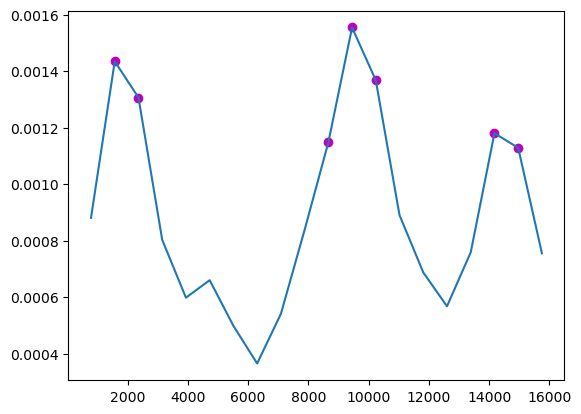

peaks [14962.5 14175.  10237.5  9450.   8662.5  2362.5  1575. ]


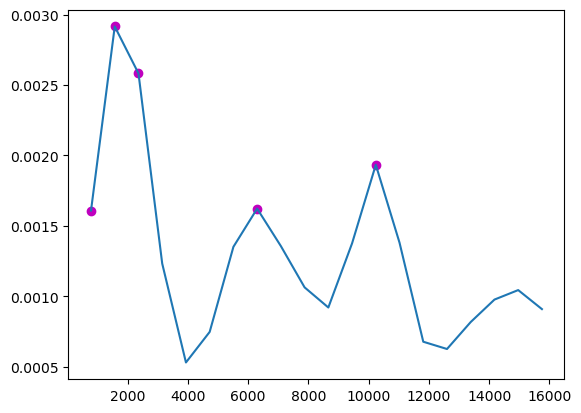

peaks [10237.5  6300.   2362.5  1575.    787.5]


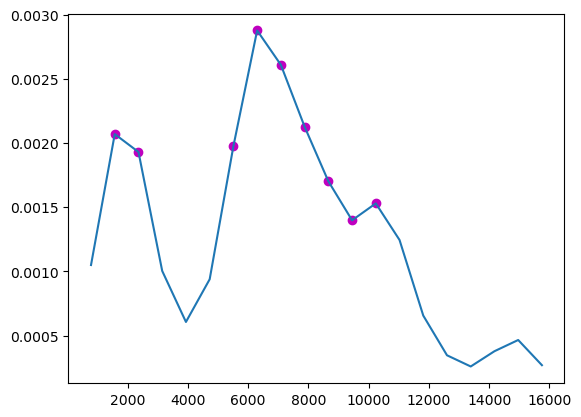

peaks [10237.5  9450.   8662.5  7875.   7087.5  6300.   5512.5  2362.5  1575. ]


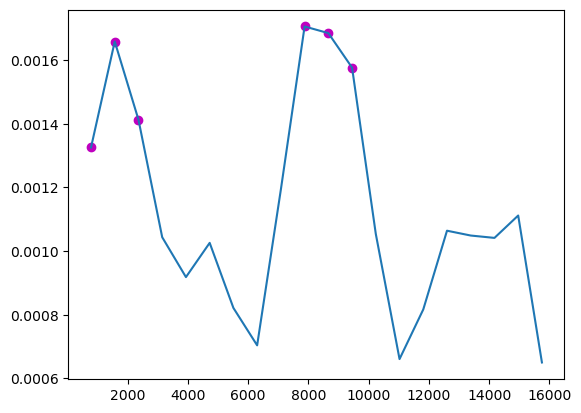

peaks [9450.  8662.5 7875.  2362.5 1575.   787.5]


In [192]:
def find_peaks(freq, ps, thresh):
    max_peak_indx = np.where(ps > (max(ps) - thresh))
    
    freq_x_peak = freq
    peak_x = freq_x_peak[max_peak_indx]
    peak_y = ps[max_peak_indx]
    plt.plot(freq, ps)
    plt.scatter(peak_x, peak_y, color='m')
    plt.show()
    print('peaks', peak_x)
    return peak_x, peak_y

peak_x1, peak_y1 = find_peaks(freq_1, ps_1, 0.0005)
peak_x2, peak_y2 = find_peaks(freq_2, ps_2, 0.0015)
peak_x3, peak_y3 = find_peaks(freq_3, ps_3, 0.0015)
peak_x4, peak_y4 = find_peaks(freq_4, ps_4, 0.0005)




In [201]:
total_sample_peaks = np.array([1550., 10075.])

first_peak_jk = np.array([1575, 787.5,1575 , 1575])
second_peak_jk = np.array([9450, 10237.5,10237.5, 8662.5 ])

#print('means from jackknife for first and second peak', np.mean(first_peak_jk), np.mean(second_peak_jk))

# bias is (n-1)(val_jk - val) n is the total number of samples but this is a really large number... plus we are doing a pseudo jacknife
# cuz we are not actually removing one value from the sample at at time, that would take forever (we would have 150,000 computations to perform)
# https://en.wikipedia.org/wiki/Jackknife_resampling
# instead we are doing block jackknife https://www.math.wustl.edu/~sawyer/handouts/Jackknife.pdf

#bias-corrected jackknife estimate
#n = n_b * k where n_b os the number of blocks andd k is the block size
#psuedovalues ps_i(X) = n_b * theta) - (n_b -1) * theta_jk_i
n_b = 4
ps_first_peak = n_b * total_sample_peaks[0] - (n_b-1)*first_peak_jk
print('mean and var of pseudo-val for first peak:', np.mean(ps_first_peak), np.var(ps_first_peak))
# confidence interval
ci_lower1 = np.mean(ps_first_peak) - 1.96*np.sqrt((1/n_b)*np.var(ps_first_peak))
ci_upper1 = np.mean(ps_first_peak) + 1.96*np.sqrt((1/n_b)*np.var(ps_first_peak))
ci_1 = np.array([ci_lower1, ci_upper1])
print('95% confidence interval:', ci_lower1, ci_upper1)
print()

ps_second_peak = n_b * total_sample_peaks[1] - (n_b-1)*second_peak_jk
print('mean and var of pseudo-val for second peak:', np.mean(ps_second_peak), np.var(ps_second_peak))
ci_lower2 = np.mean(ps_second_peak) - 1.96*np.sqrt((1/n_b)*np.var(ps_second_peak))
ci_upper2 = np.mean(ps_second_peak) + 1.96*np.sqrt((1/n_b)*np.var(ps_second_peak))
ci_2 = np.array([ci_lower2, ci_upper2])
print('95% confidence interval:', ci_lower2, ci_upper2)


#print('bias-corrected jackknife estimate:', (total_sample_peaks[0] - bias1), (total_sample_peaks[1] - bias2))
#print('variance from jackknife for first andd second peak:',)

mean and var of pseudo-val for first peak: 2065.625 1046513.671875
95% confidence interval: 1063.0923419440392 3068.157658055961

mean and var of pseudo-val for second peak: 11359.375 3837216.796875
95% confidence interval: 9439.671113532415 13279.078886467585


In [207]:
V_0 = 239.26
R_0 = 8.277 # kpc
n = 0

#delta_L = total_sample_peaks

def calculate_impact_time(delta_L):
    timea= (V_0/(R_0**n))**(-2/(1+n))
    timeb = delta_L**(-(n-1)/(n+1))
    timec = np.pi/(1-0.5*np.sqrt(2*(n+1)))
    
    time = timea*timeb*timec
    return time

time = calculate_impact_time(total_sample_peaks)
print('total sample:', time)
#print('median',np.median(time))

# jackknife sample is the bias corrected sample
print('bias-corr first peak:', calculate_impact_time(np.mean(ps_first_peak)))
print('95% confidence interval of first peak:', calculate_impact_time(ci_1))
print('bias-corr second peak:', calculate_impact_time(np.mean(ps_second_peak)))
print('95% confidence interval of second peak:', calculate_impact_time(ci_2))

total sample: [0.2904237  1.88775406]
bias-corr first peak: 0.387036425633936
95% confidence interval of first peak: [0.19919175 0.5748811 ]
bias-corr second peak: 2.128407575157878
95% confidence interval of second peak: [1.76871241 2.48810274]


In [132]:
def LZ_vr(index):
    Lz=np.abs(v_phi[index])*r[index]
    v_r_cut = v_r[index]
    phi_cut = phi[index]

    binsarr = [nxbins,nybins] # 70 is Lz and 60 is Vr
    rangearr = [[1500, 4500],[-30,20]]

    bin_Lz_Vr =scipy.stats.binned_statistic_2d(Lz, v_r_cut, Lz,
                                               'count', bins=binsarr,
                                               range = rangearr)
    v_r_vals = bin_Lz_Vr.y_edge
    hist2d_LZ_VR = bin_Lz_Vr.statistic
    col_median = np.zeros(binsarr[0])
    for i in range(binsarr[0]):
        #print(hist2d_LZ_VR[i,:])
        #print(np.median(hist2d_LZ_VR[i,:]))
        array = hist2d_LZ_VR[i,:] # for one column 
        value  = np.nanmax(hist2d_LZ_VR[i,:])
        iinndd = (np.abs(array - value)).argmin()
        #iinndd = np.where(hist2d_LZ_VR[i,:] == np.round(np.median(hist2d_LZ_VR[i,:])))
        #print(iinndd)
        #print(v_r_vals[iinndd])
        col_median[i] = np.median(v_r_vals[iinndd])

    lz_med = bin_Lz_Vr.x_edge[:-1]
    
    lz_med_neg1 = (bin_Lz_Vr.x_edge[:-1])**(-1)
    
    
    ft = np.fft.fft(col_median/lz_med)
    freq = np.fft.fftfreq(lz_med.shape[-1], d=(lz_med[1]-lz_med[0])) # len and spacing of the freq elements

    freq_neg1 =  np.fft.fftfreq(lz_med_neg1.shape[-1], d=(lz_med_neg1[1]-lz_med_neg1[0])) # len and spacing of the freq elements
    freq_0 = np.where(freq_neg1>0)

    new_freq_neg1 = freq_neg1[freq_0]
    power_spec = (np.abs(ft[freq_0]))**2
    sort_indx = np.argsort(new_freq_neg1)

    cs = CubicSpline(new_freq_neg1[sort_indx], power_spec[sort_indx])
    xs = np.linspace(new_freq_neg1[sort_indx][0], new_freq_neg1[sort_indx][-1], 500)
    #fig, ax = plt.subplots(figsize=(6.5, 4))
    #plt.plot(new_freq_neg1[sort_indx], power_spec[sort_indx], 'o', label='data')
    #plt.plot(xs, cs(xs), label="Spline")
    #plt.legend()

    return xs, cs(xs)
    #return freq_neg1[freq_0],(np.abs(ft[freq_0]))**2



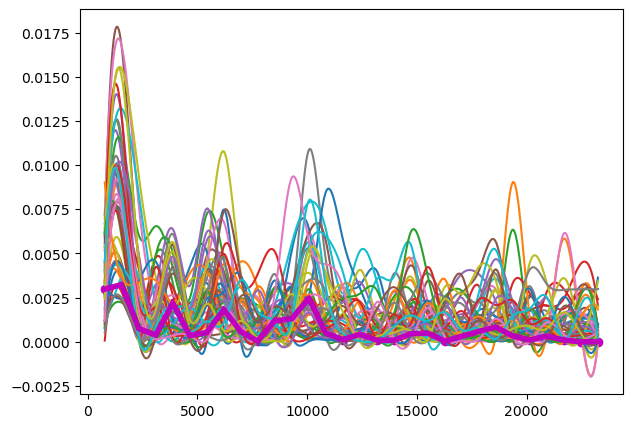

In [282]:
fig, ax = plt.subplots(1,1, figsize=(7,5))

nxbins = 60
nybins = 10

for i in range(50):

    idx_sample_1_20 = np.random.choice(ind_AC40deg_v2[0], len(ind_AC40deg_v2[0])//4, replace=False)  
    freq_temp, ps_temp = LZ_vr(idx_sample_1_20)

    ax.plot(freq_temp, ps_temp)
ax.plot(freq_neg1[freq_0],(np.abs(ft[freq_0]))**2, c='m', linewidth=4,zorder=100,label='total sample')
ax.scatter(freq_neg1[freq_0],(np.abs(ft[freq_0]))**2, c='m')

    #plt.scatter(freq_temp, ps_temp)
    #plt.ylim(0, 0.05)


In [403]:
new_freq_neg1 = freq_neg1[freq_0]
power_spec = (np.abs(ft[freq_0]))**2


sort_indx = np.argsort(new_freq_neg1)
power_spec[sort_indx]

array([1.11887096e-03, 6.39305195e-03, 6.55768166e-04, 5.92984226e-04,
       1.20632127e-03, 5.16713203e-04, 2.52721201e-03, 2.56241795e-03,
       4.54828520e-03, 9.95380138e-04, 3.71558638e-04, 3.06278521e-03,
       4.26200564e-03, 1.88482637e-03, 2.24729522e-03, 3.21192124e-03,
       1.34668054e-03, 1.56640668e-03, 1.30170881e-03, 1.45672538e-03,
       3.87880515e-05, 8.58510035e-04, 1.36365889e-03, 3.03803933e-04,
       2.02916233e-04, 4.76490893e-04, 4.59172147e-04, 3.66027204e-06,
       1.64477357e-04, 2.89927135e-06])

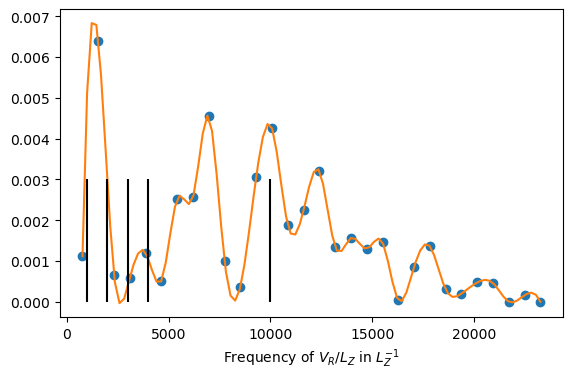

In [404]:
cs = CubicSpline(new_freq_neg1[sort_indx], power_spec[sort_indx])
xs = np.linspace(new_freq_neg1[sort_indx][0], new_freq_neg1[sort_indx][-1], 100)
fig, ax = plt.subplots(figsize=(6.5, 4))
ax.plot(new_freq_neg1[sort_indx], power_spec[sort_indx], 'o', label='data')
ax.plot(xs, cs(xs), label="S")

#ax.scatter([366.66666667, 1403.7037037, 3737.03703704], [0.0060128, 0.00325894, 0.00160642], c='m')
ax.set_xlabel('Frequency of $V_R/L_Z$ in $L_Z^{-1}$')
ax.vlines(1000, 0, 0.003, 'k')
ax.vlines(2000, 0, 0.003, 'k')
ax.vlines(3000, 0, 0.003, 'k')
ax.vlines(4000, 0, 0.003, 'k')
ax.vlines(10000, 0, 0.003, 'k')

In [405]:
spline_x = xs
spline_y = cs(xs)
'''
peak1_idx = np.where(spline_x<1000)
peak2_idx = np.where((spline_x>1000)&(spline_x<2000))
peak3_idx = np.where((spline_x>2000)&(spline_x<3000))
#peak3_idx = np.where((spline_x>3000)&(spline_x<4000))
peak4_idx = np.where(spline_x>4000)
'''
peak1_idx = np.where((spline_x>1000)&(spline_x<2500))
peak2_idx = np.where((spline_x>3000)&(spline_x<4000))
peak3_idx = np.where((spline_x>5000)&(spline_x<7000))
peak4_idx = np.where((spline_x>7000)&(spline_x<12000))

peak1_idxx = np.where(np.max(spline_y[peak1_idx])==spline_y)
peak2_idxx = np.where(np.max(spline_y[peak2_idx])==spline_y)
peak3_idxx = np.where(np.max(spline_y[peak3_idx])==spline_y)
peak4_idxx = np.where(np.max(spline_y[peak4_idx])==spline_y)

peak_x = np.array([spline_x[peak1_idxx], spline_x[peak2_idxx],spline_x[peak3_idxx],spline_x[peak4_idxx]])
peak_y = np.array([spline_y[peak1_idxx], spline_y[peak2_idxx],spline_y[peak3_idxx], spline_y[peak4_idxx]])

print(spline_x[peak1_idxx], spline_y[peak1_idxx])
print(spline_x[peak2_idxx], spline_y[peak2_idxx])
print(spline_x[peak3_idxx], spline_y[peak3_idxx])
print(spline_x[peak4_idxx], spline_y[peak4_idxx])

[1229.04040404] [0.00683333]
[3726.26262626] [0.00127566]
[6904.54545455] [0.004565]
[9855.80808081] [0.00435941]


Text(0.5, 0, 'Frequency of $V_R/L_Z$ in $L_Z^{-1}$')

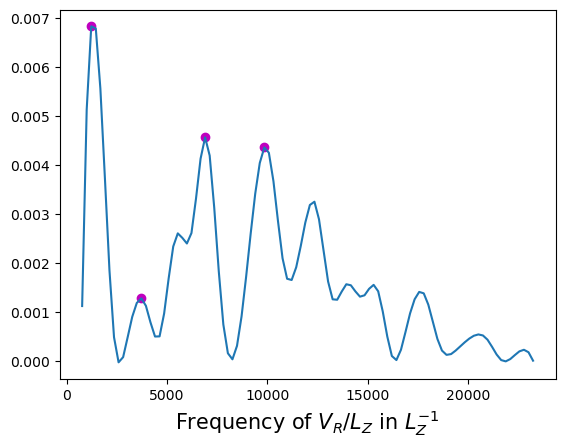

In [406]:
#ax.plot(new_freq_neg1[sort_indx], power_spec[sort_indx], 'o', label='data')
plt.plot(xs, cs(xs), label="Cubic Spline")
plt.scatter(peak_x, peak_y, c='m')
plt.xlabel('Frequency of $V_R/L_Z$ in $L_Z^{-1}$', fontsize=15)

In [407]:
V_0 = 239.26
R_0 = 8.277 # kpc
n = 0

delta_L = peak_x

timea= (V_0/(R_0**n))**(-2/(1+n))
timeb = delta_L**(-(n-1)/(n+1))
timec = np.pi/(1-0.5*np.sqrt(2*(n+1)))

time = timea*timeb*timec
print(time)
print(np.median(time))

[[0.23028546]
 [0.69819031]
 [1.29370558]
 [1.84668405]]
0.9959479482472198


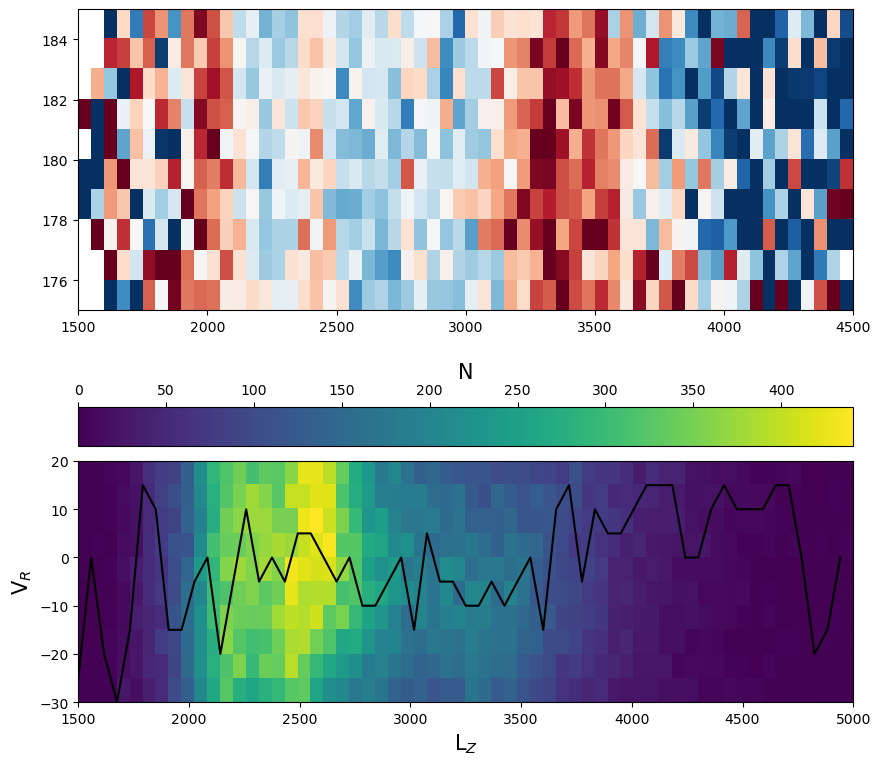

In [285]:
fig,ax = plt.subplots(2,1, figsize=(10,9), gridspec_kw={'hspace': 0.3, 'wspace': 0})

Lz=np.abs(v_phi[ind_AC40deg_v2])*r[ind_AC40deg_v2]
v_r_cut = v_r[ind_AC40deg_v2]
phi_cut = phi[ind_AC40deg_v2]

binsarr = [nxbins,nybins] # 70 is Lz and 60 is Vr
rangearr = [[1500, 5000],[-30,20]]


#############

pcm = ax[0].imshow(hist2d_lz_phi.statistic.T, origin='lower',
           vmin = -14,
           vmax = 14,
           norm = 'linear',
           cmap='RdBu', extent=[1500, 4500, 175, 185] ,aspect='auto')
#####

bin_Lz_Vr =scipy.stats.binned_statistic_2d(Lz, v_r_cut, Lz,
                                           'count', bins=binsarr,
                                           range = rangearr)
v_r_vals = bin_Lz_Vr.y_edge
hist2d_LZ_VR = bin_Lz_Vr.statistic
col_median = np.zeros(binsarr[0])
for i in range(binsarr[0]):
    array = hist2d_LZ_VR[i,:]
    value  = np.nanmax(hist2d_LZ_VR[i,:])
    iinndd = (np.abs(array - value)).argmin()
    col_median[i] = np.median(v_r_vals[iinndd])
    

pcm = ax[1].imshow(bin_Lz_Vr.statistic.T,
                origin='lower',
                #vmax=14,
                #vmin=-14,
                #norm='log',
                cmap = 'viridis', extent=[1500, 5000,-30,20],aspect='auto')

cb = fig.colorbar(pcm, ax=ax[1], location='top')
cb.set_label(label='N',size=15)
ax[1].set_xlabel('L$_Z$', fontsize=15)
ax[1].set_ylabel('V$_R$', fontsize=15)

lz_med = bin_Lz_Vr.x_edge[:-1]
ax[1].plot(lz_med, col_median, c='k')



#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/Lz_phi_vr.png', dpi=400)


97731 1347291


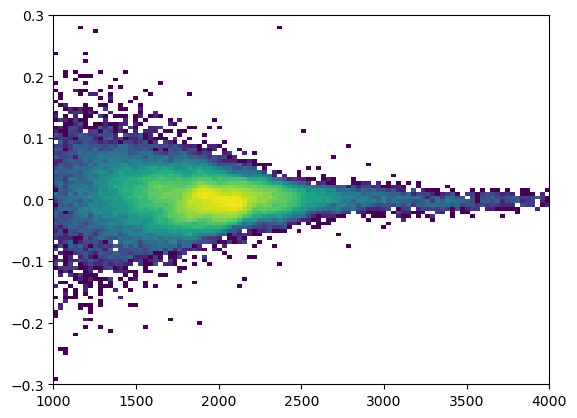

In [270]:
Lz=np.abs(v_phi[ind_AC40deg])*r[ind_AC40deg]
v_r_cut = v_r[ind_AC40deg]
phi_cut = phi[ind_AC40deg]

circ_phi_ind = np.where((phi_cut> 179.75)&(phi_cut<180.25))
print(len(circ_phi_ind[0]), len(phi_cut))

plt.hist2d(Lz[circ_phi_ind], v_r_cut[circ_phi_ind]/Lz[circ_phi_ind],
           norm='log',
           bins=100, range=[[1000, 4000],[-0.3, 0.3]])
plt.show()

In [271]:
np.polyfit(np.array([8,11]), np.array([0.05, 0.6]), 

SyntaxError: incomplete input (2822187984.py, line 1)

/global/common/software/desi/perlmutter/desiconda/20230111-2.1.0/conda/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)


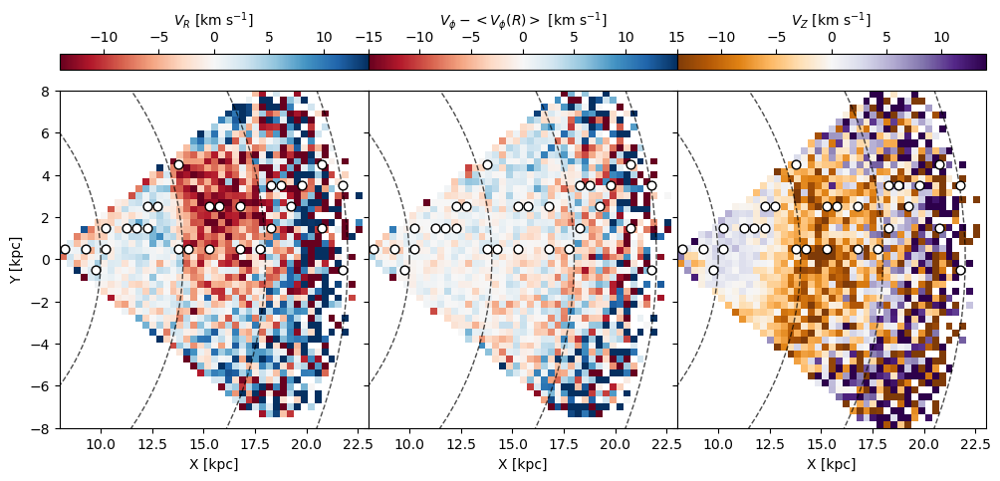

In [272]:
nxbins = 18*3
nybins = 16*3
rangearr=[[7, 25],[-8,8]]
binsarr = [nxbins, nybins]


# plotting
fig, ax = plt.subplots(1,3, figsize=(12,5.5), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})



ax[0].set_xlabel('X [kpc]')
ax[0].set_ylabel('Y [kpc]')


###########################################################################################
###########################################################################################
###########################################################################################


bin_x_y =scipy.stats.binned_statistic_2d(galac_xind500[disky_index],
                                           galac_yind500[disky_index],
                                           v_r_ind500[disky_index],
                                           'median', bins=binsarr,
                                           range = rangearr)


pcm = ax[0].imshow(bin_x_y.statistic.T,
                origin='lower',
                vmax=14,
                vmin=-14,
                norm='linear',
                cmap = 'RdBu', extent=[7, 25,-7.5, 8],aspect='auto')
fig.colorbar(pcm, ax=ax[0], location='top', label='$V_R$ [km s$^{-1}$]')
#ax[1].grid(True)
ax[0].set_xlabel('X [kpc]')
#ax[0].set_ylabel('Y [kpc]')

###########################################################################################
###########################################################################################
###########################################################################################


bin_x_y_phi =scipy.stats.binned_statistic_2d(galac_xind500[disky_index],
                                           galac_yind500[disky_index],
                                           -v_phi_ind500[disky_index],
                                           'median', bins=binsarr,
                                           range = rangearr)

bin_x_y_r =scipy.stats.binned_statistic_2d(galac_xind500[disky_index],
                                           galac_yind500[disky_index],
                                           r_ind500[disky_index],
                                           'median', bins=binsarr,
                                            range = rangearr)

hehe = bin_x_y_phi.statistic.T


avg_phi_per_r_hist = np.copy(bin_x_y_r.statistic.T)

r_bins = np.arange(7, 25, step=0.25) # if before i used bins of 70 over a 18 kpc space that means each bin is ~0.25 kpc

for rr in range(len(r_bins)-1):
    # at one radius, what is the index of the 2dhist
    #print(rr)
    #bleh = np.where(hehe[:,i] > 175)
    r_bin_index = np.where((bin_x_y_r.statistic.T >r_bins[rr])&(bin_x_y_r.statistic.T <r_bins[rr+1])) 

    #print(r_bin_index[0], r_bin_index[1])

    # the phi values of the bins at the R range
    phi_in_r_bin=bin_x_y_phi.statistic.T[r_bin_index[0], r_bin_index[1]]
    #print(np.nanmedian(lol))

    avg_phi_per_r_hist[r_bin_index[0], r_bin_index[1]] = np.nanmedian(phi_in_r_bin)

phi_m_avg_phi_per_r = bin_x_y_phi.statistic.T - avg_phi_per_r_hist # subtract phi hist from avg phi per r hist

pcm = ax[1].imshow(phi_m_avg_phi_per_r,
              origin='lower',
                vmax=15,
                vmin=-15,
                norm='linear',
                cmap = 'RdBu', extent=[7, 25,-7.5, 8],aspect='auto')
fig.colorbar(pcm, ax=ax[1], location='top', label='$V_\phi - <V_\phi(R)>$ [km s$^{-1}$]')
#ax[2].grid(True)
ax[1].set_xlabel('X [kpc]')

###########################################################################################
###########################################################################################
###########################################################################################


bin_x_y =scipy.stats.binned_statistic_2d(galac_xind500[disky_index],
                                           galac_yind500[disky_index],
                                           v_z_ind500[disky_index],
                                           'median', bins=binsarr,
                                           range = rangearr)


pcm = ax[2].imshow(bin_x_y.statistic.T,
                origin='lower',
                vmax=14,
                vmin=-14,
                norm='linear',
                cmap = 'PuOr', extent=[7, 25,-8, 8],aspect='auto')
fig.colorbar(pcm, ax=ax[2], location='top', label='$V_Z$ [km s$^{-1}$]')
#ax[1].grid(True)
ax[2].set_xlabel('X [kpc]')
#ax[0].set_ylabel('Y [kpc]')

for i in range(3):
    circ = matplotlib.patches.Annulus((0,0), 18,4, ec='k', lw=1, linestyle='--',fill=False, alpha=0.7)
    ax[i].add_patch(circ)
    
    circ = matplotlib.patches.Annulus((0,0), 22,12, ec='k', lw=1, linestyle='--',fill=False, alpha=0.7)
    ax[i].add_patch(circ)

    ax[i].scatter(xes, yes, color='w', s=40, edgecolors='k')
    
    ax[i].set_ylim(-8,8)
    ax[i].set_xlim(8,23)

    
print()

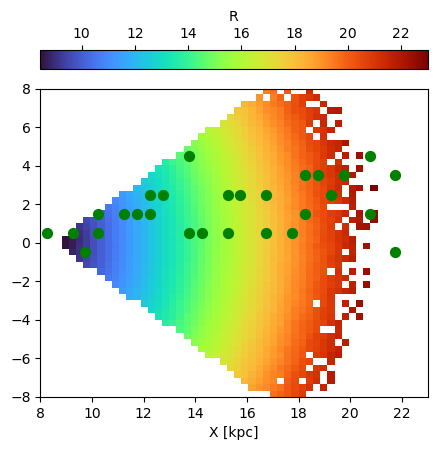

In [273]:
fig,ax = plt.subplots(1, figsize=(5,5))
pcm = ax.imshow(bin_x_y_r.statistic.T,
              origin='lower',
                #vmax=14,
                #vmin=-14,
                norm='linear',
                cmap = 'turbo', extent=[8, 23,-8, 8],aspect='auto')
fig.colorbar(pcm, ax=ax, location='top', label='R')
#ax[2].grid(True)
ax.set_xlabel('X [kpc]')
plt.scatter(xes, yes, color='green', s=50)

54 [ 7.          7.33333333  7.66666667  8.          8.33333333  8.66666667
  9.          9.33333333  9.66666667 10.         10.33333333 10.66666667
 11.         11.33333333 11.66666667 12.         12.33333333 12.66666667
 13.         13.33333333 13.66666667 14.         14.33333333 14.66666667
 15.         15.33333333 15.66666667 16.         16.33333333 16.66666667
 17.         17.33333333 17.66666667 18.         18.33333333 18.66666667
 19.         19.33333333 19.66666667 20.         20.33333333 20.66666667
 21.         21.33333333 21.66666667 22.         22.33333333 22.66666667
 23.         23.33333333 23.66666667 24.         24.33333333 24.66666667]


/tmp/ipykernel_71257/694626610.py:14: RuntimeWarning: All-NaN slice encountered
  if np.nanmin(np.abs(a[a != 0])) == 0.:


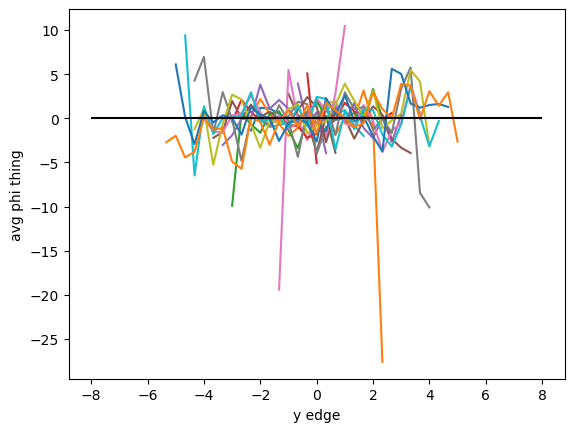

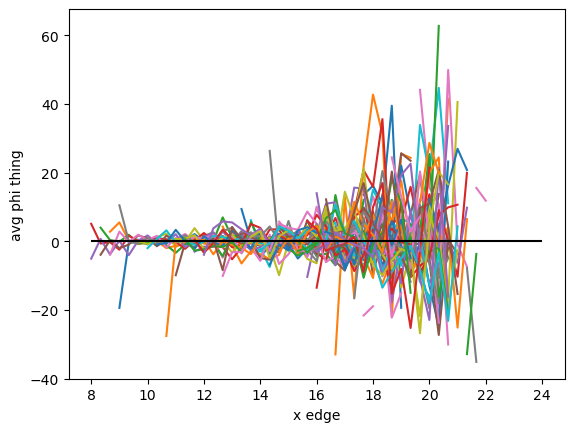

In [274]:
print(len(bin_x_y_r.x_edge[:-1]), bin_x_y_r.x_edge[:-1])

min_values = np.zeros(len(bin_x_y_r.x_edge[:-1]))

for i in range(len(bin_x_y_r.x_edge[:22])): # only look out to x=18 kpc
    plt.plot(bin_x_y_r.y_edge[:-1],phi_m_avg_phi_per_r.T[i])#,
                #color=phi_m_avg_phi_per_r.T[0], cmap='RdBu')
    a = phi_m_avg_phi_per_r.T[i]
    #print(np.nanmin(np.abs(a[a != 0])))
                
                  
        
                      
    if np.nanmin(np.abs(a[a != 0])) == 0.:
        print(a)

plt.xlabel('y edge')
plt.ylabel('avg phi thing')
plt.hlines(0, -8,8, 'k')
#plt.ylim(-5, 5)
plt.show()


for i in range(len(bin_x_y_r.y_edge[:-1])):
    plt.plot(bin_x_y_r.x_edge[:-1],phi_m_avg_phi_per_r[i])#,
                #color=phi_m_avg_phi_per_r.T[0], cmap='RdBu')
plt.xlabel('x edge')
plt.ylabel('avg phi thing')
plt.hlines(0, 8,24, 'k')
#plt.ylim(-5, 5)
plt.show()

In [275]:
bin_rz = scipy.stats.binned_statistic_2d(r[ind500],
                                           z[ind500],
                                           completeness_arr,
                                           'median', bins=(100, 50),
                                           range = [[7, 25],[0,8]])



# plotting
fig, ax = plt.subplots(1,figsize=(9,5))
pcm = ax.imshow(bin_rz.statistic.T,
                origin='lower',
                #vmax=250,
                #vmin=100,
                #norm='log',
                #vmax = 1,
                cmap = 'magma', extent=[7,25,0,8],aspect='auto')
fig.colorbar(pcm, ax=ax, location='right', label='completeness')
ax.grid(True)
ax.set_xlabel('R')
ax.set_ylabel('Z')


AttributeError: The number of `values` elements must match the length of each `sample` dimension.

In [276]:
bin_rz = scipy.stats.binned_statistic_2d(r[ind500],
                                           z[ind500],
                                           completeness_arr,
                                           'count', bins=(100, 50),
                                           range = [[7, 25],[0,8]])

bin_rz_comp = scipy.stats.binned_statistic_2d(r[ind500],
                                           z[ind500],
                                           completeness_arr,
                                           'median', bins=(100, 50),
                                           range = [[7, 25],[0,8]])

density_corr = bin_rz.statistic * (0.8/bin_rz_comp.statistic)

# plotting
fig, ax = plt.subplots(1,figsize=(9,5))
pcm = ax.imshow(density_corr.T,
                origin='lower',
                #vmax=250,
                #vmin=100,
                norm='log',
                #vmax = 1,
                cmap = 'viridis', extent=[7,25,0,8],aspect='auto')
fig.colorbar(pcm, ax=ax, location='right', label='completeness')

ax.set_xlabel('R')
ax.set_ylabel('Z')

AttributeError: The number of `values` elements must match the length of each `sample` dimension.

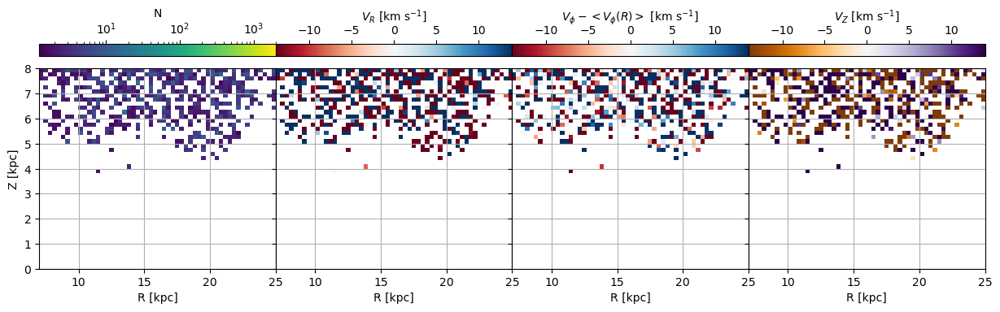

In [277]:
zmin = 0
zmax = 8

nxbins = 18*3
nybins = 16*3
rangearr=[[7, 25],[zmin, zmax]]
binsarr = [nxbins, nybins]

completeness_ind500 = completeness_arr
phi_ind500 = phi[ind500]
r_ind500= r[ind500]
z_ind500= z[ind500]
feh_ind500 = feh_tot[ind500]
v_r_ind500 = v_r[ind500]
v_phi_ind500 = v_phi[ind500]
v_z_ind500 = v_z[ind500]

feh_index_cut = np.where((feh_ind500>-.8)&(feh_ind500<1))


# plotting
fig, ax = plt.subplots(1,4, figsize=(15,4), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})




bin_rz =scipy.stats.binned_statistic_2d(r_ind500[feh_index_cut],
                                           z_ind500[feh_index_cut],
                                           v_r_ind500[feh_index_cut],
                                           'count', bins=binsarr,
                                           range = rangearr)



bin_rz_comp = scipy.stats.binned_statistic_2d(r_ind500[feh_index_cut],
                                           z_ind500[feh_index_cut],
                                           completeness_ind500[feh_index_cut],
                                           'median', bins=binsarr,
                                           range = rangearr)

density_corr = bin_rz.statistic * (0.8/bin_rz_comp.statistic)


pcm = ax[0].imshow(density_corr.T,
                origin='lower',
                vmax=2000,
                #vmin=-21,
                norm='log',
                cmap = 'viridis', extent=[7, 25,zmin, zmax],aspect='auto')
fig.colorbar(pcm, ax=ax[0], location='top', label='N')
#ax[0].grid(True)
ax[0].set_xlabel('R [kpc]')
ax[0].set_ylabel('Z [kpc]')


###########################################################################################
###########################################################################################
###########################################################################################


bin_x_y =scipy.stats.binned_statistic_2d(r_ind500[feh_index_cut],
                                           z_ind500[feh_index_cut],
                                           v_r_ind500[feh_index_cut],
                                           'median', bins=binsarr,
                                           range = rangearr)



bounds = [-20, -10,-1, 0, 1, 10, 20]
norm = mpl.colors.BoundaryNorm(bounds, cmap.N, extend='both')



pcm = ax[1].imshow(bin_x_y.statistic.T,
                origin='lower',
                vmax=14,
                vmin=-14,
                norm='linear',
                cmap = 'RdBu', extent=[7, 25,zmin, zmax],aspect='auto')
fig.colorbar(pcm, ax=ax[1], location='top', label='$V_R$ [km s$^{-1}$]')
#ax[1].grid(True)
ax[1].set_xlabel('R [kpc]')
#ax[0].set_ylabel('Y [kpc]')

###########################################################################################
###########################################################################################
###########################################################################################


bin_x_y =scipy.stats.binned_statistic_2d(r_ind500[feh_index_cut],
                                           z_ind500[feh_index_cut],
                                           -v_phi_ind500[feh_index_cut],
                                           'median', bins=binsarr,
                                           range = rangearr)

hehe = bin_x_y.statistic.T

image_col_mean = np.copy(hehe)


for i in range(len(hehe[1])): # column length

    image_col_mean[:,i] = hehe[:,i] - np.nanmedian(hehe[:,i])
#image_col_mean[np.where(image_col_mean <0)] = 0 # column averaged 2d histogram


# try only looking at vphi > 175 as this is only the disk vphi
# otherwise out average vphi is skewy-ed
pcm = ax[2].imshow(image_col_mean,
              origin='lower',
                vmax=14,
                vmin=-14,
                norm='linear',
                cmap = 'RdBu', extent=[7, 25,zmin, zmax],aspect='auto')
fig.colorbar(pcm, ax=ax[2], location='top', label='$V_\phi - <V_\phi(R)>$ [km s$^{-1}$]')
#ax[2].grid(True)
ax[2].set_xlabel('R [kpc]')


###########################################################################################
###########################################################################################
###########################################################################################


bin_x_y =scipy.stats.binned_statistic_2d(r_ind500[feh_index_cut],
                                           z_ind500[feh_index_cut],
                                           v_z_ind500[feh_index_cut],
                                           'median', bins=binsarr,
                                           range = rangearr)


pcm = ax[3].imshow(bin_x_y.statistic.T,
              origin='lower',
                vmax=14,
                vmin=-14,
                norm='linear',
                cmap = 'PuOr', extent=[7, 25,zmin, zmax],aspect='auto')
fig.colorbar(pcm, ax=ax[3], location='top', label='$V_Z$ [km s$^{-1}$]')

ax[3].set_xlabel('R [kpc]')

ax[0].grid(True)
ax[1].grid(True)
ax[2].grid(True)
ax[3].grid(True)



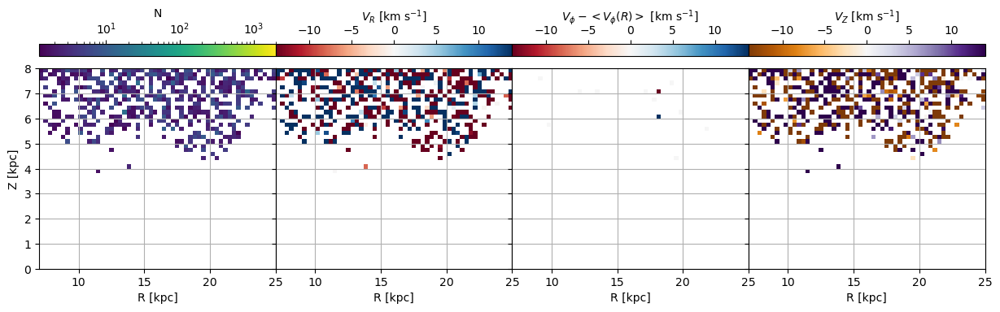

In [278]:
zmin = 0
zmax = 8

nxbins = 18*3
nybins = 16*3
rangearr=[[7, 25],[zmin, zmax]]
binsarr = [nxbins, nybins]

completeness_ind500 = completeness_arr
phi_ind500 = phi[ind500]
r_ind500= r[ind500]
z_ind500= z[ind500]
feh_ind500 = feh_tot[ind500]
v_r_ind500 = v_r[ind500]
v_phi_ind500 = v_phi[ind500]
v_z_ind500 = v_z[ind500]

feh_index_cut = np.where((feh_ind500>-.8)&(feh_ind500<1))


# plotting
fig, ax = plt.subplots(1,4, figsize=(15,4), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})




bin_rz =scipy.stats.binned_statistic_2d(r_ind500[feh_index_cut],
                                           z_ind500[feh_index_cut],
                                           v_r_ind500[feh_index_cut],
                                           'count', bins=binsarr,
                                           range = rangearr)



bin_rz_comp = scipy.stats.binned_statistic_2d(r_ind500[feh_index_cut],
                                           z_ind500[feh_index_cut],
                                           completeness_ind500[feh_index_cut],
                                           'median', bins=binsarr,
                                           range = rangearr)

density_corr = bin_rz.statistic * (0.8/bin_rz_comp.statistic)


pcm = ax[0].imshow(density_corr.T,
                origin='lower',
                vmax=2000,
                #vmin=-21,
                norm='log',
                cmap = 'viridis', extent=[7, 25,zmin, zmax],aspect='auto')
fig.colorbar(pcm, ax=ax[0], location='top', label='N')
#ax[0].grid(True)
ax[0].set_xlabel('R [kpc]')
ax[0].set_ylabel('Z [kpc]')


###########################################################################################
###########################################################################################
###########################################################################################


bin_x_y =scipy.stats.binned_statistic_2d(r_ind500[feh_index_cut],
                                           z_ind500[feh_index_cut],
                                           v_r_ind500[feh_index_cut],
                                           'median', bins=binsarr,
                                           range = rangearr)



bounds = [-20, -10,-1, 0, 1, 10, 20]
norm = mpl.colors.BoundaryNorm(bounds, cmap.N, extend='both')



pcm = ax[1].imshow(bin_x_y.statistic.T,
                origin='lower',
                vmax=14,
                vmin=-14,
                norm='linear',
                cmap = 'RdBu', extent=[7, 25,zmin, zmax],aspect='auto')
fig.colorbar(pcm, ax=ax[1], location='top', label='$V_R$ [km s$^{-1}$]')
#ax[1].grid(True)
ax[1].set_xlabel('R [kpc]')
#ax[0].set_ylabel('Y [kpc]')

###########################################################################################
###########################################################################################
###########################################################################################


bin_x_y =scipy.stats.binned_statistic_2d(r_ind500[feh_index_cut],
                                           z_ind500[feh_index_cut],
                                           -v_phi_ind500[feh_index_cut],
                                           'median', bins=binsarr,
                                           range = rangearr)



hehe = bin_x_y.statistic.T

image_col_mean = np.copy(hehe)
image_col_mean[:]  = np.nan

for i in range(len(hehe[1])): # column length
    bleh = np.where(hehe[:,i] > 175)
    image_col_mean[bleh,i] = hehe[bleh,i] - np.nanmedian(hehe[bleh,i])
#image_col_mean[np.where(image_col_mean <0)] = 0 # column averaged 2d histogram


# try only looking at vphi > 175 as this is only the disk vphi
# otherwise out average vphi is skewy-ed
pcm = ax[2].imshow(image_col_mean,
              origin='lower',
                vmax=14,
                vmin=-14,
                norm='linear',
                cmap = 'RdBu', extent=[7, 25,zmin, zmax],aspect='auto')
fig.colorbar(pcm, ax=ax[2], location='top', label='$V_\phi - <V_\phi(R)>$ [km s$^{-1}$]')
#ax[2].grid(True)
ax[2].set_xlabel('R [kpc]')



###########################################################################################
###########################################################################################
###########################################################################################


bin_x_y =scipy.stats.binned_statistic_2d(r_ind500[feh_index_cut],
                                           z_ind500[feh_index_cut],
                                           v_z_ind500[feh_index_cut],
                                           'median', bins=binsarr,
                                           range = rangearr)


pcm = ax[3].imshow(bin_x_y.statistic.T,
              origin='lower',
                vmax=14,
                vmin=-14,
                norm='linear',
                cmap = 'PuOr', extent=[7, 25,zmin, zmax],aspect='auto')
fig.colorbar(pcm, ax=ax[3], location='top', label='$V_Z$ [km s$^{-1}$]')

ax[3].set_xlabel('R [kpc]')

ax[0].grid(True)
ax[1].grid(True)
ax[2].grid(True)
ax[3].grid(True)



Text(0.5, 0, 'R [kpc]')

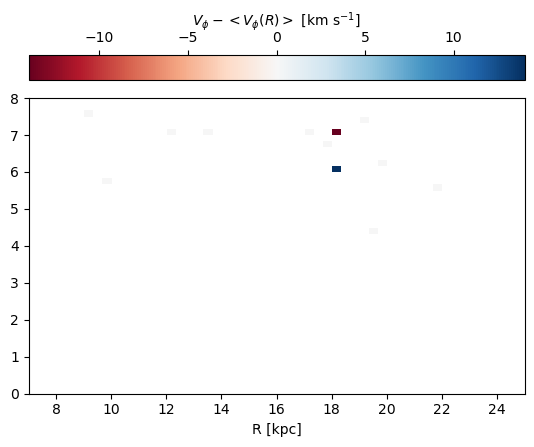

In [279]:
bin_x_y =scipy.stats.binned_statistic_2d(r_ind500[feh_index_cut],
                                           z_ind500[feh_index_cut],
                                           -v_phi_ind500[feh_index_cut],
                                           'median', bins=binsarr,
                                           range = rangearr)

hehe = bin_x_y.statistic.T

image_col_mean = np.copy(hehe)
image_col_mean[:]  = np.nan

for i in range(len(hehe[1])): # column length
    bleh = np.where(hehe[:,i] > 175)
    image_col_mean[bleh,i] = hehe[bleh,i] - np.nanmedian(hehe[bleh,i])
#'
pcm = plt.imshow(image_col_mean,
              origin='lower',
                vmax=14,
                vmin=-14,
                norm='linear',
                cmap = 'RdBu', extent=[7, 25,zmin, zmax],aspect='auto')
plt.colorbar(pcm, location='top', label='$V_\phi - <V_\phi(R)>$ [km s$^{-1}$]')
#ax[2].grid(True)
plt.xlabel('R [kpc]')

In [203]:
24-8

16

Text(0.5, 0, 'R [kpc]')

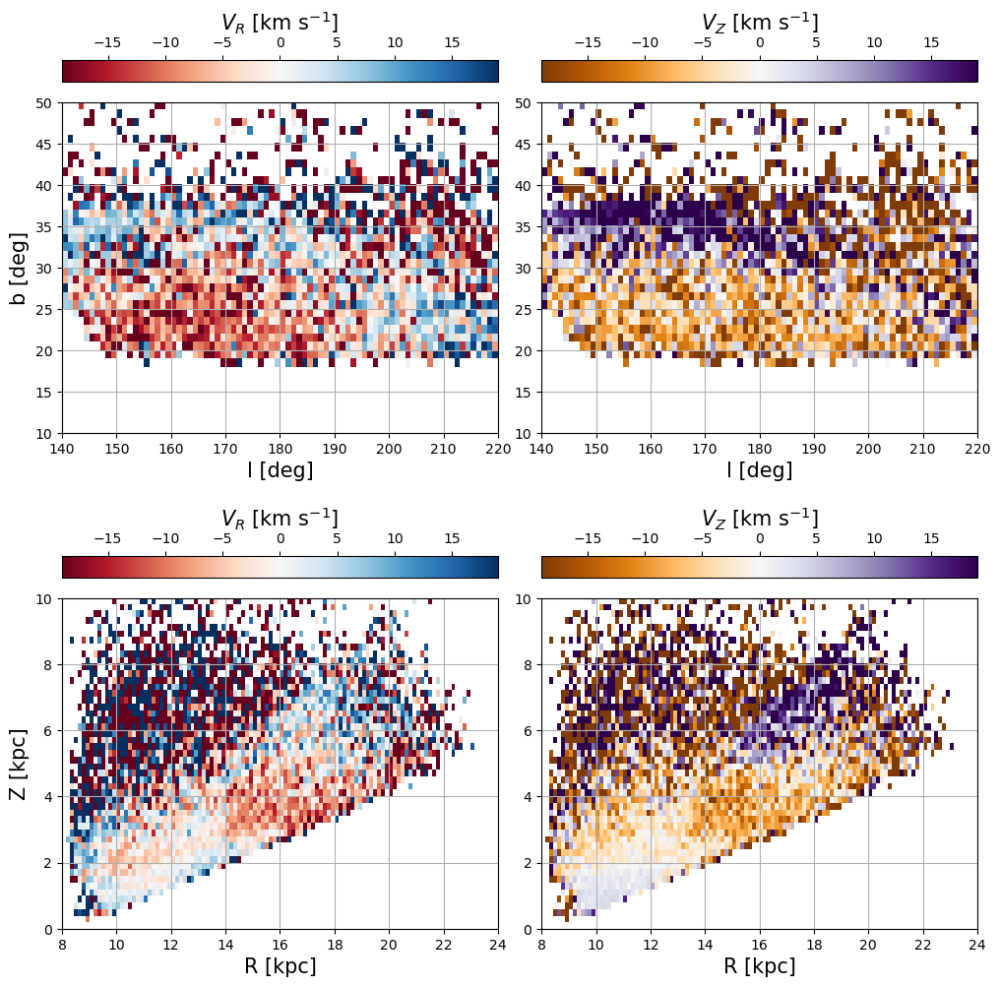

In [194]:
ind_MSTO_14 = np.where((z>0)&(z<11)&
                        #(phi>160)&(phi<200)&
                       (l_cut>140)&(l_cut<220)&#trying with l cut instead. toget around the hole in data
                  (r>15)&(r<25)&
                          (Gmag_cut<5.7)&(Gmag_cut>3.3)&
                  (gmr_cut>.2)&(gmr_cut<0.55)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))
#len(ind_AC40deg_14[0])

# plotting
fig, ax = plt.subplots(2,2, figsize=(12,12),
                       #sharex=True,
                       #sharey=True,
                       gridspec_kw={'hspace': 0.2, 'wspace': 0.1})

nxbins = 80
nybins = 40
binsarr = [nxbins, nybins]
rangearr = [[140, 220], [10,50]]
interp = 'None'
bin_b_l = scipy.stats.binned_statistic_2d(l_cut[ind_MSTO_14],
                                           b_cut[ind_MSTO_14],
                                           v_r[ind_MSTO_14],
                                           'median', bins=binsarr,
                                           range = rangearr)
pcm = ax[0,0].imshow(bin_b_l.statistic.T,
                origin='lower',
                vmax=19,
                vmin=-19,
                norm='linear',
                cmap = 'RdBu', extent=[140, 220,10, 50],aspect='auto', interpolation = interp)

cb = fig.colorbar(pcm, ax=ax[0,0], location='top',)
cb.set_label( label='$V_R$ [km s$^{-1}$]',size=15)
ax[0,0].grid(True)
ax[0,0].set_xlabel('l [deg]', fontsize=15)
ax[0,0].set_ylabel('b [deg]', fontsize=15)

###########################################################################################

bin_b_l = scipy.stats.binned_statistic_2d(l_cut[ind_MSTO_14],
                                           b_cut[ind_MSTO_14],
                                           v_z[ind_MSTO_14],
                                           'median', bins=binsarr,
                                           range = rangearr)

pcm = ax[0,1].imshow(bin_b_l.statistic.T,
              origin='lower',
                vmax=19,
                vmin=-19,
                #norm='asinh',
                cmap = 'PuOr', extent=[140, 220,10, 50],aspect='auto', interpolation = interp)

cb = fig.colorbar(pcm, ax=ax[0,1], location='top',)
cb.set_label( label='$V_Z$ [km s$^{-1}$]',size=15)
ax[0,1].grid(True)
ax[0,1].set_xlabel('l [deg]', fontsize=15)



######################################################################################################
#####################################################################################################
#####################################################################################################
nxbins = 16*7
nybins = 10*5
binsarr1 = [nxbins, nybins]
rangearr1 = [[8,24], [0,10]]
interp = 'None'

bin_RZ = scipy.stats.binned_statistic_2d(r[ind500_msto],
                                           z[ind500_msto],
                                           v_r[ind500_msto],
                                           'median', bins=binsarr1,
                                           range = rangearr1)

pcm = ax[1,0].imshow(bin_RZ.statistic.T,
                origin='lower',
                vmax=19,
                vmin=-19,
                norm='linear',
                cmap = 'RdBu', extent=[8,24,0,10],aspect='auto', interpolation = interp)

cb = fig.colorbar(pcm, ax=ax[1,0], location='top',)
cb.set_label( label='$V_R$ [km s$^{-1}$]',size=15)
ax[1,0].grid(True)
ax[1,0].set_xlabel('R [kpc]', fontsize=15)
ax[1,0].set_ylabel('Z [kpc]', fontsize=15)



###########################################################################################

bin_RZ = scipy.stats.binned_statistic_2d(r[ind500_msto],
                                           z[ind500_msto],
                                           v_z[ind500_msto],
                                           'median', bins=binsarr1,
                                           range = rangearr1
                                        )

pcm = ax[1,1].imshow(bin_RZ.statistic.T,
              origin='lower',
                vmax=19,
                vmin=-19,
                #norm='asinh',
                cmap = 'PuOr', extent=[8,24,0,10],aspect='auto', interpolation = interp)

cb = fig.colorbar(pcm, ax=ax[1,1], location='top',)
cb.set_label( label='$V_Z$ [km s$^{-1}$]',size=15)
ax[1,1].grid(True)
ax[1,1].set_xlabel('R [kpc]', fontsize=15)



#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/loa_Mono_ACS_lb_VRZ.png', dpi=400)





Text(0.5, 0, 'R [kpc]')

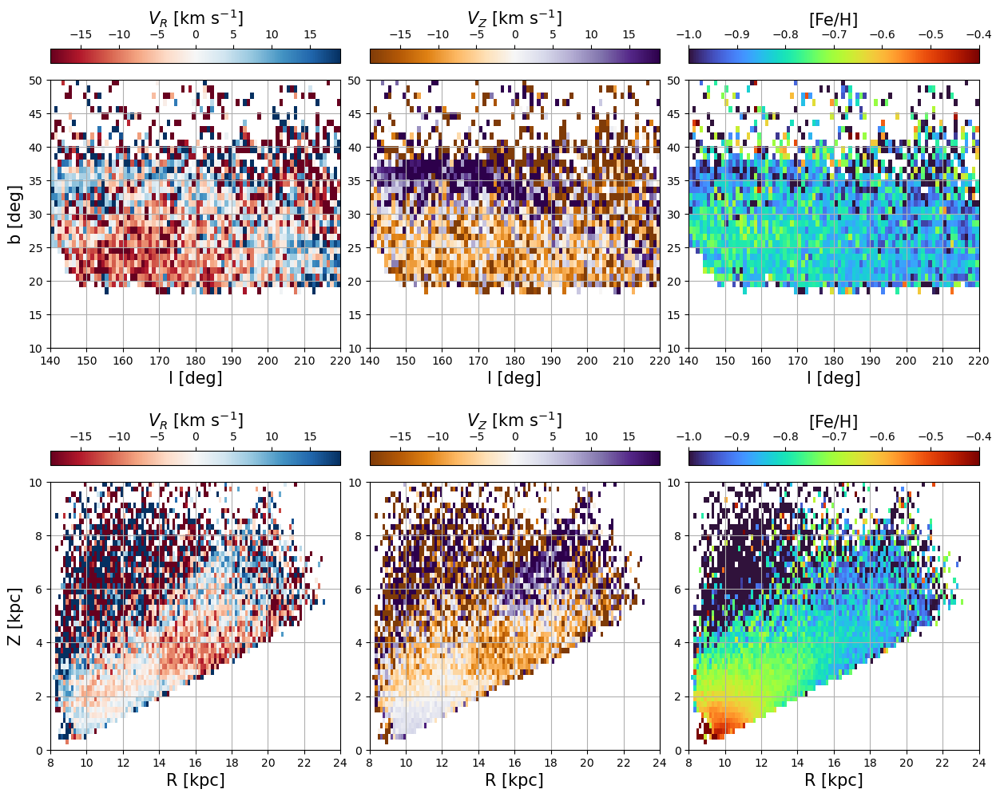

In [204]:
ind_MSTO_14 = np.where((z>0)&(z<11)&
                        #(phi>160)&(phi<200)&
                       (l_cut>140)&(l_cut<220)&#trying with l cut instead. toget around the hole in data
                  (r>15)&(r<25)&
                          (Gmag_cut<5.7)&(Gmag_cut>3.3)&
                  (gmr_cut>.2)&(gmr_cut<0.55)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))
#len(ind_AC40deg_14[0])

# plotting
fig, ax = plt.subplots(2,3, figsize=(15,12),
                       #sharex=True,
                       #sharey=True,
                       gridspec_kw={'hspace': 0.2, 'wspace': 0.1})

nxbins = 80
nybins = 40
binsarr = [nxbins, nybins]
rangearr = [[140, 220], [10,50]]
interp = 'None'
bin_b_l = scipy.stats.binned_statistic_2d(l_cut[ind_MSTO_14],
                                           b_cut[ind_MSTO_14],
                                           v_r[ind_MSTO_14],
                                           'median', bins=binsarr,
                                           range = rangearr)
pcm = ax[0,0].imshow(bin_b_l.statistic.T,
                origin='lower',
                vmax=19,
                vmin=-19,
                norm='linear',
                cmap = 'RdBu', extent=[140, 220,10, 50],aspect='auto', interpolation = interp)

cb = fig.colorbar(pcm, ax=ax[0,0], location='top',)
cb.set_label( label='$V_R$ [km s$^{-1}$]',size=15)
ax[0,0].grid(True)
ax[0,0].set_xlabel('l [deg]', fontsize=15)
ax[0,0].set_ylabel('b [deg]', fontsize=15)

###########################################################################################

bin_b_l = scipy.stats.binned_statistic_2d(l_cut[ind_MSTO_14],
                                           b_cut[ind_MSTO_14],
                                           v_z[ind_MSTO_14],
                                           'median', bins=binsarr,
                                           range = rangearr)

pcm = ax[0,1].imshow(bin_b_l.statistic.T,
              origin='lower',
                vmax=19,
                vmin=-19,
                #norm='asinh',
                cmap = 'PuOr', extent=[140, 220,10, 50],aspect='auto', interpolation = interp)

cb = fig.colorbar(pcm, ax=ax[0,1], location='top',)
cb.set_label( label='$V_Z$ [km s$^{-1}$]',size=15)
ax[0,1].grid(True)
ax[0,1].set_xlabel('l [deg]', fontsize=15)

###########################################################################################

bin_b_l = scipy.stats.binned_statistic_2d(l_cut[ind_MSTO_14],
                                           b_cut[ind_MSTO_14],
                                           feh_cut[ind_MSTO_14],
                                           'median', bins=binsarr,
                                           range = rangearr)

pcm = ax[0,2].imshow(bin_b_l.statistic.T,
              origin='lower',
                vmax=-0.4,
                vmin=-1.,
                #norm='asinh',
                cmap = 'turbo', extent=[140, 220,10, 50],aspect='auto', interpolation = interp)

cb = fig.colorbar(pcm, ax=ax[0,2], location='top',)
cb.set_label( label='[Fe/H]',size=15)
ax[0,2].grid(True)
ax[0,2].set_xlabel('l [deg]', fontsize=15)



######################################################################################################
#####################################################################################################
#####################################################################################################
nxbins = 16*7
nybins = 10*5
binsarr1 = [nxbins, nybins]
rangearr1 = [[8,24], [0,10]]
interp = 'None'

bin_RZ = scipy.stats.binned_statistic_2d(r[ind500_msto],
                                           z[ind500_msto],
                                           v_r[ind500_msto],
                                           'median', bins=binsarr1,
                                           range = rangearr1)

pcm = ax[1,0].imshow(bin_RZ.statistic.T,
                origin='lower',
                vmax=19,
                vmin=-19,
                norm='linear',
                cmap = 'RdBu', extent=[8,24,0,10],aspect='auto', interpolation = interp)

cb = fig.colorbar(pcm, ax=ax[1,0], location='top',)
cb.set_label( label='$V_R$ [km s$^{-1}$]',size=15)
ax[1,0].grid(True)
ax[1,0].set_xlabel('R [kpc]', fontsize=15)
ax[1,0].set_ylabel('Z [kpc]', fontsize=15)



###########################################################################################

bin_RZ = scipy.stats.binned_statistic_2d(r[ind500_msto],
                                           z[ind500_msto],
                                           v_z[ind500_msto],
                                           'median', bins=binsarr1,
                                           range = rangearr1
                                        )

pcm = ax[1,1].imshow(bin_RZ.statistic.T,
              origin='lower',
                vmax=19,
                vmin=-19,
                #norm='asinh',
                cmap = 'PuOr', extent=[8,24,0,10],aspect='auto', interpolation = interp)

cb = fig.colorbar(pcm, ax=ax[1,1], location='top',)
cb.set_label( label='$V_Z$ [km s$^{-1}$]',size=15)
ax[1,1].grid(True)
ax[1,1].set_xlabel('R [kpc]', fontsize=15)

###########################################################################################

bin_RZ = scipy.stats.binned_statistic_2d(r[ind500_msto],
                                           z[ind500_msto],
                                           feh_cut[ind500_msto],
                                           'median', bins=binsarr1,
                                           range = rangearr1
                                        )

pcm = ax[1,2].imshow(bin_RZ.statistic.T,
              origin='lower',
                vmax=-0.4,
                vmin=-1.,
                #norm='asinh',
                cmap = 'turbo', extent=[8,24,0,10],aspect='auto', interpolation = interp)

cb = fig.colorbar(pcm, ax=ax[1,2], location='top',)
cb.set_label( label='[Fe/H]',size=15)
ax[1,2].grid(True)
ax[1,2].set_xlabel('R [kpc]', fontsize=15)


#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/loa_Mono_ACS_lb_VRZ.png', dpi=400)





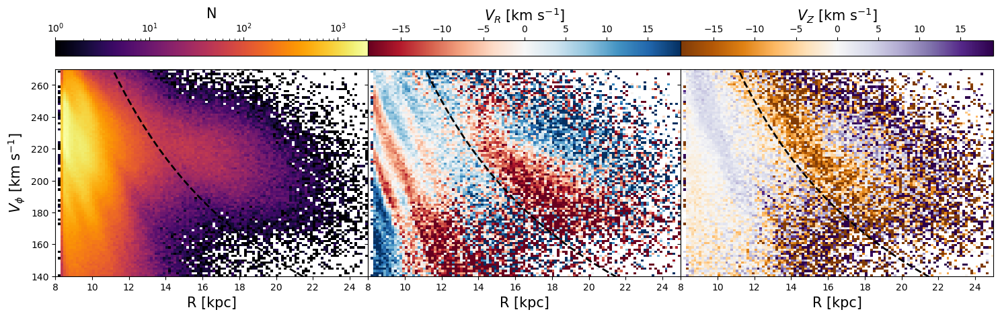

In [207]:
fig, ax = plt.subplots(1,3, figsize=(18, 5), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})


nxbins = 17*7
nybins = 130*0.75
rangearr=[[8, 25], [140, 270]]
binsarr = [nxbins, nybins]




hist2d = scipy.stats.binned_statistic_2d(r[ind_AC40deg],
                                    -v_phi[ind_AC40deg],
                                    v_z[ind_AC40deg],
                                    statistic = 'count',
                                    range=rangearr,
                                    bins=binsarr)


cmap.set_bad('white',1.)
pcm = ax[0].imshow(hist2d.statistic.T, origin='lower',
           #vmin = -14,
           #vmax = 10**3,
           norm = 'log',
           cmap='inferno', extent=[8, 25, 140, 270] ,aspect='auto')

#fig.colorbar(pcm, ax=ax[0], location='top', label='N')
cb = fig.colorbar(pcm, ax=ax[0], location='top')
cb.set_label(label='N',size=15)

ax[0].set_xlabel('R [kpc]')

#VR
hist2d = scipy.stats.binned_statistic_2d(r[ind_AC40deg],
                                    -v_phi[ind_AC40deg],
                                    v_r[ind_AC40deg],
                                    statistic = np.nanmedian,
                                    range=rangearr,
                                    bins=binsarr)


cmap.set_bad('white',1.)
pcm = ax[1].imshow(hist2d.statistic.T, origin='lower',
           vmin = -19,
           vmax = 19,
           #norm = 'asinh',
           cmap='RdBu', extent=[8, 25, 140, 270] ,aspect='auto')

cb = fig.colorbar(pcm, ax=ax[1], location='top')
cb.set_label(label='$V_R$ [km s$^{-1}$]',size=15)
#ax.set_xlabel('R [kpc]')



# vz

hist2d = scipy.stats.binned_statistic_2d(r[ind_AC40deg],
                                    -v_phi[ind_AC40deg],
                                    v_z[ind_AC40deg],
                                    statistic = np.nanmedian,
                                    range=rangearr,
                                    bins=binsarr)


cmap.set_bad('white',1.)
pcm = ax[2].imshow(hist2d.statistic.T, origin='lower',
           vmin = -19,
           vmax = 19,
           #norm = 'asinh',
           cmap='PuOr', extent=[8, 25, 140, 270] ,aspect='auto')


cb = fig.colorbar(pcm, ax=ax[2], location='top')
cb.set_label(label='$V_Z$ [km s$^{-1}$]',size=15)



ax[0].set_ylabel('$V_\phi$ [km s$^{-1}$]', fontsize=15)
ax[0].set_xlabel('R [kpc]', fontsize=15)
ax[1].set_xlabel('R [kpc]', fontsize=15)
ax[2].set_xlabel('R [kpc]', fontsize=15)





#ax[1].set_ylabel('$V_\phi$ [km/s]')

R_values = np.linspace(8, 25, 40) 
#L_values = [1500, 1700, 2000, 2300, 2500, 3000]
#L_values = [1600, 1800, 2050, 2300, 2500, 3000, 3600]
L_values = [1600, 1750, 2040, 2300, 2500, 3000, 3600]
L_values = [3000]
for i in range(len(L_values)):
    V_phi_values = L_values[i]/R_values
    momentums = ax[0].plot(R_values, V_phi_values, color='k', linestyle = '--', linewidth=2)
    momentums = ax[1].plot(R_values, V_phi_values, color='k', linestyle = '--', linewidth=2)
    momentums = ax[2].plot(R_values, V_phi_values, color='k', linestyle = '--', linewidth=2)
    
#ax[0].hlines(180, 7.8, 25, alpha=0.5)
#ax[1].hlines(180, 7.8, 25, alpha=0.5)

ax[0].set_ylim(140, 270)

#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/loa_R_V_phi_counts_VR_VZ.png', dpi=400)

(140.0, 270.0)

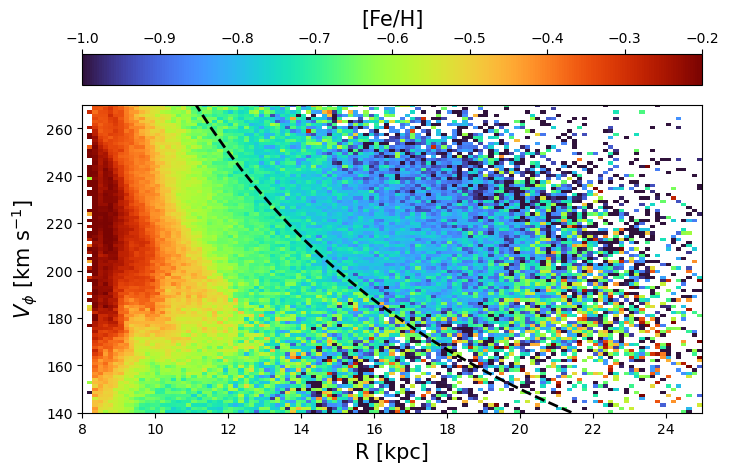

In [282]:
fig, ax = plt.subplots(1,1, figsize=(8, 5), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})


nxbins = 17*7
nybins = 130*0.75
rangearr=[[8, 25], [140, 270]]
binsarr = [nxbins, nybins]




hist2d = scipy.stats.binned_statistic_2d(r[ind_AC40deg],
                                    -v_phi[ind_AC40deg],
                                    feh_cut[ind_AC40deg],
                                    statistic = 'median',
                                    range=rangearr,
                                    bins=binsarr)


cmap.set_bad('white',1.)
pcm = ax.imshow(hist2d.statistic.T, origin='lower',
           vmin = -1.0,
           vmax = -0.2,
           #norm = 'log',
           cmap='turbo', extent=[8, 25, 140, 270] ,aspect='auto')

cb = fig.colorbar(pcm, ax=ax, location='top')
cb.set_label(label='[Fe/H]',size=15)
ax.set_xlabel('R [kpc]', fontsize=15)
ax.set_ylabel('$V_\phi$ [km s$^{-1}$]', fontsize=15)


L_values = [3000]
for i in range(len(L_values)):
    V_phi_values = L_values[i]/R_values
    momentums = ax.plot(R_values, V_phi_values, color='k', linestyle = '--', linewidth=2)

ax.set_ylim(140, 270)

#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/R_V_phi_FEH.png', dpi=400)



# MSTO

(140.0, 270.0)

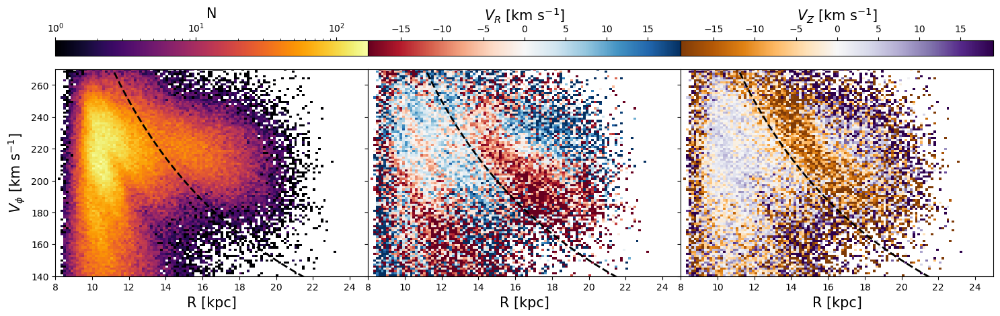

In [283]:
fig, ax = plt.subplots(1,3, figsize=(18, 5), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})


nxbins = 17*7
nybins = 130*0.75
rangearr=[[8, 25], [140, 270]]
binsarr = [nxbins, nybins]


hist2d = scipy.stats.binned_statistic_2d(r[ind500_msto],
                                    -v_phi[ind500_msto],
                                    v_z[ind500_msto],
                                    statistic = 'count',
                                    range=rangearr,
                                    bins=binsarr)


cmap.set_bad('white',1.)
pcm = ax[0].imshow(hist2d.statistic.T, origin='lower',
           #vmin = -14,
           #vmax = 10**3,
           norm = 'log',
           cmap='inferno', extent=[8, 25, 140, 270] ,aspect='auto')

cb = fig.colorbar(pcm, ax=ax[0], location='top')
cb.set_label(label='N',size=15)
ax[0].set_xlabel('R [kpc]')

#VR
hist2d = scipy.stats.binned_statistic_2d(r[ind500_msto],
                                    -v_phi[ind500_msto],
                                    v_r[ind500_msto],
                                    statistic = np.nanmedian,
                                    range=rangearr,
                                    bins=binsarr)


cmap.set_bad('white',1.)
pcm = ax[1].imshow(hist2d.statistic.T, origin='lower',
           vmin = -19,
           vmax = 19,
           #norm = 'asinh',
           cmap='RdBu', extent=[8, 25, 140, 270] ,aspect='auto')



cb = fig.colorbar(pcm, ax=ax[1], location='top')
cb.set_label(label='$V_R$ [km s$^{-1}$]',size=15)
#ax.set_xlabel('R [kpc]')



# vz

hist2d = scipy.stats.binned_statistic_2d(r[ind500_msto],
                                    -v_phi[ind500_msto],
                                    v_z[ind500_msto],
                                    statistic = np.nanmedian,
                                    range=rangearr,
                                    bins=binsarr)


cmap.set_bad('white',1.)
pcm = ax[2].imshow(hist2d.statistic.T, origin='lower',
           vmin = -19,
           vmax = 19,
           #norm = 'asinh',
           cmap='PuOr', extent=[8, 25, 140, 270] ,aspect='auto')

cb= fig.colorbar(pcm, ax=ax[2], location='top')
cb.set_label(label='$V_Z$ [km s$^{-1}$]',size=15)


ax[0].set_ylabel('$V_\phi$ [km s$^{-1}$]', fontsize=15)
ax[0].set_xlabel('R [kpc]', fontsize=15)
ax[1].set_xlabel('R [kpc]', fontsize=15)
ax[2].set_xlabel('R [kpc]', fontsize=15)





#ax[1].set_ylabel('$V_\phi$ [km/s]')

R_values = np.linspace(8, 25, 40) 
#L_values = [1500, 1700, 2000, 2300, 2500, 3000]
#L_values = [1600, 1800, 2050, 2300, 2500, 3000, 3600]
L_values = [1600, 1750, 2040, 2300, 2500, 3000, 3600]
L_values = [3000]
for i in range(len(L_values)):
    V_phi_values = L_values[i]/R_values
    momentums = ax[0].plot(R_values, V_phi_values, color='k', linestyle = '--', linewidth=2)
    momentums = ax[1].plot(R_values, V_phi_values, color='k', linestyle = '--', linewidth=2)
    momentums = ax[2].plot(R_values, V_phi_values, color='k', linestyle = '--', linewidth=2)
    
#ax[0].hlines(180, 7.8, 25, alpha=0.5)
#ax[1].hlines(180, 7.8, 25, alpha=0.5)

ax[0].set_ylim(140, 270)

#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/R_V_phi_counts_VR_VZ.png', dpi=400)

(140.0, 270.0)

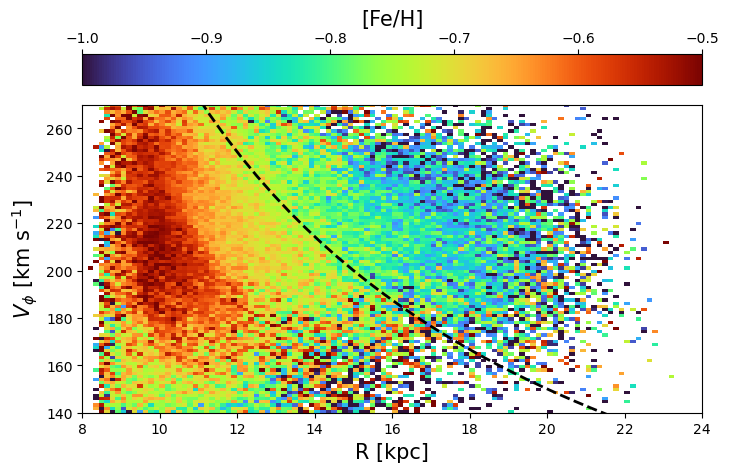

In [284]:
fig, ax = plt.subplots(1,1, figsize=(8, 5), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})


nxbins = 16*7
nybins = 130*0.75
rangearr=[[8, 24], [140, 270]]
binsarr = [nxbins, nybins]


hist2d = scipy.stats.binned_statistic_2d(r[ind500_msto],
                                    -v_phi[ind500_msto],
                                    feh_cut[ind500_msto],
                                    statistic = 'median',
                                    range=rangearr,
                                    bins=binsarr)


cmap.set_bad('white',1.)
pcm = ax.imshow(hist2d.statistic.T, origin='lower',
           vmin = -1.0,
           vmax = -0.5,
           #norm = 'log',
           cmap='turbo', extent=[8, 24, 140, 270] ,aspect='auto')

cb = fig.colorbar(pcm, ax=ax, location='top')
cb.set_label(label='[Fe/H]',size=15)
ax.set_xlabel('R [kpc]', fontsize=15)
ax.set_ylabel('$V_\phi$ [km s$^{-1}$]', fontsize=15)
R_values = np.linspace(8, 24, 40) 
L_values = [3000]
for i in range(len(L_values)):
    V_phi_values = L_values[i]/R_values
    momentums = ax.plot(R_values, V_phi_values, color='k', linestyle = '--', linewidth=2)
ax.set_ylim(140, 270)


#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/R_V_phi_FEH.png', dpi=400)



5760400 5760400
1273093
1023155
452851
179293
69334
31114
16989
11945
9591
7723


Text(0, 0.5, 'Z [kpc]')

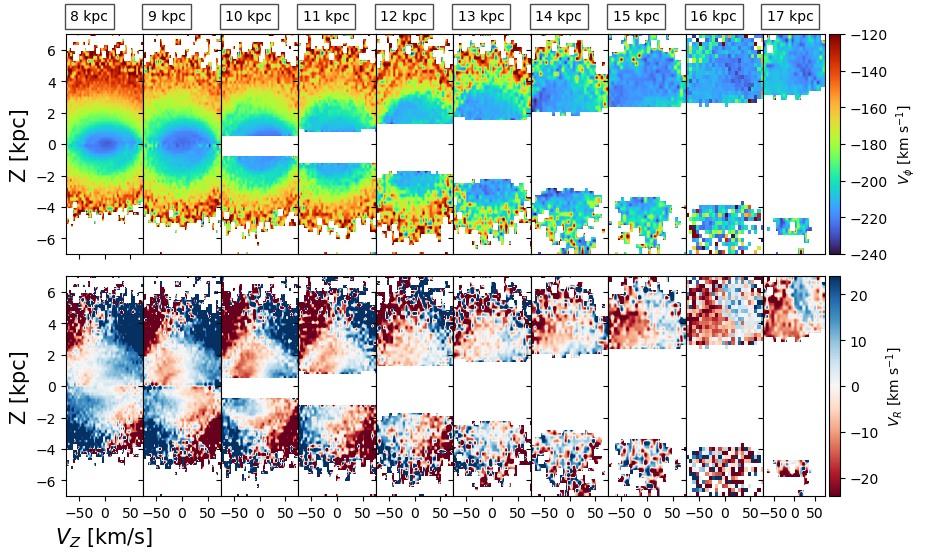

In [285]:
fig, ax = plt.subplots(2,10, figsize=(10*1,6),
                       sharex=True,
                       sharey=True,
                       gridspec_kw={'hspace': 0.1, 'wspace': 0})

max_dist = 30

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = max_dist, dist_min=0)



dist_index = np.where((dist<=max_dist) & (dist>0))
Gmag = gmag - 5*np.log10((dist*1000)) + 5
Gmag_cut = Gmag[dist_index]
gmr_cut = gmr[dist_index]
feh_cut = feh_tot[dist_index]
gmag_cut = gmag[dist_index]
dist_cut = dist[dist_index]



print(len(Gmag_cut), len(z))

l_cut = obj1.l.degree[dist_index]
b_cut = obj1.b.degree[dist_index]

ra_cut = ra[dist_index]
dec_cut = dec[dist_index]




R_values = [8, 9, 10, 11, 12, 13, 14, 15, 16, 17]
nxbins = 72#150
nybins = 42#76

for j in range(10):
        
    # AC40 deg
    ind500 = np.where((z>-11)&(z<11)&
              (abs(phi)>160)&(abs(phi)<200)&
              (r>R_values[j]-0.5)&(r<R_values[j]+0.5)& #8.24 kpc < R < 8.44
              #(Gmag_cut<5.7)&(Gmag_cut>3.3)&
              #  (gmr_cut>.2)&(gmr_cut<0.55)&
              (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 10)))



    nxbins -= 2
    nybins -=2
    rangearr=[[-7, 7],[-75, 75]]
    binsarr = [nxbins, nybins]
    
    
    print(len(z[ind500]))


    bin_z_vz = scipy.stats.binned_statistic_2d(z[ind500], v_z[ind500], v_phi[ind500],
                                       'median', bins=binsarr,
                                       range = rangearr)

    pcm = ax[0,j].imshow(bin_z_vz.statistic,
            origin='lower',vmin = -240, vmax= -120,
            cmap = 'turbo', extent=[-75, 75, -7, 7],aspect='auto')


    ax[0,j].text(0.06, 1.05, str(R_values[j])+" kpc",
                  horizontalalignment='left',
                  verticalalignment='bottom',
                  transform=ax[0,j].transAxes,
                  color='Black', alpha=1,
                 bbox=dict(facecolor='white', edgecolor='black', alpha=0.7))
    
    #####################################################################################################
    #####################################################################################################
    #####################################################################################################
    
    bin_z_vz = scipy.stats.binned_statistic_2d(z[ind500], v_z[ind500], v_r[ind500],
                                       'median', bins=binsarr,
                                       range = rangearr)

    pcm_rb = ax[1,j].imshow(bin_z_vz.statistic,
            origin='lower',
            vmin = -24, vmax= 24,
            #norm='asinh',
            cmap = 'RdBu', extent=[-75, 75, -7, 7],aspect='auto')


    
    if j > 0:
        ax[0,j].tick_params(
            axis='x',          # changes apply to the x-axis
            which='both',      # both major and minor ticks are affected
            bottom=False,      # ticks along the bottom edge are off
            top=False,         # ticks along the top edge are off
            labelbottom=False)


fig.colorbar(pcm, ax=ax[0,j], location='right', label='$V_\phi$ [km s$^{-1}$]')
fig.colorbar(pcm_rb, ax=ax[1,j], location='right', label='$V_R$ [km s$^{-1}$]')
ax[1,0].set_xlabel('$V_Z$ [km/s]', fontsize=15)
ax[1,0].set_ylabel('Z [kpc]', fontsize=15)
ax[0,0].set_ylabel('Z [kpc]', fontsize=15)

#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/Z_VZ_R_duel_plot.png', dpi=400)

In [286]:

rangearr  = [[130, 230],[0, 50]]
binsarr = (70,40)

# r > 14 kpc
l_cut_msto = l_cut[ind500_msto]
b_cut_msto = b_cut[ind500_msto]
v_r_msto = v_r[ind500_msto]
v_z_msto = v_z[ind500_msto]
r_msto = r[ind500_msto]

big_r = np.where(r_msto>14)

bin_b_l = scipy.stats.binned_statistic_2d(l_cut_msto[big_r],
                                           b_cut_msto[big_r],
                                           v_r_msto[big_r],
                                           'median', bins=binsarr,
                                           range = rangearr)

# plotting
fig, ax = plt.subplots(1,2, figsize=(12,5), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})



pcm = ax[0].imshow(bin_b_l.statistic.T,
                origin='lower',
                vmax=20,
                vmin=-20,
                #norm='asinh',
                cmap = 'RdBu', extent=[100, 200,0, 50],aspect='auto')
fig.colorbar(pcm, ax=ax[0], location='top', label='$V_R$ [km s$^{-1}$]')
ax[0].grid(True)
ax[0].set_xlabel('l [deg]')
ax[0].set_ylabel('b [deg]')

###########################################################################################
###########################################################################################
###########################################################################################


bin_b_l = scipy.stats.binned_statistic_2d(l_cut_msto[big_r],
                                           b_cut_msto[big_r],
                                           v_z_msto[big_r],
                                           'median', bins=binsarr,
                                           range = rangearr)

colormap = mpl.cm.PuOr
#bounds = [-10**2, -10,-1, 0, 1, 10, 10**2]
norm = mpl.colors.BoundaryNorm(bounds, colormap.N, extend='both')


pcm = ax[1].imshow(bin_b_l.statistic.T,
              origin='lower',
                vmax=20,
                vmin=-20,
                #norm='asinh',
                cmap = 'PuOr', extent=[100, 200,0, 50],aspect='auto')
fig.colorbar(pcm, ax=ax[1], location='top', label='$V_Z$ [km s$^{-1}$]')
ax[1].grid(True)
ax[1].set_xlabel('l [deg]')

IndexError: index 5760404 is out of bounds for axis 0 with size 5760400

Text(0.5, 0, 'l [deg]')

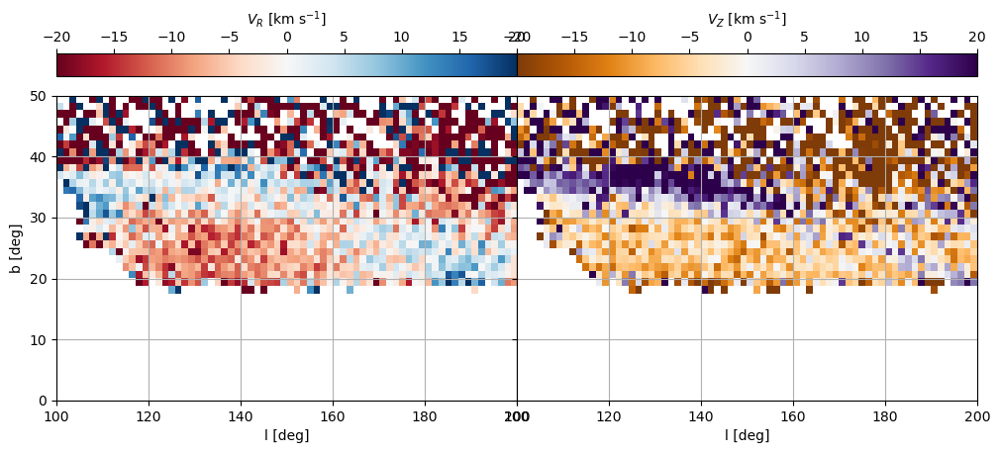

In [287]:


ind500 = np.where((np.abs(z)<10)&
                  #(phi>100)&(phi<300)&
                  (r>14)&
                  #(abs(v_z)<100)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))


bin_b_l = scipy.stats.binned_statistic_2d(l_tot[ind500],
                                           b_tot[ind500],
                                           v_r[ind500],
                                           'median', bins=binsarr,
                                           range = rangearr)

# plotting
fig, ax = plt.subplots(1,2, figsize=(12,5), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})



pcm = ax[0].imshow(bin_b_l.statistic.T,
                origin='lower',
                vmax=20,
                vmin=-20,
                norm='linear',
                cmap = 'RdBu', extent=[100, 200,0, 50],aspect='auto')
fig.colorbar(pcm, ax=ax[0], location='top', label='$V_R$ [km s$^{-1}$]')
ax[0].grid(True)
ax[0].set_xlabel('l [deg]')
ax[0].set_ylabel('b [deg]')

###########################################################################################
###########################################################################################
###########################################################################################


bin_b_l = scipy.stats.binned_statistic_2d(l_tot[ind500],
                                           b_tot[ind500],
                                           v_z[ind500],
                                           'median', bins=binsarr,
                                           range = rangearr)

colormap = mpl.cm.PuOr
#bounds = [-10**2, -10,-1, 0, 1, 10, 10**2]
norm = mpl.colors.BoundaryNorm(bounds, colormap.N, extend='both')


pcm = ax[1].imshow(bin_b_l.statistic.T,
              origin='lower',
                vmax=20,
                vmin=-20,
                #norm='asinh',
                cmap = 'PuOr', extent=[100, 200,0, 50],aspect='auto')
fig.colorbar(pcm, ax=ax[1], location='top', label='$V_Z$ [km s$^{-1}$]')
ax[1].grid(True)
ax[1].set_xlabel('l [deg]')


# old

In [ ]:
dist_cut = dist[dist_index]
ra_cut = ra[dist_index]
dec_cut = dec[dist_index]
pmra_cut =pmra[dist_index]
pmdec_cut = pmdec[dist_index]
vrad_cut = vrad[dist_index]
dist_mod_cut = dist_mod[dist_index]

dist_err_cut = dist_err[dist_index]
ra_err_cut = ra_err[dist_index]
dec_err_cut = dec_err[dist_index]
pmra_err_cut =pmra_err[dist_index]
pmdec_err_cut = pmdec_err[dist_index]
vrad_err_cut = vrad_err[dist_index]
dist_mod_err_cut = dist_mod_err[dist_index]

len(dist_err_cut), len(dist_cut), len(z)

In [ ]:
ind500 = np.where((z>0)&(z<7)&
                  (phi>180)&(phi<180.05)&
                  (r>8)&(r<22)&
                  #(b_tot> 35)&(b_tot < 40)&
                  (Gmag_cut<4.8)&(Gmag_cut>3.3)&
                  (gmr_cut>.25)&(gmr_cut<0.75)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))

len(ind500[0])

In [ ]:
235/203059

In [ ]:
fig, ax = plt.subplots(2,2, figsize = (10, 10))

ax[0,0].hist(dist_mod_cut[ind500], bins=30)
ax[0,0].set_xlabel('Dist Mod')

ax[0,1].hist(dist_cut[ind500], bins=30)
ax[0,1].set_xlabel('Dist')

ax[1,0].hist(dist_mod_err_cut[ind500], bins=30)
ax[1,0].set_xlabel('Dist Mod err')

ax[1,1].hist(dist_err_cut[ind500], bins=30)
ax[1,1].set_xlabel('Dist err')


In [ ]:
N=101



# original way where we just take the distribution of the distances and their error
#dMC = unc.normal(dist[small_cut], std=dist_err[small_cut], n_samples=N)

# trying to get a log normal distribution of distances
#MCdist_mod = unc.normal(dist_mod[small_cut]*u.mag, std=dist_mod_err[small_cut]*u.mag, n_samples=N)
#dm = MCdist_mod.distribution
#dist_pc = 10 ** ((dm.value + 5) / 5.) # in pc
#dMC= dist_pc/1000 # convert to kpc
#dMC = coord.Distance(distmod = MCdist_mod.distribution, unit=u.kpc, allow_negative=True).value


dMC = unc.normal(dist_cut[ind500], std=dist_err_cut[ind500], n_samples=N)
    
raMC = unc.normal(ra_cut[ind500], std=ra_err_cut[ind500], n_samples=N)
decMC = unc.normal(dec_cut[ind500], std=dec_err_cut[ind500], n_samples=N)

pmraMC = unc.normal(pmra_cut[ind500], std=pmra_err_cut[ind500], n_samples=N)
pmdecMC = unc.normal(pmdec_cut[ind500], std=ra_err_cut[ind500], n_samples=N)

vradMC = unc.normal(vrad_cut[ind500], std=vrad_err_cut[ind500], n_samples=N)

#vradMC = vrad[small_cut] + vrad_err[small_cut]*np.random.normal(size = N)
         
        
#print(raMC[0][0])
#print(vradMC[0][0])
#print(vradMC[4][0])


r_16th = np.zeros(len(ind500[0]))
r_84th = np.zeros(len(ind500[0]))
r_mean = np.zeros(len(ind500[0]))
r_std = np.zeros(len(ind500[0]))

phi_16th = np.zeros(len(ind500[0]))
phi_84th = np.zeros(len(ind500[0]))
phi_mean = np.zeros(len(ind500[0]))
phi_std = np.zeros(len(ind500[0]))

z_16th = np.zeros(len(ind500[0]))
z_84th = np.zeros(len(ind500[0]))
z_mean = np.zeros(len(ind500[0]))
z_std = np.zeros(len(ind500[0]))

vr_16th = np.zeros(len(ind500[0]))
vr_84th = np.zeros(len(ind500[0]))
vr_mean = np.zeros(len(ind500[0]))
vr_std = np.zeros(len(ind500[0]))

vphi_16th = np.zeros(len(ind500[0]))
vphi_84th = np.zeros(len(ind500[0]))
vphi_mean = np.zeros(len(ind500[0]))
vphi_std = np.zeros(len(ind500[0]))

vz_16th = np.zeros(len(ind500[0]))
vz_84th = np.zeros(len(ind500[0]))
vz_mean = np.zeros(len(ind500[0]))
vz_std = np.zeros(len(ind500[0]))

ellipses = []
fig,ax = plt.subplots(1, figsize=(10,7))

print(len(ind500[0]))

for i in range(len(ind500[0])):
    
    #print(dMC[i][0])
    dMCC = coord.Distance(dMC[i][0], unit=u.kpc, allow_negative=True).value
    c= coord.ICRS(ra=raMC[i][0]*u.deg, # include the [0] for weird indexxing issue with astropy uncertainity
              dec=decMC[i][0]*u.deg,
                  distance=coord.Distance(dMC[i][0], unit=u.kpc, allow_negative=True).value*u.kpc,
                  pm_ra_cosdec=pmraMC[i][0]*u.mas/u.yr,
                  pm_dec=pmdecMC[i][0]*u.mas/u.yr,
                  radial_velocity=vradMC[i][0]*u.km/u.s)

    # Define GC frame
    v_sun = coord.CartesianDifferential([11.1,248.5,7.25]*u.km/u.s) #Schönrich et al. 2010; Reid & Brunthaler 2020),
    gc_frame= coord.Galactocentric(galcen_distance=8.178*u.kpc, # gravity collab 2019
                                       z_sun=20.8*u.pc, # Bennett & Bovy 2019).
                                       galcen_v_sun=v_sun)
    cg= c.transform_to(gc_frame)

    cg.representation_type = 'cylindrical'

    r = cg.rho.to(u.kpc).value
    phi = cg.phi.degree
    z = cg.z.to(u.kpc).value
    v_r = cg.d_rho.to(u.km/u.s).value
    v_phi = (cg.d_phi*cg.rho).to(u.km/u.s,
            equivalencies=u.dimensionless_angles()).value
    v_z = cg.d_z.to(u.km/u.s).value
    
    
    if np.median(-v_phi) < 100:
        print('i', i)
        r_mean[i] = np.nan
        r_std[i] = np.nan
        
        phi_mean[i] = np.nan
        phi_std[i] = np.nan

        z_mean[i] = np.nan
        z_std[i] = np.nan

        vr_mean[i] = np.nan
        vr_std[i] = np.nan

        vphi_mean[i] = np.nan
        vphi_std[i] = np.nan

        vz_mean[i] = np.nan
        vz_std[i] = np.nan
        continue
        
    else:
        #r_16th.append(np.percentile(r, 16))
        #r_84th.append(np.percentile(r, 84))
        r_mean[i] = np.median(r)
        r_std[i] = np.std(r)

        #phi_16th.append(np.percentile(phi, 16))
        #phi_84th.append(np.percentile(phi, 84))
        phi_mean[i] = np.median(phi)
        phi_std[i] = np.std(phi)

        #z_16th.append(np.percentile(z, 16))
        #z_84th.append(np.percentile(z, 84))
        z_mean[i] = np.median(z)
        z_std[i] = np.std(z)


        #vr_16th.append(np.percentile(v_r, 16))
        #vr_84th.append(np.percentile(v_r, 84))
        vr_mean[i] = np.median(v_r)
        vr_std[i] = np.std(v_r)

        #vphi_16th.append(np.percentile(-v_phi, 16))
        #vphi_84th.append(np.percentile(-v_phi, 84))
        vphi_mean[i] = np.median(-v_phi)
        vphi_std[i] = np.std(-v_phi)

        #vz_16th.append(np.percentile(v_z, 16))
        #vz_84th.append(np.percentile(v_z, 84))
        vz_mean[i] = np.median(v_z)
        vz_std[i] = np.std(v_z)

        
        ax.errorbar(np.median(r), np.median(z),
                     xerr=np.std(r),
                     yerr=np.std(z),
                    linewidth=0.5,
                     linestyle='none',color='k',alpha=0.5,
                    #marker='.',
                     #markersize=5
                    )
        ax.set_xlabel('R [kpc]')
        ax.set_ylabel('Z [kpc]')
        #ax.set_ylabel('$V_\phi$ [km s$^{-1}$]')
        confidence_ellipse(r, z, ax, edgecolor='m', facecolor='c', zorder=0)
        ax.set_ylim(0, 7)
        
    #if i > 120:
    #    break

    #print(np.median(-v_phi), np.percentile(-v_phi, 16), np.percentile(-v_phi, 84)) # 16th and 84th percentile ( -1sig +1sig)

    
print(len(r_mean))

len(np.nonzero(r_mean)[0])




In [ ]:
fig, ax = plt.subplots(2,4, figsize = (15, 10))

ax[0,0].hist(dist_mod_cut[ind500], bins=30)
ax[0,0].set_xlabel('Dist Mod')

ax[0,1].hist(dist_cut[ind500], bins=30)
ax[0,1].set_xlabel('Dist')

ax[0,2].hist(r_mean, bins=30)
ax[0,2].set_xlabel('R')

ax[0,3].hist(z_mean, bins=30)
ax[0,3].set_xlabel('z')

###############################################################

ax[1,0].hist(dist_mod_err_cut[ind500], bins=30)
ax[1,0].set_xlabel('Dist Mod err')

ax[1,1].hist(dist_err_cut[ind500], bins=30)
ax[1,1].set_xlabel('Dist err')

ax[1,2].hist(r_std, bins=30)
ax[1,2].set_xlabel('R std')

ax[1,3].hist(z_std, bins=30)
ax[1,3].set_xlabel('z std')



In [ ]:
# plot ratio of errr to value and distmod error to alue against magnitude
fig,ax = plt.subplots(1,2, figsize = (10,5))
ax[0].hist(dist_mod_err_cut[ind500]/dist_mod_cut[ind500], bins=30)
ax[0].set_xlabel('Dist Mod err/ Dist Mod')
# remember converting from dist mod to dist normally is given in pc but we have to convert to kpc idk if that makes a difference??? prob not


ax[1].hist(dist_err_cut[ind500]/dist_cut[ind500], bins=30)
ax[1].set_xlabel('Dist err/ Dist')




In [ ]:
# distmod err ratio versus magnitude

dist_mod_er_ratio = dist_mod_err_cut[ind500]/dist_mod_cut[ind500]

plt.hist2d(rmag_cut[ind500], dist_mod_er_ratio,
           #norm='log',
           bins=(20,20), range=[[15.5, 19],[0, .1]])
plt.ylabel('Dist Mod err/Dist_mod')
plt.xlabel('r mag')
plt.colorbar()
plt.show()

In [ ]:
N=11



dMC = unc.normal(dist_cut[ind500], std=dist_err_cut[ind500], n_samples=N)
    
raMC = unc.normal(ra_cut[ind500], std=ra_err_cut[ind500], n_samples=N)
decMC = unc.normal(dec_cut[ind500], std=dec_err_cut[ind500], n_samples=N)

pmraMC = unc.normal(pmra_cut[ind500], std=pmra_err_cut[ind500], n_samples=N)
pmdecMC = unc.normal(pmdec_cut[ind500], std=ra_err_cut[ind500], n_samples=N)

vradMC = unc.normal(vrad_cut[ind500], std=vrad_err_cut[ind500], n_samples=N)


In [ ]:
r_16th = np.zeros(len(ind500[0]))
r_84th = np.zeros(len(ind500[0]))
r_mean = np.zeros(len(ind500[0]))
r_std = np.zeros(len(ind500[0]))

phi_16th = np.zeros(len(ind500[0]))
phi_84th = np.zeros(len(ind500[0]))
phi_mean = np.zeros(len(ind500[0]))
phi_std = np.zeros(len(ind500[0]))

z_16th = np.zeros(len(ind500[0]))
z_84th = np.zeros(len(ind500[0]))
z_mean = np.zeros(len(ind500[0]))
z_std = np.zeros(len(ind500[0]))

vr_16th = np.zeros(len(ind500[0]))
vr_84th = np.zeros(len(ind500[0]))
vr_mean = np.zeros(len(ind500[0]))
vr_std = np.zeros(len(ind500[0]))

vphi_16th = np.zeros(len(ind500[0]))
vphi_84th = np.zeros(len(ind500[0]))
vphi_mean = np.zeros(len(ind500[0]))
vphi_std = np.zeros(len(ind500[0]))

vz_16th = np.zeros(len(ind500[0]))
vz_84th = np.zeros(len(ind500[0]))
vz_mean = np.zeros(len(ind500[0]))
vz_std = np.zeros(len(ind500[0]))

In [ ]:

'''
np.random.seed(421)

for i in range(len(ind500[0])):
    
    #print(i)
    if i % 100 ==0:
        print(np.round(i/ len(ind500[0]), 5))
    
    #print(dMC[i][0])
    DDIST = coord.Distance(value=dMC[i][0], unit=u.kpc,allow_negative=True)

    c= coord.ICRS(ra=raMC[i][0]*u.deg, # include the [0] for weird indexxing issue with astropy uncertainity
              dec=decMC[i][0]*u.deg,
                  distance=DDIST,#dMC[i][0]*u.kpc,
                  pm_ra_cosdec=pmraMC[i][0]*u.mas/u.yr,
                  pm_dec=pmdecMC[i][0]*u.mas/u.yr,
                  radial_velocity=vradMC[i][0]*u.km/u.s)

    # Define GC frame
    v_sun = coord.CartesianDifferential([11.1,248.5,7.25]*u.km/u.s) #Schönrich et al. 2010; Reid & Brunthaler 2020),
    gc_frame= coord.Galactocentric(galcen_distance=8.178*u.kpc, # gravity collab 2019
                                       z_sun=20.8*u.pc, # Bennett & Bovy 2019).
                                       galcen_v_sun=v_sun)
    cg= c.transform_to(gc_frame)

    cg.representation_type = 'cylindrical'

    r = cg.rho.to(u.kpc).value
    phi = cg.phi.degree
    z = cg.z.to(u.kpc).value
    v_r = cg.d_rho.to(u.km/u.s).value
    v_phi = (cg.d_phi*cg.rho).to(u.km/u.s,
            equivalencies=u.dimensionless_angles()).value
    v_z = cg.d_z.to(u.km/u.s).value
    
    
    if np.median(-v_phi) < 100:
        continue
        
    else:
        #r_16th.append(np.percentile(r, 16))
        #r_84th.append(np.percentile(r, 84))
        r_mean[i] = np.median(r)
        r_std[i] = np.std(r)

        #phi_16th.append(np.percentile(phi, 16))
        #phi_84th.append(np.percentile(phi, 84))
        phi_mean[i] = np.median(phi)
        phi_std[i] = np.std(phi)

        #z_16th.append(np.percentile(z, 16))
        #z_84th.append(np.percentile(z, 84))
        z_mean[i] = np.median(z)
        z_std[i] = np.std(z)


        #vr_16th.append(np.percentile(v_r, 16))
        #vr_84th.append(np.percentile(v_r, 84))
        vr_mean[i] = np.median(v_r)
        vr_std[i] = np.std(v_r)

        #vphi_16th.append(np.percentile(-v_phi, 16))
        #vphi_84th.append(np.percentile(-v_phi, 84))
        vphi_mean[i] = np.median(-v_phi)
        vphi_std[i] = np.std(-v_phi)

        #vz_16th.append(np.percentile(v_z, 16))
        #vz_84th.append(np.percentile(v_z, 84))
        vz_mean[i] = np.median(v_z)
        vz_std[i] = np.std(v_z)
'''

In [ ]:
# make a table of all these things
'''
MC_table = Table()
MC_table['r_median'] = r_mean
MC_table['r_std'] = r_std
MC_table['phi_median'] = phi_mean
MC_table['phi_std'] = phi_std
MC_table['z_median'] = z_mean
MC_table['z_std'] = z_std

MC_table['vr_median'] = vr_mean
MC_table['vr_std'] = vr_std
MC_table['vphi_median'] = vphi_mean
MC_table['vphi_std'] = vphi_std
MC_table['vz_median'] = vz_mean
MC_table['vz_std'] = vz_std
'''

In [ ]:
#pwd

In [ ]:
#MC_table.write('/global/u2/m/mlambert/UCSC_DESI_MW/MCtable.fits', format='fits')

In [ ]:
MC_table

In [ ]:
MCTable_saved = Table.read('/global/u2/m/mlambert/UCSC_DESI_MW/MCtable.fits')

In [ ]:
MCTable_saved

In [ ]:
# for MC table
# already assuming the wedge cut 160-200deg 0<z<7 kpc and MSTO cut
# dispersion from the median of the MC sampling

temp_ra = ra
temp_dec = dec
temp_dist = dist
feh_tot = feh


max_dist = 50

objall = coord.SkyCoord(ra=temp_ra[np.where(temp_dist < max_dist)] * u.degree,
                   dec=temp_dec[np.where(temp_dist < max_dist)] * u.degree,
                   distance= temp_dist[np.where(temp_dist < max_dist)] * u.kpc,
                   frame='icrs')
objall = objall.transform_to(coord.Galactocentric)


galac_x = -objall.x.value
galac_y = objall.y.value

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = max_dist, dist_min=0)


dist_index = np.where((dist<=max_dist) & (dist>0))

Gmag = gmag - 5*np.log10((dist*1000)) + 5
Gmag_cut = Gmag[dist_index]
gmr_cut = gmr[dist_index]

print(len(Gmag_cut), len(z))

l_tot = obj1.l.degree[dist_index]
b_tot = obj1.b.degree[dist_index]

# only looking at outer regions
neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

nxbins = 70
nybins = 70
rangearr=[[7, 25],[-7.5, 8]]
binsarr = [nxbins, nybins]

ind500 = np.where((z>0)&(z<7)&
                  (phi>160)&(phi<200)&
                  (r>7)&
                  #(b_tot> 35)&(b_tot < 40)&
                  (Gmag_cut<4.8)&(Gmag_cut>3.3)&
                  (gmr_cut>.25)&(gmr_cut<0.75)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))
print(len(ind500))



# plotting
fig, ax = plt.subplots(1,3, figsize=(12,5.5), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})




bin_x_y =scipy.stats.binned_statistic_2d(galac_x[ind500],
                                           galac_y[ind500],
                                           MCTable_saved['vr_median'],
                                           'std', bins=binsarr,
                                           range = rangearr)



bounds = [-20, -10,-1, 0, 1, 10, 20]
norm = mpl.colors.BoundaryNorm(bounds, cmap.N, extend='both')


pcm = ax[0].imshow(bin_x_y.statistic.T,
                origin='lower',
                vmax=100,
                #vmin=-21,
                #norm='asinh',
                cmap = 'turbo', extent=[7, 25,-7.5, 8],aspect='auto')
fig.colorbar(pcm, ax=ax[0], location='top', label='$V_{R\sigma}$')
#ax[0].grid(True)
ax[0].set_xlabel('X [kpc]')
ax[0].set_ylabel('Y [kpc]')


######################################################################################
######################################################################################
######################################################################################

bin_x_y =scipy.stats.binned_statistic_2d(galac_x[ind500],
                                           galac_y[ind500],
                                           MCTable_saved['vphi_median'],
                                           'std', bins=binsarr,
                                           range = rangearr)

pcm = ax[1].imshow(bin_x_y.statistic.T,
                origin='lower',
                vmax=60,
                #vmin=-21,
                #norm='log',
                cmap = 'turbo', extent=[7, 25,-7.5, 8],aspect='auto')
fig.colorbar(pcm, ax=ax[1], location='top', label='$V_{\phi\sigma}$')
#ax[0].grid(True)
ax[1].set_xlabel('X [kpc]')
#ax[1].set_ylabel('Y [kpc]')


######################################################################################
######################################################################################
######################################################################################

bin_x_y =scipy.stats.binned_statistic_2d(galac_x[ind500],
                                           galac_y[ind500],
                                           MCTable_saved['vz_median'],
                                           'std', bins=binsarr,
                                           range = rangearr)

pcm = ax[2].imshow(bin_x_y.statistic.T,
                origin='lower',
                vmax=100,
                #vmin=-21,
                #norm='log',
                cmap = 'turbo', extent=[7, 25,-7.5, 8],aspect='auto')
fig.colorbar(pcm, ax=ax[2], location='top', label='$V_{Z\sigma}$')
#ax[0].grid(True)
ax[2].set_xlabel('X [kpc]')
#ax[1].set_ylabel('Y [kpc]')



'''
circ = matplotlib.patches.Annulus((0,0), 18,4, ec='white', lw=4, linestyle='--',fill=False, alpha=1)
ax[0].add_patch(circ)
circ = matplotlib.patches.Annulus((0,0), 18,4, ec='white', lw=4, linestyle='--',fill=False, alpha=1)
ax[1].add_patch(circ)
circ = matplotlib.patches.Annulus((0,0), 18,4, ec='white', lw=4, linestyle='--',fill=False, alpha=1)
ax[2].add_patch(circ)
'''
print()

In [ ]:
# for MC table
# already assuming the wedge cut 160-200deg 0<z<7 kpc and MSTO cut
# dispersion from the median of the MC sampling

temp_ra = ra
temp_dec = dec
temp_dist = dist
feh_tot = feh


max_dist = 50

objall = coord.SkyCoord(ra=temp_ra[np.where(temp_dist < max_dist)] * u.degree,
                   dec=temp_dec[np.where(temp_dist < max_dist)] * u.degree,
                   distance= temp_dist[np.where(temp_dist < max_dist)] * u.kpc,
                   frame='icrs')
objall = objall.transform_to(coord.Galactocentric)


galac_x = -objall.x.value
galac_y = objall.y.value

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = max_dist, dist_min=0)


dist_index = np.where((dist<=max_dist) & (dist>0))

Gmag = gmag - 5*np.log10((dist*1000)) + 5
Gmag_cut = Gmag[dist_index]
gmr_cut = gmr[dist_index]

print(len(Gmag_cut), len(z))

l_tot = obj1.l.degree[dist_index]
b_tot = obj1.b.degree[dist_index]

# only looking at outer regions
neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

nxbins = 70
nybins = 70
rangearr=[[7, 25],[-7.5, 8]]
binsarr = [nxbins, nybins]

ind500 = np.where((z>0)&(z<7)&
                  (phi>160)&(phi<200)&
                  (r>7)&
                  #(b_tot> 35)&(b_tot < 40)&
                  (Gmag_cut<4.8)&(Gmag_cut>3.3)&
                  (gmr_cut>.25)&(gmr_cut<0.75)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))
print(len(ind500))



# plotting
fig, ax = plt.subplots(1,3, figsize=(12,5.5), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})




bin_x_y =scipy.stats.binned_statistic_2d(galac_x[ind500],
                                           galac_y[ind500],
                                           MCTable_saved['vr_std'],
                                           'median', bins=binsarr,
                                           range = rangearr)



bounds = [-20, -10,-1, 0, 1, 10, 20]
norm = mpl.colors.BoundaryNorm(bounds, cmap.N, extend='both')


pcm = ax[0].imshow(bin_x_y.statistic.T,
                origin='lower',
                vmax=10,
                #vmin=-21,
                #norm='asinh',
                cmap = 'turbo', extent=[7, 25,-7.5, 8],aspect='auto')
fig.colorbar(pcm, ax=ax[0], location='top', label='$V_{R}$ ERR')
#ax[0].grid(True)
ax[0].set_xlabel('X [kpc]')
ax[0].set_ylabel('Y [kpc]')


######################################################################################
######################################################################################
######################################################################################

bin_x_y =scipy.stats.binned_statistic_2d(galac_x[ind500],
                                           galac_y[ind500],
                                           MCTable_saved['vphi_std'],
                                           'median', bins=binsarr,
                                           range = rangearr)

pcm = ax[1].imshow(bin_x_y.statistic.T,
                origin='lower',
                vmax=20,
                #vmin=-21,
                #norm='log',
                cmap = 'turbo', extent=[7, 25,-7.5, 8],aspect='auto')
fig.colorbar(pcm, ax=ax[1], location='top', label='$V_{\phi}$ ERR')
#ax[0].grid(True)
ax[1].set_xlabel('X [kpc]')
#ax[1].set_ylabel('Y [kpc]')


######################################################################################
######################################################################################
######################################################################################

bin_x_y =scipy.stats.binned_statistic_2d(galac_x[ind500],
                                           galac_y[ind500],
                                           MCTable_saved['vz_std'],
                                           'median', bins=binsarr,
                                           range = rangearr)

pcm = ax[2].imshow(bin_x_y.statistic.T,
                origin='lower',
                vmax=20,
                #vmin=-21,
                #norm='log',
                cmap = 'turbo', extent=[7, 25,-7.5, 8],aspect='auto')
fig.colorbar(pcm, ax=ax[2], location='top', label='$V_{Z}$ ERR')
#ax[0].grid(True)
ax[2].set_xlabel('X [kpc]')
#ax[1].set_ylabel('Y [kpc]')



'''
circ = matplotlib.patches.Annulus((0,0), 18,4, ec='white', lw=4, linestyle='--',fill=False, alpha=1)
ax[0].add_patch(circ)
circ = matplotlib.patches.Annulus((0,0), 18,4, ec='white', lw=4, linestyle='--',fill=False, alpha=1)
ax[1].add_patch(circ)
circ = matplotlib.patches.Annulus((0,0), 18,4, ec='white', lw=4, linestyle='--',fill=False, alpha=1)
ax[2].add_patch(circ)
'''
print()

# different latitude cuts

In [ ]:
temp_ra = ra
temp_dec = dec
temp_dist = dist
feh_tot = feh


max_dist = 30

objall = coord.SkyCoord(ra=temp_ra[np.where(temp_dist < max_dist)] * u.degree,
                   dec=temp_dec[np.where(temp_dist < max_dist)] * u.degree,
                   distance= temp_dist[np.where(temp_dist < max_dist)] * u.kpc,
                   frame='icrs')
objall = objall.transform_to(coord.Galactocentric)


galac_x = -objall.x.value
galac_y = objall.y.value

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 30, dist_min=0)


dist_index = np.where((dist<=30) & (dist>0))



l_tot = obj1.l.degree[dist_index]
b_tot = obj1.b.degree[dist_index]

# only looking at outer regions
neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

nxbins = 100
nybins = 100
rangearr=[[0, 25],[-7.5, 10]]
binsarr = [nxbins, nybins]

ind500 = np.where((np.abs(z)<10)&
                  #(phi>100)&(phi<300)&
                  (r>0)&
                  (b_tot> 30)&(b_tot < 40)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1))) # gets rid of halo stars


bin_x_y =scipy.stats.binned_statistic_2d(galac_x[ind500],
                                           galac_y[ind500],
                                           v_r[ind500],
                                           'median', bins=binsarr,
                                           range = rangearr)

# plotting
fig, ax = plt.subplots(1,2, figsize=(12,5.5), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})

bounds = [-20, -10,-1, 0, 1, 10, 20]
norm = mpl.colors.BoundaryNorm(bounds, cmap.N, extend='both')



pcm = ax[0].imshow(bin_x_y.statistic.T,
                origin='lower',
                vmax=21,
                vmin=-21,
                norm='linear',
                cmap = cmap, extent=[0, 25,-7.5, 10],aspect='auto')
fig.colorbar(pcm, ax=ax[0], location='top', label='$V_R$ [km s$^{-1}$]')
ax[0].grid(True)
ax[0].set_xlabel('X [kpc]')
ax[0].set_ylabel('Y [kpc]')

###########################################################################################
###########################################################################################
###########################################################################################


bin_x_y =scipy.stats.binned_statistic_2d(galac_x[ind500],
                                           galac_y[ind500],
                                           v_z[ind500],
                                           'median', bins=binsarr,
                                           range = rangearr)

colormap = mpl.cm.PuOr
#bounds = [-10**2, -10,-1, 0, 1, 10, 10**2]
norm = mpl.colors.BoundaryNorm(bounds, colormap.N, extend='both')


pcm = ax[1].imshow(bin_x_y.statistic.T,
              origin='lower',
                vmax=21,
                vmin=-21,
                norm='linear',
                cmap = 'PuOr', extent=[0, 25,-7.5, 10],aspect='auto')
fig.colorbar(pcm, ax=ax[1], location='top', label='$V_Z$ [km s$^{-1}$]')


annulus_mono = matplotlib.patches.Annulus((0,0), 18, 5, ec='white', lw=4, linestyle='--',fill=False, alpha=1)
ax[0].add_patch(annulus_mono)
annulus_mono = matplotlib.patches.Annulus((0,0), 18, 5, ec='white', lw=4, linestyle='--',fill=False, alpha=1)
ax[1].add_patch(annulus_mono)



circle = matplotlib.patches.Circle((7.8,0), 0.2, color='gold', edgecolor='black', linewidth=5)
ax[0].add_patch(circle) 


ax[0].text(0.05, 0.05, "30<b<40",
                      horizontalalignment='left',
                      verticalalignment='bottom',
                      transform=ax[0].transAxes, color='Black', alpha=1, fontweight  = 'bold',
                      bbox=dict(facecolor='white', edgecolor='black', alpha=0.7))

circle = matplotlib.patches.Circle((7.8,0), 0.2, color='gold', edgecolor='black', linewidth=5)
ax[1].add_patch(circle)




ax[1].grid(True)
ax[1].set_xlabel('X [kpc]')

In [ ]:
temp_ra = ra
temp_dec = dec
temp_dist = dist
feh_tot = feh


max_dist = 30

objall = coord.SkyCoord(ra=temp_ra[np.where(temp_dist < max_dist)] * u.degree,
                   dec=temp_dec[np.where(temp_dist < max_dist)] * u.degree,
                   distance= temp_dist[np.where(temp_dist < max_dist)] * u.kpc,
                   frame='icrs')
objall = objall.transform_to(coord.Galactocentric)


galac_x = -objall.x.value
galac_y = objall.y.value

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 30, dist_min=0)


dist_index = np.where((dist<=30) & (dist>0))



l_tot = obj1.l.degree[dist_index]
b_tot = obj1.b.degree[dist_index]

# only looking at outer regions
neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

nxbins = 100
nybins = 100
rangearr=[[0, 25],[-7.5, 10]]
binsarr = [nxbins, nybins]

ind500 = np.where((np.abs(z)<10)&
                  #(phi>100)&(phi<300)&
                  (r>0)&
                  #(b_tot> 35)&(b_tot < 40)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))


bin_x_y =scipy.stats.binned_statistic_2d(galac_x[ind500],
                                           galac_y[ind500],
                                           -v_phi[ind500],
                                           'median', bins=binsarr,
                                           range = rangearr)

# plotting
fig, ax = plt.subplots(1, figsize=(9, 5), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})


colormap = mpl.cm.PuOr
#bounds = [-10**2, -10,-1, 0, 1, 10, 10**2]
norm = mpl.colors.BoundaryNorm(bounds, colormap.N, extend='both')


pcm = ax.imshow(bin_x_y.statistic.T,
              origin='lower',
                #vmax=250,
                #vmin=100,
                norm='linear',
                cmap = 'turbo', extent=[0, 25,-7.5, 10],aspect='auto')
fig.colorbar(pcm, ax=ax, location='right', label='$V_\phi$')


annulus_mono = matplotlib.patches.Annulus((0,0), 18, 5, ec='white', lw=4, linestyle='--',fill=False, alpha=1)
ax.add_patch(annulus_mono)




#circle = matplotlib.patches.Circle((7.8,0), 0.2, color='gold', edgecolor='black', linewidth=5)
#ax[0].add_patch(circle) 

'''
ax[0].text(0.05, 0.05, "35<b<40",
                      horizontalalignment='left',
                      verticalalignment='bottom',
                      transform=ax[0].transAxes, color='Black', alpha=1, fontweight  = 'bold',
                      bbox=dict(facecolor='white', edgecolor='black', alpha=0.7))
'''
#circle = matplotlib.patches.Circle((7.8,0), 0.2, color='gold', edgecolor='black', linewidth=5)
#ax[1].add_patch(circle)


ax.grid(True)
ax.set_xlabel('X [kpc]')
ax.set_ylabel('Y [kpc]')

# 3Difying the MW

In [ ]:
temp_ra = ra
temp_dec = dec
temp_dist = dist
feh_tot = feh


max_dist = 30

objall = coord.SkyCoord(ra=temp_ra[np.where(temp_dist < max_dist)] * u.degree,
                   dec=temp_dec[np.where(temp_dist < max_dist)] * u.degree,
                   distance= temp_dist[np.where(temp_dist < max_dist)] * u.kpc,
                   frame='icrs')
objall = objall.transform_to(coord.Galactocentric)


galac_x = -objall.x.value
galac_y = objall.y.value

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 30, dist_min=0)


dist_index = np.where((dist<=30) & (dist>0))



l_tot = obj1.l.degree[dist_index]
b_tot = obj1.b.degree[dist_index]

# only looking at outer regions
neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

nxbins = 100
nybins = 100
rangearr=[[0, 25],[-7.5, 10]]
binsarr = [nxbins, nybins]

ind500 = np.where((z>5)&(z<10)&
                  (phi>160)&(phi<200)&
                  (r>0)&
                  #(b_tot> 30)&(b_tot < 40)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1))) # gets rid of halo stars


bin_x_y =scipy.stats.binned_statistic_2d(galac_x[ind500],
                                           galac_y[ind500],
                                           v_r[ind500],
                                           'median', bins=binsarr,
                                           range = rangearr)

# plotting
fig, ax = plt.subplots(1,2, figsize=(12,5.5), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})

bounds = [-20, -10,-1, 0, 1, 10, 20]
norm = mpl.colors.BoundaryNorm(bounds, cmap.N, extend='both')



pcm = ax[0].imshow(bin_x_y.statistic.T,
                origin='lower',
                vmax=21,
                vmin=-21,
                norm='linear',
                cmap = cmap, extent=[0, 25,-7.5, 10],aspect='auto')
fig.colorbar(pcm, ax=ax[0], location='top', label='$V_R$ [km s$^{-1}$]')
ax[0].grid(True)
ax[0].set_xlabel('X [kpc]')
ax[0].set_ylabel('Y [kpc]')

###########################################################################################
###########################################################################################
###########################################################################################


bin_x_y =scipy.stats.binned_statistic_2d(galac_x[ind500],
                                           galac_y[ind500],
                                           v_z[ind500],
                                           'median', bins=binsarr,
                                           range = rangearr)

colormap = mpl.cm.PuOr
#bounds = [-10**2, -10,-1, 0, 1, 10, 10**2]
norm = mpl.colors.BoundaryNorm(bounds, colormap.N, extend='both')


pcm = ax[1].imshow(bin_x_y.statistic.T,
              origin='lower',
                vmax=21,
                vmin=-21,
                norm='linear',
                cmap = 'PuOr', extent=[0, 25,-7.5, 10],aspect='auto')
fig.colorbar(pcm, ax=ax[1], location='top', label='$V_Z$ [km s$^{-1}$]')


#annulus_mono = matplotlib.patches.Annulus((0,0), 18, 5, ec='white', lw=4, linestyle='--',fill=False, alpha=1)
#ax[0].add_patch(annulus_mono)
#annulus_mono = matplotlib.patches.Annulus((0,0), 18, 5, ec='white', lw=4, linestyle='--',fill=False, alpha=1)
#ax[1].add_patch(annulus_mono)



circle = matplotlib.patches.Circle((7.8,0), 0.25, facecolor='gold', edgecolor='black', linewidth=1)
ax[0].add_patch(circle) 


ax[0].text(0.05, 0.05, "5<Z<10",
                      horizontalalignment='left',
                      verticalalignment='bottom',
                      transform=ax[0].transAxes, color='Black', alpha=1, fontweight  = 'bold',
                      bbox=dict(facecolor='white', edgecolor='black', alpha=0.7))

circle = matplotlib.patches.Circle((7.8,0), 0.25, facecolor='gold', edgecolor='black', linewidth=1)
ax[1].add_patch(circle)




ax[1].grid(True)
ax[1].set_xlabel('X [kpc]')

In [ ]:
temp_ra = ra
temp_dec = dec
temp_dist = dist
feh_tot = feh


max_dist = 30

objall = coord.SkyCoord(ra=temp_ra[np.where(temp_dist < max_dist)] * u.degree,
                   dec=temp_dec[np.where(temp_dist < max_dist)] * u.degree,
                   distance= temp_dist[np.where(temp_dist < max_dist)] * u.kpc,
                   frame='icrs')
objall = objall.transform_to(coord.Galactocentric)


galac_x = -objall.x.value
galac_y = objall.y.value

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 30, dist_min=0)


dist_index = np.where((dist<=30) & (dist>0))



l_tot = obj1.l.degree[dist_index]
b_tot = obj1.b.degree[dist_index]

# only looking at outer regions
neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

nxbins = 100
nybins = 100
rangearr=[[140, 210],[-10, 10]]
binsarr = [nxbins, nybins]

ind500 = np.where((z>-10)&(z<10)&
                  (phi>140)&(phi<210)&
                  (r>13)&(r<18)&
                  #(b_tot> 30)&(b_tot < 40)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1))) # gets rid of halo stars


bin_x_y =scipy.stats.binned_statistic_2d(phi[ind500],
                                           z[ind500],
                                           v_r[ind500],
                                           'median', bins=binsarr,
                                           range = rangearr)

# plotting
fig, ax = plt.subplots(1,2, figsize=(12,5.5), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})

#bounds = [-20, -10,-1, 0, 1, 10, 20]
#norm = mpl.colors.BoundaryNorm(bounds, cmap.N, extend='both')



pcm = ax[0].imshow(bin_x_y.statistic.T,
                origin='lower',
                vmax=21,
                vmin=-21,
                norm='linear',
                cmap = cmap, extent=[140, 210,-10, 10],aspect='auto')
fig.colorbar(pcm, ax=ax[0], location='top', label='$V_R$ [km s$^{-1}$]')
ax[0].grid(True)
ax[0].set_xlabel('$\phi$ [degrees]')
ax[0].set_ylabel('Z [kpc]')

###########################################################################################
###########################################################################################
###########################################################################################


bin_x_y =scipy.stats.binned_statistic_2d(phi[ind500],
                                           z[ind500],
                                           v_z[ind500],
                                           'median', bins=binsarr,
                                           range = rangearr)

colormap = mpl.cm.PuOr
#bounds = [-10**2, -10,-1, 0, 1, 10, 10**2]
norm = mpl.colors.BoundaryNorm(bounds, colormap.N, extend='both')


pcm = ax[1].imshow(bin_x_y.statistic.T,
              origin='lower',
                vmax=21,
                vmin=-21,
                norm='linear',
                cmap = 'PuOr', extent=[140, 210,-10, 10],aspect='auto')
fig.colorbar(pcm, ax=ax[1], location='top', label='$V_Z$ [km s$^{-1}$]')


#annulus_mono = matplotlib.patches.Annulus((0,0), 18, 5, ec='white', lw=4, linestyle='--',fill=False, alpha=1)
#ax[0].add_patch(annulus_mono)
#annulus_mono = matplotlib.patches.Annulus((0,0), 18, 5, ec='white', lw=4, linestyle='--',fill=False, alpha=1)
#ax[1].add_patch(annulus_mono)



#circle = matplotlib.patches.Circle((7.8,0), 0.25, facecolor='gold', edgecolor='black', linewidth=1)
#ax[0].add_patch(circle) 


ax[0].text(0.05, 0.05, "13<R<18",
                      horizontalalignment='left',
                      verticalalignment='bottom',
                      transform=ax[0].transAxes, color='Black', alpha=1, fontweight  = 'bold',
                      bbox=dict(facecolor='white', edgecolor='black', alpha=0.7))

#circle = matplotlib.patches.Circle((7.8,0), 0.25, facecolor='gold', edgecolor='black', linewidth=1)
#ax[1].add_patch(circle)


ax[1].grid(True)
ax[1].set_xlabel('$\phi$ [degrees]')

In [ ]:
temp_ra = ra
temp_dec = dec
temp_dist = dist
feh_tot = feh


max_dist = 30

objall = coord.SkyCoord(ra=temp_ra[np.where(temp_dist < max_dist)] * u.degree,
                   dec=temp_dec[np.where(temp_dist < max_dist)] * u.degree,
                   distance= temp_dist[np.where(temp_dist < max_dist)] * u.kpc,
                   frame='icrs')
objall = objall.transform_to(coord.Galactocentric)


galac_x = -objall.x.value
galac_y = objall.y.value

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 30, dist_min=0)


dist_index = np.where((dist<=30) & (dist>0))



l_tot = obj1.l.degree[dist_index]
b_tot = obj1.b.degree[dist_index]

# only looking at outer regions
neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

nxbins = 100
nybins = 100
rangearr=[[0, 25],[-7.5, 10]]
binsarr = [nxbins, nybins]



ind500 = np.where((np.abs(z)<10)&
                  (phi>100)&(phi<300)&
                  (r>14)&
                  (b_tot > 30)&( b_tot < 40)&
                  (v_r > 0)&(v_z > 1)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))


bin_x_y =scipy.stats.binned_statistic_2d(galac_x[ind500],
                                           galac_y[ind500],
                                           v_r[ind500],
                                           'median', bins=binsarr,
                                           range = rangearr)

# plotting
fig, ax = plt.subplots(1,2, figsize=(12,5.5), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})

bounds = [-20, -10,-1, 0, 1, 10, 20]
norm = mpl.colors.BoundaryNorm(bounds, cmap.N, extend='both')



pcm = ax[0].imshow(bin_x_y.statistic.T,
                origin='lower',
                #vmax=250,
                #vmin=100,
                norm=norm,
                cmap = cmap, extent=[0, 25,-7.5, 10],aspect='auto')
fig.colorbar(pcm, ax=ax[0], location='top', label='$V_R$')
ax[0].grid(True)
ax[0].set_xlabel('X [kpc]')
ax[0].set_ylabel('Y [kpc]')

###########################################################################################
###########################################################################################
###########################################################################################


bin_x_y =scipy.stats.binned_statistic_2d(galac_x[ind500],
                                           galac_y[ind500],
                                           v_z[ind500],
                                           'median', bins=binsarr,
                                           range = rangearr)

colormap = mpl.cm.PuOr
#bounds = [-10**2, -10,-1, 0, 1, 10, 10**2]
norm = mpl.colors.BoundaryNorm(bounds, colormap.N, extend='both')


pcm = ax[1].imshow(bin_x_y.statistic.T,
              origin='lower',
                #vmax=250,
                #vmin=100,
                norm=norm,
                cmap = 'PuOr', extent=[0, 25,-7.5, 10],aspect='auto')
fig.colorbar(pcm, ax=ax[1], location='top', label='$V_Z$')


annulus_mono = matplotlib.patches.Annulus((0,0), 17, 4, ec='k', lw=2, linestyle='--',fill=False, alpha=0.5)
ax[0].add_patch(annulus_mono)
annulus_mono = matplotlib.patches.Annulus((0,0), 17, 4, ec='k', lw=2, linestyle='--',fill=False, alpha=0.5)
ax[1].add_patch(annulus_mono)



ax[0].scatter([7.8], [0], s=130, marker="*", color='gold', edgecolor='k')
ax[1].scatter([7.8], [0], s=130, marker="*", color='gold', edgecolor='k')

ax[0].set_xlim(0, 25)
ax[0].set_ylim(-7.5, 10)

ax[1].set_xlim(0, 25)
ax[1].set_ylim(-7.5, 10)



ax[1].grid(True)
ax[1].set_xlabel('X [kpc]')

In [ ]:
temp_ra = ra
temp_dec = dec
temp_dist = dist
feh_tot = feh


max_dist = 30

objall = coord.SkyCoord(ra=temp_ra[np.where(temp_dist < max_dist)] * u.degree,
                   dec=temp_dec[np.where(temp_dist < max_dist)] * u.degree,
                   distance= temp_dist[np.where(temp_dist < max_dist)] * u.kpc,
                   frame='icrs')
objall = objall.transform_to(coord.Galactocentric)


galac_x = -objall.x.value
galac_y = objall.y.value

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 30, dist_min=0)


dist_index = np.where((dist<=30) & (dist>0))



l_tot = obj1.l.degree[dist_index]
b_tot = obj1.b.degree[dist_index]

# only looking at outer regions
neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

nxbins = 100
nybins = 100
rangearr=[[0, 25],[120, 240]]
binsarr = [nxbins, nybins]

ind500 = np.where((np.abs(z)<10)&
                  (phi>100)&(phi<300)&
                  (r>0)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))


bin_x_y =scipy.stats.binned_statistic_2d(r[ind500],
                                           phi[ind500],
                                           v_r[ind500],
                                           'median', bins=binsarr,
                                           range = rangearr)

# plotting
fig, ax = plt.subplots(1,2, figsize=(12,5.5), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})

bounds = [-10**2, -10,-1, 0, 1, 10, 10**2]
norm = mpl.colors.BoundaryNorm(bounds, cmap.N, extend='both')



pcm = ax[0].imshow(bin_x_y.statistic.T,
                origin='lower',
                #vmax=250,
                #vmin=100,
                norm=norm,
                cmap = cmap, extent=[0, 25,120, 240],aspect='auto')
fig.colorbar(pcm, ax=ax[0], location='top', label='$V_R$')
ax[0].grid(True)
ax[0].set_xlabel('R [kpc]')
ax[0].set_ylabel('phi [deg]')

###########################################################################################
###########################################################################################
###########################################################################################


bin_x_y =scipy.stats.binned_statistic_2d(r[ind500],
                                           phi[ind500],
                                           v_z[ind500],
                                           'median', bins=binsarr,
                                           range = rangearr)

colormap = mpl.cm.PuOr
bounds = [-10**2, -10,-1, 0, 1, 10, 10**2]
norm = mpl.colors.BoundaryNorm(bounds, colormap.N, extend='both')


pcm = ax[1].imshow(bin_x_y.statistic.T,
              origin='lower',
                #vmax=250,
                #vmin=100,
                norm=norm,
                cmap = 'PuOr', extent=[0, 25,120, 240],aspect='auto')
fig.colorbar(pcm, ax=ax[1], location='top', label='$V_Z$')


ax[1].grid(True)
ax[1].set_xlabel('R [kpc]')

In [ ]:
r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 90, dist_min=0)
ind500 = np.where(((abs(z))<=20.)&
                  #(abs(phi)>160)&(abs(phi)<200)&
                  (r>0)&(r<40)&
                  #(abs(v_z)<100)&
                  (v_phi<np.nanpercentile(v_phi, 70))&(v_phi>np.nanpercentile(v_phi, 1)))


#plt.hist2d(r[ind500], z[ind500], bins=100, norm = 'log')
#plt.colorbar()
#plt.show()

nxbins = 100
nybins = 100
rangearr=[[0, 40], [-20, 20]]
binsarr = [nxbins, nybins]



hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                    z[ind500],
                                    -v_phi[ind500],
                                    statistic = np.nanmedian,
                                    range=rangearr,
                                    bins=binsarr)

plt.imshow(hist2d.statistic.T, origin='lower',
           vmax = 250,
           #vmin = 75,
           cmap='turbo', extent=[0, 40, -20, 20] ,aspect='auto')
plt.colorbar(label='v_phi km/s')
plt.xlabel('R kpc')
plt.ylabel('Z kpc')
plt.show()


plt.hist(-v_phi, bins=100, range = [-500, 500])
plt.show()

print((np.nanpercentile(-v_phi, 70)), (np.nanpercentile(-v_phi, 1)))



# Spiral

In [ ]:
r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 13, dist_min=0)


ind500 = np.where(((abs(z))<=2)&
                  (abs(phi)>160)&(abs(phi)<200)&
                  (r>7.5)&(r<8.5)& #8.24 kpc < R < 8.44
                  (abs(v_z)<75)&
                  (v_phi<np.nanpercentile(v_phi, 90))&(v_phi>np.nanpercentile(v_phi, 10)))
                 


print(max(v_phi[ind500]), min(v_phi[ind500]))

binning = [150, 76]
arrange =[[-2, 2],[-75, 75]]

bin_z_vz = scipy.stats.binned_statistic_2d(z[ind500], v_z[ind500], v_phi[ind500],
                                           'median', bins=binning,
                                           range = arrange)

# plotting
fig, ax = plt.subplots(1,figsize=(6,4))
pcm = ax.imshow(bin_z_vz.statistic.T,
                origin='lower',vmin = -260, vmax= -120,
                cmap = 'inferno', extent=[-2, 2,-75, 75],aspect='auto')

#ax.text(0.01, .99, 'R=8 kpc', ha='left', va='top', transform=ax.transAxes)
ax.set_xlabel('Z [kpc]')
ax.set_ylabel('$V_Z$ [km s$^{-1}$]')
fig.colorbar(pcm, ax=ax, location='top', label='$V_\phi$  [km s$^{-1}$]')

In [ ]:
len(bin_z_vz.statistic[1])

In [ ]:
# wavelet transformation


r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 13, dist_min=0)




ind500 = np.where(((abs(z))<=2)&
                  (abs(phi)>160)&(abs(phi)<200)&
                  (r>7.5)&(r<8.5)& #8.24 kpc < R < 8.44
                  (abs(v_z)<75)&
                  (v_phi<np.nanpercentile(v_phi, 90))&(v_phi>np.nanpercentile(v_phi, 10)))
                 


print(max(v_phi[ind500]), min(v_phi[ind500]))

binning = [50, 50]
arrange =[[-2, 2],[-75, 75]]

bin_z_vz = scipy.stats.binned_statistic_2d(z[ind500], v_z[ind500], v_phi[ind500],
                                           'median', bins=binning,
                                           range = arrange)

# plotting
fig, ax = plt.subplots(1,figsize=(6,4))
pcm = ax.imshow(bin_z_vz.statistic.T,
                origin='lower',vmin = -260, vmax= -120,
                cmap = 'inferno', extent=[-2, 2,-75, 75],aspect='auto')

#ax.text(0.01, .99, 'R=8 kpc', ha='left', va='top', transform=ax.transAxes)
ax.set_xlabel('Z [kpc]')
ax.set_ylabel('$V_Z$ [km s$^{-1}$]')
fig.colorbar(pcm, ax=ax, location='top', label='$V_\phi$  [km s$^{-1}$]')


hist = bin_z_vz.statistic.T

plt.show()

bincenter = (bin_z_vz.x_edge[1] - bin_z_vz.x_edge[0])/2
y_intercept = arrange[0][0]
binnum = binning[0]
midpoint = (arrange[0][1] + arrange[0][0])/2
#print(arrange[1][1], arrange[1][0])
slope = np.abs((midpoint - y_intercept)*2)


print(slope, binnum, y_intercept, bincenter)


peaks_hist = np.zeros_like(bin_z_vz.statistic)

xs = []
ys = []
for i in range(len(bin_z_vz.statistic[1])):
    vector = bin_z_vz.statistic[:, i]
    widths = 2
    
    peaks = find_peaks_cwt(vector,
                                widths,
                                wavelet=None,
                                max_distances=None,
                                gap_thresh=None,
                                min_length=None,
                                min_snr=1, 
                                noise_perc=10,
                                window_size=None)
    #print(peaks)
    if len(peaks) >0:
        peaks_hist[peaks,i] = 100
        if len(peaks)>1:
            for k in range(len(peaks)):
                xs.append(bin_z_vz.x_edge[i]+ bincenter)
                ys.append(slope*peaks[k]/binnum + y_intercept + bincenter)

        else:
            xs.append(bin_z_vz.x_edge[i]+ bincenter)
            ys.append(slope*peaks[0]/binnum + y_intercept + bincenter)



In [ ]:
fig, ax = plt.subplots(1,figsize=(6,4))
ax.imshow(bin_z_vz.statistic.T,
                origin='lower',vmin = -260, vmax= -120,
                cmap = 'inferno', extent=[-2, 2,-75, 75],aspect='auto', alpha=1)
ax.imshow(peaks_hist.T, origin='lower', extent=[-2, 2,-75, 75],aspect='auto', cmap='Blues_r', alpha=0.2)
#ax.scatter(ys,xs, color='white', s=10, edgecolors='black')

plt.show()




In [ ]:
r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 30, dist_min=0)



ind500 = np.where(((abs(z))<=10)&
                  (abs(phi)>160)&(abs(phi)<200)&
                  (r>14)&(r<15)& #8.24 kpc < R < 8.44
                  #(abs(v_z)<75)&
                  (v_phi<np.nanpercentile(v_phi, 90))&(v_phi>np.nanpercentile(v_phi, 1)))
                 


print(max(v_phi[ind500]), min(v_phi[ind500]))

bin_z_vz = scipy.stats.binned_statistic_2d(z[ind500], v_z[ind500], v_phi[ind500],
                                           'median', bins=(150, 76),
                                           range = [[-10,10],[-75, 75]])

# plotting
fig, ax = plt.subplots(1,figsize=(6,4))
pcm = ax.imshow(bin_z_vz.statistic.T,
                origin='lower',vmin = -260, vmax= -120,
                cmap = 'turbo', extent=[-10,10,-75, 75],aspect='auto')

#ax.text(0.01, .99, 'R=8 kpc', ha='left', va='top', transform=ax.transAxes)
ax.set_xlabel('Z [kpc]')
ax.set_ylabel('$V_Z$ [km s$^{-1}$]')
fig.colorbar(pcm, ax=ax, location='top', label='$V_\phi$  [km s$^{-1}$]')

In [ ]:
r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 30, dist_min=0)

rangarr = [[-3,3],[-75, 75]]
binsarr = [150,60]

ind500 = np.where(((abs(z))<=4)&
                  (abs(phi)>160)&(abs(phi)<200)&
                  (r>7.5)&(r<8.5)& #8.24 kpc < R < 8.44
                  #(abs(v_z)<75)&
                  (v_phi<np.nanpercentile(v_phi, 90))&(v_phi>np.nanpercentile(v_phi, 1)))
                 


print(max(v_phi[ind500]), min(v_phi[ind500]))

bin_z_vz = scipy.stats.binned_statistic_2d(z[ind500], v_z[ind500], -v_phi[ind500],
                                           'median', bins=binsarr,
                                           range = rangarr)

# plotting
fig, ax = plt.subplots(1,figsize=(6,4))
pcm = ax.imshow(bin_z_vz.statistic.T,
                origin='lower',vmax = 240, vmin= 140,
                cmap = 'turbo', extent=[-3,3,-75, 75],aspect='auto')

#ax.text(0.01, .99, 'R=8 kpc', ha='left', va='top', transform=ax.transAxes)
ax.set_xlabel('Z [kpc]')
ax.set_ylabel('$V_Z$ [km s$^{-1}$]')
fig.colorbar(pcm, ax=ax, location='top', label='$V_\phi$  [km s$^{-1}$]')

In [ ]:
r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 30, dist_min=0)

rangarr = [[-3,3],[-75, 75]]
binsarr = [150,60]

ind500 = np.where(((abs(z))<=4)&
                  (abs(phi)>160)&(abs(phi)<200)&
                  (r>7.5)&(r<8.5)& #8.24 kpc < R < 8.44
                  #(abs(v_z)<75)&
                  (v_phi<np.nanpercentile(v_phi, 90))&(v_phi>np.nanpercentile(v_phi, 1)))
                 


print(max(v_phi[ind500]), min(v_phi[ind500]))

bin_z_vz = scipy.stats.binned_statistic_2d(z[ind500], v_z[ind500], v_r[ind500],
                                           'median', bins=binsarr,
                                           range = rangarr)

# plotting
fig, ax = plt.subplots(1,figsize=(6,4))
pcm = ax.imshow(bin_z_vz.statistic.T,
                origin='lower',vmax = 19, vmin= -19,
                cmap = 'RdBu', extent=[-3,3,-75, 75],aspect='auto')

#ax.text(0.01, .99, 'R=8 kpc', ha='left', va='top', transform=ax.transAxes)
ax.set_xlabel('Z [kpc]')
ax.set_ylabel('$V_Z$ [km s$^{-1}$]')
fig.colorbar(pcm, ax=ax, location='top', label='$V_R$  [km s$^{-1}$]')

In [ ]:
#test with MSTO
r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 30, dist_min=0)

rangarr = [[-3,3],[-75, 75]]
binsarr = [150,60]

dist_index = np.where((dist<=30) & (dist>0))

Gmag = gmag - 5*np.log10((dist*1000)) + 5
Gmag_cut = Gmag[dist_index]
gmr_cut = gmr[dist_index]


ind500 = np.where(((abs(z))<=4)&
                  (abs(phi)>160)&(abs(phi)<200)&
                  (r>7.5)&(r<8.5)& #8.24 kpc < R < 8.44
                  #(abs(v_z)<75)&
                  (Gmag_cut<4.8)&(Gmag_cut>3.3)&
                  (gmr_cut>.25)&(gmr_cut<0.75)&
                  (v_phi<np.nanpercentile(v_phi, 90))&(v_phi>np.nanpercentile(v_phi, 1)))
                 


print(max(v_phi[ind500]), min(v_phi[ind500]))

bin_z_vz = scipy.stats.binned_statistic_2d(z[ind500], v_z[ind500], v_r[ind500],
                                           'median', bins=binsarr,
                                           range = rangarr)

# plotting
fig, ax = plt.subplots(1,figsize=(6,4))
pcm = ax.imshow(bin_z_vz.statistic.T,
                origin='lower',vmax = 19, vmin= -19,
                cmap = 'RdBu', extent=[-3,3,-75, 75],aspect='auto')

#ax.text(0.01, .99, 'R=8 kpc', ha='left', va='top', transform=ax.transAxes)
ax.set_xlabel('Z [kpc]')
ax.set_ylabel('$V_Z$ [km s$^{-1}$]')
fig.colorbar(pcm, ax=ax, location='top', label='$V_R$  [km s$^{-1}$]')

In [ ]:
r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 30, dist_min=0)

rangarr = [[-75, 75], [-30, 30]]
binsarr = [150,60]

ind500 = np.where(((abs(z))<=4)&
                  (abs(phi)>160)&(abs(phi)<200)&
                  (r>7.5)&(r<8.5)& #8.24 kpc < R < 8.44
                  #(abs(v_z)<75)&
                  (v_phi<np.nanpercentile(v_phi, 90))&(v_phi>np.nanpercentile(v_phi, 1)))
                 


print(max(v_phi[ind500]), min(v_phi[ind500]))

bin_z_vz = scipy.stats.binned_statistic_2d(v_z[ind500], v_r[ind500],-v_phi[ind500],
                                           'count', bins=binsarr,
                                           range = rangarr)

# plotting
fig, ax = plt.subplots(1,figsize=(6,4))
pcm = ax.imshow(bin_z_vz.statistic.T,
                origin='lower',#vmax = 240, vmin= 140,
                norm='log',
                cmap = 'turbo', extent=[-75, 75, -30, 30],aspect='auto')

#ax.text(0.01, .99, 'R=8 kpc', ha='left', va='top', transform=ax.transAxes)
ax.set_xlabel('V_Z [km s$^{-1}$]')
ax.set_ylabel('$V_R$ [km s$^{-1}$]')
fig.colorbar(pcm, ax=ax, location='top', label='$V_\phi$  [km s$^{-1}$]')

In [ ]:
fig, ax = plt.subplots(3, 2,figsize=(4*3,3*3), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 30, dist_min=0)



R_values = [[6, 7], [8, 9], [10, 11]]

for i in range(3):
    for j in range(2):
        
        '''
        ind500 = np.where(((abs(z))<=2)&
                  (abs(phi)>160)&(abs(phi)<200)&
                  (r>R_values[i][j]-0.5)&(r<R_values[i][j]+0.5)& #8.24 kpc < R < 8.44
                  (abs(v_z)<75)&
                  (v_phi<np.nanpercentile(v_phi, 90))&(v_phi>np.nanpercentile(v_phi, 10)))
        '''
        ind500 = np.where(((abs(z))<=3)&
                  (abs(phi)>160)&(abs(phi)<200)&
                  (r>R_values[i][j]-0.5)&(r<R_values[i][j]+0.5)& #8.24 kpc < R < 8.44
                  (abs(v_z)<75)&
                  (v_phi<np.nanpercentile(v_phi, 90))&(v_phi>np.nanpercentile(v_phi, 10)))
        
        
        nxbins = 150#150
        nybins = 76#76
        rangearr=[[-3, 3],[-75, 75]]
        binsarr = [nxbins, nybins]



        
        bin_z_vz = scipy.stats.binned_statistic_2d(z[ind500], v_z[ind500], v_phi[ind500],
                                           'median', bins=binsarr,
                                           range = rangearr)

        pcm = ax[i,j].imshow(bin_z_vz.statistic.T,
                origin='lower',vmin = -240, vmax= -120,
                cmap = 'turbo', extent=[-3,3,-75, 75],aspect='auto')
        
        
        ax[i, j].text(0.05, 0.05, str(R_values[i][j])+" kpc",
                      horizontalalignment='left',
                      verticalalignment='bottom',
                      transform=ax[i,j].transAxes,
                      color='Black', alpha=1, fontweight  = 'bold',
                     bbox=dict(facecolor='white', edgecolor='black', alpha=0.7))


fig.colorbar(pcm, ax=ax, location='right', label='V_phi')
ax[2,0].set_ylabel('V_z km/s')
ax[2,0].set_xlabel('Z kpc')

In [ ]:
fig, ax = plt.subplots(3, 2,figsize=(4*3,3*3), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 30, dist_min=0)



R_values = [[13, 14], [15, 16], [17, 18]]

for i in range(3):
    for j in range(2):
        
        ind500 = np.where(((abs(z))<=7)&
                  (abs(phi)>160)&(abs(phi)<200)&
                  (r>R_values[i][j]-0.5)&(r<R_values[i][j]+0.5)& #8.24 kpc < R < 8.44
                  #(abs(v_z)<75)&
                  (v_phi<np.nanpercentile(v_phi, 90))&(v_phi>np.nanpercentile(v_phi, 10)))
        
        
        nxbins = 70#150
        nybins = 40#76
        rangearr=[[-7, 7],[-75, 75]]
        binsarr = [nxbins, nybins]



        
        bin_z_vz = scipy.stats.binned_statistic_2d(z[ind500], v_z[ind500], v_phi[ind500],
                                           'median', bins=binsarr,
                                           range = rangearr)

        pcm = ax[i,j].imshow(bin_z_vz.statistic.T,
                origin='lower',vmin = -240, vmax= -120,
                cmap = 'turbo', extent=[-7,7,-75, 75],aspect='auto')
        
        
        ax[i, j].text(0.05, 0.05, str(R_values[i][j])+" kpc",
                      horizontalalignment='left',
                      verticalalignment='bottom',
                      transform=ax[i,j].transAxes,
                      color='Black', alpha=1, fontweight  = 'bold',
                     bbox=dict(facecolor='white', edgecolor='black', alpha=0.7))


fig.colorbar(pcm, ax=ax, location='right', label='V_phi')
ax[2,0].set_ylabel('V_z km/s')
ax[2,0].set_xlabel('Z kpc')

"If one were to make a (vz, z) phasespace map at R ∼ 16 − 18 kpc...Furthermore, structures like the ACS/EBS would also appear as detached chunks of phase-space spirals." laporte 2019

In [ ]:
fig, ax = plt.subplots(2,10, figsize=(10*1,6),
                       sharex=True,
                       sharey=True,
                       gridspec_kw={'hspace': 0.1, 'wspace': 0})

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 30, dist_min=0)



R_values = [8, 9, 10, 11, 12, 13, 14, 15, 16, 17]
nxbins = 72#150
nybins = 42#76

for j in range(10):
        
    # AC40 deg
    ind500 = np.where((z>-11)&(z<11)&
              (abs(phi)>160)&(abs(phi)<200)&
              (r>R_values[j]-0.5)&(r<R_values[j]+0.5)& #8.24 kpc < R < 8.44
              #(abs(v_z)<75)&
              (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 10)))



    nxbins -= 2
    nybins -=2
    rangearr=[[-7, 7],[-75, 75]]
    binsarr = [nxbins, nybins]
    
    
    print(len(z[ind500]))


    bin_z_vz = scipy.stats.binned_statistic_2d(z[ind500], v_z[ind500], v_phi[ind500],
                                       'median', bins=binsarr,
                                       range = rangearr)

    pcm = ax[0,j].imshow(bin_z_vz.statistic,
            origin='lower',vmin = -240, vmax= -120,
            cmap = 'turbo', extent=[-75, 75, -7, 7],aspect='auto')


    ax[0,j].text(0.06, 1.05, str(R_values[j])+" kpc",
                  horizontalalignment='left',
                  verticalalignment='bottom',
                  transform=ax[0,j].transAxes,
                  color='Black', alpha=1,
                 bbox=dict(facecolor='white', edgecolor='black', alpha=0.7))
    
    #####################################################################################################
    #####################################################################################################
    #####################################################################################################
    
    bin_z_vz = scipy.stats.binned_statistic_2d(z[ind500], v_z[ind500], v_r[ind500],
                                       'median', bins=binsarr,
                                       range = rangearr)

    pcm_rb = ax[1,j].imshow(bin_z_vz.statistic,
            origin='lower',
            vmin = -24, vmax= 24,
            #norm='asinh',
            cmap = 'RdBu', extent=[-75, 75, -7, 7],aspect='auto')


    
    if j > 0:
        ax[0,j].tick_params(
            axis='x',          # changes apply to the x-axis
            which='both',      # both major and minor ticks are affected
            bottom=False,      # ticks along the bottom edge are off
            top=False,         # ticks along the top edge are off
            labelbottom=False)


fig.colorbar(pcm, ax=ax[0,j], location='right', label='$V_\phi$ [km s$^{-1}$]')
fig.colorbar(pcm_rb, ax=ax[1,j], location='right', label='$V_R$ [km s$^{-1}$]')
ax[1,0].set_xlabel('$V_Z$ [km/s]', fontsize=15)
ax[1,0].set_ylabel('Z [kpc]', fontsize=15)
ax[0,0].set_ylabel('Z [kpc]', fontsize=15)

#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/Z_VZ_R_duel_plot.png', dpi=400)


# MSTO stars

In [ ]:
fig, ax = plt.subplots(2,10, figsize=(10*1,6),
                       sharex=True,
                       sharey=True,
                       gridspec_kw={'hspace': 0.1, 'wspace': 0})

max_dist = 30

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = max_dist, dist_min=0)



dist_index = np.where((dist<=max_dist) & (dist>0))
Gmag = gmag - 5*np.log10((dist*1000)) + 5
Gmag_cut = Gmag[dist_index]
gmr_cut = gmr[dist_index]
feh_cut = feh_tot[dist_index]
gmag_cut = gmag[dist_index]
dist_cut = dist[dist_index]



print(len(Gmag_cut), len(z))

l_cut = obj1.l.degree[dist_index]
b_cut = obj1.b.degree[dist_index]

ra_cut = ra[dist_index]
dec_cut = dec[dist_index]




R_values = [8, 9, 10, 11, 12, 13, 14, 15, 16, 17]
nxbins = 72#150
nybins = 42#76

for j in range(10):
        
    # AC40 deg
    ind500 = np.where((z>-11)&(z<11)&
              (abs(phi)>160)&(abs(phi)<200)&
              (r>R_values[j]-0.5)&(r<R_values[j]+0.5)& #8.24 kpc < R < 8.44
              (Gmag_cut<5.1)&(Gmag_cut>3.3)&
                (gmr_cut>.2)&(gmr_cut<0.6)&
              (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 10)))



    nxbins -= 2
    nybins -=2
    rangearr=[[-7, 7],[-75, 75]]
    binsarr = [nxbins, nybins]
    
    
    print(len(z[ind500]))


    bin_z_vz = scipy.stats.binned_statistic_2d(z[ind500], v_z[ind500], v_phi[ind500],
                                       'median', bins=binsarr,
                                       range = rangearr)

    pcm = ax[0,j].imshow(bin_z_vz.statistic,
            origin='lower',vmin = -240, vmax= -120,
            cmap = 'turbo', extent=[-75, 75, -7, 7],aspect='auto')


    ax[0,j].text(0.06, 1.05, str(R_values[j])+" kpc",
                  horizontalalignment='left',
                  verticalalignment='bottom',
                  transform=ax[0,j].transAxes,
                  color='Black', alpha=1,
                 bbox=dict(facecolor='white', edgecolor='black', alpha=0.7))
    
    #####################################################################################################
    #####################################################################################################
    #####################################################################################################
    
    bin_z_vz = scipy.stats.binned_statistic_2d(z[ind500], v_z[ind500], v_r[ind500],
                                       'median', bins=binsarr,
                                       range = rangearr)

    pcm_rb = ax[1,j].imshow(bin_z_vz.statistic,
            origin='lower',
            vmin = -24, vmax= 24,
            #norm='asinh',
            cmap = 'RdBu', extent=[-75, 75, -7, 7],aspect='auto')


    
    if j > 0:
        ax[0,j].tick_params(
            axis='x',          # changes apply to the x-axis
            which='both',      # both major and minor ticks are affected
            bottom=False,      # ticks along the bottom edge are off
            top=False,         # ticks along the top edge are off
            labelbottom=False)


fig.colorbar(pcm, ax=ax[0,j], location='right', label='$V_\phi$ [km s$^{-1}$]')
fig.colorbar(pcm_rb, ax=ax[1,j], location='right', label='$V_R$ [km s$^{-1}$]')
ax[1,0].set_xlabel('$V_Z$ [km/s]', fontsize=15)
ax[1,0].set_ylabel('Z [kpc]', fontsize=15)
ax[0,0].set_ylabel('Z [kpc]', fontsize=15)

#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/Z_VZ_R_duel_plot.png', dpi=400)

In [ ]:
fig, ax = plt.subplots(1,2, figsize=(13,5), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 50, dist_min=0)

dist_index = np.where((dist<=50) & (dist>0))
Gmag = gmag - 5*np.log10((dist*1000)) + 5
Gmag_cut = Gmag[dist_index]
gmr_cut = gmr[dist_index]


l_tot = obj1.l.degree[dist_index]
b_tot = obj1.b.degree[dist_index]

# only looking at outer regions
neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360


ind500 = np.where((z>0)&(z<7)&
                  (phi>160)&(phi<200)&
                  (r>7)&(r<25)&
                  #(b_tot> 35)&(b_tot < 40)&
                  #(Gmag_cut<0)&(Gmag_cut>-1.5)&
                  #(gmr_cut>.25)&(gmr_cut<0.6)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))



nxbins = 150
nybins = 100
rangearr=[[7, 25], [70, 270]]
binsarr = [nxbins, nybins]



hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                    -v_phi[ind500],
                                    v_r[ind500],
                                    statistic = np.nanmedian,
                                    range=rangearr,
                                    bins=binsarr)


cmap.set_bad('white',1.)
pcm = ax[0].imshow(hist2d.statistic.T, origin='lower',
           vmin = -21,
           vmax = 21,
           #norm = 'asinh',
           cmap='RdBu', extent=[7, 25, 70, 270] ,aspect='auto')

fig.colorbar(pcm, ax=ax[0], location='top', label='$V_R$ [km s$^{-1}$]')
#ax.set_xlabel('R [kpc]')
ax[0].set_ylabel('$V_\phi$ [km s$^{-1}$]')
ax[0].set_xlabel('R [kpc]')



ax[0].set_ylim(100, 270)



hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                    -v_phi[ind500],
                                    v_z[ind500],
                                    statistic = np.nanmedian,
                                    range=rangearr,
                                    bins=binsarr)


cmap.set_bad('white',1.)
pcm = ax[1].imshow(hist2d.statistic.T, origin='lower',
           vmin = -14,
           vmax = 14,
           #norm = 'asinh',
           cmap='PuOr', extent=[7, 25, 70, 270] ,aspect='auto')

fig.colorbar(pcm, ax=ax[1], location='top', label='$V_Z$ [km s$^{-1}$]')
ax[1].set_xlabel('R [kpc]')

#ax[1].set_ylabel('$V_\phi$ [km/s]')

R_values = np.linspace(7, 25, 40) 
#L_values = [1500, 1700, 2000, 2300, 2500, 3000]
#L_values = [1600, 1800, 2050, 2300, 2500, 3000, 3600]
L_values = [1600, 1750, 2040, 2300, 2500, 3000, 3600]
for i in range(len(L_values)):
    V_phi_values = L_values[i]/R_values
    momentums = ax[0].plot(R_values, V_phi_values, color='dimgrey', linestyle = '--')
    momentums = ax[1].plot(R_values, V_phi_values, color='dimgrey', linestyle = '--')

ax[1].set_ylim(100, 270)
#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/R_V_phi_VR_VZ.png', dpi=400)

In [ ]:
fig, ax = plt.subplots(3, 3,figsize=(12, 8), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 30, dist_min=0)



R_values = [[8, 9, 10], [11, 12, 13], [14, 15, 16]]
nxbins = 72#150
nybins = 42#76

for i in range(len(R_values)):
    for j in range(3):
        
        '''
        ind500 = np.where(((abs(z))<=2)&
                  (abs(phi)>160)&(abs(phi)<200)&
                  (r>R_values[i][j]-0.5)&(r<R_values[i][j]+0.5)& #8.24 kpc < R < 8.44
                  (abs(v_z)<75)&
                  (v_phi<np.nanpercentile(v_phi, 90))&(v_phi>np.nanpercentile(v_phi, 10)))
        '''
        ind500 = np.where(((abs(z))<=10)&
                  (abs(phi)>170)&(abs(phi)<190)&
                  (r>R_values[i][j]-0.5)&(r<R_values[i][j]+0.5)& #8.24 kpc < R < 8.44
                  #(abs(v_z)<75)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))
        
        

        nxbins -= 2
        nybins -=2
        rangearr=[[-7, 7],[-75, 75]]
        binsarr = [nxbins, nybins]



        
        bin_z_vz = scipy.stats.binned_statistic_2d(z[ind500], v_z[ind500], v_r[ind500],
                                           'median', bins=(150, 76),
                                           range = [[-7, 7],[-75, 75]])

        pcm = ax[i,j].imshow(bin_z_vz.statistic.T,
                origin='lower',#vmin = -240, vmax= -120,
                             #vmin = -20, vmax = 20,
                             norm = 'asinh',
                cmap = cmap, extent=[-7,7,-75, 75],aspect='auto')
        
        
        ax[i, j].text(0.05, 0.05, str(R_values[i][j])+" kpc",
                      horizontalalignment='left',
                      verticalalignment='bottom',
                      transform=ax[i,j].transAxes, color='Black', alpha=1, fontweight  = 'bold')


fig.colorbar(pcm, ax=ax, location='right', label='V_r')
ax[2,0].set_ylabel('V_z km/s')
ax[2,0].set_xlabel('Z kpc')

In [ ]:
fig, ax = plt.subplots(1,10, figsize=(16,3), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 30, dist_min=0)



R_values = [8, 9, 10, 11, 12, 13, 14, 15, 16, 17]
nxbins = 72#150
nybins = 42#76

for j in range(10):
        
    ind500 = np.where(((abs(z))<=7)&
              (abs(phi)>160)&(abs(phi)<200)&
              (r>R_values[j]-0.5)&(r<R_values[j]+0.5)& #8.24 kpc < R < 8.44
              #(abs(v_z)<75)&
              (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 10)))


    nxbins -= 2
    nybins -=2
    rangearr=[[-7, 7],[-75, 75]]
    binsarr = [nxbins, nybins]


    bin_z_vz = scipy.stats.binned_statistic_2d(z[ind500], v_z[ind500], v_r[ind500],
                                       'median', bins=binsarr,
                                       range = rangearr)

    pcm = ax[j].imshow(bin_z_vz.statistic,
            origin='lower',
            vmin = -24, vmax= 24,
            #norm='asinh',
            cmap = 'RdBu', extent=[-75, 75, -7, 7],aspect='auto')


    ax[j].text(0.08, 1.05, str(R_values[j])+" kpc",
                  horizontalalignment='left',
                  verticalalignment='bottom',
                  transform=ax[j].transAxes,
                  color='Black', alpha=1,
                 bbox=dict(facecolor='white', edgecolor='black', alpha=0.7))
    
    if j > 0:
        ax[j].tick_params(
            axis='x',          # changes apply to the x-axis
            which='both',      # both major and minor ticks are affected
            bottom=False,      # ticks along the bottom edge are off
            top=False,         # ticks along the top edge are off
            labelbottom=False)


fig.colorbar(pcm, ax=ax, location='right', label='$V_R$ [km/s]')
ax[0].set_xlabel('$V_Z$ [km/s]')
ax[0].set_ylabel('Z [kpc]')




In [ ]:
ind500 = np.where((z>1)&(z<2)&
              (abs(phi)>160)&(abs(phi)<200)&
              (r>8-0.5)&(r<8+0.5)& #8.24 kpc < R < 8.44
            (v_z>20)&(v_z<40)&
              (v_phi<np.nanpercentile(v_phi, 90))&(v_phi>np.nanpercentile(v_phi, 10)))

print(len(v_r[ind500]))              
print(np.median(v_r[ind500]), np.std(v_r[ind500]))              
plt.hist(v_r[ind500], bins=50, range=(-200, 200))
plt.show()

In [ ]:
# looking only at sirius ridge
fig, ax = plt.subplots(1,10, figsize=(15,3), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 30, dist_min=0)



R_values = [8, 9, 10, 11, 12, 13, 14, 15, 16, 17]
nxbins = 72#150
nybins = 42#76

Lz = -v_phi* r

for j in range(10):
        
    ind500 = np.where(((abs(z))<=7)&
              (abs(phi)>160)&(abs(phi)<200)&
              (r>R_values[j]-0.5)&(r<R_values[j]+0.5)& #8.24 kpc < R < 8.44
              #(abs(v_z)<75)&
             (Lz> 1900)&(Lz< 2100)&
              (v_phi<np.nanpercentile(v_phi, 90))&(v_phi>np.nanpercentile(v_phi, 10)))


    nxbins -= 2
    nybins -=2
    rangearr=[[-7, 7],[-75, 75]]
    binsarr = [nxbins, nybins]


    bin_z_vz = scipy.stats.binned_statistic_2d(z[ind500], v_z[ind500], v_r[ind500],
                                       'median', bins=binsarr,
                                       range = rangearr)

    pcm = ax[j].imshow(bin_z_vz.statistic,
            origin='lower',
            #vmin = -240, vmax= -120,
            norm='asinh',
            cmap = cmap, extent=[-75, 75, -7, 7],aspect='auto')


    ax[j].text(0.06, 1.05, str(R_values[j])+" kpc",
                  horizontalalignment='left',
                  verticalalignment='bottom',
                  transform=ax[j].transAxes,
                  color='Black', alpha=1,
                 bbox=dict(facecolor='white', edgecolor='black', alpha=0.7))
    
    if j > 0:
        ax[j].tick_params(
            axis='x',          # changes apply to the x-axis
            which='both',      # both major and minor ticks are affected
            bottom=False,      # ticks along the bottom edge are off
            top=False,         # ticks along the top edge are off
            labelbottom=False)


fig.colorbar(pcm, ax=ax, location='right', label='$V_R$ [km/s]')
ax[0].set_xlabel('$V_Z$ [km/s]')
ax[0].set_ylabel('Z [kpc]')

In [ ]:
# looking only at outer ridge
fig, ax = plt.subplots(1,10, figsize=(15,3), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 30, dist_min=0)



R_values = [8, 9, 10, 11, 12, 13, 14, 15, 16, 17]
nxbins = 70#150
nybins = 40#76

Lz = -v_phi* r

for j in range(10):
        
    ind500 = np.where(((abs(z))<=7)&
              (abs(phi)>160)&(abs(phi)<200)&
              (r>R_values[j]-0.5)&(r<R_values[j]+0.5)& #8.24 kpc < R < 8.44
              #(abs(v_z)<75)&
             (Lz> 3000)&(Lz< 3600)&
              (v_phi<np.nanpercentile(v_phi, 90))&(v_phi>np.nanpercentile(v_phi, 10)))


    nxbins -= 2
    nybins -=2
    rangearr=[[-7, 7],[-75, 75]]
    binsarr = [nxbins, nybins]


    bin_z_vz = scipy.stats.binned_statistic_2d(z[ind500], v_z[ind500], v_r[ind500],
                                       'median', bins=binsarr,
                                       range = rangearr)

    pcm = ax[j].imshow(bin_z_vz.statistic,
            origin='lower',
            #vmin = -240, vmax= -120,
            norm='asinh',
            cmap = cmap, extent=[-75, 75, -7, 7],aspect='auto')


    ax[j].text(0.06, 1.05, str(R_values[j])+" kpc",
                  horizontalalignment='left',
                  verticalalignment='bottom',
                  transform=ax[j].transAxes,
                  color='Black', alpha=1,
                 bbox=dict(facecolor='white', edgecolor='black', alpha=0.7))
    ax[j].set_xlabel('$V_Z$ [km/s]')
    
    '''
    if j > 0:
        ax[j].tick_params(
            axis='x',          # changes apply to the x-axis
            which='both',      # both major and minor ticks are affected
            bottom=False,      # ticks along the bottom edge are off
            top=False,         # ticks along the top edge are off
            labelbottom=False)
    '''

fig.colorbar(pcm, ax=ax, location='right', label='$V_R$ [km/s]')

ax[0].set_ylabel('Z [kpc]')

# R, V_phi

# plt.hist2d

In [ ]:
import matplotlib

In [ ]:

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 30, dist_min=0)
ind500 = np.where((np.abs(z)<10)&
                  (abs(phi)>160)&(abs(phi)<200)&
                  (r>7)&(r<25)&
                  #(abs(v_z)<100)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))

print(len(r))
print(len(r[ind500]))

In [ ]:
r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 30, dist_min=0)
ind500 = np.where(((abs(z))<=2.)&
                  (abs(phi)>160)&(abs(phi)<200)&
                  (r>7.8)&(r<20)&
                  #(abs(v_z)<100)&
                  (v_phi<np.nanpercentile(v_phi, 90))&(v_phi>np.nanpercentile(v_phi, 1)))


binning = [2*int((max(r[ind500])-min(r[ind500]))/0.02), int((max(-v_phi[ind500])-min(-v_phi[ind500])))]
print(binning)

fig, ax = plt.subplots(1, figsize=(9,4))
hist = ax.hist2d(r[ind500],  -v_phi[ind500],
           bins=[400, 200],
           cmap='gray_r',
           norm=matplotlib.colors.PowerNorm(gamma=0.25))

#ax.set_xlim(7.7, 20)
ax.set_ylim(130, 270)

ax.set_xlabel('R')
ax.set_ylabel('v_phi')
fig.colorbar(hist[3], label='count',location='right')



# scipy stat binned stat2d


In [ ]:
fig, ax = plt.subplots(1, figsize=(7, 5))
r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 30, dist_min=0)
ind500 = np.where(#(z>0.5)&(z<=1.0)&
                  (abs(phi)>170)&(abs(phi)<190)&
                  (r>7.5)&(r<18)&
                  #(abs(v_z)<100)&
                  (v_phi<np.nanpercentile(v_phi, 90.))&(v_phi>np.nanpercentile(v_phi, 1.)))

binning = [int((max(r[ind500])-min(r[ind500]))/0.01), int((max(-v_phi[ind500])-min(-v_phi[ind500])))]
print(binning)
binning = [500,200]

bin_r_vphi = scipy.stats.binned_statistic_2d(r[ind500], -v_phi[ind500],
                                             None, 'count',
                                             bins=(binning[0],binning[1]),
                                             range = [[7.5, 18],[130, 270]])

image = bin_r_vphi[0].T # transpose to make (r, v_phi)

#print(len(image[:,0]))

image_col_mean = np.copy(image)
for i in range(len(image[1])): # column length
    image_col_mean[:,i] = image[:,i] - np.median(image[:,i])

pcm = ax.imshow(image,
                origin='lower',
                cmap = 'gray_r',
                norm = 'log',
                #vmax = 60,
                #vmin=-0,
                extent=[7.5, 18, 130, 270],
                aspect = 'auto'
               )

#x_label_list = np.array([np.round(min(r[ind500])),np.round(np.median(r[ind500])),np.round(max(r[ind500]))])
#ax.set_xticks([-1.5,-0.5,1.5])
#ax.set_xticklabels(x_label_list)
#ax.set_xlabel('R [kpc]')
#ax.set_xlim(165, 400)


#y_label_list = np.array([np.round(min(-v_phi[ind500])),np.round(np.median(-v_phi[ind500])),np.round(max(-v_phi[ind500]))])
#ax.set_yticks([-1,0,1])
#ax.set_yticklabels(y_label_list)
#ax.set_ylabel('$v_\phi$ [km/s]')

#ax.set_ylim(50, 200)
fig.colorbar(pcm, ax=ax, location='top', label='count')




# com subtracted with hist2d

In [ ]:
r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 90, dist_min=0)
ind500 = np.where(#((abs(z))<=2.)&
                  (abs(phi)>160)&(abs(phi)<200)&
                  (r>7.8)&(r<20)&
                  #(abs(v_z)<100)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))



#plt.hist(r[ind500], bins=30)

#binning = [2*int((max(r[ind500])-min(r[ind500]))/0.02), int((max(-v_phi[ind500])-min(-v_phi[ind500])))]
#print(binning)
binning = [200,100]


fig, ax = plt.subplots(1, figsize=(9,4))
hist = ax.hist2d(r[ind500],  -v_phi[ind500],
           bins=[binning[0], binning[1]],
           cmap='gray_r',
           norm=matplotlib.colors.PowerNorm(gamma=0.25))

ax.set_xlabel('R [kpc]')
ax.set_ylabel('v_phi [km/s]')
fig.colorbar(hist[3], label='count',location='right')
#fig.savefig('./plots/r_v_phi_bins_400_200_grayscale.png', dpi=400)

plt.show()

hehe = hist[0].T

image_col_mean = np.copy(hehe)
for i in range(len(hehe[1])): # column length
    image_col_mean[:,i] = hehe[:,i] - np.median(hehe[:,i])
image_col_mean[np.where(image_col_mean <0)] = 0 # column averaged 2d histogram

fig, ax = plt.subplots(1, figsize=(9,4))
pcm = ax.imshow(image_col_mean,
                origin='lower',
                cmap = 'gray_r',
                norm = matplotlib.colors.PowerNorm(gamma=0.25),
                extent = [7.8, 20, 70, 272],
                aspect = 'auto',
                #vmax = 60,
                #vmin=-0,
               )


R_values = np.linspace(8, 18, 100) 


fig.colorbar(pcm, ax=ax, location='right', label='count')




In [ ]:
r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 30, dist_min=0)
ind500 = np.where(#((abs(z))<=2.)&
                  (abs(phi)>160)&(abs(phi)<200)&
                  (r>7.8)&(r<25)&
                  #(abs(v_z)<100)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))



#plt.hist(r[ind500], bins=30)

#binning = [2*int((max(r[ind500])-min(r[ind500]))/0.02), int((max(-v_phi[ind500])-min(-v_phi[ind500])))]
#print(binning)
binning = [200,100]


fig, ax = plt.subplots(1, figsize=(9,4))
hist = ax.hist2d(r[ind500],  -v_phi[ind500],
           bins=[binning[0], binning[1]],
           cmap='magma_r',
           norm=matplotlib.colors.PowerNorm(gamma=0.25))

ax.set_xlabel('R [kpc]')
ax.set_ylabel('v_phi [km/s]')
#ax.grid(color='k', linestyle='-', alpha=0.2)

R_values = np.linspace(7.8, 25, 30) 
L_values = [1500, 1700, 2000, 2300, 2500, 3000]
for i in range(len(L_values)):
    V_phi_values = L_values[i]/R_values
    ax.plot(R_values, V_phi_values, color='white', linestyle = '--', alpha = 0.5)

ax.set_ylim(140, 272)



fig.colorbar(hist[3], label='count',location='right')
#fig.savefig('./plots/r_v_phi_bins_400_200_grayscale.png', dpi=400)

plt.show()

hehe = hist[0].T

image_col_mean = np.copy(hehe)
for i in range(len(hehe[1])): # column length
    image_col_mean[:,i] = hehe[:,i] - np.median(hehe[:,i])
image_col_mean[np.where(image_col_mean <0)] = 0 # column averaged 2d histogram

fig, ax = plt.subplots(1, figsize=(9,4))
pcm = ax.imshow(image_col_mean,
                origin='lower',
                cmap = 'magma_r',
                norm = matplotlib.colors.PowerNorm(gamma=0.25),
                extent = [7.8, 25, 140, 272],
                aspect = 'auto',
                #vmax = 60,
                #vmin=-0,
               )
#ax.grid(color='k', linestyle='-', alpha=0.2)


R_values = np.linspace(7.8, 25, 30) 
L_values = [1500, 1700, 2000, 2300, 2500, 3000]
for i in range(len(L_values)):
    V_phi_values = L_values[i]/R_values
    #ax.plot(R_values, V_phi_values, color='white', linestyle = '--', alpha = 0.5)

ax.set_ylim(140, 272)
ax.set_xlabel('R [kpc]')
ax.set_ylabel('v_phi [km/s]')

fig.colorbar(pcm, ax=ax, location='right', label='count')

# quantify peaks of ridges

In [ ]:
from scipy.signal import find_peaks_cwt

In [ ]:
r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 30, dist_min=0)
ind500 = np.where(#((abs(z))<=2.)&
                  (abs(phi)>160)&(abs(phi)<200)&
                  (r>7.8)&(r<25)&
                  #(abs(v_z)<100)&
                  (v_phi<np.nanpercentile(v_phi, 70))&(v_phi>np.nanpercentile(v_phi, 1)))



#plt.hist(r[ind500], bins=30)

#binning = [2*int((max(r[ind500])-min(r[ind500]))/0.02), int((max(-v_phi[ind500])-min(-v_phi[ind500])))]
#print(binning)
binning = [70, 70]
arrange =[[7.8, 25], [140, 272]]


fig, ax = plt.subplots(1, figsize=(9,4))
hist = ax.hist2d(r[ind500],  -v_phi[ind500],
           bins=[binning[0], binning[1]],
           cmap='magma_r',
           norm=matplotlib.colors.PowerNorm(gamma=0.25),
            range = arrange)

ax.set_xlabel('R [kpc]')
ax.set_ylabel('v_phi [km/s]')
#ax.grid(color='k', linestyle='-', alpha=0.2)

R_values = np.linspace(7.8, 25, 30) 
L_values = [1500, 1700, 2000, 2300, 2500, 3000]
for i in range(len(L_values)):
    V_phi_values = L_values[i]/R_values
    #ax.plot(R_values, V_phi_values, color='white', linestyle = '--', alpha = 0.5)

ax.set_ylim(140, 272)
fig.colorbar(hist[3], label='count',location='right')
#fig.savefig('./plots/r_v_phi_bins_400_200_grayscale.png', dpi=400)

plt.show()

hehe = hist[0].T

image_col_mean = np.copy(hehe)
for i in range(len(hehe[1])): # column length
    image_col_mean[:,i] = hehe[:,i] - np.median(hehe[:,i])
image_col_mean[np.where(image_col_mean <0)] = 0 # column averaged 2d histogram

fig, ax = plt.subplots(1, figsize=(9,4))
pcm = ax.imshow(image_col_mean,
                origin='lower',
                cmap = 'magma_r',
                norm = matplotlib.colors.PowerNorm(gamma=0.25),
                extent = [7.8, 25, 140, 272],
                aspect = 'auto',
                #vmax = 60,
                #vmin=-0,
               )
#ax.grid(color='k', linestyle='-', alpha=0.2)


R_values = np.linspace(7.8, 25, 30) 
L_values = [1500, 1700, 2000, 2300, 2500, 3000]
for i in range(len(L_values)):
    V_phi_values = L_values[i]/R_values
    #ax.plot(R_values, V_phi_values, color='white', linestyle = '--', alpha = 0.5)

ax.set_ylim(140, 272)
ax.set_xlabel('R [kpc]')
ax.set_ylabel(' v_phi [km/s]')

fig.colorbar(pcm, ax=ax, location='right', label='count')


bincenter = (hist[1][1] - hist[1][0])/2
y_intercept = arrange[1][0]
binnum = binning[0]
midpoint = (arrange[1][1] + arrange[1][0])/2
print(arrange[1][1], arrange[1][0])
slope = np.abs((midpoint - y_intercept)*2)


print(slope, binnum, y_intercept, bincenter)


peaks_hist = np.zeros_like(image_col_mean)

xs = []
ys = []
for i in range(len(image_col_mean[:,1])):
    vector = image_col_mean[:, i]
    
    widths = 3
    
    peaks = find_peaks_cwt(vector,
                                widths,
                                wavelet=None,
                                max_distances=None,
                                gap_thresh=None,
                                min_length=None,
                                min_snr=1, 
                                noise_perc=10,
                                window_size=None)
    #print(peaks)
    if len(peaks) >0:
        peaks_hist[peaks,i] = 100
        if len(peaks)>1:
            for k in range(len(peaks)):
                xs.append(hist[1][i]+ bincenter)
                ys.append(slope*peaks[k]/binnum + y_intercept + bincenter)

        else:
            xs.append(hist[1][i]+ bincenter)
            ys.append(slope*peaks[0]/binnum + y_intercept + bincenter)



In [ ]:
fig, ax = plt.subplots(1, figsize=(9,4))
pcm = ax.imshow(image_col_mean,
                origin='lower',
                cmap = 'magma_r',
                norm = matplotlib.colors.PowerNorm(gamma=0.25),
                extent = [7.8, 25, 140, 272],
                aspect = 'auto',
                #vmax = 60,
                #vmin=-0,
               )

#ax.imshow(peaks_hist, origin='lower', cmap='Blues_r',
#           extent = [7.8, 20, 140, 272], aspect = 'auto',
#           alpha=0.4)

ax.scatter(xs, ys,color='white', s=10, edgecolors='black')

ax.set_ylim(140, 272)
ax.set_xlabel('R [kpc]')
ax.set_ylabel('v_phi [km/s]')

fig.colorbar(pcm, ax=ax, location='right', label='count')



In [ ]:
r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 30, dist_min=0)

ind500 = np.where(#((abs(z))<=2.)&
                  (abs(phi)>160)&(abs(phi)<200)&
                  (r>7.8)&(r<25)&
                  #(abs(v_z)<100)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))



#plt.hist(r[ind500], bins=30)

#binning = [2*int((max(r[ind500])-min(r[ind500]))/0.02), int((max(-v_phi[ind500])-min(-v_phi[ind500])))]
#print(binning)
binning = [250, 150]
arrange =[[7.8, 25], [140, 272]]

#fig, ax = plt.subplots(1, figsize=(9,4))
hist = ax.hist2d(r[ind500],  -v_phi[ind500],
           bins=[binning[0], binning[1]],
           cmap='magma_r',
           norm=matplotlib.colors.PowerNorm(gamma=0.25),
            range = arrange)

hehe = hist[0].T

image_col_mean = np.copy(hehe)
for i in range(len(hehe[1])): # column length
    image_col_mean[:,i] = hehe[:,i] - np.median(hehe[:,i])
image_col_mean[np.where(image_col_mean <0)] = 0 # column averaged 2d histogram

fig, ax = plt.subplots(3,1, figsize=(9,12), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})

pcm = ax[0].imshow(image_col_mean,
                origin='lower',
                cmap = 'magma_r',
                norm = matplotlib.colors.PowerNorm(gamma=0.25),
                extent = [7.8, 25, 140, 272],
                aspect = 'auto',
                #vmax = 60,
                #vmin=-0,
               )

ax[0].set_ylim(140, 272)
ax[0].set_ylabel('$V_\phi$ [km s$^{-1}$]')

pcm = ax[1].imshow(image_col_mean,
                origin='lower',
                cmap = 'magma_r',
                norm = matplotlib.colors.PowerNorm(gamma=0.25),
                extent = [7.8, 25, 140, 272],
                aspect = 'auto',
                #vmax = 60,
                #vmin=-0,
               )
#ax.grid(color='k', linestyle='-', alpha=0.2)


R_values = np.linspace(7.8, 25, 30) 
L_values = [1600, 1800, 2050, 2300, 2500, 3000]
for i in range(len(L_values)):
    V_phi_values = L_values[i]/R_values
    ax[1].plot(R_values, V_phi_values, color='white', linestyle = '--', alpha = 0.5)

ax[1].set_ylim(140, 272)
ax[1].set_xlabel('R [kpc]')
ax[1].set_ylabel('$V_\phi$ [km s$^{-1}$]')

#fig.colorbar(pcm, ax=ax[0], location='right', label='count')

ax[1].scatter(xs, ys, color='white', s=10, edgecolors='black')


pcm = ax[2].imshow(image_col_mean,
                origin='lower',
                cmap = 'magma_r',
                norm = matplotlib.colors.PowerNorm(gamma=0.25),
                extent = [7.8, 25, 140, 272],
                aspect = 'auto',
                #vmax = 60,
                #vmin=-0,
               )

ax[2].set_ylim(140, 272)
ax[2].set_xlabel('R [kpc]')
ax[2].set_ylabel('$V_\phi$ [km s$^{-1}$]')

fig.colorbar(pcm, ax=ax, location='right', label='count')


#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/R_V_phi_densities_WVT_with_label.png', dpi=400)


# column median instead of wavelet

In [ ]:
r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 30, dist_min=0)
ind500 = np.where(((abs(z))<=10)&
                  (abs(phi)>160)&(abs(phi)<200)&
                  (r>7.8)&(r<25)&
                  #(abs(v_z)<100)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))



#plt.hist(r[ind500], bins=30)

#binning = [2*int((max(r[ind500])-min(r[ind500]))/0.02), int((max(-v_phi[ind500])-min(-v_phi[ind500])))]
#print(binning)
binning = [250, 150]
arrange =[[7.8, 25], [140, 272]]



fig, ax = plt.subplots(1, figsize=(9,4))
hist = ax.hist2d(r[ind500],  -v_phi[ind500],
           bins=[binning[0], binning[1]],
           cmap='magma_r',
           norm=matplotlib.colors.PowerNorm(gamma=0.25),
            range = arrange)


#print(len(hist[1][:-1]))# x_edges
x_hist_edges = hist[1][:-1]
y_hist_edges = hist[2][:-1]

hehe = hist[0].T

image_col_mean = np.copy(hehe)
for i in range(len(hehe[1])): # column length
    image_col_mean[:,i] = hehe[:,i] - np.median(hehe[:,i])
image_col_mean[np.where(image_col_mean <0)] = 0 # column averaged 2d histogram

#print(image_col_mean[:,0])
image_col_mean[image_col_mean==0] = np.nan

# find the median of the column median figure
median_column = []
for i in range(len(image_col_mean[1])): # row length
    max_num_in_col_index = np.where(image_col_mean[:,i]==np.nanmax(image_col_mean[:,i]))[0]
    #print(max_num_in_col_index)
    if len(max_num_in_col_index) >1: # if there is more than one place where max density occurs
        max_num_in_col_index = int(np.median(max_num_in_col_index)) # take the median index
        #print(max_num_in_col_index)
        median_column.append(y_hist_edges[max_num_in_col_index]) # trace the density back to the v_phi value
    else:
        median_column.append(y_hist_edges[max_num_in_col_index[0]]) # trace the density back to the v_phi value
median_column = np.array(median_column)


print(len(median_column))


In [ ]:
fig, ax = plt.subplots(1, figsize=(9,5), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})



pcm = ax.imshow(image_col_mean,
                origin='lower',
                cmap = 'magma_r',
                norm = matplotlib.colors.PowerNorm(gamma=0.25),
                extent = [7.8, 25, 140, 272],
                aspect = 'auto',
                #vmax = 60,
                #vmin=-0,
               )

ax.scatter(x_hist_edges, median_column,color='white', s=10, edgecolors='black' )

fig.colorbar(pcm, ax=ax)
ax.set_ylim(140, 272)
ax.set_ylabel('$V_\phi$ [km/s]')

In [ ]:
r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 30, dist_min=0)

ind500 = np.where(((abs(z))<=10)&
                  (abs(phi)>160)&(abs(phi)<200)&
                  (r>7.8)&(r<25)&
                  #(abs(v_z)<100)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))



#plt.hist(r[ind500], bins=30)

#binning = [2*int((max(r[ind500])-min(r[ind500]))/0.02), int((max(-v_phi[ind500])-min(-v_phi[ind500])))]
#print(binning)
binning = [250, 150]
arrange =[[7.8, 25], [140, 272]]

fig, ax = plt.subplots(1, figsize=(9,4))
hist = ax.hist2d(r[ind500],  -v_phi[ind500],
           bins=[binning[0], binning[1]],
           cmap='magma_r',
           norm=matplotlib.colors.PowerNorm(gamma=0.25),
            range = arrange)

hehe = hist[0].T

image_col_mean = np.copy(hehe)
for i in range(len(hehe[1])): # column length
    image_col_mean[:,i] = hehe[:,i] - np.median(hehe[:,i])
image_col_mean[np.where(image_col_mean <0)] = 0 # column averaged 2d histogram

fig, ax = plt.subplots(3,1, figsize=(9,12), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})

pcm = ax[0].imshow(image_col_mean,
                origin='lower',
                cmap = 'magma_r',
                norm = matplotlib.colors.PowerNorm(gamma=0.25),
                extent = [7.8, 25, 140, 272],
                aspect = 'auto',
                #vmax = 60,
                #vmin=-0,
               )

ax[0].set_ylim(140, 272)
ax[0].set_ylabel('$V_\phi$ [km s$^{-1}$]')

pcm = ax[1].imshow(image_col_mean,
                origin='lower',
                cmap = 'magma_r',
                norm = matplotlib.colors.PowerNorm(gamma=0.25),
                extent = [7.8, 25, 140, 272],
                aspect = 'auto',
                #vmax = 60,
                #vmin=-0,
               )
#ax.grid(color='k', linestyle='-', alpha=0.2)


R_values = np.linspace(7.8, 25, 30) 
L_values = [1600, 1800, 2050, 2300, 2500, 3000]
for i in range(len(L_values)):
    V_phi_values = L_values[i]/R_values
    ax[1].plot(R_values, V_phi_values, color='white', linestyle = '--', alpha = 0.5)
    #ax[2].plot(R_values, V_phi_values, color='white', linestyle = '--', alpha = 0.5)

ax[1].set_ylim(140, 272)
ax[1].set_xlabel('R [kpc]')
ax[1].set_ylabel('$V_\phi$ [km s$^{-1}$]')

#fig.colorbar(pcm, ax=ax[0], location='right', label='count')


x_indxxx_small = np.where(np.array(xs) < 13)
ax[1].scatter(np.array(xs)[x_indxxx_small], np.array(ys)[x_indxxx_small], color='white', s=10, edgecolors='black')


x_indxxx = np.where(x_hist_edges > 13)
ax[1].scatter(x_hist_edges[x_indxxx], median_column[x_indxxx],color='white', s=10, edgecolors='black' )


pcm = ax[2].imshow(image_col_mean,
                origin='lower',
                cmap = 'magma_r',
                norm = matplotlib.colors.PowerNorm(gamma=0.25),
                extent = [7.8, 25, 140, 272],
                aspect = 'auto',
                #vmax = 60,
                #vmin=-0,
               )

ax[2].set_ylim(140, 272)
ax[2].set_xlabel('R [kpc]')
ax[2].set_ylabel('$V_\phi$ [km s$^{-1}$]')



x_indxxx = np.where((x_hist_edges > 14)&(x_hist_edges< 20))
slope, intercept = np.polyfit(x_hist_edges[x_indxxx], median_column[x_indxxx], deg=1)
x_model = np.linspace(14, 20, 20)
y_model = slope*x_model + intercept
ax[2].plot(x_model, y_model, color='b',linestyle='--', label=f'm={np.round(slope, 2)}')


fig.colorbar(pcm, ax=ax, location='right', label='count')



#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/R_V_phi_densities_WVT_and_medianed_with_label.png', dpi=400)

# slope of outer region

In [ ]:
x_indxxx = np.where((x_hist_edges > 14)&(x_hist_edges< 20))

slope, intercept = np.polyfit(x_hist_edges[x_indxxx], median_column[x_indxxx], deg=1)
x_model = np.linspace(14, 20, 20)
y_model = slope*x_model + intercept

plt.scatter(x_hist_edges[x_indxxx], median_column[x_indxxx],color='white', s=10, edgecolors='black' )
plt.plot(x_model, y_model, color='m', label=f'm={np.round(slope, 2)}')
plt.legend()

## estimating errors for median values from 13-20 kpc

In [ ]:
temp_ra = ra
temp_dec = dec
temp_dist = dist
feh_tot = feh

max_dist = 30

objall = coord.SkyCoord(ra=temp_ra[np.where(temp_dist < max_dist)] * u.degree,
                   dec=temp_dec[np.where(temp_dist < max_dist)] * u.degree,
                   distance= temp_dist[np.where(temp_dist < max_dist)] * u.kpc,
                   frame='icrs')
objall = objall.transform_to(coord.Galactocentric)


galac_x = -objall.x.value
galac_y = objall.y.value

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = max_dist, dist_min=0)


dist_index = np.where((dist<=max_dist) & (dist>0))


ra_cut = ra[dist_index]
dec_cut = dec[dist_index]
pmra_cut = pmra[dist_index]
pmdec_cut = pmdec[dist_index]
dist_cut = dist[dist_index]
vrad_cut = vrad[dist_index]

ra_err_cut = ra_err[dist_index]
dec_err_cut = dec_err[dist_index]
pmra_err_cut = pmra_err[dist_index]
pmdec_err_cut = pmdec_err[dist_index]
dist_err_cut = dist_err[dist_index]
vrad_err_cut = vrad_err[dist_index]




Gmag = gmag - 5*np.log10((dist*1000)) + 5
Gmag_cut = Gmag[dist_index]
gmr_cut = gmr[dist_index]

#print(len(Gmag_cut), len(z))

#l_tot = obj1.l.degree[dist_index]
#b_tot = obj1.b.degree[dist_index]



ind500 = np.where(((abs(z))<=10)&
                  (abs(phi)>160)&(abs(phi)<200)&
                  (r>7.8)&(r<25)&
                  #(abs(v_z)<100)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))


binning = [100, 50]
arrange =[[14, 20], [140, 272]]

fig, ax = plt.subplots(1, figsize=(7,7))
hist = ax.hist2d(r[ind500],  -v_phi[ind500],
           bins=[binning[0], binning[1]],
           cmap='magma_r',
           norm=matplotlib.colors.PowerNorm(gamma=0.25),
            range = arrange)


#print(len(hist[1][:-1]))# x_edges
x_hist_edges = hist[1][:-1]
y_hist_edges = hist[2][:-1]

hehe = hist[0].T

image_col_mean = np.copy(hehe)
for i in range(len(hehe[1])): # column length
    image_col_mean[:,i] = hehe[:,i] - np.median(hehe[:,i])
image_col_mean[np.where(image_col_mean <0)] = 0 # column averaged 2d histogram

#print(image_col_mean[:,0])
image_col_mean[image_col_mean==0] = np.nan

# find the median of the column median figure
median_column = []
for i in range(len(image_col_mean[1])): # row length
    max_num_in_col_index = np.where(image_col_mean[:,i]==np.nanmax(image_col_mean[:,i]))[0]
    #print(max_num_in_col_index)
    if len(max_num_in_col_index) >1: # if there is more than one place where max density occurs
        max_num_in_col_index = int(np.median(max_num_in_col_index)) # take the median index
        #print(max_num_in_col_index)
        median_column.append(y_hist_edges[max_num_in_col_index]) # trace the density back to the v_phi value
    else:
        median_column.append(y_hist_edges[max_num_in_col_index[0]]) # trace the density back to the v_phi value
median_column = np.array(median_column)


print(len(median_column))


fig, ax = plt.subplots(1, figsize=(9,5), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})
pcm = ax.imshow(image_col_mean,
                origin='lower',
                cmap = 'magma_r',
                norm = matplotlib.colors.PowerNorm(gamma=0.25),
                extent = [14, 20, 140, 272],
                aspect = 'auto',
                #vmax = 60,
                #vmin=-0,
               )

ax.scatter(x_hist_edges, median_column,color='white', s=10, edgecolors='black' )

fig.colorbar(pcm, ax=ax)
ax.set_ylim(140, 272)
ax.set_ylabel('$V_\phi$ [km/s]')


In [ ]:
slope, intercept = np.polyfit(x_hist_edges, median_column, deg=1)
x_model = np.linspace(14, 20, 20)
y_model = slope*x_model + intercept

plt.scatter(x_hist_edges, median_column,color='white', s=10, edgecolors='black' )
plt.plot(x_model, y_model, color='m', label=f'm={np.round(slope, 2)}')
plt.legend()


finding stars withing the median points

In [ ]:
r_median_points = x_hist_edges
vphi_median_points = median_column
print(len(r_median_points))
# work backwards to find stars with thiese r and vphi

r_median_index_list = []


for i in range(len(r_median_points)):
    cut_around = 0.01
    index_r_points = np.where((r[ind500]> r_median_points[i]-cut_around)&
                              (r[ind500]< r_median_points[i]+cut_around)&
                              (-v_phi[ind500]> vphi_median_points[i]-cut_around)&
                              (-v_phi[ind500]< vphi_median_points[i]+cut_around)
                             )
    while len(index_r_points[0]) < 1:
        cut_around +=0.002
        index_r_points = np.where((r[ind500]> r_median_points[i]-cut_around)&
                              (r[ind500]< r_median_points[i]+cut_around)&
                              (-v_phi[ind500]> vphi_median_points[i]-cut_around)&
                              (-v_phi[ind500]< vphi_median_points[i]+cut_around)
                             )
    r_median_index_list.append(index_r_points[0][0])
    #print(index_r_points, cut_around)
    
r_median_index_arr = np.array(r_median_index_list)
len(r_median_index_arr)

In [ ]:
r_ind500 = r[ind500]
v_phi_ind500 = -v_phi[ind500]
z_ind500= z[ind500]
galac_x_ind500 = galac_x[ind500]
galac_y_ind500 = galac_y[ind500]



ra_cut_ind500 = ra_cut[ind500]
dec_cut_ind500 = dec_cut[ind500]
pmra_cut_ind500 = pmra_cut[ind500]
pmdec_cut_ind500 = pmdec_cut[ind500]
dist_cut_ind500 = dist_cut[ind500]
vrad_cut_ind500 = vrad_cut[ind500]

ra_err_cut_ind500 = ra_err_cut[ind500]
dec_err_cut_ind500 = dec_err_cut[ind500]
pmra_err_cut_ind500 = pmra_err_cut[ind500]
pmdec_err_cut_ind500 = pmdec_err_cut[ind500]
dist_err_cut_ind500 = dist_err_cut[ind500]
vrad_err_cut_ind500 = vrad_err_cut[ind500]



In [ ]:
r_median_r = r_ind500[r_median_index_arr]
r_median_vphi = v_phi_ind500[r_median_index_arr]
r_median_z = z_ind500[r_median_index_arr]

r_median_x = galac_x_ind500[r_median_index_arr]
r_median_y = galac_y_ind500[r_median_index_arr]

### icrs
r_median_ra = ra_cut_ind500[r_median_index_arr]
r_median_dec = dec_cut_ind500[r_median_index_arr]
r_median_pmra = pmra_cut_ind500[r_median_index_arr]
r_median_pmdec = pmdec_cut_ind500[r_median_index_arr]
r_median_dist = dist_cut_ind500[r_median_index_arr]
r_median_vrad = vrad_cut_ind500[r_median_index_arr]

# icrs errors
r_median_ra_err = ra_err_cut_ind500[r_median_index_arr]
r_median_dec_err = dec_err_cut_ind500[r_median_index_arr]
r_median_pmra_err = pmra_err_cut_ind500[r_median_index_arr]
r_median_pmdec_err = pmdec_err_cut_ind500[r_median_index_arr]
r_median_dist_err = dist_err_cut_ind500[r_median_index_arr]
r_median_vrad_err = vrad_err_cut_ind500[r_median_index_arr]

In [ ]:
# these are real stars that were nearest to the median per column per column subtracted
# just a test 
plt.scatter(r_median_r, r_median_vphi)

slope, intercept = np.polyfit(r_median_r, r_median_vphi, deg=1)
x_model = np.linspace(14, 20, 20)
y_model = slope*x_model + intercept

plt.scatter(r_median_r, r_median_vphi,color='white', s=10, edgecolors='black' )
plt.plot(x_model, y_model, color='m', label=f'm={np.round(slope, 2)}')
plt.legend()

In [ ]:
len(r_median_dist)

In [ ]:
N=1001


dMC = unc.normal(r_median_dist, std=r_median_dist_err, n_samples=N)
    
raMC = unc.normal(r_median_ra, std=r_median_ra_err, n_samples=N)
decMC = unc.normal(r_median_dec, std=r_median_dec_err, n_samples=N)

pmraMC = unc.normal(r_median_pmra, std=r_median_pmra_err, n_samples=N)
pmdecMC = unc.normal(r_median_pmdec, std=r_median_pmdec_err, n_samples=N)

vradMC = unc.normal(r_median_vrad, std=r_median_vrad_err, n_samples=N)

#vradMC = vrad[small_cut] + vrad_err[small_cut]*np.random.normal(size = N)
         
        
#print(raMC[0][0])
#print(vradMC[0][0])
#print(vradMC[4][0])


r_16th = np.zeros(len(r_median_dist))
r_84th = np.zeros(len(r_median_dist))
r_mean = np.zeros(len(r_median_dist))
r_std = np.zeros(len(r_median_dist))

phi_16th = np.zeros(len(r_median_dist))
phi_84th = np.zeros(len(r_median_dist))
phi_mean = np.zeros(len(r_median_dist))
phi_std = np.zeros(len(r_median_dist))

z_16th = np.zeros(len(r_median_dist))
z_84th = np.zeros(len(r_median_dist))
z_mean = np.zeros(len(r_median_dist))
z_std = np.zeros(len(r_median_dist))

vr_16th = np.zeros(len(r_median_dist))
vr_84th = np.zeros(len(r_median_dist))
vr_mean = np.zeros(len(r_median_dist))
vr_std = np.zeros(len(r_median_dist))

vphi_16th = np.zeros(len(r_median_dist))
vphi_84th = np.zeros(len(r_median_dist))
vphi_mean = np.zeros(len(r_median_dist))
vphi_std = np.zeros(len(r_median_dist))

vz_16th = np.zeros(len(r_median_dist))
vz_84th = np.zeros(len(r_median_dist))
vz_mean = np.zeros(len(r_median_dist))
vz_std = np.zeros(len(r_median_dist))

ellipses = []
covariance = []
fig,ax = plt.subplots(1, figsize=(10,5))

np.random.seed(421)

for i in range(len(r_median_dist)): # 29 stars
    
    #print(np.median(dMC[i][0]))
    
    bigD = coord.Distance(dMC[i][0], unit = u.kpc, allow_negative=True)

    c= coord.ICRS(ra=raMC[i][0]*u.deg, # include the [0] for weird indexxing issue with astropy uncertainity
              dec=decMC[i][0]*u.deg,
                  distance=coord.Distance(dMC[i][0], unit = u.kpc, allow_negative=True),
                  pm_ra_cosdec=pmraMC[i][0]*u.mas/u.yr,
                  pm_dec=pmdecMC[i][0]*u.mas/u.yr,
                  radial_velocity=vradMC[i][0]*u.km/u.s)

    # Define GC frame
    v_sun = coord.CartesianDifferential([11.1,248.5,7.25]*u.km/u.s) #Schönrich et al. 2010; Reid & Brunthaler 2020),
    gc_frame= coord.Galactocentric(galcen_distance=8.178*u.kpc, # gravity collab 2019
                                       z_sun=20.8*u.pc, # Bennett & Bovy 2019).
                                       galcen_v_sun=v_sun)
    cg= c.transform_to(gc_frame)

    cg.representation_type = 'cylindrical'

    r = cg.rho.to(u.kpc).value
    phi = cg.phi.degree
    z = cg.z.to(u.kpc).value
    v_r = cg.d_rho.to(u.km/u.s).value
    v_phi = (cg.d_phi*cg.rho).to(u.km/u.s,
            equivalencies=u.dimensionless_angles()).value
    v_z = cg.d_z.to(u.km/u.s).value
    
    
    if np.median(-v_phi) < 100:
        continue
        
    else:
        #r_16th[i] = np.percentile(r, 16)
        #r_84th[i] = np.percentile(r, 84)
        r_mean[i] = np.median(r)
        r_std[i] = np.std(r)
        

        #phi_16th.append(np.percentile(phi, 16))
        #phi_84th.append(np.percentile(phi, 84))
        phi_mean[i] = np.median(phi)
        phi_std[i] = np.std(phi)

        #z_16th.append(np.percentile(z, 16))
        #z_84th.append(np.percentile(z, 84))
        z_mean[i] = np.median(z)
        z_std[i] = np.std(z)


        #vr_16th.append(np.percentile(v_r, 16))
        #vr_84th.append(np.percentile(v_r, 84))
        vr_mean[i] = np.median(v_r)
        vr_std[i] = np.std(v_r)

        #vphi_16th.append(np.percentile(-v_phi, 16))
        #vphi_84th.append(np.percentile(-v_phi, 84))
        vphi_mean[i] = np.median(-v_phi)
        vphi_std[i] = np.std(-v_phi)

        #vz_16th.append(np.percentile(v_z, 16))
        #vz_84th.append(np.percentile(v_z, 84))
        vz_mean[i] = np.median(v_z)
        vz_std[i] = np.std(v_z)
        
        covariance.append(np.cov(r, -v_phi))

        
        ax.errorbar(np.median(r), np.median(-v_phi),
                     xerr=np.std(r),
                     yerr=np.std(-v_phi),
                    linewidth=0.5,
                     linestyle='none',color='k',
                    #marker='.',
                     #markersize=5
                    )
        ax.scatter(np.median(r), np.median(-v_phi), color='r',edgecolor='k', alpha=0.9)
        ax.set_xlabel('R [kpc]')
        ax.set_ylabel('$V_\phi$ [km s$^{-1}$]')
        #confidence_ellipse(r, -v_phi, ax, edgecolor='m', facecolor='c', zorder=0)

#ax.plot(x_fit, y_fit, color='orange',linewidth = 3, label=f'm={np.round(out.beta[0], 3)}')
#ax.legend()
        
        
    #if i > 120:
    #    break

    #print(np.median(-v_phi), np.percentile(-v_phi, 16), np.percentile(-v_phi, 84)) # 16th and 84th percentile ( -1sig +1sig)

    
#print(len(vr_mean))

# try numpy poly fit

In [ ]:
# these are real stars that were nearest to the median per column per column subtracted
# just a test to make sure our x y and z values would be correct
plt.scatter(r_mean, vphi_mean)

slope, intercept = np.polyfit(r_mean, vphi_mean, deg=1)
x_model = np.linspace(14, 20, 20)
y_model = slope*x_model + intercept
print(slope, intercept)
plt.scatter(r_mean, vphi_mean,color='white', s=10, edgecolors='black' )
plt.plot(x_model, y_model, color='m', label=f'm={np.round(slope, 2)}')
plt.legend()

In [ ]:
covariance[0]

# scipy ODR

In [ ]:
from scipy.odr import *

In [ ]:
# Define a function (quadratic in our case) to fit the data with.
def lin_func(p, x):
    m, c = p
    return m*x + c

# Create a model for fitting.
lin_model = Model(lin_func)

# Create a RealData object using our initiated data from above.

covr = np.cov(r_mean, vphi_mean)
covvphi = np.cov(vphi_mean, r_mean)
print(covr[0][1])
print(covvphi[0][1])
# on each observations covariance matrix

data = RealData(r_mean, vphi_mean,
                sx=r_std,
                sy=vphi_std,
               #covx = covr,
                #covy= covariance[0]
               )

print(data)

# Set up ODR with the model and data.
odr = ODR(data, lin_model, beta0=[slope, intercept])

# Run the regression.
out = odr.run()

# Use the in-built pprint method to give us results.
out.pprint()

print(out.beta)
x_fit = np.linspace(r_mean[0], r_mean[-1], 1000)
y_fit = lin_func(out.beta, x_fit)

plt.errorbar(r_mean, vphi_mean, xerr=r_std, yerr=vphi_std, linestyle='None', marker='o', color='turquoise', ecolor='m')
plt.plot(x_fit, y_fit, color='orange', linewidth=3, zorder=10, label =  f'm={np.round(out.beta[0], 3)}')
plt.legend()
plt.xlabel('R [kpc]')
plt.ylabel('$V_\phi$ [km s$^{-1}$]')
plt.show()


In [ ]:
slope_obs_t = Table()

In [ ]:
slope_obs_t['r'] = r_mean
slope_obs_t['vphi']=vphi_mean
slope_obs_t['r_err']=r_std
slope_obs_t['vphi_err']=vphi_std

In [ ]:
pwd

In [ ]:
#slope_obs_t.write('/global/u2/m/mlambert/UCSC_DESI_MW/slope_obs_tab.fits')

# trying to propogate covariance into error so I dont have to worry about them in ODR

In [ ]:
# example from the internent

def A(l, w):
    
    return l*w

np.random.seed(121)
l=5+0.1*np.random.randn(1000)
w = 8+0.1*np.random.randn(1000)
l_s = np.sort(l)
w_s=np.sort(w)
a_s = w_s*l_s
c_s = np.cov(w_s, l_s)

ml = np.mean(l_s)
mw=np.mean(w_s)

# analyticcally
AA = ml*mw
c = np.cov(l_s, w_s)
sigl = np.sqrt(c[0, 0])
sigw = np.sqrt(c[1,1])
siglw2 = c_s[0,1]

print(AA*np.sqrt((sigl/ml)**2 + (sigw/mw)**2))
print(AA*np.sqrt((sigl/ml)**2 + (sigw/mw)**2 + 2*siglw2/AA))
print()

# numerically

c = np.cov(l_s, w_s)
sigl = np.sqrt(c[0, 0])
sigw = np.sqrt(c[1,1])
siglw2 = c_s[0,1] # covariance

dal = A(ml+sigl, mw) - A(ml,mw)
daw = A(ml, mw+sigw) - A(ml, mw)

print(np.sqrt(dal**2 + daw**2))
print(np.sqrt(dal**2 + daw**2 + (2 * (dal/sigl) * (daw/sigw) * siglw2)))

# try scipy curve_fitfrom scipy.optimize import curve_fit

In [ ]:
from scipy.optimize import curve_fit

In [ ]:
def func(x, a, b):
    return a * x + b

covr = np.cov(r_mean, vphi_mean)
covvphi = np.cov(vphi_mean, r_mean)
print(covvphi)

# curve fit uses
#‘lm’ : Levenberg-Marquardt algorithm as implemented in MINPACK.
#Doesn’t handle bounds and sparse Jacobians.
#Usually the most efficient method for small unconstrained problems.
popt, pcov = curve_fit(func, r_mean, vphi_mean)

print(pcov)

plt.errorbar(r_mean, vphi_mean, xerr=r_std, yerr=vphi_std, linestyle='None', marker='o', color='turquoise', ecolor='m')
#plt.plot(x_fit, y_fit, color='orange', linewidth=3, zorder=10, label =  f'm={np.round(out.beta[0], 3)}')
plt.plot(r_mean, func(r_mean, popt[0], popt[1]), color='orange',linewidth=3, zorder=10, label =  f'm={np.round(popt[0], 3)}')
plt.legend()
plt.xlabel('R [kpc]')
plt.ylabel('$V_\phi$ [km s$^{-1}$]')
plt.show()



In [ ]:
N=101


dMC = unc.normal(r_median_dist, std=r_median_dist_err, n_samples=N)
    
raMC = unc.normal(r_median_ra, std=r_median_ra_err, n_samples=N)
decMC = unc.normal(r_median_dec, std=r_median_dec_err, n_samples=N)

pmraMC = unc.normal(r_median_pmra, std=r_median_pmra_err, n_samples=N)
pmdecMC = unc.normal(r_median_pmdec, std=r_median_pmdec_err, n_samples=N)

vradMC = unc.normal(r_median_vrad, std=r_median_vrad_err, n_samples=N)

#vradMC = vrad[small_cut] + vrad_err[small_cut]*np.random.normal(size = N)
         
        
#print(raMC[0][0])
#print(vradMC[0][0])
#print(vradMC[4][0])


r_16th = np.zeros(len(r_median_dist))
r_84th = np.zeros(len(r_median_dist))
r_mean = np.zeros(len(r_median_dist))
r_std = np.zeros(len(r_median_dist))

phi_16th = np.zeros(len(r_median_dist))
phi_84th = np.zeros(len(r_median_dist))
phi_mean = np.zeros(len(r_median_dist))
phi_std = np.zeros(len(r_median_dist))

z_16th = np.zeros(len(r_median_dist))
z_84th = np.zeros(len(r_median_dist))
z_mean = np.zeros(len(r_median_dist))
z_std = np.zeros(len(r_median_dist))

vr_16th = np.zeros(len(r_median_dist))
vr_84th = np.zeros(len(r_median_dist))
vr_mean = np.zeros(len(r_median_dist))
vr_std = np.zeros(len(r_median_dist))

vphi_16th = np.zeros(len(r_median_dist))
vphi_84th = np.zeros(len(r_median_dist))
vphi_mean = np.zeros(len(r_median_dist))
vphi_std = np.zeros(len(r_median_dist))

vz_16th = np.zeros(len(r_median_dist))
vz_84th = np.zeros(len(r_median_dist))
vz_mean = np.zeros(len(r_median_dist))
vz_std = np.zeros(len(r_median_dist))

ellipses = []
covariance = []
fig,ax = plt.subplots(1, figsize=(10,5))

np.random.seed(421)

for i in range(len(r_median_dist)): # 29 stars
    
    #print(np.median(dMC[i][0]))
    
    bigD = coord.Distance(dMC[i][0], unit = u.kpc, allow_negative=True)
    
    
    
    
    c= coord.ICRS(ra=r_median_ra*u.deg, # include the [0] for weird indexxing issue with astropy uncertainity
              dec=r_median_dec*u.deg,
                  distance=coord.Distance(r_median_dist, unit = u.kpc, allow_negative=True),
                  pm_ra_cosdec=r_median_pmra*u.mas/u.yr,
                  pm_dec=r_median_pmdec*u.mas/u.yr,
                  radial_velocity=r_median_vrad*u.km/u.s)

    # Define GC frame
    v_sun = coord.CartesianDifferential([11.1,248.5,7.25]*u.km/u.s) #Schönrich et al. 2010; Reid & Brunthaler 2020),
    gc_frame= coord.Galactocentric(galcen_distance=8.178*u.kpc, # gravity collab 2019
                                       z_sun=20.8*u.pc, # Bennett & Bovy 2019).
                                       galcen_v_sun=v_sun)
    cg= c.transform_to(gc_frame)

    cg.representation_type = 'cylindrical'

    r = cg.rho.to(u.kpc).value
    phi = cg.phi.degree
    z = cg.z.to(u.kpc).value
    v_r = cg.d_rho.to(u.km/u.s).value
    v_phi = (cg.d_phi*cg.rho).to(u.km/u.s,
            equivalencies=u.dimensionless_angles()).value
    v_z = cg.d_z.to(u.km/u.s).value
    
    
    if np.median(-v_phi) < 100:
        continue
        
    else:

        r_mean[i] = np.median(r)
        r_std[i] = np.std(r)
        
        phi_mean[i] = np.median(phi)
        phi_std[i] = np.std(phi)

        z_mean[i] = np.median(z)
        z_std[i] = np.std(z)


        vr_mean[i] = np.median(v_r)
        vr_std[i] = np.std(v_r)

        vphi_mean[i] = np.median(-v_phi)
        vphi_std[i] = np.std(-v_phi)

        vz_mean[i] = np.median(v_z)
        vz_std[i] = np.std(v_z)
        
        covariance.append(np.cov(r, -v_phi))

        
        ax.errorbar(np.median(r), np.median(-v_phi),
                     xerr=np.std(r),
                     yerr=np.std(-v_phi),
                    linewidth=0.5,
                     linestyle='none',color='k',
                    #marker='.',
                     #markersize=5
                    )
        ax.scatter(np.median(r), np.median(-v_phi), color='r',edgecolor='k', alpha=0.9)
        ax.set_xlabel('R [kpc]')
        ax.set_ylabel('$V_\phi$ [km s$^{-1}$]')
        confidence_ellipse(r, -v_phi, ax, edgecolor='m', facecolor='c', zorder=0)

# projections r, z

In [ ]:
r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 30, dist_min=0)
ind500 = np.where(((abs(z))<=10)&
                  (abs(phi)>160)&(abs(phi)<200)&
                  (r>7.8)&(r<25)&
                  #(abs(v_z)<100)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))


plt.hist2d(r[ind500], z[ind500], bins=(100, 100),
           norm='log')
plt.colorbar(label='N')
plt.xlabel('R [kpc]')
plt.ylabel('Z [kpc]')


#plt.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/R_Z_counts_plot.png', dpi=300)


plt.show()

In [ ]:
r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 30, dist_min=0)
ind500 = np.where(((abs(z))<=11)&
                  (abs(phi)>160)&(abs(phi)<200)&
                  (r>0)&(r<25)&
                  #(abs(v_z)<100)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))

fig, ax = plt.subplots(2,1,figsize=(7,10), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})

nxbins = 100
nybins = 100
rangearr=[[8, 25], [-10, 11]]
binsarr = [nxbins, nybins]



hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                    z[ind500],
                                    -v_phi[ind500],
                                    statistic = 'count',
                                    range=rangearr,
                                    bins=binsarr)

pcm = ax[0].imshow(hist2d.statistic.T, origin='lower',
           #vmin = 0,
           #vmax = 5,
            norm='log',
           cmap='viridis', extent=[8, 25, -10, 11] ,aspect='auto')


ax[0].set_ylabel('Z [kpc]')
fig.colorbar(pcm, ax=ax[0], label='N', location='right')
##############################################################
##############################################################



hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                    z[ind500],
                                    -v_phi[ind500],
                                    statistic = np.nanmedian,
                                    range=rangearr,
                                    bins=binsarr)

pcm = ax[1].imshow(hist2d.statistic.T, origin='lower',
           #vmin = 0,
           #vmax = 5,
           cmap='turbo', extent=[8, 25, -10, 11] ,aspect='auto')
ax[1].set_xlabel('R [kpc]')
ax[1].set_ylabel('Z [kpc]')
fig.colorbar(pcm, ax=ax[1], label='V$_\phi$ [km s$^{-1}$]', location='right')


#plt.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/R_Z_counts_vphi_plot.png', dpi=400)




In [ ]:
r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 90, dist_min=0)
plt.hist(z, bins=50)
plt.yscale('log')
plt.show()
print(np.nanpercentile(z, 95))
print(2*z.std())
print([z.mean() - 2 * z.std(), z.mean() + 2 * z.std()])


ind500 = np.where(((abs(z))<=10.)&
                  (abs(phi)>160)&(abs(phi)<200)&
                  (r>0)&(r<25)&
                  #(abs(v_z)<100)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))

nxbins = 100
nybins = 100
rangearr=[[0, 25], [-10, 10]]
binsarr = [nxbins, nybins]



hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                    z[ind500],
                                    -v_phi[ind500],
                                    statistic = np.nanmedian,
                                    range=rangearr,
                                    bins=binsarr)

plt.imshow(hist2d.statistic.T, origin='lower',
           #vmin = 0,
           #vmax = 5,
           cmap='turbo', extent=[0, 25, -10, 10] ,aspect='auto')
plt.colorbar(label='V$_\phi$ [km/s]')
plt.xlabel('R [kpc]')
plt.ylabel('Z [kpc]')
#plt.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/R_Z_V_phi_plot.png', dpi=300)

plt.show()

In [ ]:
r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 30, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

ind500 = np.where((np.abs(z)<10)&
                  (phi>160)&(phi<200)&
                  (r>0)&(r<25)&
                  #(abs(v_z)<100)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))


nxbins = 100
nybins = 100
rangearr=[[0, 25], [-10, 10]]
binsarr = [nxbins, nybins]



hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                    z[ind500],
                                    v_r[ind500],
                                    statistic = np.nanmedian,
                                    range=rangearr,
                                    bins=binsarr)

plt.imshow(hist2d.statistic.T, origin='lower',
           #vmin = 0,
           #vmax = 5,
           norm = 'asinh',
           cmap=cmap, extent=[0, 25, -10, 10] ,aspect='auto')
plt.colorbar(label='v_r km/s')
plt.xlabel('R [kpc]')
plt.ylabel('Z [kpc]')
plt.show()

In [ ]:
r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 30, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

ind500 = np.where((np.abs(z)<10)&
                  (phi>160)&(phi<200)&
                  (r>0)&(r<25)&
                  #(abs(v_z)<100)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))


nxbins = 100
nybins = 100
rangearr=[[0, 25], [-10, 10]]
binsarr = [nxbins, nybins]



hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                    z[ind500],
                                    v_r[ind500],
                                    statistic = np.nanmedian,
                                    range=rangearr,
                                    bins=binsarr)

plt.imshow(hist2d.statistic.T, origin='lower',
           #vmin = 0,
           #vmax = 5,
           norm = 'asinh',
           cmap=cmap, extent=[0, 25, -10, 10] ,aspect='auto')
plt.colorbar(label='v_r km/s')
plt.xlabel('R [kpc]')
plt.ylabel('Z [kpc]')
plt.show()

In [ ]:
fig, ax = plt.subplots(1,2, figsize=(10,5), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})


r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 30, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

ind500 = np.where((np.abs(z)<10)&
                  (phi>160)&(phi<200)&
                  (r>0)&(r<25)&
                  #(abs(v_z)<100)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))


nxbins = 100
nybins = 100
rangearr=[[0, 25], [-10, 10]]
binsarr = [nxbins, nybins]



hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                    z[ind500],
                                    v_r[ind500],
                                    statistic = np.nanmedian,
                                    range=rangearr,
                                    bins=binsarr)

pcm = ax[0].imshow(hist2d.statistic.T, origin='lower',
           #vmin = 0,
           #vmax = 5,
           norm = 'asinh',
           cmap=cmap, extent=[0, 25, -10, 10] ,aspect='auto')
fig.colorbar(pcm, ax=ax[0], label='$V_R$ [km s$^{-1}$]', location='top')

#############################################################################################################################
#############################################################################################################################
#############################################################################################################################

hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                    z[ind500],
                                    v_z[ind500],
                                    statistic = np.nanmedian,
                                    range=rangearr,
                                    bins=binsarr)

pcm = ax[1].imshow(hist2d.statistic.T, origin='lower',
           #vmin = 0,
           #vmax = 5,
           norm = 'asinh',
           cmap='PuOr', extent=[0, 25, -10, 10] ,aspect='auto')
fig.colorbar(pcm, ax=ax[1], label='$V_Z$ [km s$^{-1}$]', location='top')


ax[0].set_xlabel('R [kpc]')
ax[1].set_xlabel('R [kpc]')
ax[0].set_ylabel('Z [kpc]')


In [ ]:
fig, ax = plt.subplots(1,2, figsize=(10,5), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})


r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 30, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

ind500 = np.where((np.abs(z)<10)&
                  (phi>160)&(phi<200)&
                  (r>0)&(r<25)&
                  #(abs(v_z)<100)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))


nxbins = 100
nybins = 100
rangearr=[[0, 25], [-10, 10]]
binsarr = [nxbins, nybins]



hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                    z[ind500],
                                    v_r[ind500],
                                    statistic = np.nanmedian,
                                    range=rangearr,
                                    bins=binsarr)

bounds = [-20, -10,-1, 0, 1, 10, 20]
norm = mpl.colors.BoundaryNorm(bounds, cmap.N, extend='both')

pcm = ax[0].imshow(hist2d.statistic.T, origin='lower',
           #vmin = 0,
           #vmax = 5,
           norm = norm,
           cmap=cmap, extent=[0, 25, -10, 10] ,aspect='auto')
fig.colorbar(pcm, ax=ax[0], label='$V_R$ [km s$^{-1}$]', location='top')

#############################################################################################################################
#############################################################################################################################
#############################################################################################################################

hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                    z[ind500],
                                    v_z[ind500],
                                    statistic = np.nanmedian,
                                    range=rangearr,
                                    bins=binsarr)



colormap = mpl.cm.PuOr
#bounds = [-10**2, -10,-1, 0, 1, 10, 10**2]
norm = mpl.colors.BoundaryNorm(bounds, colormap.N, extend='both')

pcm = ax[1].imshow(hist2d.statistic.T, origin='lower',
           #vmin = 0,
           #vmax = 5,
           norm = norm,
           cmap='PuOr', extent=[0, 25, -10, 10] ,aspect='auto')
fig.colorbar(pcm, ax=ax[1], label='$V_Z$ [km s$^{-1}$]', location='top')


ax[0].set_xlabel('R [kpc]')
ax[1].set_xlabel('R [kpc]')
ax[0].set_ylabel('Z [kpc]')

In [ ]:
fig, ax = plt.subplots(1,2, figsize=(10,5), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})


r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 30, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

ind500 = np.where((np.abs(z)<10)&
                  (phi>160)&(phi<200)&
                  (r>0)&(r<25)&
                  #(abs(v_z)<100)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))


nxbins = 100
nybins = 100
rangearr=[[0, 25], [-10, 10]]
binsarr = [nxbins, nybins]



hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                    z[ind500],
                                    v_r[ind500],
                                    statistic = np.nanmedian,
                                    range=rangearr,
                                    bins=binsarr)

pcm = ax[0].imshow(hist2d.statistic.T, origin='lower',
           vmin = 21,
           vmax = -21,
           norm = 'linear',
           cmap=cmap, extent=[0, 25, -10, 10] ,aspect='auto')
fig.colorbar(pcm, ax=ax[0], label='$V_R$ [km s$^{-1}$]', location='top')

#############################################################################################################################
#############################################################################################################################
#############################################################################################################################

hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                    z[ind500],
                                    v_z[ind500],
                                    statistic = np.nanmedian,
                                    range=rangearr,
                                    bins=binsarr)

pcm = ax[1].imshow(hist2d.statistic.T, origin='lower',
           vmin = 21,
           vmax = -21,
           norm = 'linear',
           cmap='PuOr', extent=[0, 25, -10, 10] ,aspect='auto')
fig.colorbar(pcm, ax=ax[1], label='$V_Z$ [km s$^{-1}$]', location='top')


ax[0].hlines(2, 0, 25)
ax[0].hlines(-2, 0, 25)
ax[0].vlines(15, -10, 10)


ax[0].set_xlabel('R [kpc]')
ax[1].set_xlabel('R [kpc]')
ax[0].set_ylabel('Z [kpc]')


In [ ]:
temp_ra = ra
temp_dec = dec
temp_dist = dist
feh_tot = feh


max_dist = 50

objall = coord.SkyCoord(ra=temp_ra[np.where(temp_dist < max_dist)] * u.degree,
                   dec=temp_dec[np.where(temp_dist < max_dist)] * u.degree,
                   distance= temp_dist[np.where(temp_dist < max_dist)] * u.kpc,
                   frame='icrs')
objall = objall.transform_to(coord.Galactocentric)


galac_x = -objall.x.value
galac_y = objall.y.value

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = max_dist, dist_min=0)


dist_index = np.where((dist<=max_dist) & (dist>0))



l_tot = obj1.l.degree[dist_index]
b_tot = obj1.b.degree[dist_index]

# only looking at outer regions
neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360


ind500 = np.where((np.abs(z)<10)&
                  (phi>170)&(phi<190)&
                  (r>0)&(r<25)&
                  #(abs(v_z)<100)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))


nxbins = 100
nybins = 100
rangearr=[[0, 25], [-10, 10]]
binsarr = [nxbins, nybins]

# plotting
fig, ax = plt.subplots(1,3, figsize=(14,5.5), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})




bin_x_y =scipy.stats.binned_statistic_2d(r[ind500],
                                           z[ind500],
                                           v_r[ind500],
                                           'count', bins=binsarr,
                                           range = rangearr)



bounds = [-20, -10,-1, 0, 1, 10, 20]
norm = mpl.colors.BoundaryNorm(bounds, cmap.N, extend='both')


pcm = ax[0].imshow(bin_x_y.statistic.T,
                origin='lower',
                #vmax=10**3,
                #vmin=10,
                norm='log',
                cmap = 'viridis', extent=[0, 25, -10, 10],aspect='auto')
fig.colorbar(pcm, ax=ax[0], location='top', label='N')
#ax[0].grid(True)
ax[0].set_xlabel('R [kpc]')
ax[0].set_ylabel('Z [kpc]')


###########################################################################################
###########################################################################################
###########################################################################################


bin_x_y =scipy.stats.binned_statistic_2d(r[ind500],
                                           z[ind500],
                                           v_r[ind500],
                                           'median', bins=binsarr,
                                           range = rangearr)



bounds = [-20, -10,-1, 0, 1, 10, 20]
norm = mpl.colors.BoundaryNorm(bounds, cmap.N, extend='both')



pcm = ax[1].imshow(bin_x_y.statistic.T,
                origin='lower',
                vmax=14,
                vmin=-14,
                norm='linear',
                cmap = cmap, extent=[0, 25, -10, 10],aspect='auto')
fig.colorbar(pcm, ax=ax[1], location='top', label='$V_R$ [km s$^{-1}$]')
#ax[1].grid(True)
ax[1].set_xlabel('R [kpc]')
#ax[0].set_ylabel('Y [kpc]')

###########################################################################################
###########################################################################################
###########################################################################################


bin_x_y =scipy.stats.binned_statistic_2d(r[ind500],
                                           z[ind500],
                                           v_z[ind500],
                                           'median', bins=binsarr,
                                           range = rangearr)

colormap = mpl.cm.PuOr
#bounds = [-10**2, -10,-1, 0, 1, 10, 10**2]
norm = mpl.colors.BoundaryNorm(bounds, colormap.N, extend='both')


pcm = ax[2].imshow(bin_x_y.statistic.T,
              origin='lower',
                vmax=14,
                vmin=-14,
                norm='linear',
                cmap = 'PuOr', extent=[0, 25, -10, 10],aspect='auto')
fig.colorbar(pcm, ax=ax[2], location='top', label='$V_Z$ [km s$^{-1}$]')
#ax[2].grid(True)
ax[2].set_xlabel('R [kpc]')


#ax[0].vlines(13.6, -10, 10, linestyle='--', color='k')
#ax[1].vlines(13.6, -10, 10, linestyle='--', color='k')
#ax[2].vlines(13.6, -10, 10, linestyle='--', color='k')



# panels

In [ ]:
fig, ax = plt.subplots(4, 2,figsize=(10,10), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                  vrad,
                                                 dist_max = 50, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

phi_values = [[140, 150], [160, 170], [180, 190], [200, 210]]

for i in range(4):
    for j in range(2):
                  # arches limit z bc halo contaminants when z ~10 kpc
        ind500 = np.where((z>0)&
                          (phi>phi_values[i][j]-10)&(phi<phi_values[i][j]+10)&
                          (r>0)&(r<25)&
                          #(abs(v_z)<100)&
                          (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))
        

        nxbins = 70
        nybins = 50
        rangearr=[[7, 25], [-3, 10]]
        binsarr = [nxbins, nybins]


        

        hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                                z[ind500],
                                                v_r[ind500],
                                            statistic = np.median,
                                            range=rangearr,
                                            bins=binsarr)
        

        
        pcm = ax[i,j].imshow(hist2d.statistic.T, origin='lower',
           #vmin = -100,
           #vmax = 100,
           norm = 'asinh',
           cmap=cmap, extent=[7, 25, -3, 10] ,aspect='auto')

        ax[i, j].text(0.05, 0.05, "$\phi$ = "+str(phi_values[i][j])+" deg",
                      horizontalalignment='left',
                      verticalalignment='bottom',
                      transform=ax[i,j].transAxes, color='Black', alpha=1, fontweight  = 'bold',
                      bbox=dict(facecolor='white', edgecolor='black', alpha=0.7))


fig.colorbar(pcm, ax=ax, location='right', label='$V_R$ [km s$^{-1}$]')
ax[3,0].set_xlabel('R [kpc]')
ax[3,0].set_ylabel('Z [kpc]')

#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/R_V_phi_colormap_V_R_pih_panels.png', dpi=400)

In [ ]:
fig, ax = plt.subplots(1,2, figsize=(10,5), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})


r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 30, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

ind500 = np.where((z>3)&(z<4)&
                  (phi>160)&(phi<200)&
                  (r>14)&(r<18)&
                  #(abs(v_z)<100)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))


nxbins = 100
nybins = 100
rangearr=[[0, 25], [-10, 10]]
binsarr = [nxbins, nybins]



hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                    z[ind500],
                                    v_r[ind500],
                                    statistic = np.nanmedian,
                                    range=rangearr,
                                    bins=binsarr)

pcm = ax[0].imshow(hist2d.statistic.T, origin='lower',
           vmin = 21,
           vmax = -21,
           norm = 'linear',
           cmap=cmap, extent=[0, 25, -10, 10] ,aspect='auto')
fig.colorbar(pcm, ax=ax[0], label='$V_R$ [km s$^{-1}$]', location='top')

#############################################################################################################################
#############################################################################################################################
#############################################################################################################################

hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                    z[ind500],
                                    v_z[ind500],
                                    statistic = np.nanmedian,
                                    range=rangearr,
                                    bins=binsarr)

pcm = ax[1].imshow(hist2d.statistic.T, origin='lower',
           vmin = 21,
           vmax = -21,
           norm = 'linear',
           cmap='PuOr', extent=[0, 25, -10, 10] ,aspect='auto')
fig.colorbar(pcm, ax=ax[1], label='$V_Z$ [km s$^{-1}$]', location='top')


ax[0].set_xlabel('R [kpc]')
ax[1].set_xlabel('R [kpc]')
ax[0].set_ylabel('Z [kpc]')


In [ ]:
fig, ax = plt.subplots(1,2, figsize=(10,5), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})


r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 30, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

ind500 = np.where((z>3)&(z<4)&
                  (phi>160)&(phi<200)&
                  (r>14)&(r<18)&
                  #(abs(v_z)<100)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))


nxbins = 100
nybins = 100
rangearr=[[0, 25], [-10, 10]]
binsarr = [nxbins, nybins]



ax[0].hist(v_r[ind500], bins=20, range=[-40,40])
ax[1].hist(v_z[ind500], bins=20, range=[-40,40])

ax[0].set_xlabel('V_R')
ax[1].set_xlabel('V_Z')



In [ ]:
fig, ax = plt.subplots(1, figsize=(5, 5), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})


r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 30, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

ind500 = np.where((z>3)&(z<4)&
                  (phi>160)&(phi<200)&
                  (r>14)&(r<18)&
                  #(abs(v_z)<100)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))


nxbins = 20
nybins = 20
rangearr=[[-20, 20], [-20, 20]]
binsarr = [nxbins, nybins]



hist2d = scipy.stats.binned_statistic_2d(v_r[ind500],
                                    v_z[ind500],
                                    v_r[ind500],
                                    statistic = 'count',
                                    range=rangearr,
                                    bins=binsarr)

pcm = ax.imshow(hist2d.statistic.T, origin='lower',
           #vmin = 0,
           #vmax = 5,
           norm = 'linear',
           cmap='Purples', extent=[-20, 20,-20, 20] ,aspect='auto')
fig.colorbar(pcm, ax=ax, label='count', location='top')


ax.set_xlabel('V_R')
ax.set_ylabel('V_Z')

In [ ]:
fig, ax = plt.subplots(1,2, figsize=(10,5), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})


r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 30, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

ind500 = np.where((z>5)&(z<7.5)&
                  (phi>160)&(phi<200)&
                  (r>18)&(r<22)&
                  #(abs(v_z)<100)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))


nxbins = 100
nybins = 100
rangearr=[[0, 25], [-10, 10]]
binsarr = [nxbins, nybins]



ax[0].hist(v_r[ind500], bins=20, range=[-40,40])
ax[1].hist(v_z[ind500], bins=20, range=[-40,40])

ax[0].set_xlabel('V_R')
ax[1].set_xlabel('V_Z')

In [ ]:
fig, ax = plt.subplots(1, figsize=(5, 5), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})


r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 30, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

ind500 = np.where((z>5)&(z<7.5)&
                  (phi>160)&(phi<200)&
                  (r>18)&(r<22)&
                  #(abs(v_z)<100)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))


nxbins = 10
nybins = 10
rangearr=[[-20, 20], [-20, 20]]
binsarr = [nxbins, nybins]



hist2d = scipy.stats.binned_statistic_2d(v_r[ind500],
                                    v_z[ind500],
                                    v_r[ind500],
                                    statistic = 'count',
                                    range=rangearr,
                                    bins=binsarr)

pcm = ax.imshow(hist2d.statistic.T, origin='lower',
           #vmin = 0,
           #vmax = 5,
           norm = 'linear',
           cmap='Purples', extent=[-20, 20,-20, 20] ,aspect='auto')
fig.colorbar(pcm, ax=ax, label='count', location='top')


ax.set_xlabel('V_R')
ax.set_ylabel('V_Z')

# projection for MS and Giant stars

In [ ]:
fig, ax = plt.subplots(1,2, figsize=(10,5), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})


r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 50, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

dist_index = np.where((dist<=50) & (dist>0))

logg_tot = logg[dist_index]

ind500 = np.where((np.abs(z)<20)&
                  (phi>160)&(phi<200)&
                  (r>0)&(r<31)&
                  #(abs(v_z)<100)&
                  (logg_tot >3)& # MS stars
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))


nxbins = 100
nybins = 100
rangearr=[[1, 31], [-20, 20]]
binsarr = [nxbins, nybins]



hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                    z[ind500],
                                    v_r[ind500],
                                    statistic = 'count',
                                    range=rangearr,
                                    bins=binsarr)

pcm = ax[0].imshow(hist2d.statistic.T, origin='lower',
           #vmin = 0,
           #vmax = 5,
           norm = 'symlog',
           cmap='Purples', extent=[1, 31, -20, 20] ,aspect='auto')
fig.colorbar(pcm, ax=ax[0], label='count', location='top')

#############################################################################################################################
#############################################################################################################################
#############################################################################################################################

ind500 = np.where((np.abs(z)<20)&
                  (phi>160)&(phi<200)&
                  (r>0)&(r<31)&
                  #(abs(v_z)<100)&
                  (logg_tot <3)& # giant stars
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))

hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                    z[ind500],
                                    v_z[ind500],
                                    statistic = 'count',
                                    range=rangearr,
                                    bins=binsarr)

pcm = ax[1].imshow(hist2d.statistic.T, origin='lower',
           #vmin = 0,
           #vmax = 5,
           norm = 'symlog',
           cmap='Reds', extent=[1, 31, -20, 20] ,aspect='auto')
fig.colorbar(pcm, ax=ax[1], label='count', location='top')


ax[0].text(0.05, 0.05, "logg > 3",
                      horizontalalignment='left',
                      verticalalignment='bottom',
                      transform=ax[0].transAxes, color='Black', alpha=1, fontweight  = 'bold',
                      bbox=dict(facecolor='white', edgecolor='black', alpha=0.7))
ax[1].text(0.05, 0.05, "logg < 3",
                      horizontalalignment='left',
                      verticalalignment='bottom',
                      transform=ax[1].transAxes, color='Black', alpha=1, fontweight  = 'bold',
                      bbox=dict(facecolor='white', edgecolor='black', alpha=0.7))


ax[0].set_xlabel('R [kpc]')
ax[1].set_xlabel('R [kpc]')
ax[0].set_ylabel('Z [kpc]')


#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/R_Z_MS_Giants.png', dpi=400)


In [ ]:
fig, ax = plt.subplots(1,1, figsize=(10,5), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})


r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 50, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

dist_index = np.where((dist<=50) & (dist>0))

logg_tot = logg[dist_index]


gmr_tot = gmr[dist_index]
rmag_tot = rmag[dist_index]


ind500 = np.where((np.abs(z)<20)&
                  (phi>160)&(phi<200)&
                  (r>0)&(r<31)&
                  #(abs(v_z)<100)&
                  (logg_tot >3)& # MS stars
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))


nxbins = 100
nybins = 100
rangearr=[[0, 31], [-20, 20]]
binsarr = [nxbins, nybins]


pcm = plt.hist2d(gmr_tot[ind500], rmag_tot[ind500],
                 norm='log',
                   range=[[-2, 4], [14, 22]],
                   bins=[150,150])
plt.xlabel('g-r')
plt.ylabel('r mag')

plt.show()

In [ ]:
fig, ax = plt.subplots(figsize=(9, 4))


r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 30, dist_min=0)


ind500 = np.where(((abs(z))<=10.)&
                  (abs(phi)>160)&(abs(phi)<200)&
                  (r>7)&(r<25)&
                  #(abs(v_z)<100)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))

nxbins = 150
nybins = 100
rangearr=[[7, 25], [70, 270]]
binsarr = [nxbins, nybins]



hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                    -v_phi[ind500],
                                    v_r[ind500],
                                    statistic = np.nanmedian,
                                    range=rangearr,
                                    bins=binsarr)

pcm = ax.imshow(hist2d.statistic.T, origin='lower',
           #vmin = -100,
           #vmax = 100,
           norm = 'asinh',
           cmap=cmap, extent=[7, 25, 70, 270] ,aspect='auto')

fig.colorbar(pcm, ax=ax, location='right', label='v_r km/s')
ax.set_xlabel('R kpc')
ax.set_ylabel('v_phi kpc')

R_values = np.linspace(7, 25, 40) 
L_values = [1500, 1700, 2000, 2300, 2500, 3000]
for i in range(len(L_values)):
    V_phi_values = L_values[i]/R_values
    momentums = ax.plot(R_values, V_phi_values, color='dimgrey', linestyle = '--', alpha = 0.8)

ax.set_ylim(100, 270)



In [ ]:
fig, ax = plt.subplots(figsize=(7,3))

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 50, dist_min=0)
ind500 = np.where(((abs(z))<=10.)&
                  (abs(phi)>160)&(abs(phi)<200)&
                  (r>7)&(r<21)&
                  #(abs(v_z)<100)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))

nxbins = 200
nybins = 150
rangearr=[[7, 21], [70, 270]]
binsarr = [nxbins, nybins]



hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                    -v_phi[ind500],
                                    v_z[ind500],
                                    statistic = np.nanmedian,
                                    range=rangearr,
                                    bins=binsarr)

pcm = ax.imshow(hist2d.statistic.T, origin='lower',
           #vmin = -100,
           #vmax = 100,
           norm = 'symlog',
           cmap='PuOr', extent=[7, 21, 70, 270] ,aspect='auto')

fig.colorbar(pcm, ax=ax, location='right', label='v_z km/s')
ax.set_xlabel('R kpc')
ax.set_ylabel('v_phi kpc')

R_values = np.linspace(7, 21, 40) 
L_values = [1500, 1700, 2000, 2300, 2500, 3000]
for i in range(len(L_values)):
    V_phi_values = L_values[i]/R_values
    ax.plot(R_values, V_phi_values, color='gray', linestyle = '--', alpha = 0.8)

ax.set_ylim(140, 270)

check bins

In [ ]:
fig, ax = plt.subplots(figsize=(7,3))

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 50, dist_min=0)
ind500 = np.where(((abs(z))<=10.)&
                  (abs(phi)>160)&(abs(phi)<200)&
                  (r>7)&(r<21)&
                  #(abs(v_z)<100)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))

nxbins = 100
nybins = 50
rangearr=[[7, 21], [70, 270]]
binsarr = [nxbins, nybins]



hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                    -v_phi[ind500],
                                    v_r[ind500],
                                    statistic = np.nanmedian,
                                    range=rangearr,
                                    bins=binsarr)

pcm = ax.imshow(hist2d.statistic.T, origin='lower',
           #vmin = -100,
           #vmax = 100,
           norm = 'asinh',
           cmap=cmap, extent=[7, 21, 70, 270] ,aspect='auto')

fig.colorbar(pcm, ax=ax, location='right', label='v_r km/s')
ax.set_xlabel('R kpc')
ax.set_ylabel('v_phi kpc')

R_values = np.linspace(7, 21, 40) 
L_values = [1500, 1700, 2000, 2300, 2500, 3000]
for i in range(len(L_values)):
    V_phi_values = L_values[i]/R_values
    momentums = ax.plot(R_values, V_phi_values, color='gray', linestyle = '--', alpha = 0.8)

ax.set_ylim(145, 270)



In [ ]:
# bin example that liess along a constant angular momentum region
# x_edge 9.94 to 10.08
# y edge 202 to 206

test_index = np.where(((r[ind500]>9.94)&(r[ind500]< 10.08))&((-v_phi[ind500] > 202)&(-v_phi[ind500] < 206)))

vz_test = v_r[ind500]

plt.hist(vz_test, bins=100)
plt.title('all z in ind500')
plt.show()

plt.hist(vz_test[test_index],bins=50)
plt.title('bin test')
plt.show()

print(np.median(vz_test[test_index]))

Clearly we see a bimodality, what is for the r, V_phi space we look at above and below the 
galactic plane separately?

In [ ]:
r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 30, dist_min=0)


phi_index_prev = np.where((abs(phi)>160))

plt.hist(phi, bins=30, range=[-180, 180])
plt.hist(phi[phi_index_prev],bins=30, range=[-180, 180])
plt.yscale('log')
plt.show()


neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360


ind500 = np.where((np.abs(z)<10)&
                  (phi>160)&(phi<200)&
                  (r>7)&(r<25)&
                  #(abs(v_z)<100)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))

plt.hist(phi, bins=30, range = [0, 360])
plt.hist(phi[ind500], bins=30, range = [0, 360])
plt.yscale('log')


In [ ]:
fig, ax = plt.subplots(1, figsize=(9, 4), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 30, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

ind500 = np.where((np.abs(z)<10)&
                  (phi>160)&(phi<200)&
                  (r>7)&(r<25)&
                  #(abs(v_z)<100)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))

nxbins = 150
nybins = 100
rangearr=[[7, 25], [70, 270]]
binsarr = [nxbins, nybins]



hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                    -v_phi[ind500],
                                    v_r[ind500],
                                    statistic = np.nanmedian,
                                    range=rangearr,
                                    bins=binsarr)



bounds = [-10**2, -10,-1, 0, 1, 10, 10**2]
norm = mpl.colors.BoundaryNorm(bounds, cmap.N, extend='both')

cmap.set_bad('white',1.)
pcm = ax.imshow(hist2d.statistic.T, origin='lower',
           #vmin = -100,
           #vmax = 100,
           norm = 'asinh',
           cmap=cmap, extent=[7, 25, 70, 270] ,aspect='auto')

fig.colorbar(pcm, ax=ax, location='right', label='$V_R$ [km/s]')
ax.set_xlabel('R [kpc]')
ax.set_ylabel('$V_\phi$ [km/s]')

R_values = np.linspace(7, 25, 40) 
#L_values = [1500, 1700, 2000, 2300, 2500, 3000]
L_values = [1600, 1800, 2050, 2300, 2500, 3000]
for i in range(len(L_values)):
    V_phi_values = L_values[i]/R_values
    momentums = ax.plot(R_values, V_phi_values, color='dimgrey', linestyle = '--')

ax.set_ylim(100, 270)
#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/R_V_phi_colormap_V_R.png', dpi=400)


In [ ]:
# looking at only a slice in R

ind500 = np.where((np.abs(z)<10)&
                  (phi>160)&(phi<200)&
                  (r>17)&(r<18)&
                  #(abs(v_z)<100)&
                  (v_phi<-160)&(v_phi>-260)
                 )

nxbins = 150
nybins = 100
rangearr=[[7, 25], [60, 260]]
binsarr = [nxbins, nybins]


# median of each v_phi row from above????
hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                    -v_phi[ind500],
                                    v_r[ind500],
                                    statistic = np.nanmedian,
                                    range=rangearr,
                                    bins=binsarr)


plt.imshow(hist2d.statistic.T, origin='lower',
           #vmin = -100,
           #vmax = 100,
           norm = 'asinh',
           cmap=cmap, extent=[7, 25, 60, 260] ,aspect='auto')

plt.colorbar()


In [ ]:
# median of each row
hehe = hist2d.statistic.T


bincenter = (hist2d.y_edge[1] - hist2d.y_edge[0])/2
v_phi_med = hist2d.y_edge+bincenter
v_phi_med = v_phi_med[:-1] # delete the 51st number

print(len(v_phi_med))

lst_row_med = []
for i in range(len(hehe[:,0])): # column length
    lst_row_med.append(np.nanmedian(hehe[i])) # median of the row
arr_row_med = np.array(lst_row_med)


plt.scatter(v_phi_med, arr_row_med, c=arr_row_med, cmap=cmap)
plt.xlabel('$V_\phi$')
plt.ylabel('$V_R$')
plt.title('17<R<18')

In [ ]:
fig, ax = plt.subplots(1, figsize=(9, 4), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 30, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

ind500 = np.where((np.abs(z)<10)&
                  (phi>160)&(phi<200)&
                  (r>7)&(r<25)&
                  #(abs(v_z)<100)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))

nxbins = 150
nybins = 100
rangearr=[[7, 25], [70, 270]]
binsarr = [nxbins, nybins]



hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                    -v_phi[ind500],
                                    v_r[ind500],
                                    statistic = np.nanmedian,
                                    range=rangearr,
                                    bins=binsarr)



bounds = [-20, -10,-1, 0, 1, 10, 20]
norm = mpl.colors.BoundaryNorm(bounds, cmap.N, extend='both')

cmap.set_bad('white',1.)
pcm = ax.imshow(hist2d.statistic.T, origin='lower',
           #vmin = -100,
           #vmax = 100,
           norm = norm,
           cmap=cmap, extent=[7, 25, 70, 270] ,aspect='auto')

fig.colorbar(pcm, ax=ax, location='right', label='$V_R$ [km/s]')
ax.set_xlabel('R [kpc]')
ax.set_ylabel('$V_\phi$ [km/s]')

R_values = np.linspace(7, 25, 40) 
#L_values = [1500, 1700, 2000, 2300, 2500, 3000]
L_values = [1600, 1800, 2050, 2300, 2500, 3000]
for i in range(len(L_values)):
    V_phi_values = L_values[i]/R_values
    momentums = ax.plot(R_values, V_phi_values, color='dimgrey', linestyle = '--')

ax.set_ylim(100, 270)
#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/R_V_phi_colormap_V_R.png', dpi=400)


In [ ]:
fig, ax = plt.subplots(1,2, figsize=(13,5), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 50, dist_min=0)

dist_index = np.where((dist<=50) & (dist>0))
Gmag = gmag - 5*np.log10((dist*1000)) + 5
Gmag_cut = Gmag[dist_index]
gmr_cut = gmr[dist_index]


l_tot = obj1.l.degree[dist_index]
b_tot = obj1.b.degree[dist_index]

# only looking at outer regions
neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360


ind500 = np.where((z<7)&(z>3.5)&
                  (phi>160)&(phi<200)&
                  (r>7)&(r<25)&
                  #(b_tot> 35)&(b_tot < 40)&
                  (Gmag_cut<0)&(Gmag_cut>-1.5)&
                  (gmr_cut>.25)&(gmr_cut<0.6)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))



nxbins = 150
nybins = 100
rangearr=[[7, 25], [70, 270]]
binsarr = [nxbins, nybins]



hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                    -v_phi[ind500],
                                    v_r[ind500],
                                    statistic = np.nanmedian,
                                    range=rangearr,
                                    bins=binsarr)


cmap.set_bad('white',1.)
pcm = ax[0].imshow(hist2d.statistic.T, origin='lower',
           #vmin = -100,
           #vmax = 100,
           norm = 'asinh',
           cmap=cmap, extent=[7, 25, 70, 270] ,aspect='auto')

fig.colorbar(pcm, ax=ax[0], location='top', label='$V_R$ [km s$^{-1}$]')
#ax.set_xlabel('R [kpc]')
ax[0].set_ylabel('$V_\phi$ [km s$^{-1}$]')
ax[0].set_xlabel('R [kpc]')



ax[0].set_ylim(100, 270)



hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                    -v_phi[ind500],
                                    v_z[ind500],
                                    statistic = np.nanmedian,
                                    range=rangearr,
                                    bins=binsarr)


cmap.set_bad('white',1.)
pcm = ax[1].imshow(hist2d.statistic.T, origin='lower',
           #vmin = -100,
           #vmax = 100,
           norm = 'asinh',
           cmap='PuOr', extent=[7, 25, 70, 270] ,aspect='auto')

fig.colorbar(pcm, ax=ax[1], location='top', label='$V_Z$ [km s$^{-1}$]')
ax[1].set_xlabel('R [kpc]')

#ax[1].set_ylabel('$V_\phi$ [km/s]')

R_values = np.linspace(7, 25, 40) 
#L_values = [1500, 1700, 2000, 2300, 2500, 3000]
#L_values = [1600, 1800, 2050, 2300, 2500, 3000, 3600]
L_values = [1600, 1750, 2040, 2300, 2500, 3000, 3600]
for i in range(len(L_values)):
    V_phi_values = L_values[i]/R_values
    momentums = ax[0].plot(R_values, V_phi_values, color='dimgrey', linestyle = '--')
    momentums = ax[1].plot(R_values, V_phi_values, color='dimgrey', linestyle = '--')

ax[1].set_ylim(100, 270)
#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/R_V_phi_VR_VZ.png', dpi=400)

In [ ]:
fig, ax = plt.subplots(1,2, figsize=(13,5), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 50, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

ind500 = np.where((np.abs(z)<10)&
                  (phi>160)&(phi<200)&
                  (r>7)&(r<25)&
                  #(abs(v_z)<100)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))

nxbins = 150
nybins = 100
rangearr=[[7, 25], [70, 270]]
binsarr = [nxbins, nybins]



hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                    -v_phi[ind500],
                                    v_r[ind500],
                                    statistic = np.nanmedian,
                                    range=rangearr,
                                    bins=binsarr)

bounds = [-20, -10,-1, 0, 1, 10, 20]
norm = mpl.colors.BoundaryNorm(bounds, cmap.N, extend='both')

cmap.set_bad('white',1.)
pcm = ax[0].imshow(hist2d.statistic.T, origin='lower',
           #vmin = -100,
           #vmax = 100,
           norm = norm,
           cmap=cmap, extent=[7, 25, 70, 270] ,aspect='auto')

fig.colorbar(pcm, ax=ax[0], location='top', label='$V_R$ [km s$^{-1}$]')
#ax.set_xlabel('R [kpc]')
ax[0].set_ylabel('$V_\phi$ [km s$^{-1}$]')
ax[0].set_xlabel('R [kpc]')



ax[0].set_ylim(100, 270)



hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                    -v_phi[ind500],
                                    v_z[ind500],
                                    statistic = np.nanmedian,
                                    range=rangearr,
                                    bins=binsarr)
colormap = mpl.cm.PuOr
#bounds = [-10**2, -10,-1, 0, 1, 10, 10**2]
norm = mpl.colors.BoundaryNorm(bounds, colormap.N, extend='both')

cmap.set_bad('white',1.)
pcm = ax[1].imshow(hist2d.statistic.T, origin='lower',
           #vmin = -100,
           #vmax = 100,
           norm = norm,
           cmap='PuOr', extent=[7, 25, 70, 270] ,aspect='auto')

fig.colorbar(pcm, ax=ax[1], location='top', label='$V_Z$ [km s$^{-1}$]')
ax[1].set_xlabel('R [kpc]')

#ax[1].set_ylabel('$V_\phi$ [km/s]')

R_values = np.linspace(7, 25, 40) 
#L_values = [1500, 1700, 2000, 2300, 2500, 3000]
#L_values = [1600, 1800, 2050, 2300, 2500, 3000, 3600]
L_values = [1600, 1750, 2040, 2300, 2500, 3000, 3600]
for i in range(len(L_values)):
    V_phi_values = L_values[i]/R_values
    momentums = ax[0].plot(R_values, V_phi_values, color='dimgrey', linestyle = '--')
    momentums = ax[1].plot(R_values, V_phi_values, color='dimgrey', linestyle = '--')

ax[1].set_ylim(100, 270)
#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/R_V_phi_VR_VZ.png', dpi=400)

In [ ]:
fig, ax = plt.subplots(1,3, figsize=(18, 5), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})

max_dist = 100
dist_index = np.where((dist<=max_dist) & (dist>0))

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = max_dist, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360


ind500 = np.where((np.abs(z)<10)&
                  (phi>160)&(phi<200)&
                  (r>7)&(r<25)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))

nxbins = 150
nybins = 100
rangearr=[[7, 25], [70, 270]]
binsarr = [nxbins, nybins]




hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                    -v_phi[ind500],
                                    v_z[ind500],
                                    statistic = 'count',
                                    range=rangearr,
                                    bins=binsarr)


cmap.set_bad('white',1.)
pcm = ax[0].imshow(hist2d.statistic.T, origin='lower',
           #vmin = -100,
           #vmax = 100,
           norm = 'asinh',
           cmap='inferno', extent=[7, 25, 70, 270] ,aspect='auto')

fig.colorbar(pcm, ax=ax[0], location='top', label='count')
ax[0].set_xlabel('R [kpc]')


hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                    -v_phi[ind500],
                                    v_r[ind500],
                                    statistic = np.nanmedian,
                                    range=rangearr,
                                    bins=binsarr)


cmap.set_bad('white',1.)
pcm = ax[1].imshow(hist2d.statistic.T, origin='lower',
           #vmin = -100,
           #vmax = 100,
           norm = 'asinh',
           cmap='RdBu', extent=[7, 25, 70, 270] ,aspect='auto')



fig.colorbar(pcm, ax=ax[1], location='top', label='$V_R$ [km s$^{-1}$]')
#ax.set_xlabel('R [kpc]')



# vz

hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                    -v_phi[ind500],
                                    v_z[ind500],
                                    statistic = np.nanmedian,
                                    range=rangearr,
                                    bins=binsarr)


cmap.set_bad('white',1.)
pcm = ax[2].imshow(hist2d.statistic.T, origin='lower',
           #vmin = -100,
           #vmax = 100,
           norm = 'asinh',
           cmap='PuOr', extent=[7, 25, 70, 270] ,aspect='auto')

fig.colorbar(pcm, ax=ax[2], location='top', label='$V_Z$ [km s$^{-1}$]')



ax[0].set_ylabel('$V_\phi$ [km s$^{-1}$]')
ax[0].set_xlabel('R [kpc]')
ax[1].set_xlabel('R [kpc]')
ax[2].set_xlabel('R [kpc]')





#ax[1].set_ylabel('$V_\phi$ [km/s]')

R_values = np.linspace(7, 25, 40) 
#L_values = [1500, 1700, 2000, 2300, 2500, 3000]
#L_values = [1600, 1800, 2050, 2300, 2500, 3000, 3600]
L_values = [1600, 1750, 2040, 2300, 2500, 3000, 3600]
#L_values = [3000, 3600]
for i in range(len(L_values)):
    V_phi_values = L_values[i]/R_values
    momentums = ax[0].plot(R_values, V_phi_values, color='dimgrey', linestyle = '--')
    momentums = ax[1].plot(R_values, V_phi_values, color='dimgrey', linestyle = '--')
    momentums = ax[2].plot(R_values, V_phi_values, color='dimgrey', linestyle = '--')
    
#ax[0].hlines(180, 7.8, 25, alpha=0.5)
#ax[1].hlines(180, 7.8, 25, alpha=0.5)

ax[0].set_ylim(100, 270)

#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/R_V_phi_VR_VZ.png', dpi=400)

In [ ]:
fig, ax = plt.subplots(1,3, figsize=(18,5), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 50, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

ind500 = np.where((np.abs(z)<10)&
                  (phi>160)&(phi<200)&
                  (r>7)&(r<25)&
                  #(abs(v_z)<100)&
                  (v_phi<np.nanpercentile(v_phi, 98))&(v_phi>np.nanpercentile(v_phi, 1)))

nxbins = 150
nybins = 100
rangearr=[[7, 25], [70, 270]]
binsarr = [nxbins, nybins]




hist2d_count = scipy.stats.binned_statistic_2d(r[ind500],
                                    -v_phi[ind500],
                                    v_z[ind500],
                                    statistic = 'count',
                                    range=rangearr,
                                    bins=binsarr)



cmap.set_bad('white',1.)
# make a mask for bins with less than 10 objects in it
object_to_mask = 10
pcm = ax[0].imshow(np.ma.masked_where(hist2d_count.statistic < object_to_mask, hist2d_count.statistic).T, origin='lower',
           #vmin = -100,
           #vmax = 10**4,
           norm = 'asinh',
           cmap='inferno', extent=[7, 25, 70, 270] ,aspect='auto')

fig.colorbar(pcm, ax=ax[0], location='top', label='count')
ax[0].set_xlabel('R [kpc]')



hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                    -v_phi[ind500],
                                    v_r[ind500],
                                    statistic = np.nanmedian,
                                    range=rangearr,
                                    bins=binsarr)




cmap.set_bad('white',1.)
# make a mask for bins with less than 10 objects in it
pcm = ax[1].imshow(np.ma.masked_where(hist2d_count.statistic < object_to_mask, hist2d.statistic).T,
                   origin='lower',
           #vmin = -100,
           #vmax = 100,
           norm = 'asinh',
           cmap=cmap, extent=[7, 25, 70, 270] ,aspect='auto')



fig.colorbar(pcm, ax=ax[1], location='top', label='$V_R$ [km s$^{-1}$]')
#ax.set_xlabel('R [kpc]')


# vz

hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                    -v_phi[ind500],
                                    v_z[ind500],
                                    statistic = np.nanmedian,
                                    range=rangearr,
                                    bins=binsarr)


cmap.set_bad('white',1.)
pcm = ax[2].imshow(np.ma.masked_where(hist2d_count.statistic < object_to_mask, hist2d.statistic).T, origin='lower',
           #vmin = -100,
           #vmax = 100,
           norm = 'asinh',
           cmap='PuOr', extent=[7, 25, 70, 270] ,aspect='auto')

fig.colorbar(pcm, ax=ax[2], location='top', label='$V_Z$ [km s$^{-1}$]')



ax[0].set_ylabel('$V_\phi$ [km s$^{-1}$]')
ax[0].set_xlabel('R [kpc]')
ax[1].set_xlabel('R [kpc]')
ax[2].set_xlabel('R [kpc]')





ax[0].set_ylabel('$V_\phi$ [km s$^{-1}$]')
ax[0].set_xlabel('R [kpc]')



ax[0].set_ylim(100, 270)

#ax[1].set_ylabel('$V_\phi$ [km/s]')

R_values = np.linspace(7, 25, 40) 
#L_values = [1500, 1700, 2000, 2300, 2500, 3000]
#L_values = [1600, 1800, 2050, 2300, 2500, 3000, 3600]
L_values = [1600, 1750, 2040, 2300, 2500, 3000, 3600]
#L_values = [3000, 3600]
for i in range(len(L_values)):
    V_phi_values = L_values[i]/R_values
    momentums = ax[0].plot(R_values, V_phi_values, color='dimgrey', linestyle = '--')
    momentums = ax[1].plot(R_values, V_phi_values, color='dimgrey', linestyle = '--')
    momentums = ax[2].plot(R_values, V_phi_values, color='dimgrey', linestyle = '--')


ax[0].set_ylim(100, 270)
#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/R_V_phi_VR_VZ.png', dpi=400)



In [ ]:
fig, ax = plt.subplots(1,3, figsize=(18,5), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 50, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

ind500 = np.where((np.abs(z)<10)&
                  (phi>160)&(phi<200)&
                  (r>7)&(r<25)&
                  #(abs(v_z)<100)&
                  (v_phi<np.nanpercentile(v_phi, 98))&(v_phi>np.nanpercentile(v_phi, 1)))

nxbins = 150
nybins = 100
rangearr=[[7, 25], [70, 270]]
binsarr = [nxbins, nybins]




hist2d_count = scipy.stats.binned_statistic_2d(r[ind500],
                                    -v_phi[ind500],
                                    v_z[ind500],
                                    statistic = 'count',
                                    range=rangearr,
                                    bins=binsarr)



cmap.set_bad('white',1.)
# make a mask for bins with less than 10 objects in it
object_to_mask = 10
pcm = ax[0].imshow(np.ma.masked_where(hist2d_count.statistic < object_to_mask, hist2d_count.statistic).T, origin='lower',
           #vmin = -100,
           #vmax = 10**4,
           norm = 'asinh',
           cmap='inferno', extent=[7, 25, 70, 270] ,aspect='auto')

fig.colorbar(pcm, ax=ax[0], location='top', label='count')
ax[0].set_xlabel('R [kpc]')



hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                    -v_phi[ind500],
                                    v_r[ind500],
                                    statistic = np.nanmedian,
                                    range=rangearr,
                                    bins=binsarr)




cmap.set_bad('white',1.)
# make a mask for bins with less than 10 objects in it
pcm = ax[1].imshow(np.ma.masked_where(hist2d_count.statistic < object_to_mask, hist2d.statistic).T,
                   origin='lower',
           #vmin = -100,
           #vmax = 100,
           norm = 'asinh',
           cmap=cmap, extent=[7, 25, 70, 270] ,aspect='auto')



fig.colorbar(pcm, ax=ax[1], location='top', label='$V_R$ [km s$^{-1}$]')
#ax.set_xlabel('R [kpc]')


# vz

hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                    -v_phi[ind500],
                                    v_z[ind500],
                                    statistic = np.nanmedian,
                                    range=rangearr,
                                    bins=binsarr)


cmap.set_bad('white',1.)
pcm = ax[2].imshow(np.ma.masked_where(hist2d_count.statistic < object_to_mask, hist2d.statistic).T, origin='lower',
           #vmin = -100,
           #vmax = 100,
           norm = 'asinh',
           cmap='PuOr', extent=[7, 25, 70, 270] ,aspect='auto')

fig.colorbar(pcm, ax=ax[2], location='top', label='$V_Z$ [km s$^{-1}$]')



ax[0].set_ylabel('$V_\phi$ [km s$^{-1}$]')
ax[0].set_xlabel('R [kpc]')
ax[1].set_xlabel('R [kpc]')
ax[2].set_xlabel('R [kpc]')





ax[0].set_ylabel('$V_\phi$ [km s$^{-1}$]')
ax[0].set_xlabel('R [kpc]')



ax[0].set_ylim(100, 270)

#ax[1].set_ylabel('$V_\phi$ [km/s]')

R_values = np.linspace(7, 25, 40) 
#L_values = [1500, 1700, 2000, 2300, 2500, 3000]
#L_values = [1600, 1800, 2050, 2300, 2500, 3000, 3600]
L_values = [1600, 1750, 2040, 2300, 2500, 3000, 3600]
#L_values = [3000, 3600]
for i in range(len(L_values)):
    V_phi_values = L_values[i]/R_values
    momentums = ax[0].plot(R_values, V_phi_values, color='dimgrey', linestyle = '--')
    momentums = ax[1].plot(R_values, V_phi_values, color='dimgrey', linestyle = '--')
    momentums = ax[2].plot(R_values, V_phi_values, color='dimgrey', linestyle = '--')


ax[0].set_ylim(100, 270)
#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/R_V_phi_VR_VZ.png', dpi=400)

In [ ]:
fig, ax = plt.subplots(4, 3,figsize=(20,18), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})

obj1 = SkyCoord(ra,
                dec,frame='icrs', unit=u.deg)            
obj1 = obj1.galactic

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 50, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

dist_index = np.where((dist<=50) & (dist>0))
feh_tot = feh[dist_index]
l_tot = obj1.l.degree[dist_index]
b_tot = obj1.b.degree[dist_index]

b_values = [35, 30, 25, 20]


for i in range(len(b_values)):
              # arches limit z bc halo contaminants when z ~10 kpc
    ind500 = np.where((np.abs(z)<10)&
                      #(phi>160)&(phi<210)&
                      (r>7)&(r<25)&
                      (b_tot> b_values[i])&(b_tot< b_values[i]+5)&
                      (l_tot> 180)&(l_tot< 230)&
                      #(abs(v_z)<100)&
                      (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))


    nxbins = 150
    nybins = 100
    rangearr=[[8, 25], [70, 270]]
    binsarr = [nxbins, nybins]
    extentt = [8, 25, 70, 270]





    hist2d_count = scipy.stats.binned_statistic_2d(r[ind500],
                                        -v_phi[ind500],
                                        v_z[ind500],
                                        statistic = 'count',
                                        range=rangearr,
                                        bins=binsarr)



    cmap.set_bad('white',1.)
    # make a mask for bins with less than 10 objects in it
    object_to_mask = 1
    pcm_count = ax[i,0].imshow(np.ma.masked_where(hist2d_count.statistic < object_to_mask, hist2d_count.statistic).T, origin='lower',
               norm = 'asinh',
               cmap='inferno', extent=extentt ,aspect='auto')

    #vr
    hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                        -v_phi[ind500],
                                        v_r[ind500],
                                        statistic = np.nanmedian,
                                        range=rangearr,
                                        bins=binsarr)
    # make a mask for bins with less than 10 objects in it
    pcm_vr = ax[i, 1].imshow(np.ma.masked_where(hist2d_count.statistic < object_to_mask, hist2d.statistic).T,
                       origin='lower',
               norm = 'asinh',
               cmap=cmap, extent=extentt,aspect='auto')

    # vz
    hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                        -v_phi[ind500],
                                        v_z[ind500],
                                        statistic = np.nanmedian,
                                        range=rangearr,
                                        bins=binsarr)
    pcm_vz = ax[i, 2].imshow(np.ma.masked_where(hist2d_count.statistic < object_to_mask, hist2d.statistic).T, origin='lower',
               norm = 'asinh',
               cmap='PuOr', extent=extentt ,aspect='auto')

    ax[i, 0].text(0.05, 0.05, str(b_values[i])+"<b<"+str(b_values[i]+5)+" deg; 180<l<230",
                  horizontalalignment='left',
                  verticalalignment='bottom',
                  transform=ax[i,0].transAxes, color='Black', alpha=1, fontweight  = 'bold',
                  bbox=dict(facecolor='white', edgecolor='black', alpha=0.9))
    ax[i, 0].set_ylim(100, 270)
    ax[i, 1].set_ylim(100, 270)
    ax[i, 2].set_ylim(100, 270)
    
    #L_values = [1600, 1750, 2040, 2300, 2500, 3000, 3600]
    L_values = [3000, 3600]
    R_values = np.linspace(8, 25, 40) 
    for k in range(len(L_values)):
        V_phi_values = L_values[k]/R_values
        momentums = ax[i, 0].plot(R_values, V_phi_values, color='dimgrey', linestyle = '--')
        momentums = ax[i, 1].plot(R_values, V_phi_values, color='dimgrey', linestyle = '--')
        momentums = ax[i, 2].plot(R_values, V_phi_values, color='dimgrey', linestyle = '--')

fig.colorbar(pcm_count, ax=ax[0,0], location='top', label='count')
fig.colorbar(pcm_vr, ax=ax[0, 1], location='top', label='$V_R$ [km s$^{-1}$]')
fig.colorbar(pcm_vz, ax=ax[0, 2], location='top', label='$V_Z$ [km s$^{-1}$]')

ax[2,0].set_xlabel('R [kpc]')
ax[2,0].set_ylabel('$V_\phi$ [km s$^{-1}$]')

#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/R_V_phi_colormap_V_Z_panels.png', dpi=400)


In [ ]:
fig, ax = plt.subplots(4, 3,figsize=(25,20), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})

obj1 = SkyCoord(ra,
                dec,frame='icrs', unit=u.deg)            
obj1 = obj1.galactic

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 50, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

dist_index = np.where((dist<=50) & (dist>0))
feh_tot = feh[dist_index]
l_tot = obj1.l.degree[dist_index]
b_tot = obj1.b.degree[dist_index]

b_values = [35, 30, 25, 20]
l_values = [160, 180, 200]


for i in range(len(b_values)):
    for j in range(3):
              # arches limit z bc halo contaminants when z ~10 kpc
        ind500 = np.where((np.abs(z)<10)&
                          #(phi>160)&(phi<210)&
                          (r>7)&(r<25)&
                          (b_tot> b_values[i])&(b_tot< b_values[i]+5)&
                          (l_tot> l_values[j])&(l_tot< l_values[j]+20)&
                          #(abs(v_z)<100)&
                          (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))


        nxbins = 70
        nybins = 50
        rangearr=[[8, 25], [70, 270]]
        binsarr = [nxbins, nybins]
        extentt = [8, 25, 70, 270]
        
        
        # hist count for density bin cut
        hist2d_count = scipy.stats.binned_statistic_2d(r[ind500],
                                        -v_phi[ind500],
                                        v_z[ind500],
                                        statistic = 'count',
                                        range=rangearr,
                                        bins=binsarr)


        #vr
        hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                            -v_phi[ind500],
                                            v_r[ind500],
                                            statistic = np.nanmedian,
                                            range=rangearr,
                                            bins=binsarr)
        
        # make a mask for bins with less than x objects in it
        object_to_mask = 1
        pcm_vr = ax[i, j].imshow(np.ma.masked_where(hist2d_count.statistic < object_to_mask, hist2d.statistic).T,
                           origin='lower',
                                 #vmin=-20,
                                 #vmax=20,
                                 norm = 'asinh',
                                 cmap=cmap, extent=extentt,aspect='auto')
        
        
        
        ax[i, j].text(0.05, 0.05, str(b_values[i])+"<b<"+str(b_values[i]+5)+"; "+ str(l_values[j])+"<l<"+str(l_values[j]+20),
                  horizontalalignment='left',
                  verticalalignment='bottom',
                  transform=ax[i,j].transAxes, color='Black', alpha=1, fontweight  = 'bold',
                  bbox=dict(facecolor='white', edgecolor='black', alpha=0.9))
        

        #L_values = [1600, 1750, 2040, 2300, 2500, 3000, 3600]
        L_values = [3000, 3600]
        R_values = np.linspace(8, 25, 40) 
        for k in range(len(L_values)):
            V_phi_values = L_values[k]/R_values
            momentums = ax[i, j].plot(R_values, V_phi_values, color='dimgrey', linestyle = '--')
            momentums = ax[i, j].plot(R_values, V_phi_values, color='dimgrey', linestyle = '--')
            momentums = ax[i, j].plot(R_values, V_phi_values, color='dimgrey', linestyle = '--')
            
        ax[i, j].set_ylim(100, 270)


fig.colorbar(pcm_vr, ax=ax, location='right', label='$V_R$ [km s$^{-1}$]')


ax[2,0].set_xlabel('R [kpc]')
ax[2,0].set_ylabel('$V_\phi$ [km s$^{-1}$]')

#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/R_V_phi_colormap_V_Z_panels.png', dpi=400)


In [ ]:
fig, ax = plt.subplots(4, 3,figsize=(25,20), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})

obj1 = SkyCoord(ra,
                dec,frame='icrs', unit=u.deg)            
obj1 = obj1.galactic

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 50, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

dist_index = np.where((dist<=50) & (dist>0))
feh_tot = feh[dist_index]
l_tot = obj1.l.degree[dist_index]
b_tot = obj1.b.degree[dist_index]

b_values = [35, 30, 25, 20]
l_values = [160, 180, 200]

z_values = [8,6,4,2]
phi_values = [160, 180, 200]


for i in range(len(b_values)):
    for j in range(3):
              # arches limit z bc halo contaminants when z ~10 kpc
        ind500 = np.where((z>z_values[i]-2)&(z<z_values[i])&
                          (phi>phi_values[j]-10)&(phi<phi_values[j]+10)&
                          (r>7)&(r<25)&
                          (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))


        nxbins = 70
        nybins = 50
        rangearr=[[8, 25], [70, 270]]
        binsarr = [nxbins, nybins]
        extentt = [8, 25, 70, 270]
        
        
        # hist count for density bin cut
        hist2d_count = scipy.stats.binned_statistic_2d(r[ind500],
                                        -v_phi[ind500],
                                        v_z[ind500],
                                        statistic = 'count',
                                        range=rangearr,
                                        bins=binsarr)


        #vr
        hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                            -v_phi[ind500],
                                            v_r[ind500],
                                            statistic = np.nanmedian,
                                            range=rangearr,
                                            bins=binsarr)
        
        # make a mask for bins with less than x objects in it
        object_to_mask = 1
        pcm_vr = ax[i, j].imshow(np.ma.masked_where(hist2d_count.statistic < object_to_mask, hist2d.statistic).T,
                           origin='lower',
                                 #vmin=-19,
                                 #vmax=19,
                                 norm = 'asinh',
                                 cmap='RdBu', extent=extentt,aspect='auto')
        
        
        
        ax[i, j].text(0.05, 0.05, str(z_values[i]-2)+"<z<"+str(z_values[i])+"; "+ str(phi_values[j]-10)+"<$\phi$<"+str(phi_values[j]+10),
                  horizontalalignment='left',
                  verticalalignment='bottom',
                      fontsize=20,
                  transform=ax[i,j].transAxes, color='Black', alpha=1, fontweight  = 'bold',
                  bbox=dict(facecolor='white', edgecolor='black', alpha=0.9))
        

        #L_values = [1600, 1750, 2040, 2300, 2500, 3000, 3600]
        L_values = [3000]
        R_values = np.linspace(8, 25, 40) 
        for k in range(len(L_values)):
            V_phi_values = L_values[k]/R_values
            momentums = ax[i, j].plot(R_values, V_phi_values, color='dimgrey', linestyle = '--')
            momentums = ax[i, j].plot(R_values, V_phi_values, color='dimgrey', linestyle = '--')
            momentums = ax[i, j].plot(R_values, V_phi_values, color='dimgrey', linestyle = '--')
            
        ax[i, j].set_ylim(100, 270)


fig.colorbar(pcm_vr, ax=ax, location='right', label='$V_R$ [km s$^{-1}$]')


ax[3,1].set_xlabel('R [kpc]', fontsize=20)
ax[2,0].set_ylabel('$V_\phi$ [km s$^{-1}$]', fontsize=20)

#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/R_V_phi_colormap_V_Z_panels.png', dpi=400)




### only positive V_R

In [ ]:

fig, ax = plt.subplots(1,2, figsize=(10, 3))#, sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 50, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

ind500 = np.where((np.abs(z)<10)&
                  (phi>160)&(phi<200)&
                  (r>7)&(r<25)&
                  (v_r <0)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))

nxbins = 200
nybins = 150
rangearr=[[7, 25], [70, 270]]
binsarr = [nxbins, nybins]



hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                    -v_phi[ind500],
                                    v_r[ind500],
                                    statistic = np.nanmedian,
                                    range=rangearr,
                                    bins=binsarr)

colormap = mpl.cm.Reds_r
bounds = [-50,-30, -20, -10,-1, 0]
norm = mpl.colors.BoundaryNorm(bounds, colormap.N, extend='both')

cmap.set_bad('white',1.)
pcm = ax[0].imshow(hist2d.statistic.T, origin='lower',
           #vmin = -100,
           #vmax = 100,
           norm = norm,
           cmap='Reds_r', extent=[7, 25, 70, 270] ,aspect='auto')
fig.colorbar(pcm, ax=ax[0], location='top', label='$V_R$ [km/s]')

########################################################################################################
########################################################################################################

ind500 = np.where((np.abs(z)<10)&
                  (phi>160)&(phi<200)&
                  (r>7)&(r<25)&
                  (v_r >0)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))
hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                    -v_phi[ind500],
                                    v_r[ind500],
                                    statistic = np.nanmedian,
                                    range=rangearr,
                                    bins=binsarr)

colormap = mpl.cm.Blues
bounds = [0, 1, 10,20, 30, 50]
norm = mpl.colors.BoundaryNorm(bounds, colormap.N, extend='both')

cmap.set_bad('white',1.)
pcm = ax[1].imshow(hist2d.statistic.T, origin='lower',
           #vmin = -100,
           #vmax = 100,
           norm = norm,
           cmap='Blues', extent=[7, 25, 70, 270] ,aspect='auto')

fig.colorbar(pcm, ax=ax[1], location='top', label='$V_R$ [km/s]')
ax[0].set_xlabel('R [kpc]')
ax[0].set_ylabel('$V_\phi$ [km/s]')



ax[0].set_ylim(100, 270)
ax[1].set_ylim(100, 270)
ax[0].grid(alpha=0.5)
ax[1].grid(alpha=0.5)
#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/R_V_phi_colormap_V_R.png', dpi=400)

In [ ]:
def wavelet_transform(hist, rangearr, nybins, widths=np.array([10,5,2,1])):

    bincenter = (hist[1][1] - hist[1][0])/2 # x bin centers
    y_intercept = rangearr[1][0] # first value of the range array
    binnum = nybins
    midpoint = (rangearr[1][1] + rangearr[1][0])/2
    print(rangearr[1][1], rangearr[1][0])
    slope = np.abs((midpoint - y_intercept)*2)


    print(slope, binnum, y_intercept, bincenter)

    temp_hist = hist.statistic.T

    peaks_hist = np.zeros_like(temp_hist)

    xs = []
    ys = []
    for i in range(len(temp_hist[:,1])):
        vector = temp_hist[:, i]

        #widths = np.array([5,3])

        peaks = find_peaks_cwt(vector,
                                    widths,
                                    wavelet=None,
                                    max_distances=None,
                                    gap_thresh=20,
                                    min_length=1/2,
                                    min_snr=1, 
                                    noise_perc=5,
                                    window_size=10)
        #print(peaks)
        if len(peaks) >0:
            peaks_hist[peaks,i] = 100
            if len(peaks)>1:
                for k in range(len(peaks)):
                    xs.append(hist[1][i]+ bincenter)
                    ys.append(slope*peaks[k]/binnum + y_intercept + bincenter)

            else:
                xs.append(hist[1][i]+ bincenter)
                ys.append(slope*peaks[0]/binnum + y_intercept + bincenter)

    return peaks_hist, xs, ys


In [ ]:

fig, ax = plt.subplots(1,2, figsize=(12, 4))#, sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 50, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

ind500 = np.where((np.abs(z)<10)&
                  (phi>160)&(phi<200)&
                  (r>7)&(r<25)&
                  (v_r <0)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))

nxbins = 200
nybins = 200
rangearr=[[7, 25], [100, 270]]
binsarr = [nxbins, nybins]



hist2d_minus = scipy.stats.binned_statistic_2d(r[ind500],
                                    -v_phi[ind500],
                                    v_r[ind500],
                                    statistic = np.nanmedian,
                                    range=rangearr,
                                    bins=binsarr)

colormap = mpl.cm.Reds_r
bounds = [-50,-30, -20, -10,-1, 0]
norm = mpl.colors.BoundaryNorm(bounds, colormap.N, extend='both')

cmap.set_bad('white',1.)
pcm = ax[0].imshow(hist2d_minus.statistic.T, origin='lower',
           #vmin = -100,
           #vmax = 100,
           norm = norm,
           cmap='Reds_r', extent=[7, 25, 100, 270] ,aspect='auto')
fig.colorbar(pcm, ax=ax[0], location='top', label='$V_R$ [km/s]')


peaks_hist, xs_minus, ys_minus = wavelet_transform(hist2d_minus, rangearr, nybins)
########################################################################################################
########################################################################################################

ind500 = np.where((np.abs(z)<10)&
                  (phi>160)&(phi<200)&
                  (r>7)&(r<25)&
                  (v_r >0)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))
hist2d_plus = scipy.stats.binned_statistic_2d(r[ind500],
                                    -v_phi[ind500],
                                    v_r[ind500],
                                    statistic = np.nanmedian,
                                    range=rangearr,
                                    bins=binsarr)

colormap = mpl.cm.Blues
bounds = [0, 1, 10,20, 30, 50]
norm = mpl.colors.BoundaryNorm(bounds, colormap.N, extend='both')

cmap.set_bad('white',1.)
pcm = ax[1].imshow(hist2d_plus.statistic.T, origin='lower',
           #vmin = -100,
           #vmax = 100,
           norm = norm,
           cmap='Blues', extent=[7, 25, 100, 270] ,aspect='auto')

fig.colorbar(pcm, ax=ax[1], location='top', label='$V_R$ [km/s]')
ax[0].set_xlabel('R [kpc]')
ax[0].set_ylabel('$V_\phi$ [km/s]')
ax[1].set_xlabel('R [kpc]')



ax[0].set_ylim(100, 270)
ax[1].set_ylim(100, 270)
ax[0].grid(alpha=0.5)
ax[1].grid(alpha=0.5)


R_values = np.linspace(11, 25, 40) 
L_values = [3000]
for i in range(len(L_values)):
    V_phi_values = L_values[i]/R_values
    momentums = ax[0].plot(R_values, V_phi_values, color='dimgrey', linestyle = '--', alpha = 0.8)
    momentums = ax[1].plot(R_values, V_phi_values, color='dimgrey', linestyle = '--', alpha = 0.8)
#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/R_V_phi_plus_minus_V_R.png', dpi=400)

peaks_hist, xs_plus, ys_plus = wavelet_transform(hist2d_plus, rangearr, nybins)

In [ ]:
fig, ax = plt.subplots(1,2, figsize=(10, 3))#, sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})
pcm = ax[0].imshow(hist2d_minus.statistic.T, origin='lower',
           #vmin = -100,
           #vmax = 100,
           norm = 'asinh',
           cmap='Reds_r', extent=[7, 25, 100, 270] ,aspect='auto')
#ax.imshow(peaks_hist, origin='lower', extent=[7, 25, 100, 270],aspect='auto', cmap='Reds', alpha=0.5)
xs_minus_indexx = np.where((np.array(xs_minus)>13)&(np.array(ys_minus)>150))
ax[0].scatter(np.array(xs_minus)[xs_minus_indexx], np.array(ys_minus)[xs_minus_indexx],color='white', s=10, edgecolors='black')

########################################################################################################################
########################################################################################################################
pcm = ax[1].imshow(hist2d_plus.statistic.T, origin='lower',
           #vmin = -100,
           #vmax = 100,
           norm = 'asinh',
           cmap='Blues', extent=[7, 25, 100, 270] ,aspect='auto')
#ax.imshow(peaks_hist, origin='lower', extent=[7, 25, 100, 270],aspect='auto', cmap='Reds', alpha=0.5)
xs_plus_indexx = np.where((np.array(xs_plus)>13)&(np.array(ys_plus)>150))
ax[1].scatter(np.array(xs_plus)[xs_plus_indexx], np.array(ys_plus)[xs_plus_indexx],color='white', s=10, edgecolors='black')

In [ ]:
plt.grid(alpha=0.3)
plt.scatter(np.array(xs_minus)[xs_minus_indexx], np.array(ys_minus)[xs_minus_indexx],color='red',alpha=0.7, label='$-V_R$')
plt.scatter(np.array(xs_plus)[xs_plus_indexx], np.array(ys_plus)[xs_plus_indexx],color='dodgerblue',alpha=0.7, label='+$V_R$')

R_values = np.linspace(12, 20, 40) 
L_values = [3000]
for i in range(len(L_values)):
    V_phi_values = L_values[i]/R_values
    momentums = plt.plot(R_values, V_phi_values, color='dimgrey', linestyle = '--', alpha = 0.8)

plt.xlabel('R [kpc]')
plt.ylabel('$V_\phi$ [km/s]')
plt.ylim(100, 270)
plt.xlim(12.7, 20)
plt.legend()



### above and below the plane

In [ ]:
fig, ax = plt.subplots(2,1, figsize=(9, 8), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 50, dist_min=0)
neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

ind500 = np.where((z>=0)&(z<10)&
                  (phi>160)&(phi<200)&
                  (r>7)&(r<25)&
                  #(abs(v_z)<100)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))

nxbins = 100
nybins = 70
rangearr=[[7, 25], [70, 270]]
binsarr = [nxbins, nybins]



hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                    -v_phi[ind500],
                                    v_r[ind500],
                                    statistic = np.nanmedian,
                                    range=rangearr,
                                    bins=binsarr)

cmap.set_bad('white',1.)
pcm = ax[0].imshow(hist2d.statistic.T, origin='lower',
           #vmin = -100,
           #vmax = 100,
           norm = 'asinh',
           cmap=cmap, extent=[7, 25, 70, 270] ,aspect='auto')

#fig.colorbar(pcm, ax=ax[0], location='right', label='$V_R$ [km/s]')
#ax[0].set_xlabel('R [kpc]')
ax[0].set_ylabel('$V_\phi$ [km s$^{-1}$]')

R_values = np.linspace(7, 25, 40) 
L_values = [1600, 1800, 2050, 2300, 2500, 3000]
for i in range(len(L_values)):
    V_phi_values = L_values[i]/R_values
    momentums = ax[0].plot(R_values, V_phi_values, color='dimgrey', linestyle = '--', alpha = 0.8)
    
ax[0].text(0.9, 0.9, "z>0",
                      horizontalalignment='left',
                      verticalalignment='bottom',
                      transform=ax[0].transAxes,
                      color='Black', alpha=1, fontweight  = 'bold',
                     bbox=dict(facecolor='white', edgecolor='black', alpha=0.7))

ax[0].set_ylim(100, 270)


############################################################################
############################################################################
############################################################################


ind500 = np.where((z<0)&(z>-10)&
                  (phi>160)&(phi<200)&
                  (r>7)&(r<25)&
                  #(abs(v_z)<100)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))



hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                    -v_phi[ind500],
                                    v_r[ind500],
                                    statistic = np.nanmedian,
                                    range=rangearr,
                                    bins=binsarr)

cmap.set_bad('white',1.)
pcm = ax[1].imshow(hist2d.statistic.T, origin='lower',
           #vmin = -100,
           #vmax = 100,
           norm = 'asinh',
           cmap=cmap, extent=[7, 25, 70, 270] ,aspect='auto')

fig.colorbar(pcm, ax=ax, location='right', label='$V_R$ [km s$^{-1}$]')
ax[1].set_xlabel('R [kpc]')
ax[1].set_ylabel('$V_\phi$ [km s$^{-1}$]')

R_values = np.linspace(7, 25, 40) 
L_values = [1600, 1800, 2050, 2300, 2500, 3000]
for i in range(len(L_values)):
    V_phi_values = L_values[i]/R_values
    momentums = ax[1].plot(R_values, V_phi_values, color='dimgrey', linestyle = '--', alpha = 0.8)
    
    
ax[1].text(0.9, 0.9, "z<0",
                      horizontalalignment='left',
                      verticalalignment='bottom',
                      transform=ax[1].transAxes,
                      color='Black', alpha=1, fontweight  = 'bold',
                     bbox=dict(facecolor='white', edgecolor='black', alpha=0.7))

ax[1].set_ylim(100, 270)

#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/R_V_phi_colormap_V_R.png', dpi=400)


### at different phi positions 

In [ ]:
fig, ax = plt.subplots(4, 2,figsize=(10,10), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                  vrad,
                                                 dist_max = 50, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

phi_values = [[140, 150], [160, 170], [180, 190], [200, 210]]

for i in range(4):
    for j in range(2):
                  # arches limit z bc halo contaminants when z ~10 kpc
        ind500 = np.where((z>0)&
                          (phi>phi_values[i][j]-10)&(phi<phi_values[i][j]+10)&
                          (r>7)&(r<25)&
                          #(abs(v_z)<100)&
                          (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))
        

        nxbins = 70
        nybins = 50
        rangearr=[[7, 25], [100, 270]]
        binsarr = [nxbins, nybins]


        

        hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                            -v_phi[ind500],
                                            v_r[ind500],
                                            statistic = np.median,
                                            range=rangearr,
                                            bins=binsarr)
        

        
        pcm = ax[i,j].imshow(hist2d.statistic.T, origin='lower',
           #vmin = -100,
           #vmax = 100,
           norm = 'asinh',
           cmap=cmap, extent=[7, 25, 100, 270] ,aspect='auto')

        ax[i, j].text(0.05, 0.05, "$\phi$ = "+str(phi_values[i][j])+" deg",
                      horizontalalignment='left',
                      verticalalignment='bottom',
                      transform=ax[i,j].transAxes, color='Black', alpha=1, fontweight  = 'bold',
                      bbox=dict(facecolor='white', edgecolor='black', alpha=0.7))


fig.colorbar(pcm, ax=ax, location='right', label='$V_R$ [km s$^{-1}$]')
ax[3,0].set_xlabel('R [kpc]')
ax[3,0].set_ylabel('$V_\phi$ [km s$^{-1}$]')

#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/R_V_phi_colormap_V_R_pih_panels.png', dpi=400)


In [ ]:
fig, ax = plt.subplots(2, 3,figsize=(15,6), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                  vrad,
                                                 dist_max = 50, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

phi_values = [[160, 180, 200], [160, 180, 200]]


z_min = 0
z_max = 10

for i in range(2):
    for j in range(3):
                  # arches limit z bc halo contaminants when z ~10 kpc
        ind500 = np.where((z>z_min)&(z<z_max)&
                          (phi>phi_values[i][j]-10)&(phi<phi_values[i][j]+10)&
                          (r>7)&(r<25)&
                          #(abs(v_z)<100)&
                          (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))
        

        nxbins = 70
        nybins = 50
        rangearr=[[7, 25], [100, 270]]
        binsarr = [nxbins, nybins]


        

        hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                            -v_phi[ind500],
                                            v_r[ind500],
                                            statistic = np.median,
                                            range=rangearr,
                                            bins=binsarr)
        

        
        pcm = ax[i,j].imshow(hist2d.statistic.T, origin='lower',
           #vmin = -100,
           #vmax = 100,
           norm = 'asinh',
           cmap=cmap, extent=[7, 25, 100, 270] ,aspect='auto')

        ax[i, j].text(0.05, 0.05, "$\phi$ = "+str(phi_values[i][j])+" deg",
                      horizontalalignment='left',
                      verticalalignment='bottom',
                      transform=ax[i,j].transAxes, color='Black', alpha=1, fontweight  = 'bold',
                      bbox=dict(facecolor='white', edgecolor='black', alpha=0.7))
        
        
    z_min = -10
    z_max = 0


fig.colorbar(pcm, ax=ax, location='right', label='$V_R$ [km s$^{-1}$]')
ax[1,0].set_xlabel('R [kpc]')
ax[1,0].set_ylabel('$V_\phi$ [km s$^{-1}$]')

#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/R_V_phi_colormap_V_R_pih_panels.png', dpi=400)

In [ ]:


r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 50, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

phi_values = [[140, 150], [160, 170], [180, 190], [200, 210]]

for i in range(4):
    for j in range(2):
                  # arches limit z bc halo contaminants when z ~10 kpc
            
        fig, ax = plt.subplots(1,figsize=(7,4), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})
        
        
        ind500 = np.where((z>0)&
                          (phi>phi_values[i][j]-10)&(phi<phi_values[i][j]+10)&
                          (r>7)&(r<25)&
                          #(abs(v_z)<100)&
                          (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))
        

        nxbins = 70
        nybins = 50
        rangearr=[[7, 25], [100, 270]]
        binsarr = [nxbins, nybins]


        

        hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                            -v_phi[ind500],
                                            v_z[ind500],
                                            statistic = np.median,
                                            range=rangearr,
                                            bins=binsarr)
        

        
        pcm = ax.imshow(hist2d.statistic.T, origin='lower',
           #vmin = -100,
           #vmax = 100,
           norm = 'asinh',
           cmap='PuOr', extent=[7, 25, 100, 270] ,aspect='auto')

        ax.text(0.05, 0.05, "$\phi$ = "+str(phi_values[i][j])+" deg",
                      horizontalalignment='left',
                      verticalalignment='bottom',
                      transform=ax.transAxes, color='Black', alpha=1, fontweight  = 'bold',
                      bbox=dict(facecolor='white', edgecolor='black', alpha=0.7))
        ax.set_xlabel('R [kpc]')
        ax.set_ylabel('$V_\phi$ [km s$^{-1}$]')

        fig.savefig(f'/global/u2/m/mlambert/UCSC_DESI_MW/plots/R_V_phi_colormap_V_Z_phi_panels{i}{j}.png', dpi=400)

#fig.colorbar(pcm, ax=ax, location='right', label='$V_R$ [km s$^{-1}$]')
ax.set_xlabel('R [kpc]')
ax.set_ylabel('$V_\phi$ [km s$^{-1}$]')



In [ ]:
fig, ax = plt.subplots(4, 2,figsize=(10,10), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 50, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

phi_values = [[140, 150], [160, 170], [180, 190], [200, 210]]

for i in range(4):
    for j in range(2):
                  # arches limit z bc halo contaminants when z ~10 kpc
        ind500 = np.where((z>0)&
                          (phi>phi_values[i][j]-10)&(phi<phi_values[i][j]+10)&
                          (r>7)&(r<25)&
                          #(abs(v_z)<100)&
                          (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))
        

        nxbins = 70
        nybins = 50
        rangearr=[[7, 25], [100, 270]]
        binsarr = [nxbins, nybins]


        

        hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                            -v_phi[ind500],
                                            v_z[ind500],
                                            statistic = np.median,
                                            range=rangearr,
                                            bins=binsarr)
        

        
        pcm = ax[i,j].imshow(hist2d.statistic.T, origin='lower',
           #vmin = -100,
           #vmax = 100,
           norm = 'asinh',
           cmap="PuOr", extent=[7, 25, 100, 270] ,aspect='auto')

        ax[i, j].text(0.05, 0.05, "$\phi$ = "+str(phi_values[i][j])+" deg",
                      horizontalalignment='left',
                      verticalalignment='bottom',
                      transform=ax[i,j].transAxes, color='Black', alpha=1, fontweight  = 'bold',
                      bbox=dict(facecolor='white', edgecolor='black', alpha=0.7))


fig.colorbar(pcm, ax=ax, location='right', label='$V_Z$ [km s$^{-1}$]')
ax[3,0].set_xlabel('R [kpc]')
ax[3,0].set_ylabel('$V_\phi$ [km s$^{-1}$]')

#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/R_V_phi_colormap_V_R_pih_panels.png', dpi=400)

In [ ]:
fig, ax = plt.subplots(4, 2,figsize=(10,10), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 50, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

phi_values = [[140, 150], [160, 170], [180, 190], [200, 210]]

for i in range(4):
    for j in range(2):
                  # arches limit z bc halo contaminants when z ~10 kpc
        ind500 = np.where((z>0)&
                          (phi>phi_values[i][j]-10)&(phi<phi_values[i][j]+10)&
                          (r>7)&(r<25)&
                          #(abs(v_z)<100)&
                          (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))
        

        nxbins = 70
        nybins = 50
        rangearr=[[7, 25], [100, 270]]
        binsarr = [nxbins, nybins]


        

        hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                            -v_phi[ind500],
                                            v_r[ind500],
                                            statistic = np.median,
                                            range=rangearr,
                                            bins=binsarr)
        

        bounds = [-20, -10,-1, 0, 1, 10, 20]
        norm = mpl.colors.BoundaryNorm(bounds, cmap.N, extend='both')

        pcm = ax[i,j].imshow(hist2d.statistic.T, origin='lower',
           #vmin = -100,
           #vmax = 100,
           norm = norm,
           cmap=cmap, extent=[7, 25, 100, 270] ,aspect='auto')

        ax[i, j].text(0.05, 0.05, "$\phi$ = "+str(phi_values[i][j])+" deg",
                      horizontalalignment='left',
                      verticalalignment='bottom',
                      transform=ax[i,j].transAxes, color='Black', alpha=1, fontweight  = 'bold',
                      bbox=dict(facecolor='white', edgecolor='black', alpha=0.7))


fig.colorbar(pcm, ax=ax, location='right', label='$V_R$ [km/s]')
ax[3,0].set_xlabel('R [kpc]')
ax[3,0].set_ylabel('$V_\phi$ [km/s]')

#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/R_V_phi_colormap_V_R_pih_panels.png', dpi=400)

In [ ]:
# distance distribution per cut


fig, ax = plt.subplots(4, 2,figsize=(10,10), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 50, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

phi_values = [[140, 150], [160, 170], [180, 190], [200, 210]]

for i in range(4):
    for j in range(2):
                  # arches limit z bc halo contaminants when z ~10 kpc
        ind500 = np.where(((abs(z))<=10.)&
                          (phi>phi_values[i][j]-10)&(phi<phi_values[i][j]+10)&
                          (r>7)&(r<25)&
                          #(abs(v_z)<100)&
                          (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))
        

        nxbins = 70
        nybins = 50
        rangearr=[[7, 25], [100, 270]]
        binsarr = [nxbins, nybins]

        pcm = ax[i,j].hist(r[ind500], bins=30, range=[7,25])
        ax[i,j].set_yscale('log')

        ax[i, j].text(0.05, 0.85, "$\phi$ = "+str(phi_values[i][j])+" deg , med R = "+str(np.round(np.median(r[ind500]),2))+'kpc',
                      horizontalalignment='left',
                      verticalalignment='bottom',
                      transform=ax[i,j].transAxes, color='Black', alpha=1, fontweight  = 'bold',
                      bbox=dict(facecolor='white', edgecolor='black', alpha=0.7))


#fig.colorbar(pcm, ax=ax, location='right', label='$V_R$ [km/s]')
ax[3,0].set_xlabel('R kpc')
ax[3,0].set_ylabel('count')


# MS stars logg >3

In [ ]:
fig, ax = plt.subplots(1, figsize=(9, 4), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 50, dist_min=0)


neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

dist_index = np.where((dist<=50) & (dist>0))

logg_tot = logg[dist_index]

ind500 = np.where((np.abs(z)<10)&
                  (phi>160)&(phi<200)&
                  (r>7)&(r<25)&
                  (logg_tot > 4)& # only gas giants
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))

nxbins = 150
nybins = 100
rangearr=[[7, 25], [70, 270]]
binsarr = [nxbins, nybins]



hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                    -v_phi[ind500],
                                    v_r[ind500],
                                    statistic = np.nanmedian,
                                    range=rangearr,
                                    bins=binsarr)

cmap.set_bad('white',1.)
pcm = ax.imshow(hist2d.statistic.T, origin='lower',
           #vmin = -100,
           #vmax = 100,
           norm = 'asinh',
           cmap=cmap, extent=[7, 25, 70, 270] ,aspect='auto')

fig.colorbar(pcm, ax=ax, location='right', label='$V_R$ [km/s]')
ax.set_xlabel('R [kpc]')
ax.set_ylabel('$V_\phi$ [km/s]')

R_values = np.linspace(7, 25, 40) 
L_values = [1600, 1800, 2050, 2300, 2500, 3000]
for i in range(len(L_values)):
    V_phi_values = L_values[i]/R_values
    momentums = ax.plot(R_values, V_phi_values, color='dimgrey', linestyle = '--', alpha = 0.8)

ax.set_ylim(100, 270)
#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/R_V_phi_colormap_V_R.png', dpi=400)

# z panels

In [ ]:
fig, ax = plt.subplots(4, 2,figsize=(10,10), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                  vrad,
                                                 dist_max = 50, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

z_values = [[1, 2], [3, 4], [5, 6], [7, 8]]

for i in range(4):
    for j in range(2):
                  # arches limit z bc halo contaminants when z ~10 kpc
        ind500 = np.where((z>z_values[i][j]-1)&(z<z_values[i][j]+1)&
                          (phi>160)&(phi<200)&
                          (r>7)&(r<25)&
                          #(abs(v_z)<100)&
                          (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))
        

        nxbins = 70
        nybins = 50
        rangearr=[[7, 25], [100, 270]]
        binsarr = [nxbins, nybins]


        

        hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                            -v_phi[ind500],
                                            v_r[ind500],
                                            statistic = np.median,
                                            range=rangearr,
                                            bins=binsarr)
        

        
        pcm = ax[i,j].imshow(hist2d.statistic.T, origin='lower',
           #vmin = -100,
           #vmax = 100,
           norm = 'asinh',
           cmap=cmap, extent=[7, 25, 100, 270] ,aspect='auto')

        ax[i, j].text(0.05, 0.05, "$Z$ = "+str(z_values[i][j])+" deg",
                      horizontalalignment='left',
                      verticalalignment='bottom',
                      transform=ax[i,j].transAxes, color='Black', alpha=1, fontweight  = 'bold',
                      bbox=dict(facecolor='white', edgecolor='black', alpha=0.7))


fig.colorbar(pcm, ax=ax, location='right', label='$V_R$ [km s$^{-1}$]')
ax[3,0].set_xlabel('R [kpc]')
ax[3,0].set_ylabel('$V_\phi$ [km s$^{-1}$]')

#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/R_V_phi_colormap_V_Z_panels.png', dpi=400)


# ridges lat cut

In [ ]:
obj1 = SkyCoord(ra,
                dec,frame='icrs', unit=u.deg)            
obj1 = obj1.galactic

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 50, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

dist_index = np.where((dist<=50) & (dist>0))
feh_tot = feh[dist_index]
l_tot = obj1.l.degree[dist_index]
b_tot = obj1.b.degree[dist_index]

ind500_monoceros = np.where((np.abs(z)<10)&
                  #(phi>130)&(phi<200)&
                  (r>7)&
                  (b_tot> 20)&(b_tot< 25)&
                  (l_tot> 130)&(l_tot< 180)&
                  #(feh_tot> -1.2)&(feh_tot< -0.25)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))

ind500_acs = np.where((np.abs(z)<10)&
                  #(phi>130)&(phi<200)&
                  (r>7)&
                  (b_tot> 30)&(b_tot< 40)&
                  (l_tot> 130)&(l_tot< 180)&
                  #(feh_tot> -1.2)&(feh_tot< -0.25)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))


fig, ax = plt.subplots(2,1, figsize=(9, 8), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})
nxbins = 150
nybins = 100
rangearr=[[8, 25], [70, 270]]
binsarr = [nxbins, nybins]

hist2d_acs = scipy.stats.binned_statistic_2d(r[ind500_acs],
                                    -v_phi[ind500_acs],
                                    v_r[ind500_acs],
                                    statistic = np.nanmedian,
                                    range=rangearr,
                                    bins=binsarr)

bounds = [-20, -10,-1, 0, 1, 10, 20]
norm = mpl.colors.BoundaryNorm(bounds, cmap.N, extend='both')

cmap.set_bad('white',1.)
pcm = ax[0].imshow(hist2d_acs.statistic.T, origin='lower',
           #vmin = -100,
           #vmax = 100,
           norm = 'asinh',
           cmap=cmap, extent=[8, 25, 70, 270] ,aspect='auto')


hist2d = scipy.stats.binned_statistic_2d(r[ind500_monoceros],
                                    -v_phi[ind500_monoceros],
                                    v_r[ind500_monoceros],
                                    statistic = np.nanmedian,
                                    range=rangearr,
                                    bins=binsarr)


pcm = ax[1].imshow(hist2d.statistic.T, origin='lower',
           #vmin = -100,
           #vmax = 100,
           norm = 'asinh',
           cmap=cmap, extent=[8, 25, 70, 270] ,aspect='auto')

fig.colorbar(pcm, ax=ax, location='right', label='$V_R$ [km s$^{-1}$]')
ax[1].set_xlabel('R [kpc]')
ax[1].set_ylabel('$V_\phi$ [km s$^{-1}$]')
ax[0].set_ylabel('$V_\phi$ [km s$^{-1}$]')

R_values = np.linspace(7, 25, 40) 
L_values = [1600, 1800, 2050, 2300, 2500, 3000]
for i in range(len(L_values)):
    V_phi_values = L_values[i]/R_values
    #momentums = ax.plot(R_values, V_phi_values, color='dimgrey', linestyle = '--', alpha = 0.8)
    
ax[0].text(0.05, 0.05, "30<b<40",
                      horizontalalignment='left',
                      verticalalignment='bottom',
                       fontsize = 15,
                      transform=ax[0].transAxes, color='Black', alpha=1, fontweight  = 'bold',
                      bbox=dict(facecolor='white', edgecolor='black', alpha=0.7))
ax[1].text(0.05, 0.05, "20<b<25",
                      horizontalalignment='left',
                      verticalalignment='bottom',
                        fontsize = 15,
                      transform=ax[1].transAxes, color='Black', alpha=1, fontweight  = 'bold',
                      bbox=dict(facecolor='white', edgecolor='black', alpha=0.7))

R_values = np.linspace(8, 25, 40) 
L_values = [3000, 3800]
for i in range(len(L_values)):
    V_phi_values = L_values[i]/R_values
    momentums = ax[0].plot(R_values, V_phi_values, color='dimgrey', linestyle = '--', alpha = 0.8)
    momentums = ax[1].plot(R_values, V_phi_values, color='dimgrey', linestyle = '--', alpha = 0.8)


ax[0].set_ylim(100, 270)
ax[1].set_ylim(100, 270)
#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/R_V_phi_V_R_ACS_monoceros.png', dpi=400)


In [ ]:
obj1 = SkyCoord(ra,
                dec,frame='icrs', unit=u.deg)            
obj1 = obj1.galactic

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 50, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

dist_index = np.where((dist<=50) & (dist>0))
feh_tot = feh[dist_index]
l_tot = obj1.l.degree[dist_index]
b_tot = obj1.b.degree[dist_index]

ind500_monoceros = np.where((np.abs(z)<10)&
                  #(phi>130)&(phi<200)&
                  (r>7)&
                  (b_tot> 20)&(b_tot< 25)&
                  (l_tot> 130)&(l_tot< 180)&
                  #(feh_tot> -1.2)&(feh_tot< -0.25)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))

ind500_acs = np.where((np.abs(z)<10)&
                  #(phi>130)&(phi<200)&
                  (r>7)&
                  (b_tot> 30)&(b_tot< 40)&
                  (l_tot> 130)&(l_tot< 180)&
                  #(feh_tot> -1.2)&(feh_tot< -0.25)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))


fig, ax = plt.subplots(2,1, figsize=(9, 8), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})
nxbins = 150
nybins = 100
rangearr=[[8, 25], [70, 270]]
binsarr = [nxbins, nybins]

hist2d_acs = scipy.stats.binned_statistic_2d(r[ind500_acs],
                                    -v_phi[ind500_acs],
                                    v_r[ind500_acs],
                                    statistic = np.nanmedian,
                                    range=rangearr,
                                    bins=binsarr)

bounds = [-20, -10,-1, 0, 1, 10, 20]
norm = mpl.colors.BoundaryNorm(bounds, cmap.N, extend='both')

cmap.set_bad('white',1.)
pcm = ax[0].imshow(hist2d_acs.statistic.T, origin='lower',
           #vmin = -100,
           #vmax = 100,
           norm = norm,
           cmap=cmap, extent=[8, 25, 70, 270] ,aspect='auto')


hist2d = scipy.stats.binned_statistic_2d(r[ind500_monoceros],
                                    -v_phi[ind500_monoceros],
                                    v_r[ind500_monoceros],
                                    statistic = np.nanmedian,
                                    range=rangearr,
                                    bins=binsarr)



bounds = [-20, -10,-1, 0, 1, 10, 20]
norm = mpl.colors.BoundaryNorm(bounds, colormap.N, extend='both')
pcm = ax[1].imshow(hist2d.statistic.T, origin='lower',
           #vmin = -100,
           #vmax = 100,
           norm = norm,
           cmap=cmap, extent=[8, 25, 70, 270] ,aspect='auto')

fig.colorbar(pcm, ax=ax, location='right', label='$V_R$ [km/s]')
ax[1].set_xlabel('R [kpc]')
ax[1].set_ylabel('$V_\phi$ [km/s]')

R_values = np.linspace(7, 25, 40) 
L_values = [1600, 1800, 2050, 2300, 2500, 3000]
for i in range(len(L_values)):
    V_phi_values = L_values[i]/R_values
    #momentums = ax.plot(R_values, V_phi_values, color='dimgrey', linestyle = '--', alpha = 0.8)
    
ax[0].text(0.05, 0.05, "30<b<40",
                      horizontalalignment='left',
                      verticalalignment='bottom',
                      transform=ax[0].transAxes, color='Black', alpha=1, fontweight  = 'bold',
                      bbox=dict(facecolor='white', edgecolor='black', alpha=0.7))
ax[1].text(0.05, 0.05, "20<b<25",
                      horizontalalignment='left',
                      verticalalignment='bottom',
                      transform=ax[1].transAxes, color='Black', alpha=1, fontweight  = 'bold',
                      bbox=dict(facecolor='white', edgecolor='black', alpha=0.7))

R_values = np.linspace(8, 25, 40) 
L_values = [3000]
for i in range(len(L_values)):
    V_phi_values = L_values[i]/R_values
    momentums = ax[0].plot(R_values, V_phi_values, color='dimgrey', linestyle = '--', alpha = 0.8)
    momentums = ax[1].plot(R_values, V_phi_values, color='dimgrey', linestyle = '--', alpha = 0.8)


ax[0].set_ylim(100, 270)
ax[1].set_ylim(100, 270)
#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/R_V_phi_V_R_ACS_monoceros.png', dpi=400)

In [ ]:
obj1 = SkyCoord(ra,
                dec,frame='icrs', unit=u.deg)            
obj1 = obj1.galactic

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 50, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

dist_index = np.where((dist<=50) & (dist>0))
feh_tot = feh[dist_index]
l_tot = obj1.l.degree[dist_index]
b_tot = obj1.b.degree[dist_index]

ind500_monoceros = np.where((np.abs(z)<10)&
                  #(phi>130)&(phi<200)&
                  (r>7)&
                  (b_tot> 20)&(b_tot< 30)&
                  (l_tot> 130)&(l_tot< 180)&
                  #(feh_tot> -1.2)&(feh_tot< -0.25)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))

ind500_acs = np.where((np.abs(z)<10)&
                  #(phi>130)&(phi<200)&
                  (r>7)&
                  (b_tot> 30)&(b_tot< 40)&
                  (l_tot> 130)&(l_tot< 180)&
                  #(feh_tot> -1.2)&(feh_tot< -0.25)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))


fig, ax = plt.subplots(2,1, figsize=(9, 8), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})
nxbins = 150
nybins = 100
rangearr=[[8, 25], [70, 270]]
binsarr = [nxbins, nybins]

hist2d_acs = scipy.stats.binned_statistic_2d(r[ind500_acs],
                                    -v_phi[ind500_acs],
                                    v_r[ind500_acs],
                                    statistic = 'count',
                                    range=rangearr,
                                    bins=binsarr)

cmap.set_bad('white',1.)
pcm = ax[0].imshow(hist2d_acs.statistic.T, origin='lower',
           #vmin = -100,
           #vmax = 100,
           norm = 'log',
           cmap='turbo', extent=[8, 25, 70, 270] ,aspect='auto')


hist2d = scipy.stats.binned_statistic_2d(r[ind500_monoceros],
                                    -v_phi[ind500_monoceros],
                                    v_r[ind500_monoceros],
                                    statistic = 'count',
                                    range=rangearr,
                                    bins=binsarr)


pcm = ax[1].imshow(hist2d.statistic.T, origin='lower',
           #vmin = -100,
           #vmax = 100,
           norm = 'log',
           cmap='turbo', extent=[8, 25, 70, 270] ,aspect='auto')

fig.colorbar(pcm, ax=ax, location='right', label='count')
ax[1].set_xlabel('R [kpc]')
ax[1].set_ylabel('$V_\phi$ [km/s]')

R_values = np.linspace(7, 25, 40) 
L_values = [1600, 1800, 2050, 2300, 2500, 3000]
for i in range(len(L_values)):
    V_phi_values = L_values[i]/R_values
    #momentums = ax.plot(R_values, V_phi_values, color='dimgrey', linestyle = '--', alpha = 0.8)
    
ax[0].text(0.05, 0.05, "ACS region",
                      horizontalalignment='left',
                      verticalalignment='bottom',
                      transform=ax[0].transAxes, color='Black', alpha=1, fontweight  = 'bold',
                      bbox=dict(facecolor='white', edgecolor='black', alpha=0.7))
ax[1].text(0.05, 0.05, "Monoceros region",
                      horizontalalignment='left',
                      verticalalignment='bottom',
                      transform=ax[1].transAxes, color='Black', alpha=1, fontweight  = 'bold',
                      bbox=dict(facecolor='white', edgecolor='black', alpha=0.7))

R_values = np.linspace(8, 25, 40) 
L_values = [3000]
for i in range(len(L_values)):
    V_phi_values = L_values[i]/R_values
    momentums = ax[0].plot(R_values, V_phi_values, color='dimgrey', linestyle = '--', alpha = 0.8)
    momentums = ax[1].plot(R_values, V_phi_values, color='dimgrey', linestyle = '--', alpha = 0.8)


ax[0].set_ylim(100, 270)
ax[1].set_ylim(100, 270)
#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/R_V_phi_V_R_ACS_monoceros.png', dpi=400)

In [ ]:


fig, ax = plt.subplots(4, 2,figsize=(10,10), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 50, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

phi_values = [[140, 150], [160, 170], [180, 190], [200, 210]]

for i in range(4):
    for j in range(2):
                  # arches limit z bc halo contaminants when z ~10 kpc
        ind500 = np.where(((abs(z))<=10.)&
                          (phi>phi_values[i][j]-10)&(phi<phi_values[i][j]+10)&
                          (r>7)&(r<25)&
                          (b_tot> 30)&(b_tot< 40)&
                          #(l_tot> 130)&(l_tot< 180)&
                          (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))
        

        nxbins = 70
        nybins = 50
        rangearr=[[7, 25], [100, 270]]
        binsarr = [nxbins, nybins]


        

        hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                            -v_phi[ind500],
                                            v_r[ind500],
                                            statistic = np.median,
                                            range=rangearr,
                                            bins=binsarr)
        
        bounds = [-20, -10,-1, 0, 1, 10, 20]
        norm = mpl.colors.BoundaryNorm(bounds, colormap.N, extend='both')

        pcm = ax[i,j].imshow(hist2d.statistic.T, origin='lower',
           #vmin = -100,
           #vmax = 100,
           norm = norm,
           cmap=cmap, extent=[7, 25, 100, 270] ,aspect='auto')

        ax[i, j].text(0.05, 0.05, "$\phi$ = "+str(phi_values[i][j])+" deg",
                      horizontalalignment='left',
                      verticalalignment='bottom',
                      transform=ax[i,j].transAxes, color='Black', alpha=1, fontweight  = 'bold',
                      bbox=dict(facecolor='white', edgecolor='black', alpha=0.7))


fig.colorbar(pcm, ax=ax, location='right', label='$V_R$ [km/s]')
ax[3,0].set_xlabel('R kpc')
ax[3,0].set_ylabel('$V_\phi$ km/s')

In [ ]:


fig, ax = plt.subplots(4, 2,figsize=(10,10), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 50, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

phi_values = [[140, 150], [160, 170], [180, 190], [200, 210]]

for i in range(4):
    for j in range(2):
                  # arches limit z bc halo contaminants when z ~10 kpc
        ind500 = np.where(((abs(z))<=10.)&
                          (phi>phi_values[i][j]-10)&(phi<phi_values[i][j]+10)&
                          (r>7)&(r<25)&
                          (b_tot> 30)&(b_tot< 40)&
                          #(l_tot> 130)&(l_tot< 180)&
                          (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))
        

        nxbins = 70
        nybins = 50
        rangearr=[[7, 25], [100, 270]]
        binsarr = [nxbins, nybins]




        hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                            -v_phi[ind500],
                                            v_r[ind500],
                                            statistic = 'count',
                                            range=rangearr,
                                            bins=binsarr)

        pcm = ax[i,j].imshow(hist2d.statistic.T, origin='lower',
           #vmin = -100,
           #vmax = 100,
           norm = 'log',
           cmap='turbo', extent=[7, 25, 100, 270] ,aspect='auto')

        ax[i, j].text(0.05, 0.05, "$\phi$ = "+str(phi_values[i][j])+" deg",
                      horizontalalignment='left',
                      verticalalignment='bottom',
                      transform=ax[i,j].transAxes, color='Black', alpha=1, fontweight  = 'bold',
                      bbox=dict(facecolor='white', edgecolor='black', alpha=0.7))


fig.colorbar(pcm, ax=ax, location='right', label='counts')
ax[3,0].set_xlabel('R kpc')
ax[3,0].set_ylabel('$V_\phi$ km/s')

## longitude cut (instead of phi cut)

In [ ]:
# latitude cut

fig, ax = plt.subplots(4, 2,figsize=(10,10), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 50, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

long_values = [[140, 150], [160, 170], [180, 190], [200, 210]]

for i in range(4):
    for j in range(2):
                  # arches limit z bc halo contaminants when z ~10 kpc
        ind500 = np.where(((abs(z))<=10.)&
                          #(phi>160)&(phi<200)&
                          (r>7)&(r<25)&
                          (b_tot> 20)&(b_tot< 30)&
                          (l_tot>long_values[i][j]-10)&(l_tot<long_values[i][j]+10)&
                          (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))
        

        nxbins = 70
        nybins = 50
        rangearr=[[7, 25], [100, 270]]
        binsarr = [nxbins, nybins]




        hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                            -v_phi[ind500],
                                            v_r[ind500],
                                            statistic = np.median,
                                            range=rangearr,
                                            bins=binsarr)

        pcm = ax[i,j].imshow(hist2d.statistic.T, origin='lower',
           #vmin = -100,
           #vmax = 100,
           norm = 'asinh',
           cmap=cmap, extent=[7, 25, 100, 270] ,aspect='auto')

        ax[i, j].text(0.05, 0.05, "l = "+str(long_values[i][j])+" deg",
                      horizontalalignment='left',
                      verticalalignment='bottom',
                      transform=ax[i,j].transAxes, color='Black', alpha=1, fontweight  = 'bold',
                      bbox=dict(facecolor='white', edgecolor='black', alpha=0.7))


fig.colorbar(pcm, ax=ax, location='right', label='$V_R$ [km/s]')
ax[3,0].set_xlabel('R kpc')
ax[3,0].set_ylabel('$v_\phi$ km/s')

In [ ]:
fig, ax = plt.subplots(1, figsize=(9, 4), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 50, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

dist_index = np.where((dist<=50) & (dist>0))
feh_tot = feh[dist_index]
l_tot = obj1.l.degree[dist_index]
b_tot = obj1.b.degree[dist_index]

ind500 = np.where((np.abs(z)<10)&
                  (phi>130)&(phi<150)&
                  (r>7)&(r<25)&
                  (b_tot> 20)&(b_tot< 30)&
                  #(l_tot> 100)&(l_tot< 200)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))

nxbins = 150
nybins = 100
rangearr=[[7, 25], [70, 270]]
binsarr = [nxbins, nybins]

print(r[ind500])



hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                    -v_phi[ind500],
                                    v_r[ind500],
                                    statistic = np.nanmedian,
                                    range=rangearr,
                                    bins=binsarr)

cmap.set_bad('white',1.)
pcm = ax.imshow(hist2d.statistic.T, origin='lower',
           #vmin = -100,
           #vmax = 100,
           norm = 'asinh',
           cmap=cmap, extent=[7, 25, 70, 270] ,aspect='auto')

fig.colorbar(pcm, ax=ax, location='right', label='$V_R$ [km/s]')
ax.set_xlabel('R [kpc]')
ax.set_ylabel('$V_\phi$ [km/s]')

R_values = np.linspace(7, 25, 40) 
L_values = [1600, 1800, 2050, 2300, 2500, 3000]
for i in range(len(L_values)):
    V_phi_values = L_values[i]/R_values
    momentums = ax.plot(R_values, V_phi_values, color='dimgrey', linestyle = '--', alpha = 0.8)

ax.set_ylim(100, 270)
#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/R_V_phi_colormap_V_R.png', dpi=400)

## V_Z

In [ ]:
fig, ax = plt.subplots(1, figsize=(9, 4), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 50, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

dist_index = np.where((dist<=50) & (dist>0))
feh_tot = feh[dist_index]
l_tot = obj1.l.degree[dist_index]
b_tot = obj1.b.degree[dist_index]

ind500 = np.where((np.abs(z)<10)&
                  (phi>160)&(phi<200)&
                  (r>7)&(r<25)&
                  #(abs(v_z)<100)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))

nxbins = 150
nybins = 100
rangearr=[[7, 25], [70, 270]]
binsarr = [nxbins, nybins]



hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                    -v_phi[ind500],
                                    v_z[ind500],
                                    statistic = np.nanmedian,
                                    range=rangearr,
                                    bins=binsarr)

cmap.set_bad('white',1.)
pcm = ax.imshow(hist2d.statistic.T, origin='lower',
           #vmin = -100,
           #vmax = 100,
           norm = 'asinh',
           cmap='PuOr', extent=[7, 25, 70, 270] ,aspect='auto')

fig.colorbar(pcm, ax=ax, location='right', label='$V_Z$ [km/s]')
ax.set_xlabel('R [kpc]')
ax.set_ylabel('$V_\phi$ [km/s]')

R_values = np.linspace(7, 25, 40) 
L_values = [1500, 1700, 2000, 2300, 2500, 3000]
L_values = [1600, 1800, 2050, 2300, 2500, 3000]
for i in range(len(L_values)):
    V_phi_values = L_values[i]/R_values
    momentums = ax.plot(R_values, V_phi_values, color='dimgrey', linestyle = '--', alpha = 0.8)

ax.set_ylim(100, 270)
#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/R_V_phi_colormap_V_Z.png', dpi=400)


In [ ]:
# looking at only a slice in R

ind500 = np.where((np.abs(z)<10)&
                  (phi>160)&(phi<200)&
                  (r>16)&(r<17)&
                  #(abs(v_z)<100)&
                  (v_phi<-160)&(v_phi>-260)
                 )

nxbins = 150
nybins = 100
rangearr=[[7, 25], [60, 260]]
binsarr = [nxbins, nybins]


# median of each v_phi row from above????
hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                    -v_phi[ind500],
                                    v_z[ind500],
                                    statistic = np.nanmedian,
                                    range=rangearr,
                                    bins=binsarr)


plt.imshow(hist2d.statistic.T, origin='lower',
           #vmin = -100,
           #vmax = 100,
           norm = 'asinh',
           cmap='PuOr', extent=[7, 25, 60, 260] ,aspect='auto')

plt.colorbar()

In [ ]:
# median of each row
hehe = hist2d.statistic.T


bincenter = (hist2d.y_edge[1] - hist2d.y_edge[0])/2
v_phi_med = hist2d.y_edge+bincenter
v_phi_med = v_phi_med[:-1] # delete the 51st number

print(len(v_phi_med))

lst_row_med = []
for i in range(len(hehe[:,0])): # column length
    lst_row_med.append(np.nanmedian(hehe[i])) # median of the row
arr_row_med = np.array(lst_row_med)


plt.scatter(v_phi_med, arr_row_med, c=arr_row_med, cmap='PuOr')
plt.xlabel('$V_\phi$')
plt.ylabel('$V_R$')
plt.title('17<R<18')

In [ ]:
fig, ax = plt.subplots(2,1, figsize=(9, 8), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 50, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

dist_index = np.where((dist<=30) & (dist>0))
feh_tot = feh[dist_index]
l_tot = obj1.l.degree[dist_index]
b_tot = obj1.b.degree[dist_index]

ind500 = np.where((z>=0)&(z<10)&
                  (phi>160)&(phi<200)&
                  (r>7)&(r<25)&
                  #(abs(v_z)<100)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))

nxbins = 100
nybins = 70
rangearr=[[7, 25], [70, 270]]
binsarr = [nxbins, nybins]



hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                    -v_phi[ind500],
                                    v_z[ind500],
                                    statistic = np.nanmedian,
                                    range=rangearr,
                                    bins=binsarr)

cmap.set_bad('white',1.)
pcm = ax[0].imshow(hist2d.statistic.T, origin='lower',
           #vmin = -100,
           #vmax = 100,
           norm = 'asinh',
           cmap='PuOr', extent=[7, 25, 70, 270] ,aspect='auto')

#fig.colorbar(pcm, ax=ax[0], location='right', label='$V_R$ [km/s]')
#ax[0].set_xlabel('R [kpc]')
ax[0].set_ylabel('$V_\phi$ [km/s]')

R_values = np.linspace(7, 25, 40) 
L_values = [1600, 1800, 2050, 2300, 2500, 3000]
for i in range(len(L_values)):
    V_phi_values = L_values[i]/R_values
    momentums = ax[0].plot(R_values, V_phi_values, color='dimgrey', linestyle = '--', alpha = 0.8)
    
ax[0].text(0.9, 0.9, "z>0",
                      horizontalalignment='left',
                      verticalalignment='bottom',
                      transform=ax[0].transAxes,
                      color='Black', alpha=1, fontweight  = 'bold',
                     bbox=dict(facecolor='white', edgecolor='black', alpha=0.7))

ax[0].set_ylim(100, 270)


############################################################################
############################################################################
############################################################################


ind500 = np.where((z<0)&(z>-10)&
                  (phi>160)&(phi<200)&
                  (r>7)&(r<25)&
                  #(abs(v_z)<100)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))




hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                    -v_phi[ind500],
                                    v_z[ind500],
                                    statistic = np.nanmedian,
                                    range=rangearr,
                                    bins=binsarr)

cmap.set_bad('white',1.)
pcm = ax[1].imshow(hist2d.statistic.T, origin='lower',
           #vmin = -100,
           #vmax = 100,
           norm = 'asinh',
           cmap='PuOr', extent=[7, 25, 70, 270] ,aspect='auto')

fig.colorbar(pcm, ax=ax, location='right', label='$V_Z$ [km/s]')
ax[1].set_xlabel('R [kpc]')
ax[1].set_ylabel('$V_\phi$ [km/s]')

R_values = np.linspace(7, 25, 40) 
L_values = [1600, 1800, 2050, 2300, 2500, 3000]
for i in range(len(L_values)):
    V_phi_values = L_values[i]/R_values
    momentums = ax[1].plot(R_values, V_phi_values, color='dimgrey', linestyle = '--', alpha = 0.8)
    
    
ax[1].text(0.9, 0.9, "z<0",
                      horizontalalignment='left',
                      verticalalignment='bottom',
                      transform=ax[1].transAxes,
                      color='Black', alpha=1, fontweight  = 'bold',
                     bbox=dict(facecolor='white', edgecolor='black', alpha=0.7))

ax[1].set_ylim(100, 270)

#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/R_V_phi_colormap_V_R.png', dpi=400)

In [ ]:
fig, ax = plt.subplots(4, 2,figsize=(10,10), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 50, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

dist_index = np.where((dist<=30) & (dist>0))
feh_tot = feh[dist_index]
l_tot = obj1.l.degree[dist_index]
b_tot = obj1.b.degree[dist_index]

phi_values = [[140, 150], [160, 170], [180, 190], [200, 210]]

for i in range(4):
    for j in range(2):
                  # arches limit z bc halo contaminants when z ~10 kpc
        ind500 = np.where(((abs(z))<=10.)&
                          (phi>phi_values[i][j]-10)&(phi<phi_values[i][j]+10)&
                          (r>7)&(r<25)&
                          #(abs(v_z)<100)&
                          (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))
        

        nxbins = 70
        nybins = 50
        rangearr=[[7, 25], [100, 270]]
        binsarr = [nxbins, nybins]




        hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                            -v_phi[ind500],
                                            v_z[ind500],
                                            statistic = np.median,
                                            range=rangearr,
                                            bins=binsarr)

        pcm = ax[i,j].imshow(hist2d.statistic.T, origin='lower',
           #vmin = -100,
           #vmax = 100,
           norm = 'asinh',
           cmap='PuOr', extent=[7, 25, 100, 270] ,aspect='auto')

        ax[i, j].text(0.05, 0.05, "$\phi$ = "+str(phi_values[i][j])+" deg",
                      horizontalalignment='left',
                      verticalalignment='bottom',
                      transform=ax[i,j].transAxes, color='Black', alpha=1, fontweight  = 'bold',
                      bbox=dict(facecolor='white', edgecolor='black', alpha=0.7))


fig.colorbar(pcm, ax=ax, location='right', label='$V_Z$ [km/s]')
ax[3,0].set_xlabel('R kpc')
ax[3,0].set_ylabel('$v_\phi$ km/s')

In [ ]:
obj1 = SkyCoord(ra,
                dec,frame='icrs', unit=u.deg)            
obj1 = obj1.galactic



r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 50, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

dist_index = np.where((dist<=50) & (dist>0))
feh_tot = feh[dist_index]
l_tot = obj1.l.degree[dist_index]
b_tot = obj1.b.degree[dist_index]


ind500_monoceros = np.where((np.abs(z)<10)&
                  (phi>130)&(phi<200)&
                  (r>7)&
                  (b_tot> 20)&(b_tot< 30)&
                  (l_tot> 130)&(l_tot< 180)&
                  (feh_tot> -1.2)&(feh_tot< -0.25)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))

ind500_acs = np.where((np.abs(z)<10)&
                  (phi>130)&(phi<200)&
                  (r>7)&
                  (b_tot> 30)&(b_tot< 40)&
                  (l_tot> 130)&(l_tot< 180)&
                  (feh_tot> -1.2)&(feh_tot< -0.25)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))


fig, ax = plt.subplots(2,1, figsize=(9, 8), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})
nxbins = 150
nybins = 100
rangearr=[[8, 25], [70, 270]]
binsarr = [nxbins, nybins]

hist2d_acs = scipy.stats.binned_statistic_2d(r[ind500_acs],
                                    -v_phi[ind500_acs],
                                    v_z[ind500_acs],
                                    statistic = np.nanmedian,
                                    range=rangearr,
                                    bins=binsarr)

cmap.set_bad('white',1.)
pcm = ax[0].imshow(hist2d_acs.statistic.T, origin='lower',
           #vmin = -100,
           #vmax = 100,
           norm = 'asinh',
           cmap='PuOr', extent=[8, 25, 70, 270] ,aspect='auto')


hist2d = scipy.stats.binned_statistic_2d(r[ind500_monoceros],
                                    -v_phi[ind500_monoceros],
                                    v_z[ind500_monoceros],
                                    statistic = np.nanmedian,
                                    range=rangearr,
                                    bins=binsarr)


pcm = ax[1].imshow(hist2d.statistic.T, origin='lower',
           #vmin = -100,
           #vmax = 100,
           norm = 'asinh',
           cmap='PuOr', extent=[8, 25, 70, 270] ,aspect='auto')

fig.colorbar(pcm, ax=ax, location='right', label='$V_Z$ [km/s]')
ax[1].set_xlabel('R [kpc]')
ax[1].set_ylabel('$V_\phi$ [km/s]')

R_values = np.linspace(7, 25, 40) 
L_values = [1600, 1800, 2050, 2300, 2500, 3000]
for i in range(len(L_values)):
    V_phi_values = L_values[i]/R_values
    #momentums = ax.plot(R_values, V_phi_values, color='dimgrey', linestyle = '--', alpha = 0.8)
    
ax[0].text(0.05, 0.05, "ACS region",
                      horizontalalignment='left',
                      verticalalignment='bottom',
                      transform=ax[0].transAxes, color='Black', alpha=1, fontweight  = 'bold',
                      bbox=dict(facecolor='white', edgecolor='black', alpha=0.7))
ax[1].text(0.05, 0.05, "Monoceros region",
                      horizontalalignment='left',
                      verticalalignment='bottom',
                      transform=ax[1].transAxes, color='Black', alpha=1, fontweight  = 'bold',
                      bbox=dict(facecolor='white', edgecolor='black', alpha=0.7))

ax[0].set_ylim(100, 270)
ax[1].set_ylim(100, 270)
#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/R_V_phi_colormap_V_R.png', dpi=400)

In [ ]:
fig, ax = plt.subplots(figsize=(7,3))

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 50, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

dist_index = np.where((dist<=50) & (dist>0))
feh_tot = feh[dist_index]
l_tot = obj1.l.degree[dist_index]
b_tot = obj1.b.degree[dist_index]

ind500 = np.where(((abs(z))<=10.)&
                  (phi>160)&(phi<200)&
                  (r>7)&(r<21)&
                  #(abs(v_z)<100)&
                  (v_phi<np.nanpercentile(v_phi, 70))&(v_phi>np.nanpercentile(v_phi, 1)))

nxbins = 200
nybins = 150
rangearr=[[7, 21], [70, 270]]
binsarr = [nxbins, nybins]



hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                    -v_phi[ind500],
                                    np.abs(z[ind500]),
                                    statistic = np.nanmedian,
                                    range=rangearr,
                                    bins=binsarr)

pcm = ax.imshow(hist2d.statistic.T, origin='lower',
           #vmin = -1,
           #vmax = 6,
           norm = 'symlog',
           cmap='turbo', extent=[7, 21, 70, 270] ,aspect='auto')

fig.colorbar(pcm, ax=ax, location='right', label='<|z|> kpc')
ax.set_xlabel('R kpc')
ax.set_ylabel('v_phi kpc')

R_values = np.linspace(7, 21, 40) 
L_values = [1500, 1700, 2000, 2300, 2500, 3000]
for i in range(len(L_values)):
    V_phi_values = L_values[i]/R_values
    #ax.plot(R_values, V_phi_values, color='gray', linestyle = '--', alpha = 0.8)

ax.set_ylim(140, 270)

# R, VR chevrons

In [ ]:
fig, ax = plt.subplots(figsize=(12,5))

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 50, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

dist_index = np.where((dist<=30) & (dist>0))
feh_tot = feh[dist_index]


ind500 = np.where((np.abs(z)> 5)&
                  #(phi>160)&(phi<200)&
                  #(r>7)&(r<25)&
                  #(abs(v_z)<100)&
                  ((-v_phi*r)>0)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))


nxbins = 200
nybins = 150
rangearr=[[7, 25], [-200,200]]
binsarr = [nxbins, nybins]



hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                    v_r[ind500],
                                    np.abs(z[ind500]),
                                    statistic = 'count',
                                    range=rangearr,
                                    bins=binsarr)

turbomap = mpl.cm.turbo
bounds = [0, 10, 50, 100, 200, 500, 10**3]
norm = mpl.colors.BoundaryNorm(bounds, turbomap.N, extend='both')
pcm = ax.imshow(hist2d.statistic.T, origin='lower',
           #vmin = -1,
           #vmax = 6,
           norm = 'log',
           cmap='turbo', extent=[7, 21, -200, 200] ,aspect='auto')

fig.colorbar(pcm, ax=ax, location='right', label='N')
ax.set_xlabel('R kpc')
ax.set_ylabel('$V_R$ km/s')

#R_values = np.linspace(7, 21, 40) 
#L_values = [1500, 1700, 2000, 2300, 2500, 3000]
#for i in range(len(L_values)):
#    V_phi_values = L_values[i]/R_values
#    #ax.plot(R_values, V_phi_values, color='gray', linestyle = '--', alpha = 0.8)

#ax.set_ylim(140, 270)

In [ ]:
fig, ax = plt.subplots(figsize=(12,5))

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 50, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

dist_index = np.where((dist<=30) & (dist>0))
feh_tot = feh[dist_index]


ind500 = np.where((np.abs(z)> 5)&
                  #(phi>160)&(phi<200)&
                  #(r>7)&(r<25)&
                  #(abs(v_z)<100)&
                  ((-v_phi*r)>0)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))


nxbins = 150
nybins = 100
rangearr=[[7, 25], [-200,200]]
binsarr = [nxbins, nybins]



hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                    v_r[ind500],
                                    v_z[ind500],
                                    statistic = np.median,
                                    range=rangearr,
                                    bins=binsarr)

turbomap = mpl.cm.turbo
bounds = [0, 10, 50, 100, 200, 500, 10**3]
norm = mpl.colors.BoundaryNorm(bounds, turbomap.N, extend='both')
pcm = ax.imshow(hist2d.statistic.T, origin='lower',
           #vmin = -1,
           #vmax = 6,
           norm = 'asinh',
           cmap='PuOr', extent=[7, 21, -200, 200] ,aspect='auto')

fig.colorbar(pcm, ax=ax, location='right', label='V_Z')
ax.set_xlabel('R kpc')
ax.set_ylabel('$V_R$ km/s')

#R_values = np.linspace(7, 21, 40) 
#L_values = [1500, 1700, 2000, 2300, 2500, 3000]
#for i in range(len(L_values)):
#    V_phi_values = L_values[i]/R_values
#    #ax.plot(R_values, V_phi_values, color='gray', linestyle = '--', alpha = 0.8)

#ax.set_ylim(140, 270)

In [ ]:
ind500 = np.where(#(z> 5)&
                  #(phi>160)&(phi<200)&
                  #(r>7)&(r<25)&
                  #(abs(v_z)<100)&
                ((-v_phi*r)>0)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))


plt.hist(v_phi[ind500])
plt.yscale('log')

# V_phi V_z McMillain+ 2022

In [ ]:
obj1 = SkyCoord(ra,
                dec,frame='icrs', unit=u.deg)            
obj1 = obj1.galactic



fig, ax = plt.subplots(figsize=(7,4))

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 50, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

dist_index = np.where((dist<=50) & (dist>0))
feh_tot = feh[dist_index]
l_tot = obj1.l.degree[dist_index]
b_tot = obj1.b.degree[dist_index]


ind500 = np.where(((z)>0)&
                  #(phi>160)&(phi<200)&
                  (r>11.5)&(r<12)&
                  #(b_tot> 30)&(b_tot< 40)&
                  (l_tot> 150)&(l_tot< 170)&
                  (v_phi<np.nanpercentile(v_phi, 70))&(v_phi>np.nanpercentile(v_phi, 1)))

nxbins = 100
nybins = 60
rangearr=[[-300, -150], [-30, 30]]
binsarr = [nxbins, nybins]



hist2d = scipy.stats.binned_statistic_2d(v_phi[ind500],
                                    v_z[ind500],
                                    np.abs(z[ind500]),
                                    statistic = 'count',
                                    range=rangearr,
                                    bins=binsarr)

pcm = ax.imshow(hist2d.statistic.T, origin='lower',
           #vmin = -1,
           #vmax = 6,
           norm = 'symlog',
           cmap='viridis', extent=[-300, -150,-30, 30] ,aspect='auto')

fig.colorbar(pcm, ax=ax, location='right', label='count')
ax.set_xlabel('V_phi')
ax.set_ylabel('V_z')
#ax.grid(linestyle='--')


In [ ]:
fig, ax = plt.subplots(2,4,figsize=(10,5), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 50, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

dist_index = np.where((dist<=50) & (dist>0))
feh_tot = feh[dist_index]
l_tot = obj1.l.degree[dist_index]
b_tot = obj1.b.degree[dist_index]

#phi_values = [[140, 150, 160, 170], [180, 190, 200, 210]]
l_values = [[130, 130, 130, 130],[150, 150, 150 ,150]]

for i in range(2):
    r_value = 10.5
    for j in range(4):
                  # arches limit z bc halo contaminants when z ~10 kpc
        ind500 = np.where(((abs(z))<=10.)&
                          #(phi>phi_values[i][j]-10)&(phi<phi_values[i][j]+10)&
                          (r>r_value)&(r<r_value+0.5)&
                          #(b_tot> 30)&(b_tot< 40)&
                          (l_tot> l_values[i][j])&(l_tot< l_values[i][j]+20)&
                          (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))
        

        nxbins = 100
        nybins = 50
        rangearr=[[-300, -150], [-30, 30]]
        binsarr = [nxbins, nybins]




        hist2d = scipy.stats.binned_statistic_2d(v_phi[ind500],
                                            v_z[ind500],
                                            v_r[ind500],
                                            statistic = 'count',
                                            range=rangearr,
                                            bins=binsarr)

        pcm = ax[i,j].imshow(hist2d.statistic.T, origin='lower',
           #vmin = -100,
           #vmax = 100,
           norm = 'symlog',
           cmap='viridis', extent=[-300, -150, -30, 30] ,aspect='auto')

        ax[i, j].text(0.05, 0.05, "$R$ = "+str(r_value)+" kpc",
                      horizontalalignment='left',
                      verticalalignment='bottom',
                      transform=ax[i,j].transAxes, color='Black', alpha=1, fontweight  = 'bold',
                      bbox=dict(facecolor='white', edgecolor='black', alpha=0.7))
        
        r_value+=0.5


fig.colorbar(pcm, ax=ax, location='top', label='count')
ax[1,0].set_xlabel('V_phi ')
ax[1,0].set_ylabel('V_Z km/s')

In [ ]:
fig, ax = plt.subplots(2,4,figsize=(10,5), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 50, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

dist_index = np.where((dist<=50) & (dist>0))
feh_tot = feh[dist_index]
l_tot = obj1.l.degree[dist_index]
b_tot = obj1.b.degree[dist_index]

#phi_values = [[140, 150, 160, 170], [180, 190, 200, 210]]
l_values = [[130, 130, 130, 130],[150, 150, 150 ,150]]

for i in range(2):
    r_value = 10.5
    for j in range(4):
                  # arches limit z bc halo contaminants when z ~10 kpc
        ind500 = np.where((z>0)&
                          #(phi>phi_values[i][j]-10)&(phi<phi_values[i][j]+10)&
                          (r>r_value)&(r<r_value+0.5)&
                          #(b_tot> 30)&(b_tot< 40)&
                          (l_tot> l_values[i][j])&(l_tot< l_values[i][j]+20)&
                          (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))
        

        nxbins = 100
        nybins = 50
        rangearr=[[-300, -150], [-30, 30]]
        binsarr = [nxbins, nybins]
        
        hist = plt.hist2d(v_phi[ind500],v_z[ind500],
           bins=binsarr,
            range = rangearr)


        hehe = hist[0].T

        image_col_mean = np.copy(hehe)
        for k in range(len(hehe[1])): # column length
            image_col_mean[:,k] = hehe[:,k] - np.median(hehe[:,k])
        image_col_mean[np.where(image_col_mean <0)] = 0 # column averaged 2d histogram


        pcm = ax[i,j].imshow(image_col_mean, origin='lower',
           #vmin = -100,
           vmax = 2,
           norm = 'symlog',
           cmap='viridis', extent=[-300, -150, -30, 30] ,aspect='auto')

        ax[i, j].text(0.05, 0.05, "$R$ = "+str(r_value)+" kpc",
                      horizontalalignment='left',
                      verticalalignment='bottom',
                      transform=ax[i,j].transAxes, color='Black', alpha=1, fontweight  = 'bold',
                      bbox=dict(facecolor='white', edgecolor='black', alpha=0.7))
        
        r_value+=0.5


ax[1,0].set_xlabel("$V_\phi$")
ax[1,0].set_ylabel("$V_Z$")
fig.colorbar(pcm, ax=ax, location='top', label='count')

#  Borbolato+ 2024

In [ ]:
fig, ax = plt.subplots(1,5,figsize=(11,2), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})

temp_ra = ra
temp_dec = dec
temp_dist = dist
feh_tot = feh


max_dist = 30

objall = coord.SkyCoord(ra=temp_ra[np.where(temp_dist < max_dist)] * u.degree,
                   dec=temp_dec[np.where(temp_dist < max_dist)] * u.degree,
                   distance= temp_dist[np.where(temp_dist < max_dist)] * u.kpc,
                   frame='icrs')
objall = objall.transform_to(coord.Galactocentric)


galac_x = -objall.x.value
galac_y = objall.y.value


r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 30, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

dist_index = np.where((dist<=30) & (dist>0))
feh_tot = feh[dist_index]
l_tot = obj1.l.degree[dist_index]
b_tot = obj1.b.degree[dist_index]


v_phi_values = [0, 50, 100, 150, 200]
z_max_values = [3,4,5,6,7]



for j in range(5):
              # arches limit z bc halo contaminants when z ~10 kpc
    ind500 = np.where((z>2.5)&(z<z_max_values[j])& # from section 3 of borbolato 2024 only looking at the northern hemisphere
                      #(phi>160)&(phi<210)&
                      (r>8)&(r<30)&
                      (logg_tot<3)&
                      (v_phi>v_phi_values[j])&(v_phi<v_phi_values[j]+50))


    nxbins = 50
    nybins = 40
    rangearr=[[8, 20],[-10, 10]]
    binsarr = [nxbins, nybins]

    bin_x_y =scipy.stats.binned_statistic_2d(galac_x[ind500],
                                       galac_y[ind500],
                                       z[ind500],
                                       'count', 
                                       bins=binsarr,
                                       range = rangearr)

    pcm = ax[j].imshow(bin_x_y.statistic.T,
            origin='lower',
            #vmin=-8,
            #vmax=8,
            norm='log',
            cmap = 'Greens', extent=[8, 20,-10, 10], aspect='auto')

    ax[j].text(0.06, 1.05, "$V_\phi$ = "+str(phi_values[j])+" km/s",
                  horizontalalignment='left',
                  verticalalignment='bottom',
                  transform=ax[j].transAxes,
                  color='Black', alpha=1,
                 bbox=dict(facecolor='white', edgecolor='black', alpha=0.7))
    
    
    
    annulus_mono = matplotlib.patches.Annulus((0,0), 17, 5, alpha=0.3)
    ax[j].add_patch(annulus_mono)
    
    ax[j].set_xlim(8, 20)
    ax[j].set_ylim(-10,10)



#fig.colorbar(pcm, ax=ax, location='top', label='count')
ax[0].set_xlabel('X kpc')
ax[0].set_ylabel('Y kpc')





In [ ]:
fig, ax = plt.subplots(1,5,figsize=(11,2), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})

temp_ra = ra
temp_dec = dec
temp_dist = dist
feh_tot = feh


max_dist = 50

objall = coord.SkyCoord(ra=temp_ra[np.where(temp_dist < max_dist)] * u.degree,
                   dec=temp_dec[np.where(temp_dist < max_dist)] * u.degree,
                   distance= temp_dist[np.where(temp_dist < max_dist)] * u.kpc,
                   frame='icrs')
objall = objall.transform_to(coord.Galactocentric)


galac_x = -objall.x.value
galac_y = objall.y.value


r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 50, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

dist_index = np.where((dist<=50) & (dist>0))
feh_tot = feh[dist_index]
l_tot = obj1.l.degree[dist_index]
b_tot = obj1.b.degree[dist_index]


logg_tot = logg[dist_index]


v_phi_values = [0, 50, 100, 150, 200]
z_max_values = [3,4,5,6,7]



for j in range(5):
              # arches limit z bc halo contaminants when z ~10 kpc
    ind500 = np.where((z>2.5)& # from section 3 of borbolato 2024 only looking at the northern hemisphere
                      (phi>160)&(phi<210)&
                      (r>8)&(r<30)&
                      (logg_tot>4)&
                      (v_phi>v_phi_values[j])&(v_phi<v_phi_values[j]+50))


    nxbins = 50
    nybins = 40
    rangearr=[[8, 20],[2.5, 10]]
    binsarr = [nxbins, nybins]

    bin_x_y =scipy.stats.binned_statistic_2d(galac_x[ind500],
                                       z[ind500],
                                       z[ind500],
                                       'count', 
                                       bins=binsarr,
                                       range = rangearr)

    pcm = ax[j].imshow(bin_x_y.statistic.T,
            origin='lower',
            #vmin=-8,
            #vmax=8,
            norm='log',
            cmap = 'Blues', extent=[8, 20,2.5, 10], aspect='auto')

    ax[j].text(0.06, 1.05, "$V_\phi$ = "+str(phi_values[j])+" km/s",
                  horizontalalignment='left',
                  verticalalignment='bottom',
                  transform=ax[j].transAxes,
                  color='Black', alpha=1,
                 bbox=dict(facecolor='white', edgecolor='black', alpha=0.7))
    
    
    
    #annulus_mono = matplotlib.patches.Annulus((0,0), 17, 5, alpha=0.3)
    #ax[j].add_patch(annulus_mono)
    
    #ax[j].set_xlim(8, 20)
    #ax[j].set_ylim(-10,10)



#fig.colorbar(pcm, ax=ax, location='top', label='count')
ax[0].set_xlabel('X kpc')
ax[0].set_ylabel('Z kpc')

# types of stars

In [ ]:
fig, ax = plt.subplots(1, figsize=(9, 4), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 50, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

dist_index = np.where((dist<=50) & (dist>0))
feh_tot = feh[dist_index]
l_tot = obj1.l.degree[dist_index]
b_tot = obj1.b.degree[dist_index]

logg_tot = logg[dist_index]

ind500 = np.where((np.abs(z)<10)&
                  (phi>160)&(phi<200)&
                  (r>7)&(r<25)&
                  #(abs(v_z)<100)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))

nxbins = 150
nybins = 100
rangearr=[[7, 25], [70, 270]]
binsarr = [nxbins, nybins]


hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                    -v_phi[ind500],
                                    logg_tot[ind500],
                                    statistic = np.nanmedian,
                                    range=rangearr,
                                    bins=binsarr)

pcm = ax.imshow(hist2d.statistic.T, origin='lower',
           vmin = 2.5,
           vmax = 5.5,
           norm = 'linear',
           cmap='turbo', extent=[7, 25, 70, 270] ,aspect='auto')

fig.colorbar(pcm, ax=ax, location='right', label='$logg$')
ax.set_xlabel('R [kpc]')
ax.set_ylabel('$V_\phi$ [km/s]')

R_values = np.linspace(7, 25, 40) 
L_values = [1500, 1700, 2000, 2300, 2500, 3000]
L_values = [1600, 1800, 2050, 2300, 2500, 3000]
for i in range(len(L_values)):
    V_phi_values = L_values[i]/R_values
    #momentums = ax.plot(R_values, V_phi_values, color='dimgrey', linestyle = '--', alpha = 0.8)

ax.set_ylim(100, 270)
#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/R_V_phi_colormap_V_R.png', dpi=400)


In [ ]:
fig, ax = plt.subplots(1, figsize=(9, 4), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(np.concatenate((dist, dist2, dist3)),
                                                 np.concatenate((ra, ra2, ra3)),
                                                 np.concatenate((dec,dec2, dec3)),
                                                 np.concatenate((pmra, pmra2, pmra3)),
                                                 np.concatenate((pmdec, pmdec2, pmdec3)), 
                                                 np.concatenate((vrad, vrad2, vrad3)),
                                                 dist_max = 30, dist_min=0)
neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360
#print(len(np.concatenate((dist, dist2))))
#print(len(np.concatenate((logg, logg2))))



dist_index = np.where((np.concatenate((dist, dist2, dist3))<=30) & (np.concatenate((dist, dist2, dist3))>0))

gmr_tot = np.concatenate((gmr, gmr2, gmr3))[dist_index]

ind500 = np.where((np.abs(z)<10)&
                  (phi>160)&(phi<200)&
                  (r>7)&(r<25)&
                  #(abs(v_z)<100)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))

nxbins = 150
nybins = 100
rangearr=[[7, 25], [70, 270]]
binsarr = [nxbins, nybins]


hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                    -v_phi[ind500],
                                    gmr_tot[ind500],
                                    statistic = np.nanmedian,
                                    range=rangearr,
                                    bins=binsarr)

pcm = ax.imshow(hist2d.statistic.T, origin='lower',
           vmin = 0,
           vmax = 1,
           norm = 'linear',
           cmap='turbo', extent=[7, 25, 70, 270] ,aspect='auto')

fig.colorbar(pcm, ax=ax, location='right', label='$gmr$')
ax.set_xlabel('R [kpc]')
ax.set_ylabel('$V_\phi$ [km/s]')

R_values = np.linspace(7, 25, 40) 
L_values = [1500, 1700, 2000, 2300, 2500, 3000]
L_values = [1600, 1800, 2050, 2300, 2500, 3000]
for i in range(len(L_values)):
    V_phi_values = L_values[i]/R_values
    #momentums = ax.plot(R_values, V_phi_values, color='dimgrey', linestyle = '--', alpha = 0.8)

ax.set_ylim(100, 270)
#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/R_V_phi_colormap_V_R.png', dpi=400)


In [ ]:
fig, ax = plt.subplots(1, figsize=(9, 4), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 50, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

dist_index = np.where((dist<=50) & (dist>0))
feh_tot = feh[dist_index]
l_tot = obj1.l.degree[dist_index]
b_tot = obj1.b.degree[dist_index]

logg_tot = logg[dist_index]

ind500 = np.where((np.abs(z)<10)&
                  (phi>160)&(phi<200)&
                  (r>7)&(r<25)&
                  #(abs(v_z)<100)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))

nxbins = 70
nybins = 50
rangearr=[[-100,100], [70, 270]]
binsarr = [nxbins, nybins]



hist2d = scipy.stats.binned_statistic_2d(v_r[ind500],
                                    -v_phi[ind500],
                                    v_z[ind500],
                                    statistic = np.median,
                                    range=rangearr,
                                    bins=binsarr)

cmap.set_bad('white',1.)
pcm = ax.imshow(hist2d.statistic.T, origin='lower',
           #vmin = -100,
           #vmax = 100,
           norm = 'asinh',
           cmap=cmap, extent=[-100,100, 70, 270] ,aspect='auto')

fig.colorbar(pcm, ax=ax, location='right', label='$V_Z$ [km/s]')
ax.set_xlabel('V_R [km/s]')
ax.set_ylabel('$V_\phi$ [km/s]')


ax.set_ylim(100, 270)
#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/R_V_phi_colormap_V_Z.png', dpi=400)


#  Angular momentum

In [ ]:

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 50, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

dist_index = np.where((dist<=50) & (dist>0))
feh_tot = feh[dist_index]
l_tot = obj1.l.degree[dist_index]
b_tot = obj1.b.degree[dist_index]

logg_tot = logg[dist_index]

ind500 = np.where(((abs(z))<=10.)&
                  (abs(phi)>170)&(abs(phi)<190)&
                  (r>7)&(r<20)&
                  #(abs(v_z)<100)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))

nxbins = 200
nybins = 100
rangearr=[[7, 20], [1000, 4500]]
binsarr = [nxbins, nybins]


fig, ax = plt.subplots(figsize=(7,3))
hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                    -v_phi[ind500]*r[ind500],
                                    v_r[ind500],
                                    statistic = 'count',
                                    range=rangearr,
                                    bins=binsarr)

pcm = ax.imshow(hist2d.statistic.T, origin='lower',
           #vmin = -100,
           #vmax = 100,
           norm = 'asinh',
           cmap='turbo', extent=[7, 20, 1000, 4500] ,aspect='auto')

fig.colorbar(pcm, ax=ax, location='right', label='count')
ax.set_xlabel('R [kpc]')
ax.set_ylabel('L_z [km/s * kpc]')



In [ ]:
r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 50, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

dist_index = np.where((dist<=50) & (dist>0))
feh_tot = feh[dist_index]
l_tot = obj1.l.degree[dist_index]
b_tot = obj1.b.degree[dist_index]

logg_tot = logg[dist_index]

ind500 = np.where(((abs(z))<=10.)&
                  (abs(phi)>170)&(abs(phi)<190)&
                  (r>7)&(r<25)&
                  #(abs(v_z)<100)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))

nxbins = 100
nybins = 50
rangearr=[[7, 20], [1000, 3600]]
binsarr = [nxbins, nybins]


fig, ax = plt.subplots(figsize=(7,3))
hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                    -v_phi[ind500]*r[ind500],
                                    v_r[ind500],
                                    statistic = 'median',
                                    range=rangearr,
                                    bins=binsarr)

pcm = ax.imshow(hist2d.statistic.T, origin='lower',
           #vmin = -100,
           #vmax = 100,
           norm = 'asinh',
           cmap=cmap, extent=[7, 20, 1000, 3600] ,aspect='auto')



L_values = [1700, 1800, 1900, 2100]
for i in range(len(L_values)):
    momentums = ax.hlines(L_values, 7, 20, color='dimgrey', linestyle = '--')

fig.colorbar(pcm, ax=ax, location='right', label='$V_R$ [km/s]')
ax.set_xlabel('R [kpc]')
ax.set_ylabel('L_z [km/s * kpc]')



# related to ridges

In [ ]:
r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 50, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

dist_index = np.where((dist<=50) & (dist>0))
feh_tot = feh[dist_index]
l_tot = obj1.l.degree[dist_index]
b_tot = obj1.b.degree[dist_index]

logg_tot = logg[dist_index]

Lz = -v_phi*r

ind500 = np.where(((abs(z))<=2)&
                  (abs(phi)>170)&(abs(phi)<190)&
                  (r>7.5)&(r<8.5)&
                  #only looking at small ridge from above (red region)
                  (Lz>1900)&(Lz<2100)&
                  (v_r < 0)&
                  #(abs(v_z)<100)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))



binning = [150, 76]
arrange =[[-2, 2],[-75, 75]]

bin_z_vz = scipy.stats.binned_statistic_2d(z[ind500], v_z[ind500], v_r[ind500],
                                           'count', bins=binning,
                                           range = arrange)

# plotting
fig, ax = plt.subplots(1,figsize=(6,4))
pcm = ax.imshow(bin_z_vz.statistic.T,
                origin='lower',
                vmin = 10, vmax= 100,
                #norm='log',
                cmap = 'Blues', extent=[-2, 2,-75, 75],aspect='auto')

#ax.text(0.01, .99, 'R=8 kpc', ha='left', va='top', transform=ax.transAxes)
ax.set_xlabel('Z [kpc]')
ax.set_ylabel('$V_Z$ [km s$^{-1}$]')
fig.colorbar(pcm, ax=ax, location='top', label='$V_R$  [km s$^{-1}$]')



In [ ]:
r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 50, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

dist_index = np.where((dist<=50) & (dist>0))
feh_tot = feh[dist_index]
l_tot = obj1.l.degree[dist_index]
b_tot = obj1.b.degree[dist_index]

logg_tot = logg[dist_index]

Lz = -v_phi*r

ind500 = np.where(((abs(z))<=2)&
                  (abs(phi)>170)&(abs(phi)<190)&
                  (r>7.5)&(r<8.5)&
                  #only looking at small ridge from above (red region)
                  (Lz>1700)&(Lz<1800)&
                  #(v_r < 0)&
                  #(abs(v_z)<100)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))



binning = [100, 60]
arrange =[[-2, 2],[-75, 75]]

bin_z_vz = scipy.stats.binned_statistic_2d(z[ind500], v_z[ind500], v_r[ind500],
                                           'median', bins=binning,
                                           range = arrange)

# plotting
fig, ax = plt.subplots(1,figsize=(6,4))
pcm = ax.imshow(bin_z_vz.statistic.T,
                origin='lower',
                #vmin = 10, vmax= 50,
                norm='asinh',
                cmap = cmap, extent=[-2, 2,-75, 75],aspect='auto')

#ax.text(0.01, .99, 'R=8 kpc', ha='left', va='top', transform=ax.transAxes)
ax.set_xlabel('Z [kpc]')
ax.set_ylabel('$V_Z$ [km s$^{-1}$]')
fig.colorbar(pcm, ax=ax, location='top', label='$V_R$  [km s$^{-1}$]')

# Lz Vr

In [ ]:
r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 50, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

dist_index = np.where((dist<=50) & (dist>0))
feh_tot = feh[dist_index]
l_tot = obj1.l.degree[dist_index]
b_tot = obj1.b.degree[dist_index]

logg_tot = logg[dist_index]

ind500 = np.where(((abs(z))<=10.)&
                  (abs(phi)>170)&(abs(phi)<190)&
                  (r>7)&(r<25)&
                  #(abs(v_z)<100)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))

nxbins = 100
nybins = 50
rangearr=[[-20, 20], [1000, 2500]]
binsarr = [nxbins, nybins]


fig, ax = plt.subplots(figsize=(7,3))
hist2d = scipy.stats.binned_statistic_2d(v_r[ind500],
                                    -v_phi[ind500]*r[ind500], # Lz
                                    v_z[ind500],
                                    statistic = 'count',
                                    range=rangearr,
                                    bins=binsarr)

pcm = ax.imshow(hist2d.statistic.T, origin='lower',
           vmin = 100,
           vmax = 450,
           #norm = 'asinh',
           cmap='turbo', extent=[-20, 20, 1000, 2500] ,aspect='auto')


fig.colorbar(pcm, ax=ax, location='right', label='count')


L_values = [1600, 1750, 2040, 2300]
#L_values = [3000, 3600]
#for i in range(len(L_values)):
#    momentums = ax.hlines(L_values, -20, 20, color='dimgrey', linestyle = '--')


ax.set_xlabel('$V_R$ [kpc]')

ax.set_ylabel('$L_z$ [km/s * kpc]')




# Lz Vz

In [ ]:
r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 50, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

dist_index = np.where((dist<=50) & (dist>0))
feh_tot = feh[dist_index]
l_tot = obj1.l.degree[dist_index]
b_tot = obj1.b.degree[dist_index]

logg_tot = logg[dist_index]

ind500 = np.where((z>0)&(z<3)&
                  (abs(phi)>175)&(abs(phi)<185)&
                  #(r>7)&(r<25)&
                  #(abs(v_z)<100)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))

nxbins = 150
nybins = 100
rangearr=[[1500, 3300], [-50, 50]]
binsarr = [nxbins, nybins]


fig, ax = plt.subplots(figsize=(7,3))
hist2d = scipy.stats.binned_statistic_2d(np.abs(v_phi[ind500])*r[ind500], # Lz  = |vphi|* r Alinder et al 2023
                                         v_z[ind500],
                                    v_z[ind500],
                                    statistic = 'count',
                                    range=rangearr,
                                    bins=binsarr)



bounds = [10, 100, 300, 500, 700, 1000]
#norm = mpl.colors.BoundaryNorm(bounds, colormap.N, extend='both')

pcm = ax.imshow(hist2d.statistic.T, origin='lower',
           vmin = 10,
           #vmax = 1000,
           #norm = 'log',
           cmap='turbo', extent=[1500, 3300, -50, 50] ,aspect='auto')


fig.colorbar(pcm, ax=ax, location='right', label='count')


#L_values = [1600, 1750, 2040, 2300]
L_values = [2200, 2400]
for i in range(len(L_values)):
    momentums = ax.vlines(L_values, -50, 50, color='dimgrey', linestyle = '--')


ax.set_ylabel('$V_z$ [kpc]')
ax.set_xlabel('$L_z$ [km/s * kpc]')


fig, ax = plt.subplots(figsize=(7,3))
hehe = hist2d.statistic.T

image_col_mean = np.copy(hehe)
for i in range(len(hehe[1])): # column length
    image_col_mean[:,i] = hehe[:,i] - np.median(hehe[:,i])
image_col_mean[np.where(image_col_mean < 0)] = 0 # column averaged 2d histogram

pcm = ax.imshow(image_col_mean, origin='lower',
           #vmin = 10,
           #vmax = 1000,
           norm=matplotlib.colors.PowerNorm(gamma=0.3),
           cmap='turbo',
            extent=[1500, 3300, -50, 50] ,aspect='auto')

#L_values = [1600, 1800, 2050, 2300, 2500, 3000]
for i in range(len(L_values)):
    momentums = ax.vlines(L_values, -50, 50, color='dimgrey', linestyle = '--')

fig.colorbar(pcm, ax=ax, location='right', label='count')
ax.set_ylabel('$V_z$ [kpc]')
ax.set_xlabel('$L_z$ [km/s * kpc]')


In [ ]:
r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 50, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

dist_index = np.where((dist<=50) & (dist>0))
feh_tot = feh[dist_index]
l_tot = obj1.l.degree[dist_index]
b_tot = obj1.b.degree[dist_index]

logg_tot = logg[dist_index]

ind500 = np.where((z>0)&(z<3)&
                  (abs(phi)>170)&(abs(phi)<190)&
                  #(r>7)&(r<25)&
                  #(abs(v_z)<100)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))

nxbins = 100
nybins = 100
rangearr=[[1500, 3300], [170, 190]]
binsarr = [nxbins, nybins]


fig, ax = plt.subplots(figsize=(7,3))
hist2d = scipy.stats.binned_statistic_2d(np.abs(v_phi[ind500])*r[ind500], # Lz  = |vphi|* r Alinder et al 2023
                                         phi[ind500],
                                    v_r[ind500],
                                    statistic = 'count',
                                    range=rangearr,
                                    bins=binsarr)



bounds = [10, 100, 300, 500, 700, 1000]
#norm = mpl.colors.BoundaryNorm(bounds, colormap.N, extend='both')

pcm = ax.imshow(hist2d.statistic.T, origin='lower',
           #vmin = 10,
           #vmax = 1000,
           #norm = 'log',
           cmap='turbo', extent=[1500, 3300, 170, 190] ,aspect='auto')


fig.colorbar(pcm, ax=ax, location='right', label='count')


#L_values = [1600, 1750, 2040, 2300]
L_values = [2200, 2400]
for i in range(len(L_values)):
    #momentums = ax.vlines(L_values, 170, 190, color='dimgrey', linestyle = '--')


ax.set_ylabel('$\phi$ [deg]')
ax.set_xlabel('$L_z$ [km/s * kpc]')


fig, ax = plt.subplots(figsize=(7,3))
hehe = hist2d.statistic.T

image_col_mean = np.copy(hehe)
for i in range(len(hehe[1])): # column length
    image_col_mean[:,i] = hehe[:,i] - np.median(hehe[:,i])
image_col_mean[np.where(image_col_mean < 0)] = 0 # column averaged 2d histogram

pcm = ax.imshow(image_col_mean, origin='lower',
           #vmin = 10,
           #vmax = 1000,
           norm=matplotlib.colors.PowerNorm(gamma=0.3),
           cmap='turbo',
            extent=[1500, 3300, 170, 190] ,aspect='auto')

#L_values = [1600, 1800, 2050, 2300, 2500, 3000]
for i in range(len(L_values)):
    #momentums = ax.vlines(L_values, 170, 190, color='dimgrey', linestyle = '--')

fig.colorbar(pcm, ax=ax, location='right', label='count')
ax.set_ylabel('$\phi$ [deg]')
ax.set_xlabel('$L_z$ [km/s * kpc]')

In [ ]:
r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 50, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

dist_index = np.where((dist<=50) & (dist>0))
feh_tot = feh[dist_index]
l_tot = obj1.l.degree[dist_index]
b_tot = obj1.b.degree[dist_index]

logg_tot = logg[dist_index]

ind500 = np.where((z>0)&(z<5)&
                  (abs(phi)>170)&(abs(phi)<190)&
                  #(r>7)&(r<25)&
                  #(abs(v_z)<100)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))

nxbins = 70
nybins = 70
rangearr=[[1000, 4000], [170, 190]]
binsarr = [nxbins, nybins]


fig, ax = plt.subplots(figsize=(12,5))
hist2d = scipy.stats.binned_statistic_2d(np.abs(v_phi[ind500])*r[ind500], # Lz  = |vphi|* r Alinder et al 2023
                                         phi[ind500],
                                    v_r[ind500],
                                    statistic = np.nanmedian,
                                    range=rangearr,
                                    bins=binsarr)



bounds = [10, 100, 300, 500, 700, 1000]
#norm = mpl.colors.BoundaryNorm(bounds, colormap.N, extend='both')

pcm = ax.imshow(hist2d.statistic.T, origin='lower',
           vmin = -14,
           vmax = 14,
           norm = 'linear',
           cmap='RdBu_r', extent=[1000, 4000, 170, 190] ,aspect='auto')


fig.colorbar(pcm, ax=ax, location='right', label='$V_R$')


#L_values = [1600, 1750, 2040, 2300]
L_values = [2200, 2400]
#for i in range(len(L_values)):
    #momentums = ax.vlines(L_values, 170, 190, color='dimgrey', linestyle = '--')


ax.set_ylabel('$\phi$ [deg]')
ax.set_xlabel('$L_z$ [km/s * kpc]')


# metals

In [ ]:
r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 50, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

dist_index = np.where((dist<=50) & (dist>0))
feh_1 = feh[dist_index]
l_tot = obj1.l.degree[dist_index]
b_tot = obj1.b.degree[dist_index]

logg_tot = logg[dist_index]
#alphafe_1 = np.concatenate((alphafe, alphafe2, alphafe2))[dist_index]



ind500 = np.where(((abs(z))<=10.)&
                  (phi>170)&(phi<190)&
                  (r>7)&(r<20)&
                  #(abs(v_z)<100)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))

nxbins = 200
nybins = 150
rangearr=[[7, 21], [70, 270]]
binsarr = [nxbins, nybins]


fig, ax = plt.subplots(figsize=(7,3))
hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                    -v_phi[ind500]*r[ind500],
                                    v_r[ind500],
                                    statistic = 'median',
                                    range=rangearr,
                                    bins=binsarr)


bin_r_vphi = scipy.stats.binned_statistic_2d(r[ind500],
                                             -v_phi[ind500],
                                             feh_1[ind500],
                                             statistic = 'median',
                                             range = rangearr,
                                             bins=binsarr)

image = bin_r_vphi[0].T # transpose to make (r, v_phi)

print(np.median(feh_1[ind500]))

#print(len(image[:,0]))

image_col_mean = np.copy(image)
for i in range(len(image[1])): # column length
    image_col_mean[:,i] = image[:,i] - np.nanmedian(image[:,i])


pcm = ax.imshow(image_col_mean,
                origin='lower',
                cmap = 'turbo',
                norm = 'linear',
                vmax = 0.3,
                vmin=-0.4,
                extent=[7, 21, 80, 270] ,aspect='auto'
               )

fig.colorbar(pcm, ax=ax, location='right', label='fe/h')
ax.set_xlabel('R [kpc]')
ax.set_ylabel('v_phi [km/s]')
plt.show()

In [ ]:
r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 50, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

dist_index = np.where((dist<=50) & (dist>0))
feh_1 = feh[dist_index]
l_tot = obj1.l.degree[dist_index]
b_tot = obj1.b.degree[dist_index]

logg_tot = logg[dist_index]
#alphafe_1 = np.concatenate((alphafe, alphafe2, alphafe2))[dist_index]


ind500 = np.where(#((abs(z))<=2.)&
                  (phi>160)&(phi<200)&
                  (r>7)&(r<25)&
                  #(abs(v_z)<100)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))

nxbins = 100
nybins = 50
rangearr=[[7, 25], [140, 270]]
binsarr = [nxbins, nybins]

hist = scipy.stats.binned_statistic_2d(r[ind500],
                                             -v_phi[ind500],
                                             feh_1[ind500],
                                             statistic = 'median',
                                             range = rangearr,
                                             bins=binsarr)



hehe = hist[0].T

fig, ax = plt.subplots(1, figsize=(9,4))
pcm = ax.imshow(hehe, origin='lower', 
           vmax = 0.1,
           vmin=-0.8,
           cmap = 'turbo',
           extent = [7.8, 25, 140, 270],
            aspect = 'auto')
ax.set_xlabel('R [kpc]')
ax.set_ylabel('$V_\phi$ [km/s]')
fig.colorbar(pcm, ax=ax, label='[Fe/H]')

R_values = np.linspace(7.8, 25, 30) 
L_values = [1500, 1700, 2000, 2300, 2500, 3000]
for i in range(len(L_values)):
    V_phi_values = L_values[i]/R_values
    ax.plot(R_values, V_phi_values, color='white', linestyle = '--', alpha = 0.5)
ax.set_ylim(140, 270)

#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/R_V_phi_metallicity.png', dpi=400)


    
fig.show()

image_col_mean = np.copy(hehe)
for i in range(len(hehe[1])): # column length
    image_col_mean[:,i] = hehe[:,i] - np.nanmedian(hehe[:,i])
image_col_mean[np.where(image_col_mean <0)] = 0 # column averaged 2d histogram

fig, ax = plt.subplots(1, figsize=(9,4))
pcm = ax.imshow(image_col_mean,
                origin='lower',
                cmap = 'turbo',
                vmax = 0.2,
                vmin=-0.00,
                #norm = matplotlib.colors.PowerNorm(gamma=0.25),
                extent = [7.8, 25, 140, 270],
                aspect = 'auto',
                #vmax = 60,
                #vmin=-0,
               )
#ax.grid(color='k', linestyle='-', alpha=0.2)


R_values = np.linspace(7.8, 25, 30) 
L_values = [1500, 1700, 2000, 2300, 2500, 3000]
for i in range(len(L_values)):
    V_phi_values = L_values[i]/R_values
    ax.plot(R_values, V_phi_values, color='white', linestyle = '--', alpha = 0.9)

ax.set_ylim(140, 272)
ax.set_xlabel('R [kpc]')
ax.set_ylabel('v_phi [km/s]')

fig.colorbar(pcm, ax=ax, location='right', label='FE/H median per column')

In [ ]:
fig, ax = plt.subplots(1,2, figsize=(14,5), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 50, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

dist_index = np.where((dist<=50) & (dist>0))
feh_1 = feh[dist_index]
l_tot = obj1.l.degree[dist_index]
b_tot = obj1.b.degree[dist_index]

logg_tot = logg[dist_index]
#alphafe_1 = np.concatenate((alphafe, alphafe2))[dist_index]




ind500 = np.where(((z>=0)&(z<10))&
                  (phi>160)&(phi<200)&
                  (r>7)&(r<25)&
                  #(abs(v_z)<100)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))

nxbins = 100
nybins = 50
rangearr=[[7, 25], [70, 270]]
binsarr = [nxbins, nybins]



hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                    -v_phi[ind500],
                                    feh_1[ind500],
                                    statistic = np.nanmedian,
                                    range=rangearr,
                                    bins=binsarr)

pcm = ax[0].imshow(hist2d.statistic.T, origin='lower',
           #vmin = -100,
           #vmax = 100,
           vmax = 0.1,
           vmin=-0.8,
           #norm = 'asinh',
           cmap='turbo', extent=[7, 25, 70, 270] ,aspect='auto')

#fig.colorbar(pcm, ax=ax[0], location='right', label='v_r km/s')
ax[0].set_xlabel('R kpc')
ax[0].set_ylabel('v_phi kpc')

R_values = np.linspace(7, 25, 40) 
L_values = [1500, 1700, 2000, 2300, 2500, 3000]
for i in range(len(L_values)):
    V_phi_values = L_values[i]/R_values
    momentums = ax[0].plot(R_values, V_phi_values, color='gray', linestyle = '--', alpha = 0.8)

ax[0].set_ylim(100, 270)

ax[0].text(0.05, 0.05, "z>0",
              horizontalalignment='left',
              verticalalignment='bottom',
              transform=ax[0].transAxes,
              color='Black', alpha=1, fontweight  = 'bold',
             bbox=dict(facecolor='white', edgecolor='black', alpha=0.7))




############################################################################################
############################################################################################
############################################################################################


ind500 = np.where(((z>=-10)&(z<0))&
                  (phi>160)&(phi<200)&
                  (r>7)&(r<25)&
                  #(abs(v_z)<100)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))



hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                    -v_phi[ind500],
                                    feh_1[ind500],
                                    statistic = np.nanmedian,
                                    range=rangearr,
                                    bins=binsarr)

pcm = ax[1].imshow(hist2d.statistic.T, origin='lower',
           #vmin = -100,
           #vmax = 100,
           vmax = 0.1,
           vmin=-0.8,
           #norm = 'asinh',
           cmap='turbo', extent=[7, 25, 70, 270] ,aspect='auto')

fig.colorbar(pcm, ax=ax, location='top', label='fe/h')
ax[1].set_xlabel('R kpc')
#ax[1].set_ylabel('v_phi kpc')

R_values = np.linspace(7, 25, 40) 
L_values = [1500, 1700, 2000, 2300, 2500, 3000]
for i in range(len(L_values)):
    V_phi_values = L_values[i]/R_values
    momentums = ax[1].plot(R_values, V_phi_values, color='gray', linestyle = '--', alpha = 0.8)

#ax[1].set_ylim(145, 270)

ax[1].text(0.05, 0.05, "z<0",
              horizontalalignment='left',
              verticalalignment='bottom',
              transform=ax[1].transAxes,
              color='Black', alpha=1, fontweight  = 'bold',
             bbox=dict(facecolor='white', edgecolor='black', alpha=0.7))


In [ ]:
fig, ax = plt.subplots(4, 2,figsize=(10,10), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 50, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

dist_index = np.where((dist<=50) & (dist>0))
feh_tot = feh[dist_index]
l_tot = obj1.l.degree[dist_index]
b_tot = obj1.b.degree[dist_index]

logg_tot = logg[dist_index]

phi_values = [[140, 150], [160, 170], [180, 190], [200, 210]]

for i in range(4):
    for j in range(2):
                  # arches limit z bc halo contaminants when z ~10 kpc
        ind500 = np.where(((abs(z))<=10.)&
                          (phi>phi_values[i][j]-10)&(phi<phi_values[i][j]+10)&
                          (r>7)&(r<25)&
                          #(abs(v_z)<100)&
                          (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))

        

        nxbins = 70
        nybins = 40
        rangearr=[[7, 25], [100, 270]]
        binsarr = [nxbins, nybins]




        hist2d = scipy.stats.binned_statistic_2d(r[ind500],
                                            -v_phi[ind500],
                                            feh_tot[ind500],
                                            statistic = np.median,
                                            range=rangearr,
                                            bins=binsarr)

        pcm = ax[i,j].imshow(hist2d.statistic.T, origin='lower',
           vmax = 0.1,
           vmin=-0.8,
           #norm = 'asinh',
           cmap='turbo', extent=[7, 25, 100, 270] ,aspect='auto')

        ax[i, j].text(0.05, 0.05, "$\phi$ = "+str(phi_values[i][j])+" deg",
                      horizontalalignment='left',
                      verticalalignment='bottom',
                      transform=ax[i,j].transAxes, color='Black', alpha=1, fontweight  = 'bold',
                      bbox=dict(facecolor='white', edgecolor='black', alpha=0.7))


fig.colorbar(pcm, ax=ax, location='right', label='$Fe/H$')
ax[3,0].set_xlabel('R kpc')
ax[3,0].set_ylabel('$v_\phi$ km/s')

In [ ]:
obj1 = SkyCoord(ra,
                dec,frame='icrs', unit=u.deg)            
obj1 = obj1.galactic


r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = 50, dist_min=0)

neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

dist_index = np.where((dist<=50) & (dist>0))
feh_tot = feh[dist_index]
l_tot = obj1.l.degree[dist_index]
b_tot = obj1.b.degree[dist_index]

logg_tot = logg[dist_index]



ind500_monoceros = np.where((np.abs(z)<10)&
                  #(phi>130)&(phi<200)&
                  (r>7)&
                  (b_tot> 20)&(b_tot< 25)&
                  (l_tot> 130)&(l_tot< 180)&
                  #(feh_tot> -1.2)&(feh_tot< -0.25)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))

ind500_acs = np.where((np.abs(z)<10)&
                  #(phi>130)&(phi<200)&
                  (r>7)&
                  (b_tot> 30)&(b_tot< 40)&
                  (l_tot> 130)&(l_tot< 180)&
                  #(feh_tot> -1.2)&(feh_tot< -0.25)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))


fig, ax = plt.subplots(2,1, figsize=(9, 8), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})
nxbins = 150
nybins = 100
rangearr=[[8, 25], [70, 270]]
binsarr = [nxbins, nybins]

hist2d_acs = scipy.stats.binned_statistic_2d(r[ind500_acs],
                                    -v_phi[ind500_acs],
                                    feh_tot[ind500_acs],
                                    statistic = np.nanmedian,
                                    range=rangearr,
                                    bins=binsarr)

bounds = [-20, -10,-1, 0, 1, 10, 20]
norm = mpl.colors.BoundaryNorm(bounds, cmap.N, extend='both')

cmap.set_bad('white',1.)
pcm = ax[0].imshow(hist2d_acs.statistic.T, origin='lower',
           vmax = 0.1,
           vmin=-0.8,
           #norm = norm,
           cmap='turbo', extent=[8, 25, 70, 270] ,aspect='auto')


hist2d = scipy.stats.binned_statistic_2d(r[ind500_monoceros],
                                    -v_phi[ind500_monoceros],
                                    feh_tot[ind500_monoceros],
                                    statistic = np.nanmedian,
                                    range=rangearr,
                                    bins=binsarr)



bounds = [-20, -10,-1, 0, 1, 10, 20]
norm = mpl.colors.BoundaryNorm(bounds, colormap.N, extend='both')
pcm = ax[1].imshow(hist2d.statistic.T, origin='lower',
           vmax = 0.1,
           vmin=-0.8,
           #norm = norm,
           cmap='turbo', extent=[8, 25, 70, 270] ,aspect='auto')

fig.colorbar(pcm, ax=ax, location='right', label='[FE/H]')
ax[1].set_xlabel('R [kpc]')
ax[1].set_ylabel('$V_\phi$ [km/s]')

R_values = np.linspace(7, 25, 40) 
L_values = [1600, 1800, 2050, 2300, 2500, 3000]
for i in range(len(L_values)):
    V_phi_values = L_values[i]/R_values
    #momentums = ax.plot(R_values, V_phi_values, color='dimgrey', linestyle = '--', alpha = 0.8)
    
    
ax[0].text(0.05, 0.05, "30<b<40",
                      horizontalalignment='left',
                      verticalalignment='bottom',
                       fontsize = 15,
                      transform=ax[0].transAxes, color='Black', alpha=1, fontweight  = 'bold',
                      bbox=dict(facecolor='white', edgecolor='black', alpha=0.7))
ax[1].text(0.05, 0.05, "20<b<25",
                      horizontalalignment='left',
                      verticalalignment='bottom',
                        fontsize = 15,
                      transform=ax[1].transAxes, color='Black', alpha=1, fontweight  = 'bold',
                      bbox=dict(facecolor='white', edgecolor='black', alpha=0.7))

R_values = np.linspace(8, 25, 40) 
L_values = [3000]
for i in range(len(L_values)):
    V_phi_values = L_values[i]/R_values
    momentums = ax[0].plot(R_values, V_phi_values, color='dimgrey', linestyle = '--', alpha = 0.8)
    momentums = ax[1].plot(R_values, V_phi_values, color='dimgrey', linestyle = '--', alpha = 0.8)


ax[0].set_ylim(100, 270)
ax[1].set_ylim(100, 270)
#fig.savefig('/global/u2/m/mlambert/UCSC_DESI_MW/plots/R_V_phi_V_R_ACS_monoceros.png', dpi=400)

# metals for MSTO wedge cut

In [ ]:
temp_ra = ra
temp_dec = dec
temp_dist = dist
feh_tot = feh


max_dist = 50

objall = coord.SkyCoord(ra=temp_ra[np.where(temp_dist < max_dist)] * u.degree,
                   dec=temp_dec[np.where(temp_dist < max_dist)] * u.degree,
                   distance= temp_dist[np.where(temp_dist < max_dist)] * u.kpc,
                   frame='icrs')
objall = objall.transform_to(coord.Galactocentric)


galac_x = -objall.x.value
galac_y = objall.y.value

r, phi, z, v_r, v_phi, v_z = phase_spiral_values(dist,
                                                 ra,
                                                 dec,
                                                 pmra,
                                                 pmdec, 
                                                 vrad,
                                                 dist_max = max_dist, dist_min=0)


dist_index = np.where((dist<=max_dist) & (dist>0))


Gmag = gmag - 5*np.log10((dist*1000)) + 5
Gmag_cut = Gmag[dist_index]
gmr_cut = gmr[dist_index]
feh_tot = feh[dist_index]


l_tot = obj1.l.degree[dist_index]
b_tot = obj1.b.degree[dist_index]

# only looking at outer regions
neg_phi_index = np.where(phi <0)
phi[neg_phi_index] = phi[neg_phi_index]+360

nxbins = 100
nybins = 100
rangearr=[[7, 25],[-7.5, 8]]
binsarr = [nxbins, nybins]

ind500 = np.where((np.abs(z)<10)&
                  (phi>160)&(phi<200)&
                  (r>7)&(r<25)&
                  #(b_tot> 35)&(b_tot < 40)&
                  (Gmag_cut<0)&(Gmag_cut>-1.5)&
                  (gmr_cut>.25)&(gmr_cut<0.6)&
                  (v_phi<np.nanpercentile(v_phi, 80))&(v_phi>np.nanpercentile(v_phi, 1)))

# plotting
fig, ax = plt.subplots(1, figsize=(7,7), sharex=True, sharey=True, gridspec_kw={'hspace': 0, 'wspace': 0})




bin_x_y =scipy.stats.binned_statistic_2d(galac_x[ind500],
                                           galac_y[ind500],
                                           feh_tot[ind500],
                                           np.median, bins=binsarr,
                                           range = rangearr)



bounds = [-20, -10,-1, 0, 1, 10, 20]
norm = mpl.colors.BoundaryNorm(bounds, cmap.N, extend='both')


pcm = ax.imshow(bin_x_y.statistic.T,
                origin='lower',
                vmax = -0.5,
                vmin=-0.9,
               #norm = norm,
               cmap='turbo',
                 extent=[7, 25,-7.5, 8],aspect='auto')
fig.colorbar(pcm, ax=ax, location='top', label='N')
#ax[0].grid(True)
ax.set_xlabel('X [kpc]')
ax.set_ylabel('Y [kpc]')
